# Prediction Notebook
Integrates individual parsing notebooks to predict the number of ventillators needed in 72 hours.

This notebook does not guarantee working implementations of each data parser. See individual notebooks for original

In [1]:
# import python packages
import numpy as np
import pandas as pd
import datetime
import os
import math
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.cluster import KMeans
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import random
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.holtwinters import Holt
import argparse
from queue import Queue
import itertools
import time

np.random.seed(0)
torch.manual_seed(0)

In [2]:
!pip freeze

absl-py==0.9.0
astunparse==1.6.3
backcall==0.1.0
cachetools==4.1.0
certifi==2020.4.5.1
chardet==3.0.4
cycler==0.10.0
DateTime==4.3
decorator==4.4.2
future==0.18.2
gast==0.3.3
google-auth==1.15.0
google-auth-oauthlib==0.4.1
google-pasta==0.2.0
grpcio==1.29.0
h5py==2.10.0
idna==2.9
ipykernel==5.2.1
ipython==7.14.0
ipython-genutils==0.2.0
jedi==0.17.0
joblib==0.15.1
jupyter-client==6.1.3
jupyter-core==4.6.3
Keras==2.3.1
Keras-Applications==1.0.8
Keras-Preprocessing==1.1.2
kiwisolver==1.2.0
Markdown==3.2.2
matplotlib==3.2.1
numpy==1.18.4
oauthlib==3.1.0
opt-einsum==3.2.1
pandas==1.0.3
parso==0.7.0
patsy==0.5.1
pexpect==4.8.0
pickleshare==0.7.5
prompt-toolkit==3.0.5
protobuf==3.12.1
ptyprocess==0.6.0
pyasn1==0.4.8
pyasn1-modules==0.2.8
Pygments==2.6.1
pyparsing==2.4.7
python-dateutil==2.8.1
pytz==2020.1
PyYAML==5.3.1
pyzmq==19.0.1
requests==2.23.0
requests-oauthlib==1.3.0
rsa==4.0
scikit-learn==0.23.1
scipy==1.4.1
six==1.14.0
sklearn==0.0
statsmodels==0.11.1
tensorboard==2.2.1
tensorboard-p

In [3]:
class IHME_Parser():
    def __init__(self, path):
        summary_stats = path + 'summary_stats_all_locs.csv' # path for the summary_stats csv file. No need to change this
        hospitalizations = path + 'hospitalization_all_locs.csv' # path for hospitalization stats. No need to change this
        self.summary_df = pd.read_csv(summary_stats) # creating pandas dataframe for summary 
        self.hospitalizations_df = pd.read_csv(hospitalizations) # creating pandas dataframe for hospitalizations
        
    def statewise_parse(self,state,end_date,imputation=False,verbose=0):
        # Summary for state
        # state_summary = self.summary_df.where(self.summary_df['location_name']==state).dropna(how='all').dropna(axis=1)
        # print(state_summary)
        # Hospitalizations data for state
        state_hospitalizations = self.hospitalizations_df.where(self.hospitalizations_df['location_name']==state)
        state_hospitalizations = state_hospitalizations.dropna(how='all')
        if state_hospitalizations.empty:
            print("invalid state request to dataset: check your spelling of",state)
        if imputation:
            state_hospitalizations = self.simple_statewise_imputation(state_hospitalizations,verbose)
        # time-ordered parsing by state
        state_hospitalizations['date'] = pd.to_datetime(state_hospitalizations['date'])
        state_hospitalizations = state_hospitalizations.sort_values(by=['date']).reset_index(drop = True)
        # parse by start and end dates
        self.start_date = state_hospitalizations['date'].iloc[0]
        state_hospitalizations = state_hospitalizations[state_hospitalizations['date'] >= self.start_date]
        state_hospitalizations = state_hospitalizations[state_hospitalizations['date'] <= end_date]

        state_hospitalizations['Days Since Start'] = (state_hospitalizations['date'].iloc[:] - self.start_date).iloc[:]
        fn = lambda y: y.days
        state_hospitalizations['Days Since Start'] = state_hospitalizations['Days Since Start'].apply(fn)
        if verbose!=0:   
            print(state_hospitalizations['Days Since Start'])
        return state_hospitalizations
        # ICUbed_mean = state_hospitalizations['ICUbed_mean'] # Mean ICU covid beds needed by day
        # InvVen_mean = state_hospitalizations['InvVen_mean'] # Mean invasive ventilators needed by day
        
    def simple_statewise_imputation(self, data, verbose=0):
        # Set all zeros to NaN and prepare for interpolation
        data.iloc[0, :] = data.replace(0, np.nan).iloc[0, :]
        values = {'allbed_mean': 1, 'allbed_lower': 1, 'allbed_upper': 1, 'ICUbed_mean': 1, 'ICUbed_lower': 1, 'ICUbed_upper': 1,\
                          'InvVen_mean': 1, 'InvVen_lower': 1, 'InvVen_upper': 1, 'deaths_mean': 1, 'deaths_lower': 1, 'deaths_upper': 1,\
                          'admis_mean': 1, 'admis_lower': 1, 'admis_upper': 1, 'newICU_mean': 1, 'newICU_lower': 1, 'newICU_upper': 1,\
                          'totdea_mean': 1, 'totdea_lower': 1, 'totdea_upper': 1, 'bedover_mean': 1, 'bedover_lower': 1, 'bedover_upper': 1,\
                          'icuover_mean': 1, 'icuover_lower': 1,'icuover_upper': 1, 'total_tests_data_type': 1, 'total_tests': 1}
        
        data = data.fillna(value=values)
        data = data.replace(0, np.nan)
        data = data.interpolate(method ='linear', limit_direction ='backward')
        if verbose!=0:
            print(data)
        return data

In [4]:
class CDC_Parser():
    def __init__(self, path, verbose=0):
        doa_raw = path + "Excess_Deaths_Associated_with_COVID-19_0826.csv"
        if verbose > 0:
            print("Initializing CDC_Parser object, reading: %s"%doa_raw)
        self.doa_df = pd.read_csv(doa_raw)
        
    def statewise_parse(self,state,start_date=pd.Timestamp(2020,2,1),end_date=pd.Timestamp(2020,5,4),plot=False,verbose=0):
        if not isinstance(start_date, pd.Timestamp):
            print("start_date object of type %s, is not of type: 'Timestamp'"%type(start_date))
            return 0
        # Filter by state
        statewise_doa_data = self.doa_df.where(self.doa_df['State']==state).dropna(how='all')
        # Filter by causes
        statewise_doa_data = statewise_doa_data.where(statewise_doa_data['Outcome']=='All causes').dropna(how='all')
        # Filter out predictions, unweighted only
        statewise_doa_data = statewise_doa_data.where(statewise_doa_data['Type']=='Unweighted').dropna(how='all')
        if statewise_doa_data.empty:
            print("invalid state request to dataset: check your spelling")
        # time-ordered parsing by state
        statewise_doa_data["Week Ending Date"] = pd.to_datetime(statewise_doa_data["Week Ending Date"])
        statewise_doa_data = statewise_doa_data.sort_values(by=["Week Ending Date"])
        statewise_doa_data = statewise_doa_data[statewise_doa_data["Week Ending Date"] > start_date]
        statewise_doa_data = statewise_doa_data[statewise_doa_data["Week Ending Date"] <= end_date].reset_index(drop = True)
        if verbose!=0:
            print(statewise_doa_data)
        if plot:
            self.plot(statewise_doa_data)
        return statewise_doa_data
            
    def plot(self,data):
        plt.figure(figsize=(12,12))
        plt.plot(data["Week Ending Date"], data["Observed Number"],'ok--')

In [5]:
class PM_Parser():
    def __init__(self, path, verbose=0):
        asthma_raw_path = path + 'PolicyMapData_Asthma_2017.csv'
        COPD_raw_path = path + 'PolicyMapData_COPD_2017.csv'
        diabetes_raw_path = path + 'PolicyMapData_Diabetes_2017.csv'
        heartDisease_raw_path = path + 'PolicyMapData_HeartDisease_2017.csv'
        if verbose > 0:
            print('Initializing PM_Parser object, reading datasets from: %s'%path)
        # read CSV files for all four data sets
        asthma_raw = pd.read_csv(asthma_raw_path)[['State','Estimated percent of adults reporting to have asthma in 2017.','FIPS Code']]\
                    .rename(columns={'State': 'state', 'Estimated percent of adults reporting to have asthma in 2017.': 'est_asthma_perc'})
        COPD_raw = pd.read_csv(COPD_raw_path)[['State','Estimated percent of adults ever diagnosed with chronic obstruct']]\
                    .rename(columns={'state': 'state', 'Estimated percent of adults ever diagnosed with chronic obstruct': 'est_COPD_perc'})
        diabetes_raw = pd.read_csv(diabetes_raw_path)[['State','Estimated percent of adults ever diagnosed with diabetes in 2017']]\
                    .rename(columns={'State': 'state', 'Estimated percent of adults ever diagnosed with diabetes in 2017': 'est_diabetes_perc'})
        heartDisease_raw = pd.read_csv(heartDisease_raw_path)[['State','Estimated percent of adults ever diagnosed with heart disease in']]\
                    .rename(columns={'State': 'state', 'Estimated percent of adults ever diagnosed with heart disease in': 'est_heartDisease_perc'})
        # aggregate data state-wise into single dataframe
        self.cumulative_data = pd.concat([asthma_raw['state'],asthma_raw['est_asthma_perc'],COPD_raw['est_COPD_perc'],diabetes_raw['est_diabetes_perc'],\
                    heartDisease_raw['est_heartDisease_perc']], axis=1).iloc[0:51]
        
    def index_by_state(self,state):
        return self.cumulative_data.where(self.cumulative_data['state']==state).dropna(how='all')


### relaxed data manager

In [6]:
class DataManager():
    def __init__(self, data_end_date, states, path, ihme_path, prediction_interval=3, verbose=0, nan_columns=[], data_scaler=None, label_scaler=None):
        print("Initializing data manager class...")
        self.verbose=verbose
        self.nan_columns = nan_columns
        self.comb_col = []
        self.train_inout_seq = []
        feature_count = []
        self.statewise_data_unscaled = {}
        self.statewise_data_scaled = {}
        self.prediction_interval = prediction_interval
        self.data_end_date = data_end_date
        if len(self.nan_columns) == 0:
            for state in states:
                self.aggregate_data = self.combine_statewise_data(state,self.data_end_date,path,ihme_path)
                state_nan_col = self.report_nan_columns(self.aggregate_data)
                self.nan_columns = list(set(self.nan_columns + state_nan_col))
        print("Excluding the following from all sets: ", self.nan_columns)
        self.data_scaler = data_scaler
        self.label_scaler = label_scaler
        if self.data_scaler == None and self.label_scaler == None:
            scaler_init = False
            self.data_scaler = MinMaxScaler(feature_range=(0,1))
            self.label_scaler = MinMaxScaler(feature_range=(0,1))
        else:
            scaler_init = True
        for state in states:
            self.aggregate_data = self.combine_statewise_data(state,self.data_end_date,path,ihme_path)
            # Additional possible pre-processing:
            # 1) drop unnecessary fields
            date_idx = self.aggregate_data['date']
            drop_col = ['V1','total_tests_data_type','date', 'total_tests']
            self.comb_col = list(set(drop_col + self.nan_columns))
            self.aggregate_data = self.drop_fields(self.aggregate_data,self.comb_col)
            # 2.0) convert state names to FIPS code (from PolicyMap data - see additional csv in ./data)
            self.aggregate_data = self.state_to_fips(self.aggregate_data, path)

            # 2.5.0) convert FIPS to one-hot encoding
            #      Note: not needed for single-state predictions. Placeholder for LSTM
            state_ID = self.aggregate_data['location_name']
            self.aggregate_data = self.drop_fields(self.aggregate_data,['location_name'])
            categories = [i+1 for i in range(78)]
            state_ID = state_ID.astype(pd.CategoricalDtype(categories))
            onehot_df = pd.get_dummies(state_ID, prefix='FIPS')

            # TEST - drop all fields except what we need
            #self.aggregate_data, keep_fields_success = self.keep_fields(self.aggregate_data,\
            #                            ['ICUbed_mean', 'est_asthma_perc','est_COPD_perc','est_diabetes_perc','est_heartDisease_perc','ICUbed_lower','ICUbed_upper', 'Days Since Start'])
            #if keep_fields_success == 0:
            #    print(state, 'does not have all necessary fields for this analysis')
            
            
            # 3.0) Convert all data fields to floats
            self.aggregate_data = self.convert_to_double(self.aggregate_data, exclude_columns=[])

            # 4.0) get our clean dataset and true values according to prediction interval

            #self.aggregate_data, self.ICUbed_mean_true, self.ICUbed_lower_true, self.ICUbed_upper_true = self.trim_and_true_values(self.aggregate_data, self.prediction_interval)
            
            self.ICUbed_mean_true = self.aggregate_data['ICUbed_mean']
            #self.ICUbed_lower_true = self.aggregate_data['ICUbed_lower']
            #self.ICUbed_upper_true = self.aggregate_data['ICUbed_upper']
            
            #if state == 'California':
            #    print("DATALOADER BEFORE SCALE")
            #    print(self.ICUbed_mean_true)
            
            # 5.0) normalize numerical columns between [0:1]
            #      note: not needed for Holt model
            '''
            if not scaler_init:
                aggregate_data_scaled = self.data_scaler.fit_transform(self.aggregate_data[self.aggregate_data.columns])
                ICUbed_mean_true_scaled = self.label_scaler.fit_transform(self.ICUbed_mean_true.values.reshape(-1,1))
                scaler_init = True
            else:
                aggregate_data_scaled = self.data_scaler.transform(self.aggregate_data[self.aggregate_data.columns])
                ICUbed_mean_true_scaled = self.label_scaler.transform(self.ICUbed_mean_true.values.reshape(-1,1))
            self.aggregate_data_scaled = pd.DataFrame(aggregate_data_scaled,index=self.aggregate_data.index,columns=self.aggregate_data.columns)
            self.ICUbed_mean_true_scaled = pd.DataFrame(ICUbed_mean_true_scaled,index=self.ICUbed_mean_true.index,columns=['ICUbed_mean'])
            '''
            
            #if state == 'California':
            #    print("DATALOADER AFTER SCALE before SHIFT")
            #    print(self.ICUbed_mean_true_scaled)
            
            self.aggregate_data = pd.concat([onehot_df, self.aggregate_data], axis=1, sort=False)
            
            # trim values (first prediction_interval number from true values, last prediction_interval number from data)
            self.aggregate_data = self.aggregate_data.iloc[:-prediction_interval].reset_index(drop=True)
            self.aggregate_data = self.drop_fields(self.aggregate_data, ['state'])
            #self.aggregate_data_scaled = self.aggregate_data_scaled.iloc[:-prediction_interval].reset_index(drop=True)
            self.ICUbed_mean_true = self.ICUbed_mean_true.iloc[prediction_interval:].reset_index(drop=True)
            #self.ICUbed_mean_true_scaled = self.ICUbed_mean_true_scaled.iloc[prediction_interval:].reset_index(drop = True)
            
            #if state == 'California':
            #    print("DATALOADER AFTER SCALE/SHIFT")
            #    print(self.ICUbed_mean_true_scaled)
            
            #label_scaler_lower = MinMaxScaler(feature_range=(0,1))
            #ICUbed_lower_true_scaled = label_scaler_lower.fit_transform(ICUbed_lower_true.values.reshape(-1,1))
            #ICUbed_lower_true = pd.DataFrame(ICUbed_lower_true_scaled,index=ICUbed_lower_true.index,columns=['ICUbed_lower'])

            #label_scaler_upper = MinMaxScaler(feature_range=(0,1))
            #ICUbed_lower_true_scaled = label_scaler_upper.fit_transform(ICUbed_lower_true.values.reshape(-1,1))
            #ICUbed_lower_true = pd.DataFrame(ICUbed_lower_true_scaled,index=ICUbed_lower_true.index,columns=['ICUbed_upper'])
            
            # 2.5.1) concat one-hot encoded data
            #self.aggregate_data = pd.concat([onehot_df, self.aggregate_data], axis=1, sort=False)
            #self.aggregate_data_scaled = pd.concat([onehot_df, self.aggregate_data_scaled], axis=1, sort=False)

            # aggregate scaled and unscaled data
            feature_count.append(self.aggregate_data.shape[1])
            #print("labels dims",  self.ICUbed_mean_true.shape)
            self.statewise_data_unscaled[state] = (self.aggregate_data, self.ICUbed_mean_true)
            #self.statewise_data_scaled[state] = (self.aggregate_data_scaled, self.ICUbed_mean_true_scaled)
            
        if not feature_count.count(feature_count[0]) == len(feature_count):
            print("Error: different feature count acrossed parsed states!")
        self.feature_count = feature_count[0]

        # aggregate data into single dataframe for data and labels, with state entry
        cols_0 = self.statewise_data_unscaled[states[0]][0].columns.tolist()
        cols_0.append('state')
        tmp_data = pd.DataFrame(columns=cols_0)
        cols_1 = ['ICUbed_mean','state']
        tmp_labels = pd.DataFrame(columns=cols_1)
        for state in states:
            next_data = self.statewise_data_unscaled[state][0].copy()
            next_labels = pd.DataFrame(self.statewise_data_unscaled[state][1]).copy()
            next_data['state'] = pd.Series([state]*next_data.shape[0], index=next_data.index)
            next_labels['state'] = pd.Series([state]*next_labels.shape[0], index=next_labels.index)
            tmp_data = pd.concat([tmp_data, next_data], axis=0, ignore_index=True)
            tmp_labels = pd.concat([tmp_labels, next_labels], axis=0, ignore_index=True)
        # create and apply label and data scalars to each
        tmp_data.reset_index(drop=True)
        tmp_labels.reset_index(drop=True)
        state_col_0 = tmp_data['state'].reset_index(drop=True)
        state_col_1 = tmp_labels['state'].reset_index(drop=True)
        tmp_data = self.drop_fields(tmp_data, ['state'])
        tmp_labels = self.drop_fields(tmp_labels, ['state'])
        idx_0 = tmp_data.index
        cols_0 = tmp_data.columns
        idx_1 = tmp_labels.index
        cols_1 = tmp_labels.columns
        if scaler_init == False:
            tmp_data = self.data_scaler.fit_transform(tmp_data[tmp_data.columns])
            tmp_labels = self.label_scaler.fit_transform(tmp_labels.values.reshape(-1,1))
            scaler_init=True
        else:
            tmp_data = self.data_scaler.transform(tmp_data[tmp_data.columns])
            tmp_labels = self.label_scaler.transform(tmp_labels.values.reshape(-1,1))
        tmp_data = pd.DataFrame(tmp_data,index=idx_0,columns=cols_0)
        tmp_labels = pd.DataFrame(tmp_labels,index=idx_0,columns=cols_1)
        tmp_data['state'] = pd.Series(state_col_0, index=idx_0)
        tmp_labels['state'] = pd.Series(state_col_1, index=idx_1)
        self.statewise_data_scaled = {}
        for state in states:
            scaled_data = self.drop_fields(tmp_data.where(tmp_data['state']==state).dropna(axis=0,how='any').reset_index(drop=True), ['state'])
            scaled_true_val = self.drop_fields(tmp_labels.where(tmp_data['state']==state).dropna(axis=0,how='any').reset_index(drop=True), ['state'])
            self.statewise_data_scaled[state] = (scaled_data, scaled_true_val)
            
        #for state, (X, Y) in self.statewise_data_unscaled.items():
        #    if state == 'Alabama':
        #        print("Unscaled columns")
        #        print(X.columns)
        #for state, (X, Y) in self.statewise_data_scaled.items():
        #    if state == 'Alabama':
        #        print("Scaled columns")
        #        print(X.columns)
        

        
    def public_nan_columns(self):
        return self.nan_columns
    
    def public_scalers(self):
        return self.data_scaler, self.label_scaler

    def observed_data_split(self, split_end_date, split_start_date = None):
        if split_start_date == None:
            start_index = 0
        else:
            start_index = (split_start_date - self.start_date).days
            #print("start date", self.start_date)
            #print("split start date", split_start_date)
            #print("start index", start_index)
        observed_size = (split_end_date - self.start_date).days
        #print("observed_size: ", observed_size)
        if start_index >= observed_size:
            print("observed_data_split error, bad indexing")
            return -1
        statewise_data_observed_unscaled = {}
        statewise_data_observed_scaled = {}
        for state, data_unscaled in self.statewise_data_unscaled.items():
            statewise_data_observed_unscaled[state] = (data_unscaled[0].iloc[start_index:observed_size], data_unscaled[1].iloc[start_index:observed_size])
            
        for state, data_scaled in self.statewise_data_scaled.items():
            statewise_data_observed_scaled[state] = (data_scaled[0].iloc[start_index:observed_size], data_scaled[1].iloc[start_index:observed_size])
                       
        return (statewise_data_observed_unscaled, statewise_data_observed_scaled)
        
    # Imputed/parsed ihme data, parsed cdc data, parsed policymap date
    def combine_statewise_data(self, state, end_date, data_path, ihme_path):
        # IHME data
        ihme_parser = IHME_Parser(ihme_path)
        ihme_data = ihme_parser.statewise_parse(state,end_date,True)
        self.start_date = ihme_parser.start_date
        # CDC data
        cdc_parser = CDC_Parser(path)
        cdc_data = cdc_parser.statewise_parse(state,self.start_date,end_date,False)
        # PM data
        pm_parser = PM_Parser(path)
        pm_data = pm_parser.index_by_state(state)
        # combined with PM data
        ihme_data['est_asthma_perc'] = pm_data['est_asthma_perc'].item()
        ihme_data['est_COPD_perc'] = pm_data['est_COPD_perc'].item()
        ihme_data['est_diabetes_perc'] = pm_data['est_diabetes_perc'].item()
        ihme_data['est_heartDisease_perc'] = pm_data['est_heartDisease_perc'].item()
        # Combine with CDC data by day
        ihme_data['Observed_DOA_CDC'] = -1
        write_to_row = 0
        for _, cdc_row in cdc_data.iterrows():
            while write_to_row < ihme_data.shape[0]:
                if cdc_row['Week Ending Date'] >= ihme_data.loc[write_to_row,'date']:
                    ihme_data.loc[write_to_row,'Observed_DOA_CDC'] = cdc_row['Observed Number'] - cdc_row['Upper Bound Threshold']
                    write_to_row += 1
                else:
                    break
        #if self.verbose!=0:
        #    print("IHME DATA AND SHAPE")
        #    print(ihme_data.shape)
        #    print(ihme_data)

        return ihme_data

    def drop_fields(self, data, columns):
        # Drop unnecessary fields
        if self.verbose > 0:
            print('Dropping following columns (if present): ', columns)
        for field in columns:
            if field in data:
                data = data.drop(columns=field, axis=1)
        return data

    def keep_fields(self, data, keep_columns):
        # Drops all fields except those listed
        #print('Dropping following columns (if present): ', columns)
        success = 1
        for keeper in keep_columns:
            if keeper not in data.columns:
                #print("Field: '", keeper, "' not found")
                success = 0
        for field in data.columns:
            if field not in keep_columns:
                data = data.drop(columns=field, axis=1)
        return data, success

    def report_nan_columns(self, data):
        nan_columns = []
        for name, col_data in data.iteritems():
            count = 0
            for item in col_data:
                if item != item:
                    count += 1
            if count:
                nan_columns.append(name)
        return nan_columns

    def state_to_fips(self, data, path):
        fips_path = path + 'State_FIPS.csv'
        fips_df = pd.read_csv(fips_path)
        for index, row in data.iterrows():
            #state = row['location_name']
            #row['location_name'] = fips_df.loc[fips_df['State'] == state]['FIPS_Code']
            #print(row['location_name'])
            #print(fips_df.loc[fips_df['State']==row['location_name']]['FIPS Code'].item())
            state = row['location_name']
            data.loc[index,'location_name'] = fips_df.loc[fips_df['State']==state]['FIPS Code'].item()
            
            #print("State: ", state, " FIPS code:", fips_df.loc[fips_df['State']==state]['FIPS Code'].item())
        return data

    # take statewise data and creates new arrays of true values for 72-hour prediction
    # returns: upper, lower and mean ICU bed need
    def trim_and_true_values(self, data, prediction_interval):
        ICUbed_mean_true = data['ICUbed_mean'].iloc[prediction_interval:].reset_index(drop=True)
        ICUbed_lower_true = data['ICUbed_lower'].iloc[prediction_interval:].reset_index(drop=True)
        ICUbed_upper_true = data['ICUbed_upper'].iloc[prediction_interval:].reset_index(drop=True)
        data_clipped = data.iloc[:-prediction_interval].reset_index(drop=True)
        return data_clipped, ICUbed_mean_true, ICUbed_lower_true, ICUbed_upper_true

    def convert_to_float(self, data,exclude_columns=[]):
        for i in list(data):
            if i not in exclude_columns:
                data[i] = data[i].astype('float32')
        return data

    def convert_to_double(self, data,exclude_columns=[]):
        for i in list(data):
            if i not in exclude_columns:
                data[i] = data[i].astype('double')
        return data
    
    def HOLTprediction(self,unscaled_statewise_data,states,prediction_interval=3):
        predictions = {}
        true_values = {}
        for state, (aggregate_data_unscaled, ICU_observed) in unscaled_statewise_data.items():
            #print(aggregate_data_unscaled['ICUbed_mean'])
            i = len(ICU_observed)
            #print("length of available data: ", i)
            if i < 2:
                print("ERROR: Not enough data for holt prediction")
            holt_model = Holt(aggregate_data_unscaled['ICUbed_mean'], damped=True).fit(smoothing_slope=0.4)
            yhat = holt_model.predict(i + prediction_interval)
            predictions[state] = yhat.item()
            true_values[state] = ICU_observed.iloc[-1]
            #print("Holt prediction for ", state, ": ", yhat.item())
        return predictions, true_values
    
    # must run this as a separate simulation to report RMSE of the entire HOLT simulator.
    def HOLTsimulator(self, end_date, prediction_interval=3, train_days=2):
        (aggregate_data_unscaled, _) = self.observed_data_split(end_date)
        if train_days < 2:
            print("Number of training days too small... need more than two days of data you goof")
        y_pred = []
        y_true = []
        num_states = 0
        for state, (aggregate_data_unscaled_raw, ICU_observed) in aggregate_data_unscaled.items():
            #print(aggregate_data_unscaled_raw)
            num_states += 1
            total_days = aggregate_data_unscaled_raw.shape[0]
            i = train_days
            while i + prediction_interval <= total_days:
                trainData = aggregate_data_unscaled_raw['ICUbed_mean'].iloc[:i]
                # fit model
                holt_model = Holt(trainData, damped=True).fit(smoothing_slope=0.4)
                # make prediction
                yhat = holt_model.predict(i+prediction_interval)
                y_pred.append(yhat.item())
                y_true.append(ICU_observed.iloc[i].item())
                i += 1
        rmse = math.sqrt(mean_squared_error(y_true, y_pred))
        print("Holt predictor RMSE across all states:", rmse)
        plt.figure(figsize=(12,12))
        plt.plot([None for i in range(train_days)] + [y for y in y_true])
        plt.plot([None for i in range(train_days)] + [y for y in y_pred])

In [7]:
class LSTM(nn.Module):
    def __init__(self, input_size=105, hidden_layer_size=100, batch_size=1, output_size=1, num_layers=2, dropout=0.0, test_window=14, prediction_interval=3):
        super(LSTM,self).__init__()
        self.input_size = input_size
        print("LSTM input size", input_size)
        self.hidden_layer_size = hidden_layer_size
        self.hidden_layer_half_size = int(self.hidden_layer_size / 2)
        self.hidden_layer_quarter_size = int(self.hidden_layer_size / 4)
        self.output_size = output_size
        self.num_layers = 3
        self.batch_size = batch_size
        print("LSTM Batch Size:",self.batch_size)
        self.dropout = dropout
        self.tw = test_window
        self.lstm = nn.LSTM(self.input_size, self.hidden_layer_size, self.num_layers, batch_first=True, dropout=dropout)
        self.prediction_interval = prediction_interval
        
        #self.linear = nn.Sequential(nn.Linear(self.hidden_layer_size/2, self.output_size),nn.Linear(self.hidden_layer_size, self.hidden_layer_size/2))
        self.linear = nn.Sequential(nn.Linear(self.hidden_layer_size, self.hidden_layer_size),nn.Linear(self.hidden_layer_size, self.hidden_layer_half_size),\
                                    nn.Linear(self.hidden_layer_half_size, self.hidden_layer_quarter_size),nn.Linear(self.hidden_layer_quarter_size, 1))

        self.double()
        self.optimizer = torch.optim.Adam(self.parameters(), lr=0.001, amsgrad=True)
        self.loss_function = nn.MSELoss()
        
        
    #def init_hidden(self):
    #    # this is what we will initialize our hidden state as
    #    return (torch.zeros(self.num_layers,self.batch_size,self.hidden_layer_size, dtype=torch.double),
    #                        torch.zeros(self.num_layers,self.batch_size,self.hidden_layer_size, dtype=torch.double))
    
    def forward(self, input_seq, verbose=False):
        #lstm_out, self.hidden_cell = self.lstm(input_seq.view(len(input_seq),self.batch_size, -1))
        #predictions = self.linear(lstm_out.view(len(input_seq), -1))
        #return predictions
        #input_seq = torch.unsqueeze(input_seq, 0)
        input_seq = input_seq.transpose(0,1)
        if input_seq.size(1) != self.batch_size:
            print("input size not equal to model batch size")
            return -1
        #print(input_seq.size(0))
        #print(input_seq.size(1))
        #print(input_seq.size(2))
        #h_0 = Variable(torch.zeros(self.num_layers, input_seq.size(0), self.hidden_layer_size, dtype=torch.double))
        #c_0 = Variable(torch.zeros(self.num_layers, input_seq.size(0), self.hidden_layer_size, dtype=torch.double))
        # propagate through LSTM
        #print("input shape:", input_seq.shape)
        #lstm_out, (h_out, c_out) = self.lstm(input_seq)
        #print("H_OUT dims (pre-resize):", h_out.shape)
        #print("LSTM out shape:", lstm_out.shape)
        #h_out = h_out.view(-1, self.hidden_layer_size)
        #lstm_out, _ = lstm_out.view(-1,self.hidden_layer_size)
        
        h0 = torch.zeros(self.num_layers, input_seq.size(0), self.hidden_layer_size, dtype=torch.double).requires_grad_()
        c0 = torch.zeros(self.num_layers, input_seq.size(0), self.hidden_layer_size, dtype=torch.double).requires_grad_()
        
        lstm_out, _ = self.lstm(input_seq.view(len(input_seq), self.batch_size, -1), (h0.detach(), c0.detach()))
        # Only take the output from the final timetep
        # Can pass on the entirety of lstm_out to the next layer if it is a seq2seq prediction
        #if verbose:
        #print("LSTM OUT DIMS", lstm_out.shape)
        #print("To linear shape:", lstm_out[-1].view(self.batch_size, -1).shape)
        out = self.linear(lstm_out[-1].view(self.batch_size, -1))
        #print("H_OUT dims:", h_out.shape)
        #out = self.linear(h_out)
        #out = self.linear(lstm_out)
        #if verbose:
        #print("OUT dims", out.shape)
        return out

    def train(self, dataloader, epochs=1000, report_period=25, plot=True, verbose=0, batch_size=5):
        #print("TRAINING LSTM", verbose)
        # training the model:
        loss_history = np.zeros(epochs)
        for i in range(epochs):
            losses = []
            k = 0
            for batch_i, (seqs, labels) in enumerate(dataloader):
                y_preds = self.forward(seqs)
            
                loss = self.loss_function(torch.squeeze(y_preds), labels)
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
                losses.append(loss.item())
            #for seq, labels in random.sample(train_inout_seq, len(train_inout_seq)):
                #self.zero_grad()
                #self.hidden = self.init_hidden()
            #    y_pred = self.forward(seq)
                #loss = self.loss_function(torch.squeeze(y_pred)[-1], labels[-1])
            #    loss = self.loss_function(torch.squeeze(y_pred), labels)
            #    self.optimizer.zero_grad()
            #    loss.backward()
            #    self.optimizer.step()
            #    losses.append(loss.item())
            loss_history[i] = sum(losses) / (len(losses) * batch_size)
            if verbose > 0:
                if i%report_period == 1:
                    print(f'epoch: {i:3} loss: {loss_history[i]:10.12f}')
        if verbose > 0:
            print(f'epoch: {i:3} loss: {loss_history[i]:10.14f}')
        if plot:
            plt.figure(figsize=(12,12))
            plt.plot([loss for loss in loss_history])
            plt.title("Plotting training loss over epochs for LSTM prediction model")
            plt.xlabel("Training Epoch")
            plt.ylabel("Training Loss")

    # can only be run with an LSTM object initialized with batch size of 1 - typical practice is to create a new network
    def inference(self, statewise_data_unscaled, statewise_data_scaled, dataset, current_date, num_states=4, report_accuracy=True):
        results = {}
        future_train_vals = {}
        
        for state, _ in statewise_data_scaled.items():
            #print("Here 1 shape: ", statewise_data_scaled[state])
            tmp_dict_scaled = {}
            tmp_dict_scaled[state] = statewise_data_scaled[state]
            tmp_dict_unscaled = {}
            tmp_dict_unscaled[state] = statewise_data_unscaled[state]
            #print("INFERENCE CALL")
            seq, val_tv = dataset.create_inout_sequences(tmp_dict_unscaled, tmp_dict_scaled, dataset.tw, only_last=True)
            seq = seq.unsqueeze(1).transpose(0,1)
            with torch.no_grad():
                y_pred = self.forward(seq, verbose=True)
                
            future_train_vals[(current_date, state)] = (seq, val_tv)
            
            val_preds = np.array(y_pred).reshape(-1,1)[-1][0]
            val_tv = np.array(val_tv).reshape(-1,1)[-1][0]
            
            results[state] = val_preds

            if report_accuracy:
                rmse = math.sqrt(mean_squared_error([val_tv], [val_preds]))
                print("%s 72 hour inference: %f"%(state,val_preds))
                print("%s true value: %f"%(state,val_tv))
                print("rmse:",rmse)
                
        #self.train_q.put(future_train_vals)
        dataset.put_next_data_dict(future_train_vals)
        return results
                                    
class PrepareDataset(Dataset):

    def __init__(self, statewise_data_unscaled, statewise_data_scaled, tw, only_last=False, prediction_interval=3):
        X, y = [], []
        self.tw = tw
        self.prediction_interval = prediction_interval
        self.observed_sequences = []
        self.initialize_training_queue()
        self.train_inout_seq = self.create_inout_sequences(statewise_data_unscaled, statewise_data_scaled, self.tw, only_last=False)
        for seq, labels in self.train_inout_seq:
            X.append(seq)
            y.append(labels)
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]
    
    def create_inout_sequences(self, statewise_data_unscaled, statewise_data_scaled, tw, only_last=False):
        inout_sequence = []
        for state, (X, _) in statewise_data_scaled.items():
        #for state, (X, Y) in statewise_data_unscaled.items():
            (_, Y) = statewise_data_unscaled[state]
            #Y = true_values_dict[state][1]
            #Y = statewise_data_unscaled.get(state)[1]
            X_tensor = torch.DoubleTensor(X.to_numpy())
            #Y_tensor = torch.DoubleTensor(Y.to_numpy()).view(-1)
            Y_tensor = torch.DoubleTensor(Y.to_numpy())
            if len(X) != len(Y):
                print("ABORT: features and labels passed to 'create_inout_sequences' of different shape.")
                return 0
            L = len(X)
            #print(state, ": ", L-self.tw, " sequences")
            for i in range(L-self.tw):
                seq_X = X_tensor[i:(i+tw)]
                #seq_Y = Y_tensor[i:i+self.tw]
                seq_Y = Y_tensor[i+tw]
                inout_sequence.append((seq_X, seq_Y))
        if not only_last:
            return inout_sequence
        else:
            return inout_sequence[-1]
        
    def initialize_training_queue(self):
        self.train_q = Queue(maxsize = self.prediction_interval+1) 
        for i in range(0,self.prediction_interval):
            self.train_q.put(None)
    
    def update_observed(self, sim_date, num_states):
        training_data = self.train_q.get()
        if training_data is not None:
            # train on now-available 3-day old data
            for (data_date, state), (seq, val_tv) in training_data.items():
                if (sim_date - data_date).days != 3:
                    print("INFERENCE TRAINING ERROR - not 3 days between data points", sim_date, " and ", data_date)
                else:
                    self.observed_sequences.append((seq, val_tv))
                    #if len(self.observed_sequences) > 10 * num_states:
                    #    self.observed_sequences = self.observed_sequences[-(15 * num_states):]
    
    def put_next_data_dict(self, future_train_vals):
        self.train_q.put(future_train_vals)

In [8]:
# class for all states participating in the ventilator distribution project
class State(object):
#     class_var = 1
    def __init__(self, state, sim_start_date, num_venti_have, is_fed = False):
        self.name = state
        self.is_fed = is_fed
        #if not self.is_fed:
        #    self.update_vr(0)    # number of ventilators required when the optimization begins
        self.vh = num_venti_have # number of ventilators already present in the pile
        self.vr = 0
        
    def __str__(self):
        return self.name + ": (" + str(self.vh) + "," + str(self.vr) + ")"
    
    def __repr__(self):
        return (self.vr, self.vh)
    
    def update_vent_req(self, date, dataLoader):
        self.vr = dataLoader.ICUbed_mean_true.loc[date]
    
    def send_ventillator(self, num_sent):
        self.vh -= num_sent

    def receive_ventillator(self, num_rec):
        self.vh += num_rec
        
    def update_vr(self, num_req):
        self.vr = num_req
        
    def get_vh(self):
        return self.vh
    
    def get_vr(self):
        return self.vr
        
    def status_ratio_quantized(self, mini, maxi):
        mini_rd = round(mini, 1)
        maxi_rd = round(maxi, 1)
        if self.vr == 0:
            ratio = round(self.vh / 1, 1)
        else:
            ratio = round(self.vh / self.vr, 1)
        if ratio < mini_rd:
            ratio = mini_rd
        if ratio > maxi_rd:
            ratio = maxi_rd
        return ratio

In [38]:
# adding gaussian IID for dist. time of ventillators
class Simulator():
    def __init__(self, data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataloader, LSTM_dataloader, prediction_interval, ventillator_delay,\
                 path, ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=0, collect_modeling_data=False, model_select = None):
        if sim_start_date >= data_end_date:
            print("Simualtor error 1: start_date after available data")
        if sim_start_date < data_start_date:
            print("Simualtor error 2: start_date before available data")
        self.path = path
        self.ihme_path = ihme_path
        self.data_start_date = data_start_date
        self.data_end_date = data_end_date
        self.sim_start_date = sim_start_date
        self.loss_plots = loss_plots
        self.prediction_interval = prediction_interval
        self.ventillator_delay = ventillator_delay
        self.prediction_analysis = prediction_analysis
        self.sim_length = (self.data_end_date - self.sim_start_date).days - self.prediction_interval
        self.states = states
        self.primary_dataloader = primary_dataloader
        self.LSTM_dataloader = LSTM_dataloader
        self.model_select = model_select
        self.model_names = {}
        if model_select is not None:
            self.model_list = [42]
        else:
            self.model_list = list(set(model_list))
        #self.quant_min = 0.0 # quantized state space to 20 states per state. 20n
        #self.quant_max = 2.0
        self.LSTM_model = None
        self.LSTM_epochs = 150
        self.LSTM_retrain_epochs = 100
        self.LSTMplots = LSTMplots
        self.LSTM_allow_cont_training = True
        self.LSTM_train_batch_size = 10
        
        self.log_rnn = True
        self.data_agg_window_length = 1000
        #JANGO
        self.RNN_log_filename = 'RNN_predictions_92day_14interval.csv'
        
        if self.log_rnn:
            self.log_rnn_dict = {}
            self.log_rnn_dict['dates'] = []
            self.log_rnn_dict['runtime'] = []
            for state in self.states:
                self.log_rnn_dict[state] = []
        
        self.include_federal = include_federal
        self.proxy_reward=proxy_reward
        if self.include_federal:
            self.federal_init = 1000
            self.federal_transfer_limit = 100
        else:
            self.federal_init = 0
            self.federal_transfer_limit = 0
        
        num_clusters = 4
        vent_per_division = 50
        #self.state_pop_dict = self.state_magnitude_mapping(num_clusters, vent_per_division)
        self.allocation_fraction = 0.1
        
        self.sim_dates_index = pd.date_range(self.sim_start_date, periods=self.sim_length-1, freq='D')
        self.loss_summary = pd.DataFrame(index = self.sim_dates_index, columns = None)
        self.loss_total = pd.DataFrame(index = self.sim_dates_index, columns = None)
        self.loss_by_state = pd.DataFrame()
        self.loss_by_state_per_capita = pd.DataFrame()
        self.model_string_list = []
        
        if self.prediction_analysis:
            self.prediction_tv_init = False
            self.prediction_loss_tv = pd.DataFrame(index = self.sim_dates_index, columns = None)
            self.prediction_loss_tv['tv_sum'] = np.nan
            self.prediction_loss_summary = pd.DataFrame(index = self.sim_dates_index, columns = None)
            self.prediction_loss_total = pd.DataFrame(index = self.sim_dates_index, columns = None)
        
        self.collect_modeling_data = collect_modeling_data
        if self.collect_modeling_data:
            self.track_states = {}
        
        self.initialize_models() # intializes self.models
        
        # Run simulation for each model
        for i, model in self.models.items():
            print("Running simulation for model: " , model)
            # return history of losses, transactions, whatever...
            # plot/summarize results... consider using a data logger to go to .csv
            self.LSTM_initial_train = False
            self.RLvalue_class_created = 0
            self.Qlearning_class_created = 0
            
            # for value itteration or q learning algo, track largest value observed by each state (init -1)
            if model[1] == 3 or model[1] == 4:
                self.largest_observed = {}
                for state in self.states:
                    self.largest_observed[state] = -1
            
            self.run_simulation(model)
        
        # compute and summarize loss totals
        #print(self.loss_summary)
        if self.loss_plots:
            self.plot_loss(self.loss_summary, title='Daily Ventilator Shortages:', total=False, error_or_shortage=1)
            self.plot_loss(self.loss_total, title='Accumulated Ventilator Shortages:', total=True, error_or_shortage=1)
        for model in list(self.loss_total):
            print("Model ", model, " total policy loss: ", self.loss_total[model].iloc[-1])
        if self.prediction_analysis == True:
            for col in list(self.prediction_loss_summary):
                for index, row in self.prediction_loss_summary.iterrows():
                    prev_day = index - pd.Timedelta(i, unit='D')
                    self.prediction_loss_total.loc[index, col] = self.prediction_loss_summary.loc[:index, col].abs().sum()
                #mse = mean_squared_error(self.prediction_loss_tv['tv_sum'].to_numpy(), self.prediction_loss_summary[col].to_numpy())
                n = len(self.prediction_loss_summary[col].to_numpy())
                print("RMSE array length: ")
                mse = np.sum(np.square(self.prediction_loss_summary[col].to_numpy()))/n
                rmse = math.sqrt(mse)
                print('Model: ', col, " RMSE: ", rmse)
            self.plot_loss(self.prediction_loss_summary, title='Inference Model Comparison: Daily Error', total=False, error_or_shortage=0)
            self.plot_loss(self.prediction_loss_total, title='Inference Model Comparison: Accumulated Error', total=True, error_or_shortage=0)
            for model in list(self.loss_total):
                print("Model: ", model, " total prediction loss: ", self.prediction_loss_total[model].iloc[-1])
                print("Model: ", model, " prediction loss mean: ", self.prediction_loss_summary[model].mean())
                print("Model: ", model, " prediction loss stdev: ", self.prediction_loss_summary[model].std())
                
    # main simulation loop for each model
    def run_simulation(self, model):
        time0 = time.time()
        inference_engine = model[0]
        policy = model[1]
        self.model_str = str(model[2])
            
        self.model_string_list.append(self.model_str)
        if self.collect_modeling_data:
            if not self.include_federal:
                self.track_states[self.model_str] = pd.DataFrame(index = self.sim_dates_index, columns=self.states)
            else:
                # JANGO
                tmp_states = self.states.copy() + ["FEDERAL"]
                self.track_states[self.model_str] = pd.DataFrame(index = self.sim_dates_index, columns=tmp_states)
        self.loss_summary[self.model_str] = np.nan
        if self.prediction_analysis == True:
            self.prediction_loss_summary[self.model_str] = np.nan
            self.prediction_loss_total[self.model_str] = np.nan
        #xfer_q = self.initialize_transfer_queue()
        self.initialize_transfer_dict() # self.transfer_dict
        state_status_dict = self.initialize_states_trueval(self.path)
        if self.collect_modeling_data:
            self.optimal_shortage = 0
            self.total_ventillators = 0
            for state in self.states:
                self.total_ventillators = self.total_ventillators + state_status_dict[state].get_vh()
            print("total venti count: ", self.total_ventillators)
        
        date = self.sim_start_date
        
        # delete later?
        self.total_shortage = 0
        
        loss_by_state = [0] * len(self.states)
        
        for i in range(0,self.sim_length-1):
            # update state, infer need
            date = sim_start_date + pd.Timedelta(i, unit='D')
            print(date)
            if self.model_select is not None:
                #print(self.model_select)
                next_model = self.model_select['Best Performer'].loc[date]
                self.model_list = [next_model]
                #print("selecting model:", self.model_list[0], " on ", date)
                #print(self.models)
                self.initialize_models()
                #print(self.models)
                for i, model in self.models.items(): # only one here
                    inference_engine = model[0]
                    policy = model[1]
            infer_vent_needed = self.infer_need_matrix(date,inference_engine)
            immediate_vent_needed = self.infer_need_matrix(date,inference_engine=0)
            # after observing immediate need, update our observation dictionary for q learning
            if model[1] == 3 or model[1] == 4:
                for state in self.states:
                    if immediate_vent_needed[state] > self.largest_observed[state]:
                        self.largest_observed[state] = immediate_vent_needed[state]
            if self.allocation_fraction:
                venti_have_dict = {}
                for state in self.states:
                    venti_have_dict[state] = state_status_dict[state].get_vh()
                #print("checking keys")
                #print(venti_have_dict)
                self.state_possession_allocation_dict = self.state_possession_mapping(venti_have_dict)
            if self.prediction_analysis:
                self.log_prediction_loss(date,infer_vent_needed)
            #transfer_buffer_out = xfer_q.get()
            transfer_buffer_out = self.transfer_dict[date.strftime('%m/%d/%y')]
            state_status_dict = self.update_states(state_status_dict,transfer_buffer_out,send_receive=1,vent_needed=infer_vent_needed)
            # state_status_dict_quant = self.state_space_quant(state_status_dict)
            current_loss = self.calc_loss(state_status_dict, immediate_vent_needed)
            current_loss_by_state = self.calc_loss_by_state(state_status_dict, immediate_vent_needed)
            loss_by_state = self.sum_statewise_losses(loss_by_state, current_loss_by_state)
            # after calculating the current loss, adjust the Q learning offset parameter
            self.loss_summary.loc[date, self.model_str] = current_loss
            self.loss_total.loc[date, self.model_str] = self.loss_summary[self.model_str].sum()
            if self.collect_modeling_data:
                total_vr = 0
                for state in self.states:
                    #print(self.states)
                    vh = state_status_dict[state].get_vh()
                    vr = state_status_dict[state].get_vr()
                    total_vr = total_vr + vr
                    self.track_states[self.model_str].loc[date, state] = (vh, vr)
                if self.include_federal:
                    vh = state_status_dict["FEDERAL"].get_vh()
                    vr = state_status_dict["FEDERAL"].get_vr()
                    total_vr = total_vr + vr
                    self.track_states[self.model_str].loc[date, "FEDERAL"] = (vh, vr)
                optimal_vr_diff = total_vr - self.total_ventillators
                if optimal_vr_diff > 0:
                    self.optimal_shortage = self.optimal_shortage + optimal_vr_diff
                    
            transfer_buffer_in = self.compute_next_action(policy,state_status_dict,immediate_vent_needed)
            #xfer_q.put(transfer_buffer_in)
            self.update_transfer_dict(transfer_buffer_in, date)
            state_status_dict = self.update_states(state_status_dict,transfer_buffer_in,send_receive=0)
            
            time1 = time.time()
            diff = time1 - time0
            if self.log_rnn:
                self.log_rnn_dict['runtime'].append(diff)
            
        # adding population statistics per state to respective tables at end of each model sim
        self.loss_by_state[self.model_str] = pd.Series(loss_by_state)
        loss_by_state_per_capita = self.get_loss_per_state_per_capita(loss_by_state)
        self.loss_by_state_per_capita[self.model_str] = pd.Series(loss_by_state_per_capita)
    
        #print(model, " total loss: ", self.loss_total[self.model_str].iloc[-1])
        if self.prediction_analysis:
            self.prediction_tv_init = True
            
        if inference_engine == 2 and self.log_rnn == True:
            RNN_pred_df = pd.DataFrame()
            RNN_pred_df['dates'] = self.log_rnn_dict['dates']
            RNN_pred_df['runtime'] = self.log_rnn_dict['runtime']
            for state in self.states:
                RNN_pred_df[state] = self.log_rnn_dict[state]
            RNN_preds_path = self.path + self.RNN_log_filename
            RNN_pred_df.to_csv(RNN_preds_path, index=False)
            
    # returns list of total shortage per 100,000
    def get_loss_per_state_per_capita(self, loss_per_states):
        loss_by_state_per_capita = []
        pop_dict = self.state_populations_mapping()
        for i in range(len(self.states)):
            state = self.states[i]
            population = pop_dict[state]
            total_loss = loss_per_states[i]
            loss_per_100k = (total_loss / population) * 100000
            loss_by_state_per_capita.append(loss_per_100k)
        return loss_by_state_per_capita
            
    
    def calc_loss(self, state_status_dict, tv_vent_needed):
        # calculates total loss at each step
        total_loss = 0
        total_vh = 0
        total_vr = 0
        for state_name in self.states:
            state_obj = state_status_dict[state_name]
            vent_have = state_obj.get_vh()
            vent_need = tv_vent_needed[state_name]
            if vent_need > vent_have:
                shortage = vent_need - vent_have
                total_loss += shortage
            total_vh += vent_have
            total_vr += vent_need
        return total_loss
    
    def calc_loss_by_state(self, state_status_dict, tv_vent_needed):
        # calculates total loss at each step for each state
        statewise_loss = []
        for state_name in self.states:
            next_loss = 0
            state_obj = state_status_dict[state_name]
            vent_have = state_obj.get_vh()
            vent_need = tv_vent_needed[state_name]
            if vent_need > vent_have:
                next_loss = vent_need - vent_have
            statewise_loss.append(next_loss)
        return statewise_loss
    
    def sum_statewise_losses(self, total_loss, next_loss):
        for i in range(len(self.states)):
            total_loss[i] = total_loss[i] + next_loss[i]
        return total_loss
        
    def get_analysis_data(self):
        return self.track_states, self.loss_summary, self.model_string_list
    
    def best_model_lossmag(self, filter_period = 3):
        best_performer = pd.DataFrame(index = self.sim_dates_index, columns=['Best Performer'])
        model_change_count = -1
        chosen_model = None
        for i in range(0,self.sim_length-1):
            date = sim_start_date + pd.Timedelta(i, unit='D')
            # get loss sum over last 5 days for each model
            loss_sums = []
            filter_begin_date = date - pd.Timedelta(filter_period, unit='D')
            if filter_begin_date < self.sim_start_date:
                filter_begin_date = self.sim_start_date
            #print("Filter begin date: ", filter_begin_date)
            #print("Current sim date: ", date)
            for index, model_str in enumerate(self.model_string_list):
                loss_column = self.loss_summary[model_str].loc[filter_begin_date:date]
                #print(loss_column)
                loss_sums.append(loss_column.sum())
                #print(loss_sums)
            min_index = loss_sums.index(min(loss_sums))
            if isinstance(min_index, list):
                min_index = min_index[0]
            min_model = self.model_string_list[min_index]
            if min_model != chosen_model:
                model_change_count += 1
                chosen_model = min_model
            #print("min model:", min_model)
            best_performer.loc[date, 'Best Performer'] = min_model
        #print(best_performer)
        print("Number of model changes: ", model_change_count)
        return best_performer
    
    def best_model_lossgrad(self, filter_period = 3):
        best_performer = pd.DataFrame(index = self.sim_dates_index, columns=['Best Performer'])
        model_change_count = -1
        chosen_model = None
        for i in range(0,self.sim_length-1):
            date = sim_start_date + pd.Timedelta(i, unit='D')
            # get loss sum over last 5 days for each model
            loss_sums = []
            filter_begin_date = date - pd.Timedelta(filter_period, unit='D')
            if filter_begin_date < self.sim_start_date:
                filter_begin_date = self.sim_start_date
            #print("Filter begin date: ", filter_begin_date)
            #print("Current sim date: ", date)
            for index, model_str in enumerate(self.model_string_list):
                loss_start = self.loss_summary[model_str].loc[filter_begin_date]
                loss_end = self.loss_summary[model_str].loc[date]
                loss_diff = loss_end - loss_start
                #print(loss_column)
                loss_sums.append(loss_diff)
                #print(loss_sums)
            min_index = loss_sums.index(min(loss_sums))
            if isinstance(min_index, list):
                min_index = min_index[0]
            min_model = self.model_string_list[min_index]
            if min_model != chosen_model:
                model_change_count += 1
                chosen_model = min_model
            #print("min model:", min_model)
            best_performer.loc[date, 'Best Performer'] = min_model
        #print(best_performer)
        print("Number of model changes: ", model_change_count)
        return best_performer
    
    def plot_loss(self, df, title='Need a hint?', total=True, error_or_shortage=0):
        fig = plt.figure(figsize=(10,10))
        local_max = 0
        local_min = 0
        for model_col in list(df):
            val = int(model_col)
            if val <= 4:
                marker = 'o'
            elif 4 < val <= 9:
                marker = 'd'
            elif val < 15:
                marker = '^'
            else:
                marker = 'o'
            #if "max" in str(model_col):
            #    linestyle = '-.'
            #if 'min' in str(model_col):
            #    linestyle = '--'
            #if 'RNN' in str(model_col):
            #    linestyle = ':'
            #else:
            #    linestyle = '-'
            #str1 = str(self.sim_start_date)[:-9]
            #str2 = str(self.data_end_date)[:-9]
            str1 = df.index.to_series().iloc[0].strftime('%m/%d/%y')
            str2 = df.index.to_series().iloc[-1].strftime('%m/%d/%y')
            plt.plot(df.index.strftime('%m/%d/%y'), model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
            local_max = max(local_max, df[model_col].max())
            local_min = min(local_min, df[model_col].min())
        this_title = title + "\n" + str(len(self.states)) + " states from " + str1 + " to " + str2
        plt.title(this_title, fontsize=16)
        plt.xlabel("Date", fontsize=16)
        if total and error_or_shortage:
            plt.ylabel("Accumulated Shortage", fontsize=16)
        if not total and error_or_shortage:
            plt.ylabel("Daily Shortage", fontsize=16)
        if total and not error_or_shortage:
            plt.ylabel("Accumulated Prediction Error", fontsize=16)
            plt.grid(True, 'major', 'y', c='grey',linestyle='dashed')
        if not total and not error_or_shortage:
            plt.ylabel("Daily Prediction Error", fontsize=16)
            #print(model_col, ": \n", df[model_col])
        xtick_list = []
        for i,date in enumerate(df.index.strftime('%m/%d/%y')):
                if i % 14 == 0:
                    xtick_list.append(date)
                if date == str2:
                    xtick_list.append(date)
        plt.ylim((0, local_max+local_max*0.1))
        inc = 50 * round((local_max - local_min) * 0.1 / 50)
        #inc = 100 * round((local_max*0.1)/100)
        if inc == 0:
            inc = 10
        max_rounded = np.ceil(local_max / inc) * inc
        min_rounded = np.floor(local_min / inc) * inc
        #min_rounded = 100 * np.floor((local_min-local_min*0.1)/100)
        #max_rounded = 100 * np.ceil((local_max-local_max*0.1)/100)
        y_ticks_array = np.arange(min_rounded, max_rounded, inc)
        y_ticks_list = y_ticks_array.tolist()

        y_ticks_list_first = y_ticks_list[0]
        y_ticks_list_last = y_ticks_list[-1]
        if y_ticks_list_last < local_max:
            y_ticks_list.append(y_ticks_list_last+inc)
        if y_ticks_list_first > local_min:
            y_ticks_list.insert(0, y_ticks_list_first-inc)
        if not total and not error_or_shortage:
            ax = plt.axes()
            ax.axhline(y=0, c='grey', linestyle='dashed')
            plt.ylim(y_ticks_list[0], y_ticks_list[-1])
            y_ticks_list = y_ticks_list[1:-1]
            y_ticks_list.insert(0, local_min)
            y_ticks_list.append(local_max)
            #ax.axhline(y=local_min, c='grey', linestyle='dashed')
            #ax.axhline(y=local_max, c='grey', linestyle='dashed')
        if total and not error_or_shortage:
            ax = plt.axes()
            high = y_ticks_list[-1]
            low = y_ticks_list[0]
            buffer = (high-low)*0.05
            plt.ylim(low-buffer, high+buffer)
        plt.yticks(y_ticks_list, fontsize=14)          
        plt.xticks(xtick_list, fontsize=14, rotation=30)     
        plt.legend(fontsize=14)
            
    def display_state_histories(self, model_num, plot_cols = 1, same_range=True):
        n_states = len(self.states)
        if self.include_federal:
            n_states += 1
        plot_rows = math.ceil(n_states / plot_cols)
        #fig, axs = plt.subplots(nrows=plot_rows, ncols=plot_cols)
        fig = plt.figure(figsize=(9,7*n_states))
        #fig = plt.figure()
        model_data = self.track_states[str(model_num)]
        print(list(model_data))
        index = model_data.index
        if same_range:
            max_y = 0
            min_y = 0
            for i, state in enumerate(list(model_data)):
                vh, vr = [], []
                statewise_data = model_data[state]
                for k, (next_vh, next_vr) in statewise_data.items():
                    vh.append(next_vh)
                    vr.append(next_vr)
                next_max = max(vh + vr)
                next_min = min(vh + vr)
                if next_max > max_y:
                    max_y = next_max
                if next_min < min_y:
                    min_y = next_min
        for i, state in enumerate(list(model_data)):
            col = i % 4
            row = math.floor(i / plot_cols)
            vh, vr = [], []
            statewise_data = model_data[state]
            for k, (next_vh, next_vr) in statewise_data.items():
                vh.append(next_vh)
                vr.append(next_vr)
            state_df = pd.DataFrame(list(zip(vh, vr)),index=index, columns=['vent. supply', 'vent. demand'])
            #print(state_df)
            #print("rows:",plot_rows)
            #print("cols:",plot_cols)
            #print("index:",(i + 1))
            plt.subplot(plot_rows, plot_cols, (i + 1))
            max_y_local = 0.0
            for col_name in list(state_df):
                plt.plot(state_df.index.strftime('%m/%d/%y'), col_name, data=state_df, label=col_name, marker='o', markersize=3)
                max_y_local = max(max_y_local, state_df[col_name].max())
            #plt.plot(vh, vr)
            if same_range:
                plt.ylim((0, max_y+max_y*0.1))
                inc = 100 * round((max_y*0.2)/100)
                plt.yticks(np.arange(min_y, max_y+max_y*0.1, inc), fontsize=15)
            else:
                plt.ylim((0, max_y_local+max_y_local*0.1))
                inc = 100 * round((max_y_local*0.2)/100)
                plt.yticks(np.arange(0, max_y_local+max_y_local*0.1, inc), fontsize=15)
            xtick_list = []
            for i,date in enumerate(state_df.index.strftime('%m/%d/%y')):
                if i % 14 == 0:
                    xtick_list.append(date)
            ax1 = plt.gca()
            ax1.yaxis.grid(True)
            plt.xticks(xtick_list, fontsize=15, rotation=30)
            plt.subplots_adjust(hspace=0.5)
            plt.title(state, fontsize=20)
            plt.xlabel("Date", fontsize=18)
            plt.ylabel("Ventilator Count", fontsize=18)
            plt.legend(fontsize=16)


    #def plot_loss(self, df, title='Need a hint?'):
    #    plt.figure(figsize=(12,12))
    #    for model_col in list(df):
    #        #print(self.model_names)
    #        plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker='o', markersize=3)
    #        plt.title(title)
    #        #print(model_col, ": \n", df[model_col])
    #    plt.legend()    
    
    # this function reads state_populations.csv and maps the population of a state to the magnitude
    # of ventillators that it can send and recieve from another state
    def state_magnitude_mapping(self, num_clusters, vent_per_division):
        pop_dict = {}
        pop_path = self.path + 'State_populations.csv'
        pop_df = pd.read_csv(pop_path)
        km = KMeans(n_clusters=num_clusters).fit(pop_df['Population'].to_numpy().reshape(-1, 1))
        cluster_centers = np.asarray(sorted(list(itertools.chain(*km.cluster_centers_.tolist()))))
        #pop_df['pop_label'] = km.labels_.tolist()
        for state in self.states:
            index = pop_df.loc[pop_df['State']==state].index[0]
            state_pop = pop_df['Population'].iloc[index]
            pop_dict[state] =  ((np.abs(cluster_centers - state_pop)).argmin() + 1) * vent_per_division
            
        pop_dict['FEDERAL'] = self.federal_transfer_limit
            
        return pop_dict
    
    def state_populations_mapping(self):
        pop_dict = {}
        pop_path = self.path + 'State_populations.csv'
        pop_df = pd.read_csv(pop_path)
        for state in self.states:
            index = pop_df.loc[pop_df['State']==state].index[0]
            state_pop = pop_df['Population'].iloc[index]
            pop_dict[state] = state_pop
        return pop_dict
        
    def state_possession_mapping(self, venti_have_dict):
        possession_dict = {}
        for state in self.states:
            possession_dict[state] = venti_have_dict[state] * self.allocation_fraction
        return possession_dict
        
    #def state_to_fips(self, data, path):
    #    fips_path = path + 'State_FIPS.csv'
    #    fips_df = pd.read_csv(fips_path)
    #    for index, row in data.iterrows():
    #        #state = row['location_name']
    #        #row['location_name'] = fips_df.loc[fips_df['State'] == state]['FIPS_Code']
    #        #print(row['location_name'])
    #        #print(fips_df.loc[fips_df['State']==row['location_name']]['FIPS Code'].item())
    #        state = row['location_name']
    #        data.loc[index,'location_name'] = fips_df.loc[fips_df['State']==state]['FIPS Code'].item()
    #    return data
    
    def update_states(self, state_status_dict, transfer_buffer, send_receive, vent_needed=None):
        if vent_needed is not None:
            for i, state in enumerate(self.states):
                state_status_dict[state].update_vr(vent_needed[state])
        tmp_state_list = self.states.copy()
        tmp_state_list.append('FEDERAL')
        #print(transfer_buffer)
        # sending
        if send_receive == 0:
            #print("SENDING - TMP STATE LIST: ", tmp_state_list)
            for y, state_y in enumerate(tmp_state_list):
                if transfer_buffer[y,y] != 0:
                    print("Simulator error 5: cannot send to self")
                total_sent = 0
                for x, state_x in enumerate(tmp_state_list):
                    total_sent += transfer_buffer[y, x]
                state_status_dict[state_y].send_ventillator(total_sent)
        # receiving
        elif send_receive == 1:
            #print("RECEIVING - TMP STATE LIST: ", tmp_state_list)
            for y, state_y in enumerate(tmp_state_list):
                if transfer_buffer[y,y] != 0:
                    print("Simulator error 6: cannot receive from self")
                total_rec = 0
                for x, state_x in enumerate(tmp_state_list):
                    total_rec += transfer_buffer[x, y]
                if state_y != 'FEDERAL':
                    state_status_dict[state_y].receive_ventillator(total_rec)
        else:
            print("Simulator error 4: incorrect send/receive specification")
        return state_status_dict
    
    def compute_next_action(self, policy, state_status_dict, immediate_vent_needed):
        vent_needed = []
        vent_available = []
        state_allocation_limit = []
        for next_state in self.states:
            vent_needed.append(state_status_dict[next_state].get_vr())
            vent_available.append(state_status_dict[next_state].get_vh())
            #print('State allocation limit:', self.state_pop_dict[next_state])
            #state_allocation_limit.append(self.state_pop_dict[next_state])
            state_allocation_limit.append(self.state_possession_allocation_dict[next_state])
        n_states = len(self.states)
        #if self.include_federal == 1:
        #    vent_needed.append(state_status_dict['FEDERAL'].get_vr())
        #    vent_available.append(state_status_dict['FEDERAL'].get_vh())
        #    state_allocation_limit.append(self.state_pop_dict['FEDERAL'])
        #    n_states += 1
        federal_available = state_status_dict['FEDERAL'].get_vh()
        if policy == -1:
            state_to_state = np.zeros((n_states+1, n_states+1))
        if policy == 0: # MAX_ALLOCATE_FIRST / MAX_ALLOCATE_FIRST_LIMIT
            (state_to_state, _) = max_allocate_first_fed(vent_needed, vent_available, n_states, state_allocation_limit, federal_available, self.federal_transfer_limit)
            #state_to_state = max_allocate_first_limit(vent_needed, vent_available, n_states, state_allocation_limit)
            #state_to_state = max_allocate_first(vent_needed, vent_available, n_states)
        if policy == 1: # MIN_ALLOCATE_FIRST / MIN_ALLOCATE_FIRST_LIMIT
            (state_to_state, _) = min_allocate_first_fed(vent_needed, vent_available, n_states, state_allocation_limit, federal_available, self.federal_transfer_limit)
            #state_to_state = min_allocate_first_limit(vent_needed, vent_available, n_states, state_allocation_limit)
            #state_to_state = min_allocate_first(vent_needed, vent_available, n_states)
        if policy == 2: # RANDOM_ALLOCATE / RANDOM_ALLOCATE_LIMIT
            (state_to_state, _) = random_allocate_fed(vent_needed, vent_available, n_states, state_allocation_limit, federal_available, self.federal_transfer_limit)
            #state_to_state = random_allocate_limit(vent_needed, vent_available, n_states, state_allocation_limit)
            #state_to_state = random_allocate(vent_needed, vent_available, n_states)
        if policy == 3: # Value iteration (RL)
            if self.RLvalue_class_created == 0:
                self.ValueItterator = ValueItterationRL(self.states, proxy_reward=self.proxy_reward)
            self.ValueItterator.update_proxy_rewards(self.largest_observed, state_status_dict, immediate_vent_needed)
            state_to_state = self.ValueItterator.get_action(vent_available, vent_needed, state_allocation_limit, federal_available, self.federal_transfer_limit)
            self.RLvalue_class_created = 1
        if policy == 4: # Q learning (Qlrn)
            if self.Qlearning_class_created == 0:
                self.Qlearning = QlearningRL(self.states, proxy_reward=self.proxy_reward)
            self.Qlearning.update_proxy_rewards(self.largest_observed, state_status_dict, immediate_vent_needed)
            state_to_state = self.Qlearning.get_action(vent_available, vent_needed, state_allocation_limit, federal_available, self.federal_transfer_limit)
            self.Qlearning_class_created = 1
            #print(state_to_state)
        return np.floor(state_to_state)
    
    def infer_need_matrix(self, date, inference_engine):
        #print("infer need matrix called")
        #print("inference for: ", date)
        (available_data_unscaled, available_data_scaled) = self.primary_dataloader.observed_data_split(date)
        #print(available_data_unscaled['California'])
        #print("Number of entries:", available_data_unscaled['California'][0].shape)
        #if self.prediction_analysis == True and self.prediction_tv_init == False:
        #    tv_sum = 0
        #    for __, (_, Y) in available_data_unscaled.items():
        #        tv_sum += Y.iloc[-1]
        #    self.prediction_loss_tv.loc[date, 'tv_sum'] = tv_sum
        statewise_need = {}
        # no inference engine, take immediate need (observed)
        if inference_engine == 0:
            for state, data in available_data_unscaled.items():
                statewise_need[state] = data[0]['ICUbed_mean'].iloc[-1]
                #statewise_need[state] = data[1].iloc[-1]
                #print(state + ": " + str(statewise_need[state]))
        # Holt linear model inference engine, need 'prediction_interval' days out
        elif inference_engine == 1:   
            statewise_need, statewise_tv = self.primary_dataloader.HOLTprediction(available_data_unscaled, self.states, self.prediction_interval)
            #self.primary_dataloader.HOLTsimulator(self.sim_start_date)
        # RNN non-linear inference engine, need 'prediction_interval' days out
        elif inference_engine == 2:
            '''
            if self.LSTM_initial_train == False:
                # instantiate & train LSTM with whatever data is available
                self.LSTM_model = LSTM(input_size=self.primary_dataloader.feature_count, hidden_layer_size=300, batch_size=self.LSTM_train_batch_size, output_size=1, num_layers=1, dropout=0.05)
                #states_path = self.path + 'State_FIPS.csv'
                #states_list = pd.read_csv(states_path)['State'].to_numpy()
                # Alabama and Alaska have incomplete datasets from ihme
                #delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'Alabama', 'Alaska']
                #delete_index = []
                #for item in delete_list:
                #    delete_index.append(np.where(states_list == item))
                #states_list = np.delete(states_list, delete_index)
                #LSTM_dataloader = DataManager(self.data_start_date, self.data_end_date, states_list, self.path, self.ihme_path, self.prediction_interval)
                print("LSTM Dataloader feature count", self.LSTM_dataloader.feature_count)
                print("Global Dataloader feature count",self.primary_dataloader.feature_count)
                if self.LSTM_dataloader.feature_count != self.primary_dataloader.feature_count:
                    print("Simulator error: LSTM training and simulator state data have different number of features")
                    print("LSTM training: ", LSTM_dataloader.feature_count)
                    print("Simulation dataloder: ", self.primary_dataloader.feature_count)
                (statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.LSTM_dataloader.observed_data_split(self.sim_start_date)
                #print("Number of entries (custom dataloader):", statewise_data_observed_scaled['California'][0].shape)
                #print("unscaled data:", statewise_data_observed_unscaled)
                #print("scaled data:", statewise_data_observed_scaled)
                self.dataset = PrepareDataset(statewise_data_observed_unscaled,statewise_data_observed_scaled,tw=14,only_last=False,prediction_interval=self.prediction_interval)
                dataloader = DataLoader(self.dataset, batch_size=self.LSTM_train_batch_size, shuffle=True, drop_last=True)
                #LSTM_train_sequences = self.LSTM_model.create_inout_sequences(statewise_data_observed_unscaled,statewise_data_observed_scaled,only_last=False)
                #print("LSTM_train_sequences 1", LSTM_train_sequences[0][1])
                self.LSTM_model.train(dataloader, epochs=self.LSTM_epochs, report_period=25, plot=self.LSTMplots, verbose=1)
                self.LSTM_initial_train = True
                print("LSTM Successfully Initialized and Trained!")
            
            # retrain with new data
            if self.LSTM_allow_cont_training == True:
                observed_unscaled_
                for state in self.states:
                    
                self.dataset.update_observed(date, len(self.states))
                dataloader = DataLoader(self.dataset, batch_size=self.LSTM_train_batch_size, shuffle=True, drop_last=True)
                self.LSTM_model.train(dataloader, epochs=self.LSTM_retrain_epochs, report_period=25, plot=self.LSTMplots, verbose=1)
           '''
            # do initial training on all data available
            if self.LSTM_initial_train == False:
                self.LSTM_model = LSTM(input_size=self.primary_dataloader.feature_count, hidden_layer_size=300, batch_size=self.LSTM_train_batch_size, output_size=1, num_layers=1, dropout=0.0)
                if self.LSTM_dataloader.feature_count != self.primary_dataloader.feature_count:
                    print("Simulator error: LSTM training and simulator state data have different number of features")
                    print("LSTM training: ", LSTM_dataloader.feature_count)
                    print("Simulation dataloder: ", self.primary_dataloader.feature_count)
                (statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.LSTM_dataloader.observed_data_split(self.sim_start_date)               
                self.dataset = PrepareDataset(statewise_data_observed_unscaled,statewise_data_observed_scaled,tw=14,only_last=False,prediction_interval=self.prediction_interval)
                dataloader = DataLoader(self.dataset, batch_size=self.LSTM_train_batch_size, shuffle=True, drop_last=True)
                self.LSTM_model.train(dataloader, epochs=self.LSTM_epochs, report_period=25, plot=self.LSTMplots, verbose=1)
                self.LSTM_initial_train = True
                print("LSTM Successfully Initialized and Trained!")
            # do additional training on last "retrain_lookback" days of data
            available_days = (date - self.data_start_date).days
            if available_days <= self.data_agg_window_length:
                (statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.LSTM_dataloader.observed_data_split(date)
                #(statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.primary_dataloader.observed_data_split(date)
            else:
                split_start_date = date - pd.Timedelta(self.data_agg_window_length, unit='D')
                #print("sim curent date: ", date)
                #print("sim split date: ", split_start_date)
                (statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.LSTM_dataloader.observed_data_split(date, split_start_date = split_start_date)
                #print("unscaled data dims: ", np.shape(statewise_data_observed_unscaled['California'][0]))
                #print("scaled data dims: ", np.shape(statewise_data_observed_scaled['California'][0]))
                #(statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.primary_dataloader.observed_data_split(date, split_start_date=split_start_date)
            self.dataset = PrepareDataset(statewise_data_observed_unscaled,statewise_data_observed_scaled,tw=14,only_last=False,prediction_interval=self.prediction_interval)
            dataloader = DataLoader(self.dataset, batch_size=self.LSTM_train_batch_size, shuffle=True, drop_last=True)
            self.LSTM_model.train(dataloader, epochs=self.LSTM_retrain_epochs, report_period=25, plot=self.LSTMplots, verbose=1)
            # infer statewise need
            LSTM_inference_only = LSTM(input_size=self.primary_dataloader.feature_count, hidden_layer_size=300, batch_size=1, output_size=1, num_layers=1, dropout=0.0)
            LSTM_inference_only.load_state_dict(self.LSTM_model.state_dict())
            statewise_need = LSTM_inference_only.inference(available_data_unscaled, available_data_scaled, self.dataset, date, len(self.states), report_accuracy=False)
            if self.log_rnn == True:
                self.log_rnn_dict['dates'].append(date)
                for state in self.states:
                    self.log_rnn_dict[state].append(statewise_need[state])
        # load RNN predictions from a previously logged RNN run
        elif inference_engine == 3:
            RNN_preds_path = self.path + self.RNN_log_filename
            RNN_pred_table = pd.read_csv(RNN_preds_path)
            RNN_pred_table['dates'] = RNN_pred_table['dates'].apply(lambda x: datetime.datetime.strptime(x,'%Y-%m-%d'))
            RNN_pred_table = RNN_pred_table.set_index('dates')
            for state in self.states:
                idx = date.date().strftime('%Y-%m-%d')
                statewise_need[state] = RNN_pred_table.loc[idx][state]
            
        else:
            print("Illegitimate inference engine selection...")
            return -1
        #if self.prediction_analysis == True:
        #    inference_sum = 0
        #    for _, state_need in statewise_need.items():
        #        inference_sum += state_need
        #    self.prediction_loss_summary.loc[date, self.model_str] = inference_sum - self.prediction_loss_tv.loc[date, 'tv_sum']
        #print("Statewise Need:")
        #for state, need in statewise_need.items():
        #    print(state, ": ", need)
        return statewise_need
    
    def log_prediction_loss(self,date,infered_need):
        (available_data_unscaled, _) = self.primary_dataloader.observed_data_split(date)
        if self.prediction_tv_init == False:
            tv_sum = 0
            for state, (_, Y) in available_data_unscaled.items():
                tv_sum += Y.iloc[-1]
            self.prediction_loss_tv.loc[date, 'tv_sum'] = tv_sum
        inference_sum = 0
        for _, state_need in infered_need.items():
            inference_sum += state_need
        #print("TV need on ", date, ": ", self.prediction_loss_tv.loc[date, 'tv_sum'])
        #print("Infered need on ", date, ": ", inference_sum)
        self.prediction_loss_summary.loc[date, self.model_str] = inference_sum - self.prediction_loss_tv.loc[date, 'tv_sum']
    
    # depreciated
    def initialize_states(self):
        state_status_dict = {}
        for state in self.states:
            if state == 'California':
                num_venti_have = 1000
            elif state == 'New York':
                num_venti_have = 1000
            elif state == 'Illinois':
                num_venti_have = 1000
            elif state == 'Florida':
                num_venti_have = 1000
            else:
                num_venti_have = 0
            state_status_dict[state] = State(state, self.sim_start_date, num_venti_have)
        state_status_dict['FEDERAL'] = State(state, self.sim_start_date, num_venti_have=self.federal_init)        
        return state_status_dict
    
    def initialize_states_trueval(self, path):
        state_ICU_dict = {}
        state_status_dict = {}
        ICU_path = path + 'State_ICU.csv'
        ICU_df = pd.read_csv(ICU_path)
        for index, row in ICU_df.iterrows():
            state = row['State']
            state_ICU_dict[state] = row['ICU beds']
        for state in self.states:
            state_status_dict[state] = State(state, self.sim_start_date, state_ICU_dict[state])
        state_status_dict['FEDERAL'] = State(state, self.sim_start_date, num_venti_have=self.federal_init)        
        return state_status_dict  
    
    # depreciated
    def initialize_transfer_queue(self):
        n_states = len(self.states)
        xfer_q = Queue(maxsize = self.ventillator_delay+1) 
        for i in range(0,self.ventillator_delay+1):
            xfer_q.put(np.zeros((n_states + 1, n_states + 1)))
        return xfer_q
    
    # new
    def initialize_transfer_dict(self):
        self.transfer_dict = {}
        self.twos = 0
        self.threes = 0
        self.fours = 0
        for i in range(0,self.sim_length-1):
            date = sim_start_date + pd.Timedelta(i, unit='D')
            date_str = date.strftime('%m/%d/%y')
            self.transfer_dict[date_str] = state_to_state = np.zeros((len(self.states)+1,len(self.states)+1))
        
    # new
    # dist floor and dis ciel in terms of number of days
    def update_transfer_dict(self, transfer_matrix, date, dist_stdev=0.5, dist_mean=3, dist_floor=2, dist_ceil=4):
        date_str = date.strftime('%m/%d/%y')
        for i in range(len(self.states)):
            for j in range(len(self.states)):
                transfer_array = np.zeros(dist_ceil+1)
                # should be no rounding here. Transfer matrix floored before passed
                next_transfer_val = int(transfer_matrix[i,j])
                dist_array = np.random.normal(dist_mean, dist_stdev, next_transfer_val)
                dist_array = np.clip(np.rint(dist_array), dist_floor, dist_ceil).astype(int)
                for val in dist_array:
                    transfer_array[val] += 1
                    if val == 2.0:
                        self.twos += 1
                    if val == 3.0:
                        self.threes += 1
                    if val == 4.0:
                        self.fours += 1
                #print(transfer_array)       
                for day_offset in range(dist_floor, dist_ceil+1):
                    future_date = date + pd.Timedelta(day_offset, unit='D')
                    future_date_str = future_date.strftime('%m/%d/%y')
                    if future_date_str in self.transfer_dict.keys():
                        self.transfer_dict[future_date_str][i,j] = self.transfer_dict[future_date_str][i,j] + transfer_array[day_offset]
                        #xfer_array = self.transfer_dict[future_date_str]
                        #xfer_array[i,j] = xfer_val
                        #self.transfer_dict[future_date_str] = self.transfer_dict[future_date_str] + transfer_array[day_offset]
    
    def initialize_models(self):
        self.models = {}
        for _, model in enumerate(self.model_list):
            # (inference_engine, policy/model, model number)
            model = int(model)
            mod_string = str(model)
            if model == -1:
                self.models[model] = [0, -1, model]
                self.model_names[mod_string] = 'base, need now'
            if model == 0:
                self.models[model] = [0, 0, model]
                self.model_names[mod_string] = 'max, need now'
            if model == 1:
                self.models[model] = [0, 1, model]
                self.model_names[mod_string] = 'min, need now'
            if model == 2:
                self.models[model] = [0, 2, model]
                self.model_names[mod_string] = 'rand, need now'
            if model == 3:
                self.models[model] = [0, 3, model]
                self.model_names[mod_string] = 'val ittr, need now'
            if model == 4:
                self.models[model] = [0, 4, model]
                self.model_names[mod_string] = 'Qlrn, need now'    
            if model == 5:
                self.models[model] = [1, 0, model]
                self.model_names[mod_string] = 'max, HOLT'
            if model == 6:
                self.models[model] = [1, 1, model]
                self.model_names[mod_string] = 'min, HOLT'
            if model == 7:
                self.models[model] = [1, 2, model]
                self.model_names[mod_string] = 'rand, HOLT'
            if model == 8:
                self.models[model] = [1, 3, model]
                self.model_names[mod_string] = 'val ittr, HOLT'
            if model == 9:
                self.models[model] = [1, 4, model]
                self.model_names[mod_string] = 'Qlrn, HOLT'
            if model == 10:
                self.models[model] = [2, 0, model]
                self.model_names[mod_string] = 'max, RNN'
            if model == 11:
                self.models[model] = [2, 1, model]
                self.model_names[mod_string] = 'min, RNN'
            if model == 12:
                self.models[model] = [2, 2, model]
                self.model_names[mod_string] = 'rand, RNN'
            if model == 13:
                self.models[model] = [2, 3, model]
                self.model_names[mod_string] = 'val ittr, RNN'
            if model == 14:
                self.models[model] = [2, 4, model]
                self.model_names[mod_string] = 'Qlrn, RNN'
            if model == 15:
                self.models[model] = [3, 0, model]
                self.model_names[mod_string] = 'max, RNN (loaded)'
            if model == 16:
                self.models[model] = [3, 1, model]
                self.model_names[mod_string] = 'min, RNN (loaded)'
            if model == 17:
                self.models[model] = [3, 2, model]
                self.model_names[mod_string] = 'rand, RNN (loaded)'
            if model == 18:
                self.models[model] = [3, 3, model]
                self.model_names[mod_string] = 'val ittr, RNN (loaded)'
            if model == 19:
                self.models[model] = [3, 4, model]
                self.model_names[mod_string] = 'Qlrn, RNN (loaded)'
                
            # for inference engine comparison only
            if model == 100:
                self.models[model] = [0, 4, model]
                self.model_names[mod_string] = 'naive'
            if model == 101:
                self.models[model] = [1, 4, model]
                self.model_names[mod_string] = 'HOLT (univariate)'
            if model == 102:
                self.models[model] = [3, 4, model]
                self.model_names[mod_string] = 'LSTM (multivariate)'
            
            # for model selection analysis only
            if model == 42:
                self.models[model] = [-100, -100, model]
                self.model_names[mod_string] = 'Model Selection'
    
    # not currently being used (but might be!)
    # current true value state_status_dict in, quantized state_status_dict_out
    def state_space_quant(self, state_status_dict):
        state_status_dict_quant = {}
        for state_name, state_obj in state_status_dict.items():
            print(state_obj)
            state_status_dict_quant[state_name] = state_obj.status_ratio_quantized(self.quant_min,self.quant_max)
            print(state_status_dict_quant[state_name])
        return state_status_dict_quant         
            

### 3-month run, prediction window = 28 days

Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'bedover_upper']
50
Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'bedover_upper']
Running simulation for model:  [2, 4, 14]
total venti count:  22698
LSTM input size 117
LSTM Batch Size: 10
epoch:   1 loss: 9802.780211394338
epoch:  26 loss: 4562.235626864612
epoch:  51 loss: 2604.877932432985
epoch:  76 loss: 2176.727372663556
epoch: 101 loss: 286.875267541135
epoch: 126 loss: 267.908831330815
epoch: 149 loss: 147.99798550590160
LSTM Successfully Initialized and Trained!
epoch:   1 loss: 151.147836970015
epoch:  26 loss: 186.580182149201
epoch:  51 loss: 86.267961451349
epoch:  76 loss: 159.811331041458
epoch:  99 loss: 62.83994624673304
LSTM input size 117
LSTM Batch Size:

<ipython-input-27-0f4de931e742>:428: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-27-0f4de931e742>:437: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


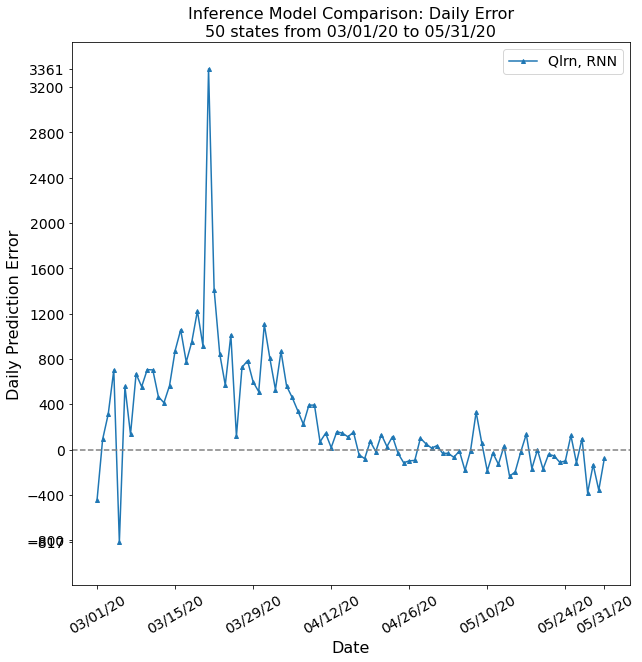

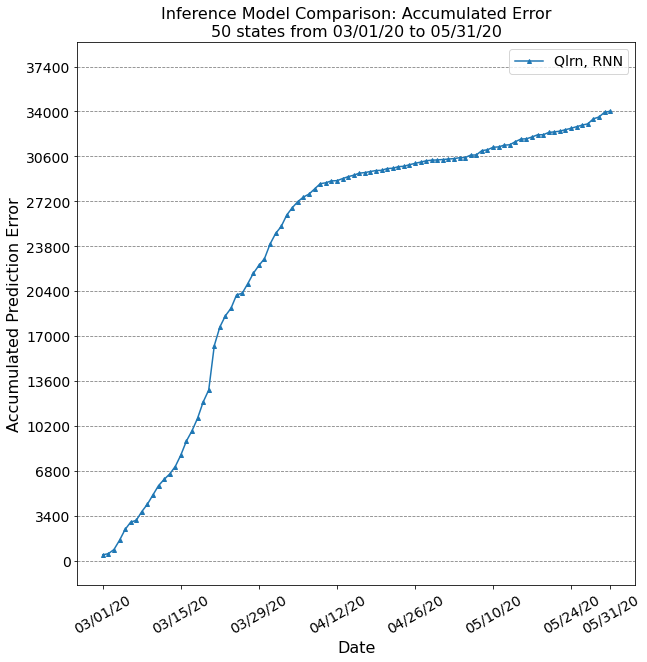

In [28]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
#data_end_date = pd.Timestamp(2020,8,6)
#data_end_date = pd.Timestamp(2020,6,5)
data_end_date = pd.Timestamp(2020,6,30)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 28
ventillator_delay = 3
model_list = [14]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'bedover_upper']
50
Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'bedover_upper']
Running simulation for model:  [3, 4, 19]
total venti count:  22698
2020-03-01 00:00:00
2020-03-02 00:00:00
2020-03-03 00:00:00
2020-03-04 00:00:00
2020-03-05 00:00:00
2020-03-06 00:00:00
2020-03-07 00:00:00
2020-03-08 00:00:00
2020-03-09 00:00:00
2020-03-10 00:00:00
2020-03-11 00:00:00
2020-03-12 00:00:00
2020-03-13 00:00:00
2020-03-14 00:00:00
2020-03-15 00:00:00
2020-03-16 00:00:00
2020-03-17 00:00:00
2020-03-18 00:00:00
2020-03-19 00:00:00
2020-03-20 00:00:00
2020-03-21 00:00:00
2020-03-22 00:00:00
2020-03-23 00:00:00
2020-03-24 00:00:00
2020-03-25 00:00:00
2020-03-26 00:00:00
2020-03-27 00

<ipython-input-34-766adc9cbb2e>:428: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-34-766adc9cbb2e>:437: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


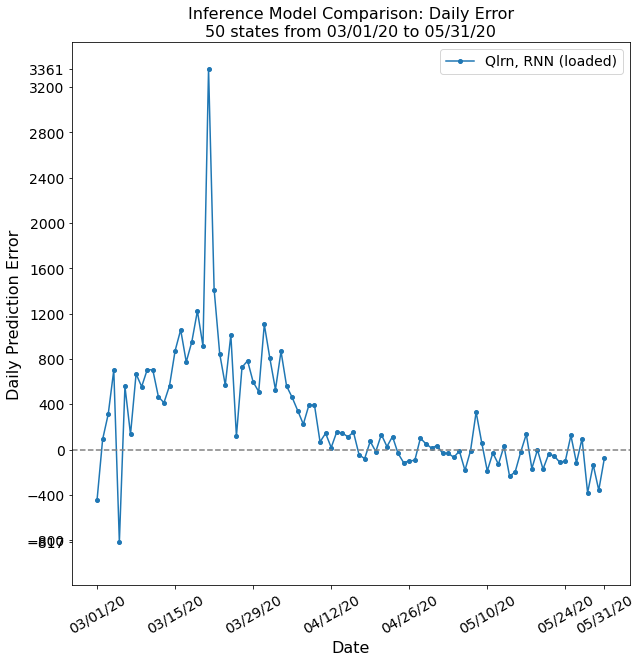

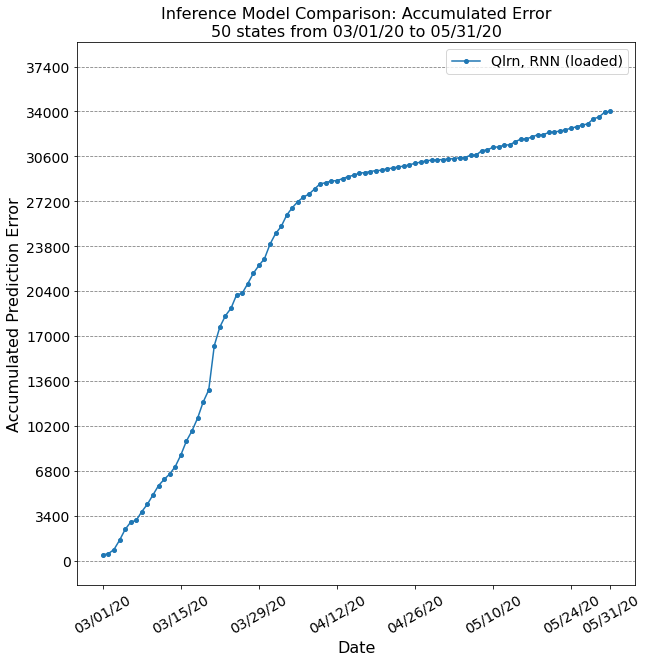

In [35]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
#data_end_date = pd.Timestamp(2020,8,6)
data_end_date = pd.Timestamp(2020,6,30)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 28
ventillator_delay = 3
model_list = [19]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

### 3-month run, prediction window = 14 days

Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'bedover_upper']
50
Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'bedover_upper']
Running simulation for model:  [2, 4, 14]
total venti count:  22698
2020-03-01 00:00:00
LSTM input size 117
LSTM Batch Size: 10
epoch:   1 loss: 28.286288983222
epoch:  26 loss: 5.842213754505
epoch:  51 loss: 1.972031934691
epoch:  76 loss: 0.426904904694
epoch: 101 loss: 0.197546833422
epoch: 126 loss: 0.274476094622
epoch: 149 loss: 0.14719396930070
LSTM Successfully Initialized and Trained!
epoch:   1 loss: 0.151579399822
epoch:  26 loss: 0.178336427450
epoch:  51 loss: 0.098971837825
epoch:  76 loss: 0.074810562776
epoch:  99 loss: 0.07342339112167
LSTM input size 117
LSTM Batch Size: 1
20

<ipython-input-38-974806af3a1c>:428: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-38-974806af3a1c>:437: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


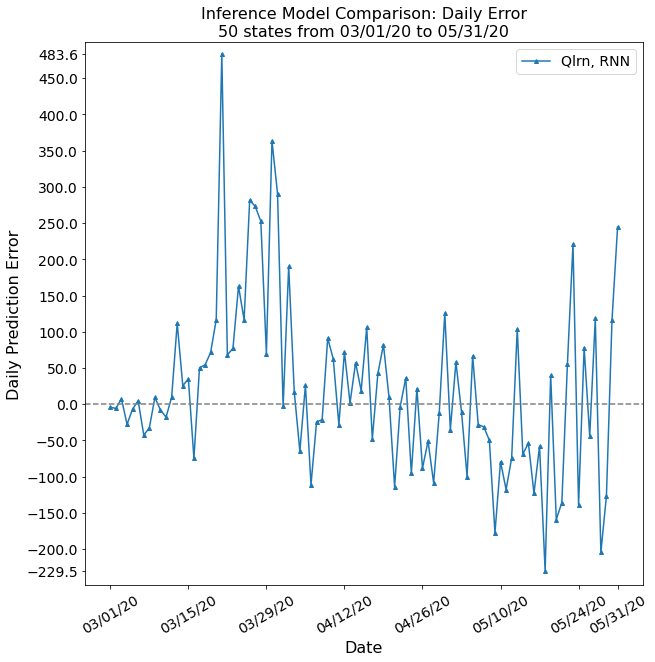

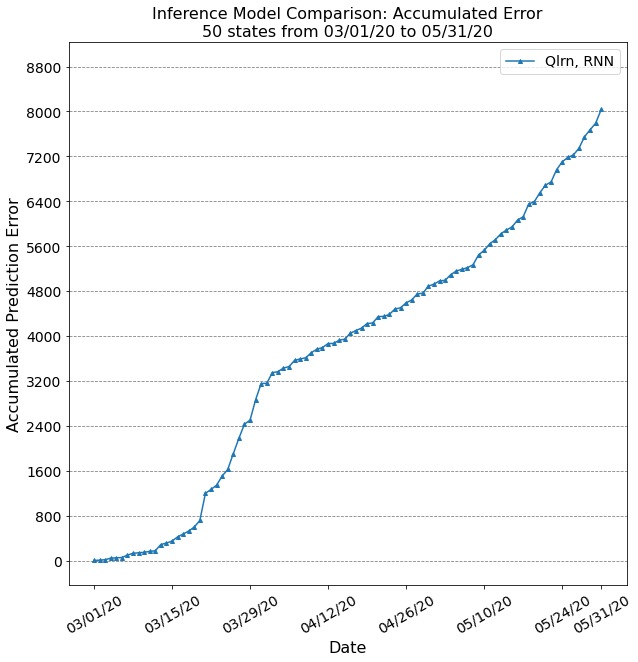

In [39]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
#data_end_date = pd.Timestamp(2020,8,6)
#data_end_date = pd.Timestamp(2020,6,5)
data_end_date = pd.Timestamp(2020,6,16)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 14
ventillator_delay = 3
model_list = [14]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'bedover_upper']
50
Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'bedover_upper']
Running simulation for model:  [3, 4, 19]
total venti count:  22698
2020-03-01 00:00:00
2020-03-02 00:00:00
2020-03-03 00:00:00
2020-03-04 00:00:00
2020-03-05 00:00:00
2020-03-06 00:00:00
2020-03-07 00:00:00
2020-03-08 00:00:00
2020-03-09 00:00:00
2020-03-10 00:00:00
2020-03-11 00:00:00
2020-03-12 00:00:00
2020-03-13 00:00:00
2020-03-14 00:00:00
2020-03-15 00:00:00
2020-03-16 00:00:00
2020-03-17 00:00:00
2020-03-18 00:00:00
2020-03-19 00:00:00
2020-03-20 00:00:00
2020-03-21 00:00:00
2020-03-22 00:00:00
2020-03-23 00:00:00
2020-03-24 00:00:00
2020-03-25 00:00:00
2020-03-26 00:00:00
2020-03-27 00

<ipython-input-38-974806af3a1c>:428: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-38-974806af3a1c>:437: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


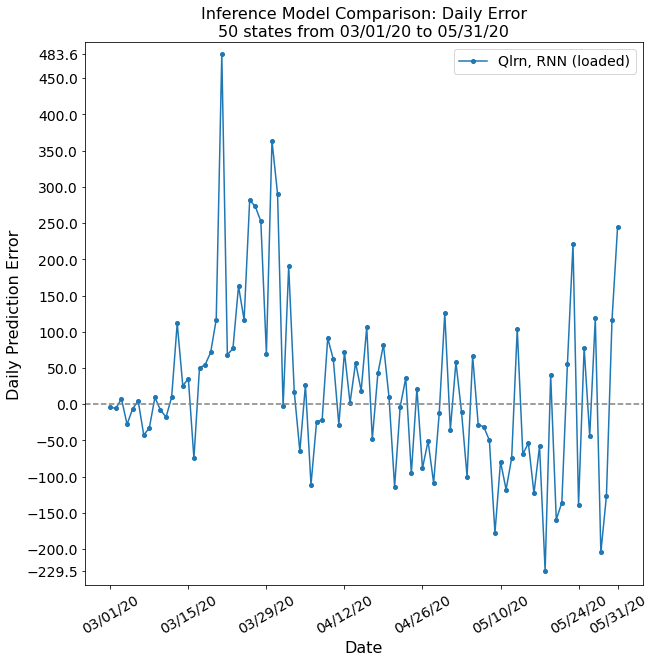

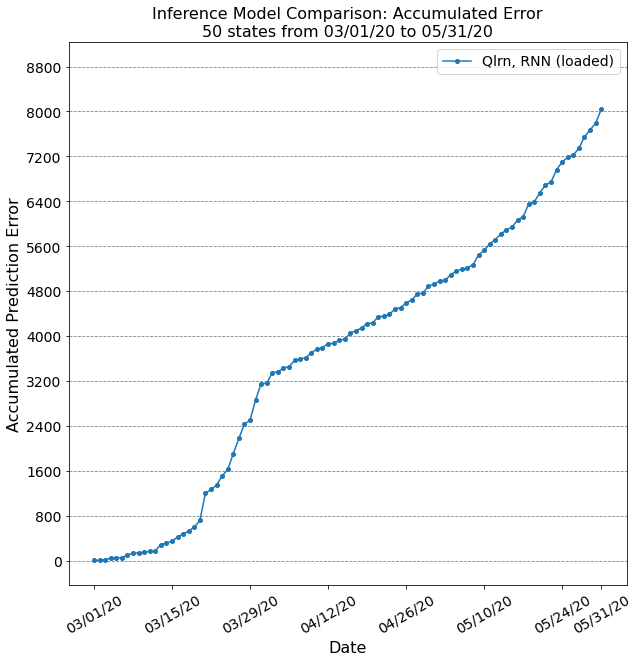

In [40]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
#data_end_date = pd.Timestamp(2020,8,6)
data_end_date = pd.Timestamp(2020,6,16)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 14
ventillator_delay = 3
model_list = [19]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

### 3-month run, prediction window = 3 days

Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'bedover_upper']
50
Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'bedover_upper']
Running simulation for model:  [3, 4, 19]
total venti count:  22698
2020-03-01 00:00:00
2020-03-02 00:00:00
2020-03-03 00:00:00
2020-03-04 00:00:00
2020-03-05 00:00:00
2020-03-06 00:00:00
2020-03-07 00:00:00
2020-03-08 00:00:00
2020-03-09 00:00:00
2020-03-10 00:00:00
2020-03-11 00:00:00
2020-03-12 00:00:00
2020-03-13 00:00:00
2020-03-14 00:00:00
2020-03-15 00:00:00
2020-03-16 00:00:00
2020-03-17 00:00:00
2020-03-18 00:00:00
2020-03-19 00:00:00
2020-03-20 00:00:00
2020-03-21 00:00:00
2020-03-22 00:00:00
2020-03-23 00:00:00
2020-03-24 00:00:00
2020-03-25 00:00:00
2020-03-26 00:00:00
2020-03-27 00

<ipython-input-31-768d2301a782>:428: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-31-768d2301a782>:437: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


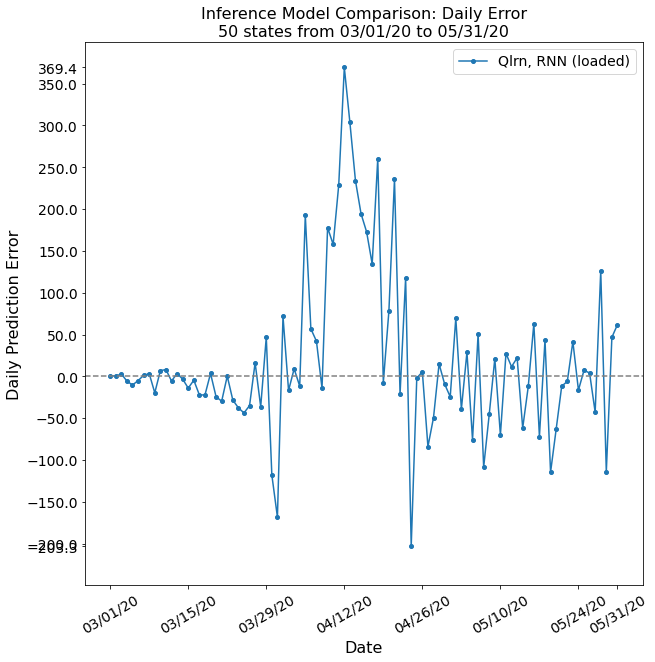

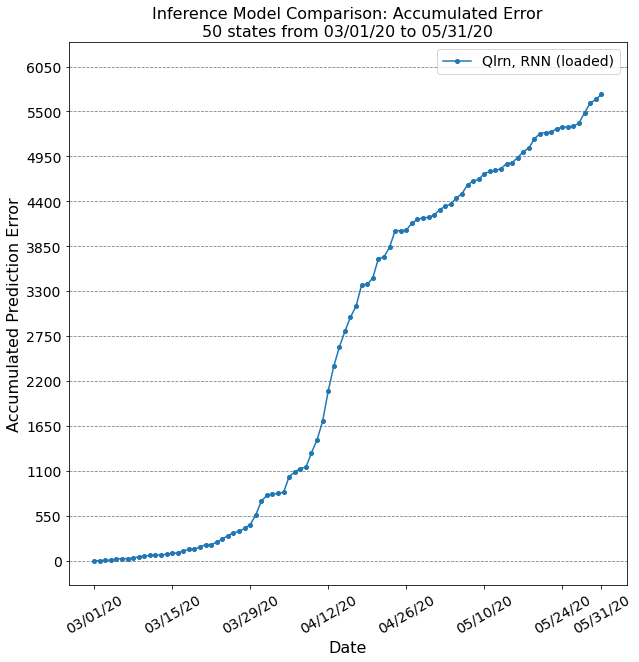

In [33]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
#data_end_date = pd.Timestamp(2020,8,6)
data_end_date = pd.Timestamp(2020,6,5)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [19]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

### 153-day 15 day window runs

Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'Observed_DOA_CDC', 'confirmed_infections', 'bedover_lower', 'bedover_mean', 'mobility_composite', 'mobility_data_type']
50
Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'Observed_DOA_CDC', 'confirmed_infections', 'bedover_lower', 'bedover_mean', 'mobility_composite', 'mobility_data_type']
Running simulation for model:  [2, 4, 14]
total venti count:  22698
LSTM input size 114
LSTM Batch Size: 10
epoch:   1 loss: 1.350410583720
epoch:  26 loss: 0.500591197221
epoch:  51 loss: 0.379802748895
epoch:  76 loss: 0.119313936436
epoch: 101 loss: 0.075877699932
epoch: 126 loss: 0.031768362601
epoch: 149 loss: 0.02117729202827
LSTM Successfully Initialized and Trained!
epoch:   1 loss: 0.021539428336
epoch:  26 loss: 0.002938216331
epoch:  51 loss: 0.002330678

<ipython-input-121-ba5971f865f2>:427: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-121-ba5971f865f2>:436: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


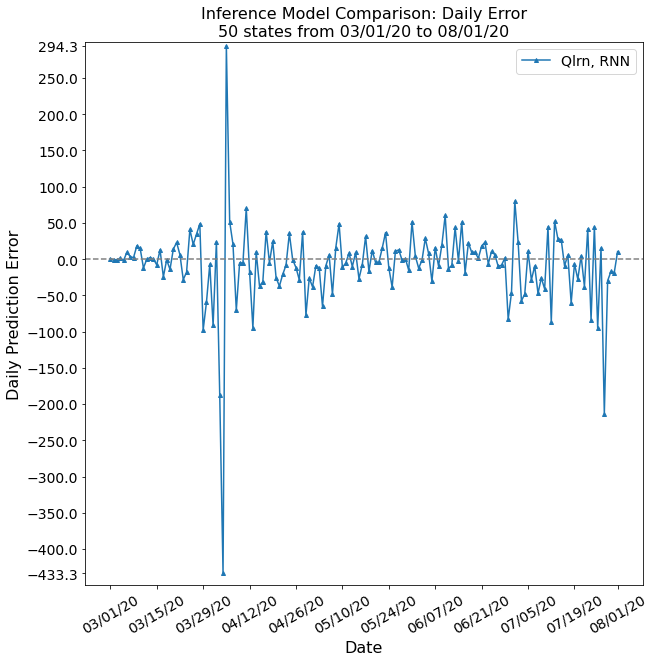

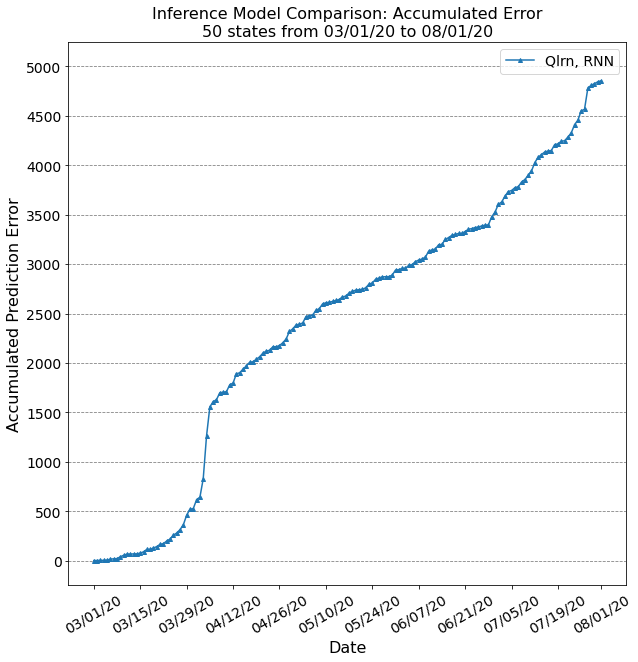

In [122]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [14]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'confirmed_infections', 'Observed_DOA_CDC', 'mobility_composite', 'bedover_upper']
50
Initializing data manager class...
Excluding the following from all sets:  ['mobility_data_type', 'icuover_upper', 'icuover_lower', 'icuover_mean', 'bedover_lower', 'bedover_mean', 'confirmed_infections', 'Observed_DOA_CDC', 'mobility_composite', 'bedover_upper']
Running simulation for model:  [3, 4, 19]
total venti count:  22698
Model  19  total policy loss:  35168.74595684885
RMSE array length:  154
Model:  19  RMSE:  58.530966851707674
Model:  19  total prediction loss:  4855.255901299386
Model:  19  prediction loss mean:  -7.587808257105699
Model:  19  prediction loss stdev:  58.226405300376136


<ipython-input-16-34c98fe9797a>:428: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-16-34c98fe9797a>:437: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


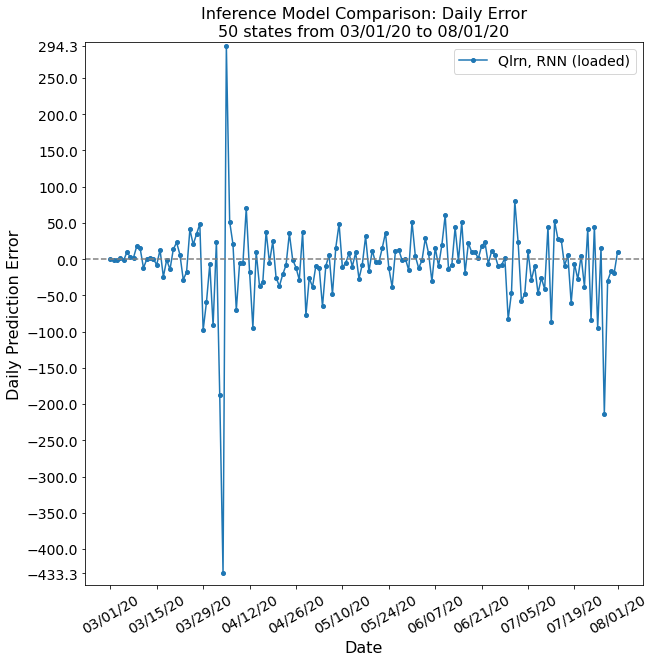

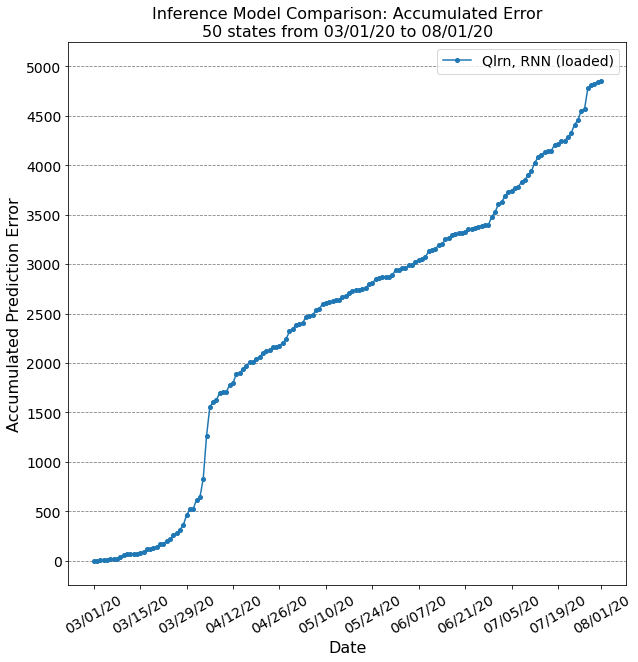

In [17]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [19]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

### 90-day infinite window runs

Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
50
Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
Running simulation for model:  [2, 4, 14]
total venti count:  22698
LSTM input size 117
LSTM Batch Size: 10
epoch:   1 loss: 1.356256856527
epoch:  26 loss: 0.418562024851
epoch:  51 loss: 0.204738756919
epoch:  76 loss: 0.099121017460
epoch: 101 loss: 0.030485145543
epoch: 126 loss: 0.016697641295
epoch: 149 loss: 0.02057236195483
LSTM Successfully Initialized and Trained!
epoch:   1 loss: 0.013746839278
epoch:  26 loss: 0.021103943493
epoch:  51 loss: 0.011242624609
epoch:  76 loss: 0.008521158313
epoch:  99 loss: 0.01783668143646
LSTM input size 117
LSTM Batch Size: 1
epoch:   1 loss: 0.0282

<ipython-input-29-35fdf117e57a>:413: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-29-35fdf117e57a>:422: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


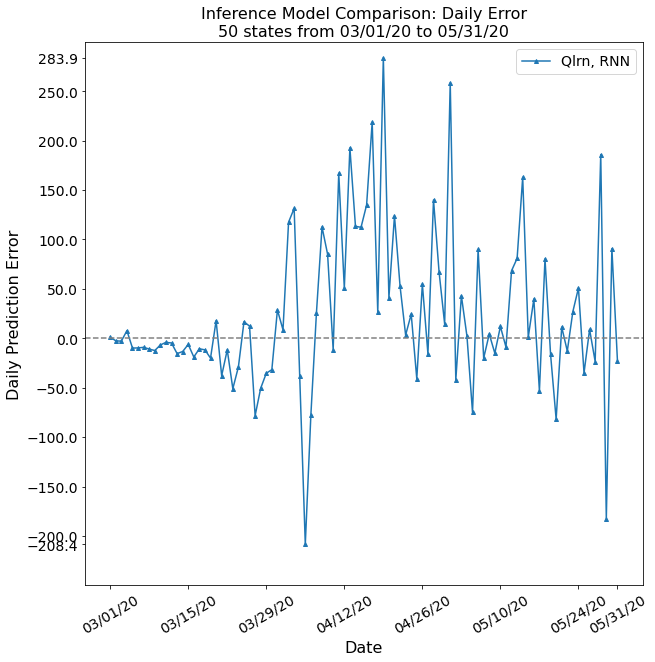

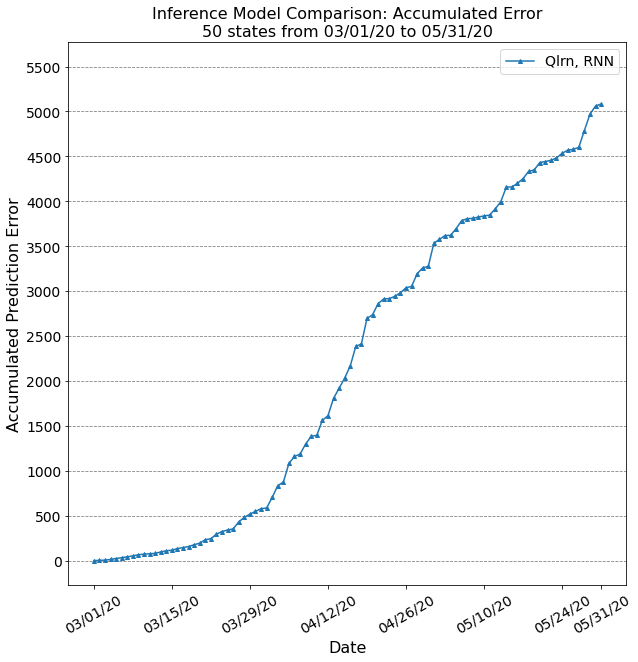

In [31]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,6,5)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [14]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
50
Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
Running simulation for model:  [3, 4, 19]
total venti count:  22698
Model  19  total policy loss:  26869.120451436884
Model:  19  RMSE:  82.25342510553507
Model:  19  total prediction loss:  3275.0264541245474
Model:  19  prediction loss mean:  24.626673144509333
Model:  19  prediction loss stdev:  79.13157056415048


<ipython-input-106-1190402878e1>:427: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-106-1190402878e1>:436: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


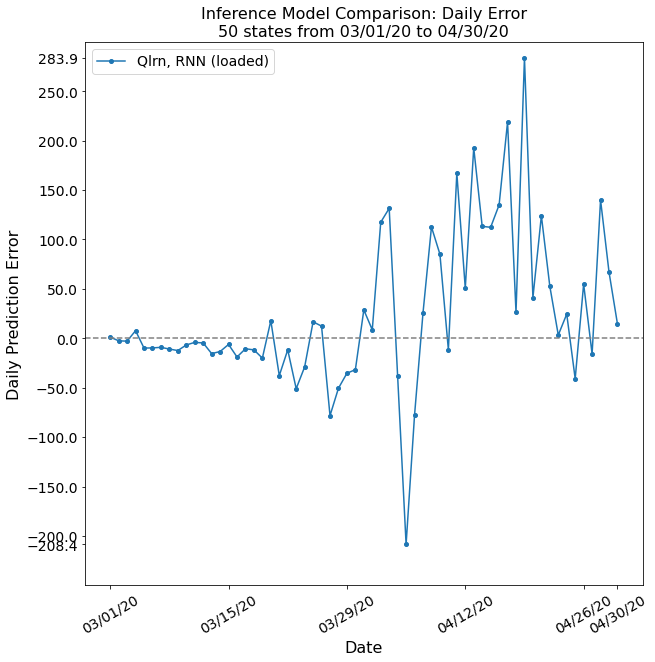

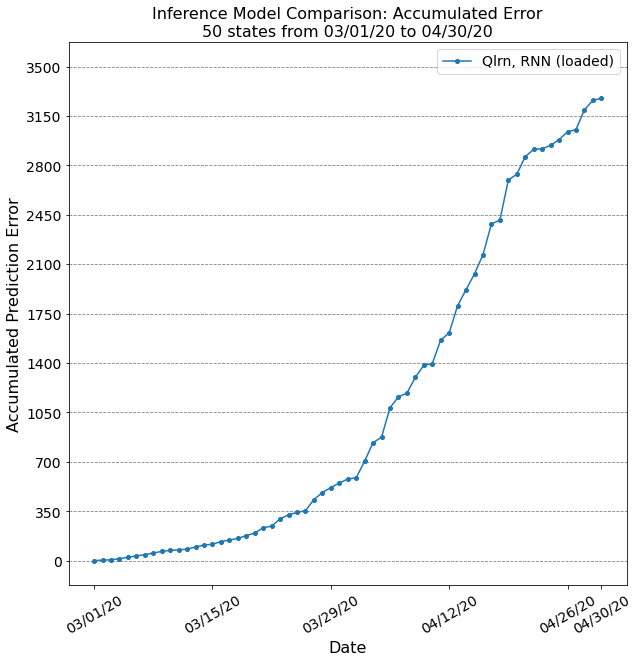

In [107]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,5,5)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [19]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

### 60-day run, 45 day window

Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
50
Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
Running simulation for model:  [2, 4, 14]
total venti count:  22698
2020-03-01 00:00:00
LSTM input size 117
LSTM Batch Size: 10
epoch:   1 loss: 1.355285205988
epoch:  26 loss: 0.530688911789
epoch:  51 loss: 0.245604362393
epoch:  76 loss: 0.043211356597
epoch: 101 loss: 0.024087057284
epoch: 126 loss: 0.027978673734
epoch: 149 loss: 0.01152250363895
LSTM Successfully Initialized and Trained!
epoch:   1 loss: 0.043325335756
epoch:  26 loss: 0.014982931827
epoch:  51 loss: 0.024650232047
epoch:  76 loss: 0.043380382206
epoch:  99 loss: 0.02956622686530
LSTM input size 117
LSTM Batch Size: 1
202

<ipython-input-65-04bb044b0761>:413: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-65-04bb044b0761>:422: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


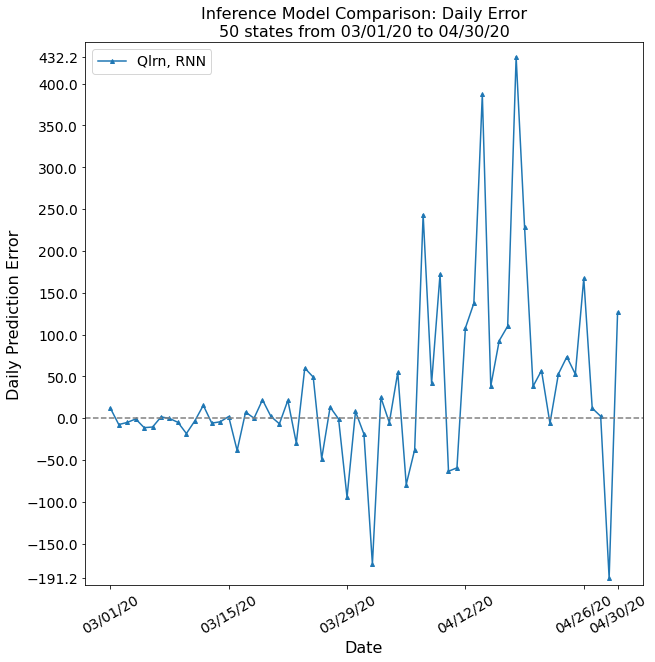

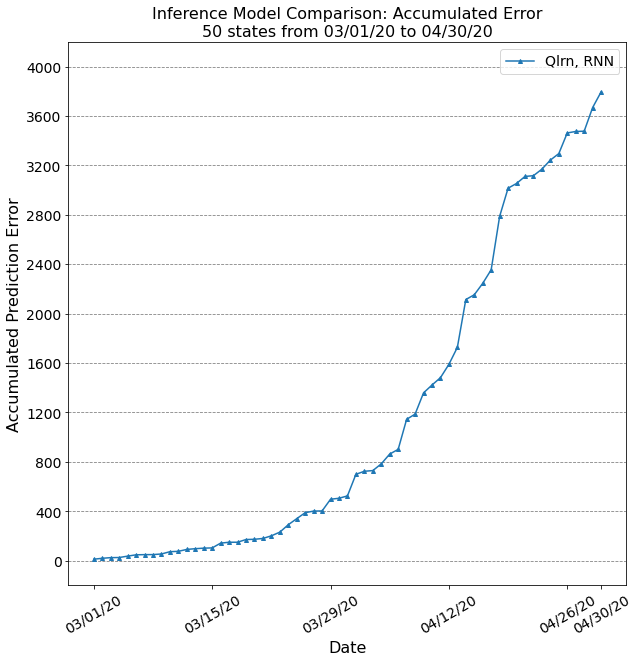

In [66]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,5,5)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [14]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
50
Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
Running simulation for model:  [3, 4, 19]
total venti count:  22698
Model  19  total policy loss:  26118.100166386575
Model:  19  RMSE:  107.14609464750909
Model:  19  total prediction loss:  3794.3245565742245
Model:  19  prediction loss mean:  31.764211664069357
Model:  19  prediction loss stdev:  103.17869190470513


<ipython-input-112-88ef7e3c3513>:427: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-112-88ef7e3c3513>:436: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


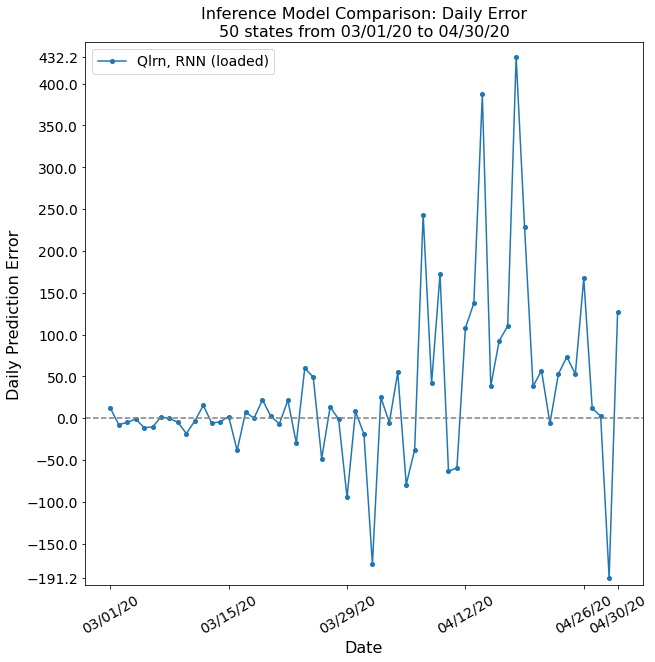

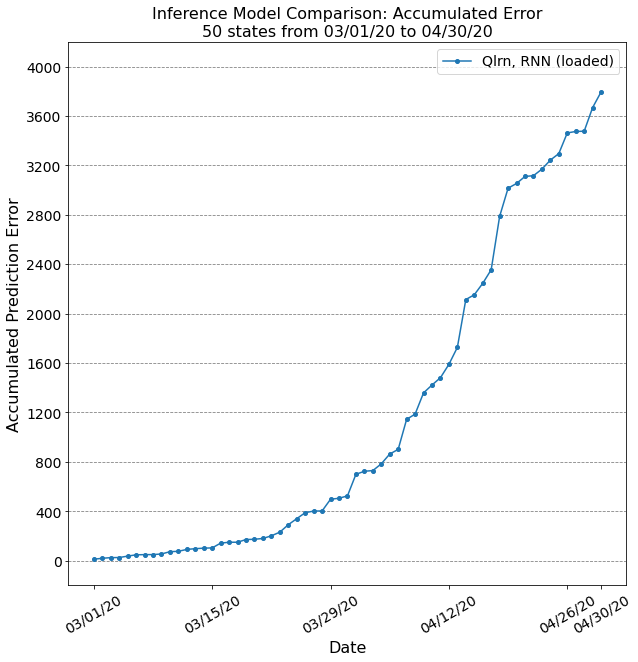

In [113]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,5,5)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [19]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

### 60-day run, 30 day window

Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
50
Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
Running simulation for model:  [2, 4, 14]
total venti count:  22698
2020-03-01 00:00:00
LSTM input size 117
LSTM Batch Size: 10
epoch:   1 loss: 1.354057224682
epoch:  26 loss: 0.392796102912
epoch:  51 loss: 0.601611680620
epoch:  76 loss: 0.167539721712
epoch: 101 loss: 0.208117572644
epoch: 126 loss: 0.016408434641
epoch: 149 loss: 0.02798150668924
LSTM Successfully Initialized and Trained!
epoch:   1 loss: 0.026265351977
epoch:  26 loss: 0.014277107654
epoch:  51 loss: 0.010836327546
epoch:  76 loss: 0.011077799955
epoch:  99 loss: 0.00746400969663
LSTM input size 117
LSTM Batch Size: 1
202

<ipython-input-61-a327a8fc6503>:413: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-61-a327a8fc6503>:422: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


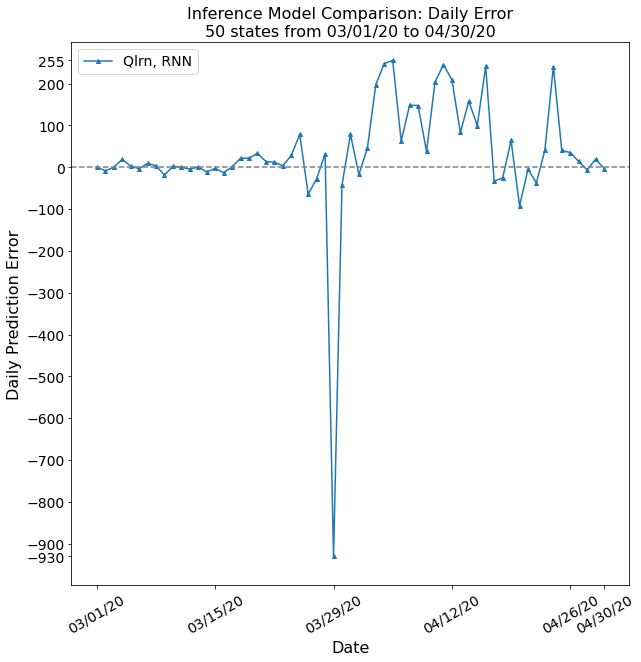

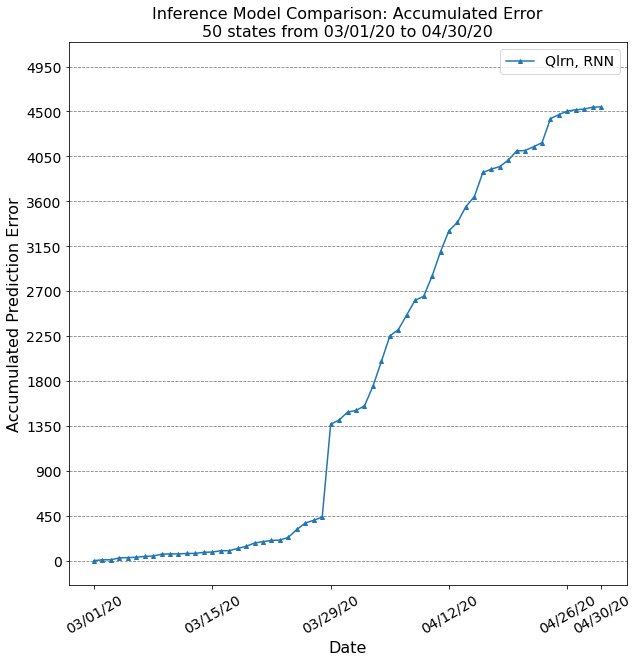

In [62]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,5,5)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [14]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
50
Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
Running simulation for model:  [3, 4, 19]
total venti count:  22698
Model  19  total policy loss:  28719.947045596145
Model:  19  RMSE:  153.21583224496004
Model:  19  total prediction loss:  4546.121689754479
Model:  19  prediction loss mean:  30.39066588687511
Model:  19  prediction loss stdev:  151.41782255982682


<ipython-input-115-de79893e72a3>:427: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-115-de79893e72a3>:436: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


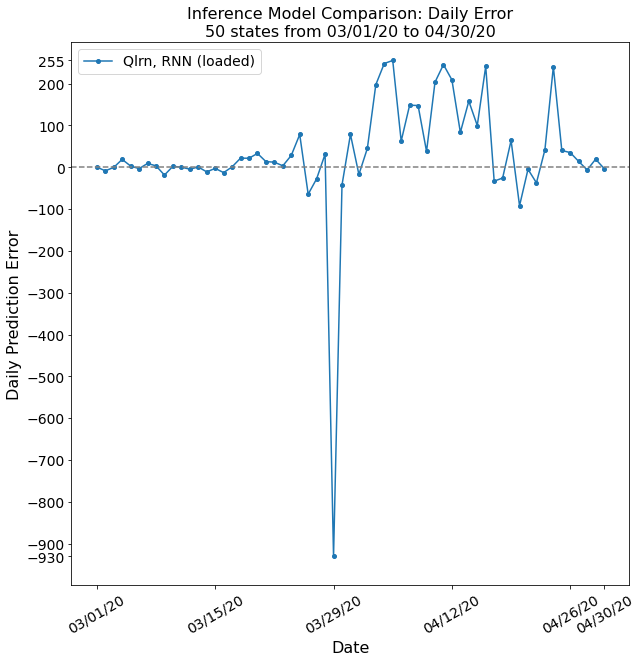

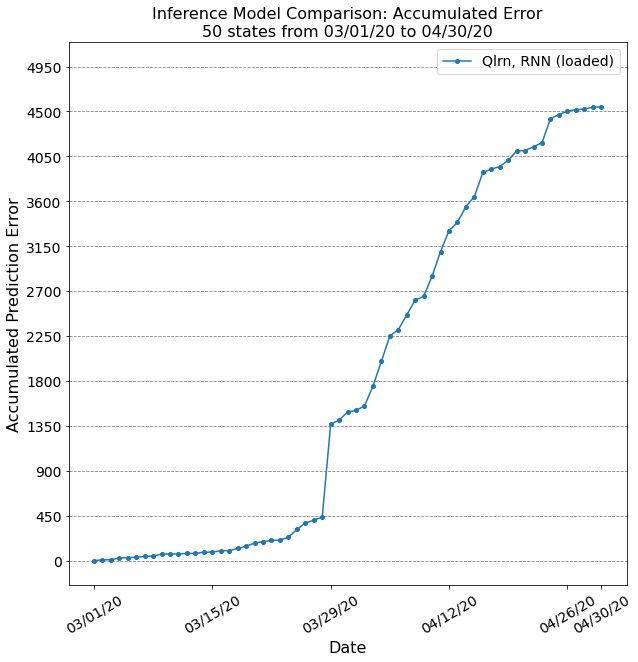

In [116]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,5,5)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [19]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

### 60-day run, 15 day window

Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
50
Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
Running simulation for model:  [2, 4, 14]
total venti count:  22698
2020-03-01 00:00:00
LSTM input size 117
LSTM Batch Size: 10
epoch:   1 loss: 1.352619429148
epoch:  26 loss: 0.317955382820
epoch:  51 loss: 0.077160563288
epoch:  76 loss: 0.041321935163
epoch: 101 loss: 0.038891419909
epoch: 126 loss: 0.014951963567
epoch: 149 loss: 0.04745350416618
LSTM Successfully Initialized and Trained!
epoch:   1 loss: 0.029822009736
epoch:  26 loss: 0.010542831292
epoch:  51 loss: 0.001661376109
epoch:  76 loss: 0.001060452549
epoch:  99 loss: 0.01062043032314
LSTM input size 117
LSTM Batch Size: 1
202

<ipython-input-63-9e888fb92f3d>:413: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-63-9e888fb92f3d>:422: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


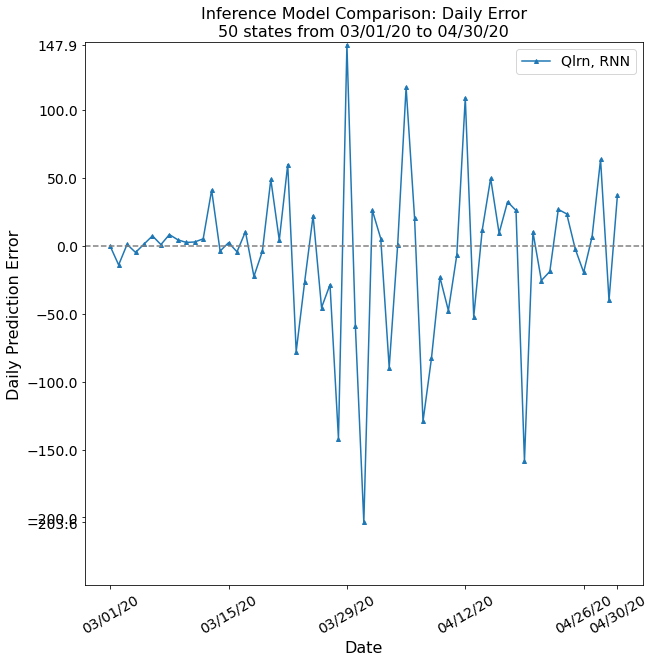

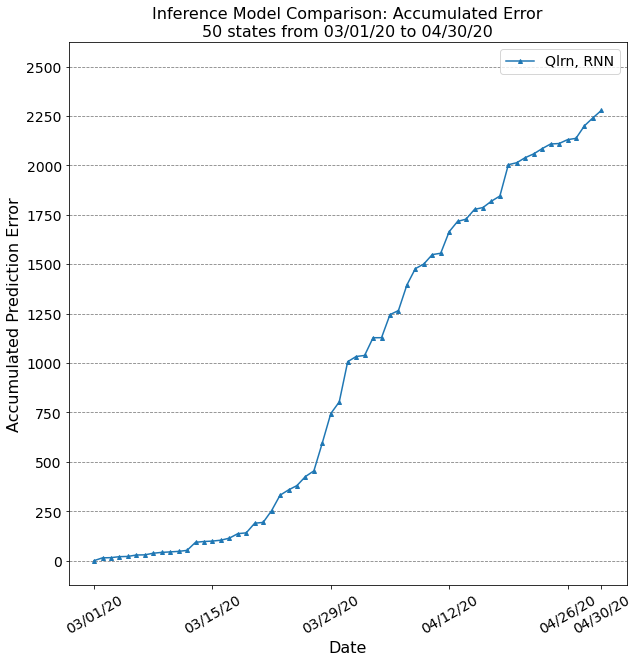

In [64]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,5,5)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [14]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
50
Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'bedover_lower', 'bedover_mean', 'mobility_data_type']
Running simulation for model:  [3, 4, 19]
total venti count:  22698
Model  19  total policy loss:  28019.77029560574
Model:  19  RMSE:  58.53948784130296
Model:  19  total prediction loss:  2277.853742827874
Model:  19  prediction loss mean:  -6.437615016936285
Model:  19  prediction loss stdev:  58.6673040296669


<ipython-input-119-057f9b431454>:427: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-119-057f9b431454>:436: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


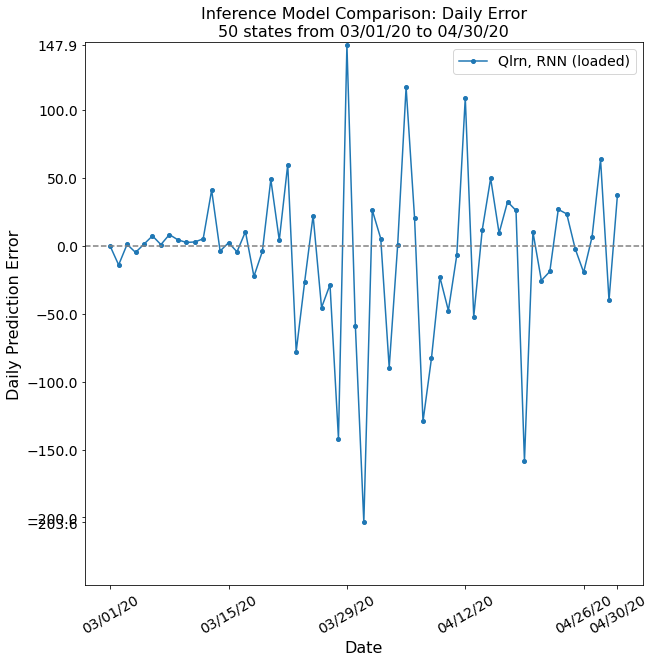

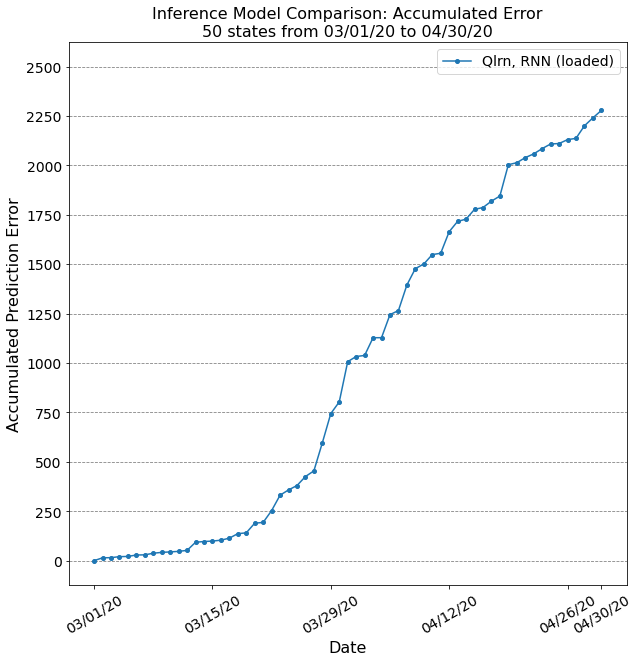

In [120]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
#states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,5,5)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [19]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'District of Columbia']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()
# prepare primary dataloader
states = states_list.tolist()
print(len(states))
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

### Demo with federal government (initial stock)

Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'Observed_DOA_CDC', 'confirmed_infections', 'bedover_lower', 'bedover_mean', 'mobility_composite', 'mobility_data_type']
Initializing data manager class...
Excluding the following from all sets:  ['bedover_upper', 'icuover_lower', 'icuover_mean', 'icuover_upper', 'Observed_DOA_CDC', 'confirmed_infections', 'bedover_lower', 'bedover_mean', 'mobility_composite', 'mobility_data_type']
Running simulation for model:  [3, 4, 19]
total venti count:  4972
Running simulation for model:  [0, -1, -1]
total venti count:  4972
Model  19  total policy loss:  95058.67524482596
Model  -1  total policy loss:  246920.78270644657
Model:  19  RMSE:  4161.169991745852
Model:  -1  RMSE:  4274.328944739255
Model:  19  total prediction loss:  2909.283888267437
Model:  19  prediction loss mean:  4.036520616478008
Model:  19  prediction loss stdev:  32.842735217420085
Mo

<ipython-input-98-bd3b096d5c73>:383: RuntimeWarning: Second argument '-1' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index.strftime('%m/%d/%y'), model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-98-bd3b096d5c73>:424: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-98-bd3b096d5c73>:383: RuntimeWarning: Second argument '-1' is ambiguous: could be a format string but is in 'dat

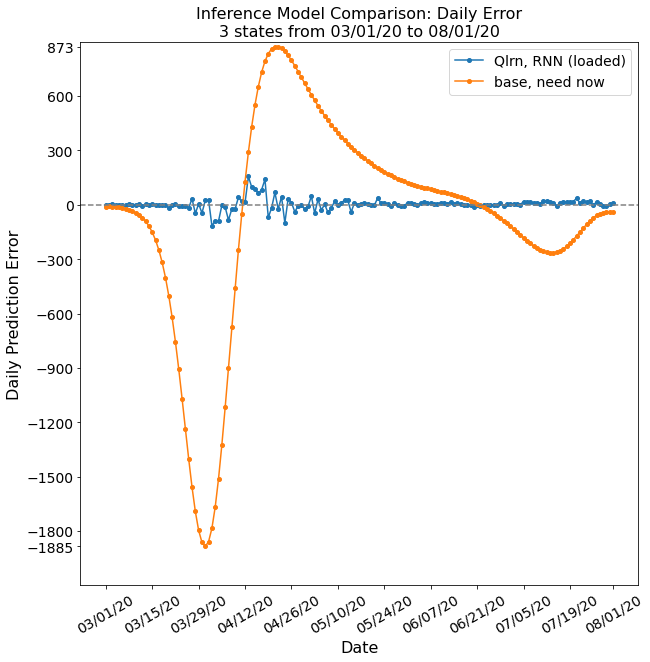

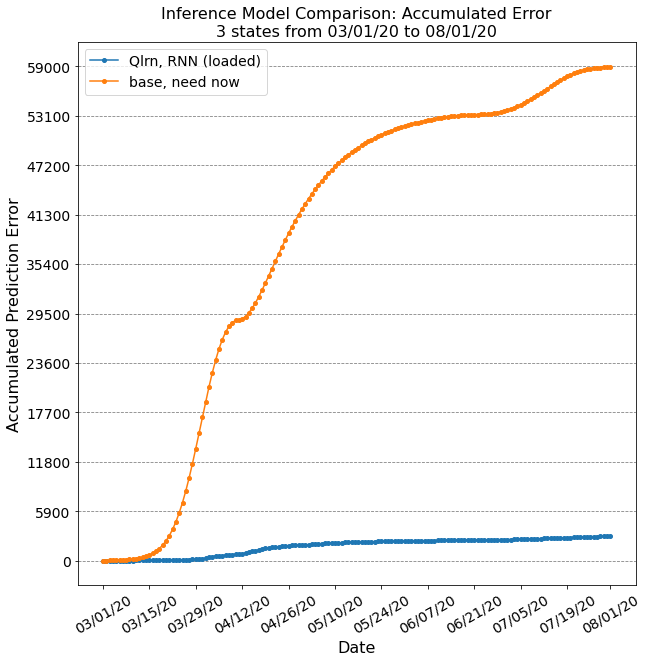

In [99]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
states = ['California', 'New York', 'Texas']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 19]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

# prepare primary dataloader
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=True, proxy_reward=1, collect_modeling_data = True, model_select = None)

                              California                     New York  \
2020-03-01  (1994.0, 1.4948940362409742)  (718.0, 26.369002091977578)   
2020-03-02   (1994.0, 1.716885603510056)  (718.0, 29.568800415198154)   
2020-03-03  (1994.0, 0.5331622707249272)   (718.0, 39.64061773856994)   
2020-03-04  (1994.0, 2.2307159605418456)   (718.0, 36.57689563471901)   
2020-03-05  (1994.0, 2.6141442434186914)   (718.0, 43.07892558649668)   
...                                  ...                          ...   
2020-07-28  (1727.0, 1249.6200111695707)   (395.0, 140.7881483065257)   
2020-07-29  (1727.0, 1254.7616081305175)   (395.0, 133.4510604852386)   
2020-07-30  (1727.0, 1265.5708133467074)  (395.0, 132.92439258654233)   
2020-07-31  (1727.0, 1279.8904488780258)   (395.0, 137.3723706412705)   
2020-08-01  (1727.0, 1287.2234590678695)  (356.0, 136.63520210065371)   

                                    Texas      FEDERAL  
2020-03-01  (2260.0, 0.16133661697394774)    (1000, 0)  
2020-03-0

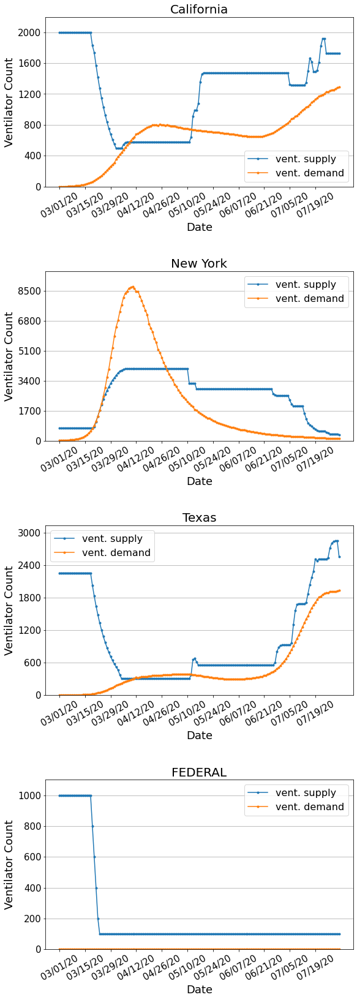

In [100]:
print(model_comparison_simulator.track_states[str(19)])
model_comparison_simulator.display_state_histories(model_num = 19, plot_cols = 1, same_range = False)

### Baseline Run

Initializing data manager class...
Excluding the following from all sets:  ['icuover_mean', 'Observed_DOA_CDC', 'mobility_data_type', 'bedover_lower', 'icuover_lower', 'bedover_mean', 'confirmed_infections', 'mobility_composite', 'bedover_upper', 'icuover_upper']
Initializing data manager class...
Excluding the following from all sets:  ['icuover_mean', 'Observed_DOA_CDC', 'mobility_data_type', 'bedover_lower', 'icuover_lower', 'bedover_mean', 'confirmed_infections', 'mobility_composite', 'bedover_upper', 'icuover_upper']
Running simulation for model:  [3, 4, 19]
total venti count:  6668
Running simulation for model:  [0, -1, -1]
total venti count:  6668
Model  19  total policy loss:  58241.84631920006
Model  -1  total policy loss:  246920.78270644657
Model:  19  RMSE:  4599.406909150433
Model:  -1  RMSE:  4739.310603388216
Model:  19  total prediction loss:  3032.434767721544
Model:  19  prediction loss mean:  4.10173972047633
Model:  19  prediction loss stdev:  33.205564941049055
Mod

<ipython-input-12-601b14701c8f>:361: RuntimeWarning: Second argument '-1' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index.strftime('%m/%d/%y'), model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-12-601b14701c8f>:402: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-12-601b14701c8f>:361: RuntimeWarning: Second argument '-1' is ambiguous: could be a format string but is in 'dat

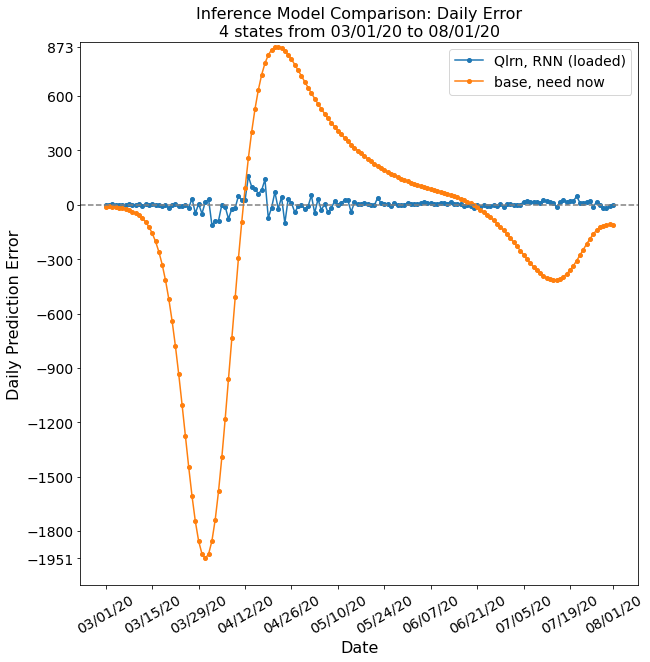

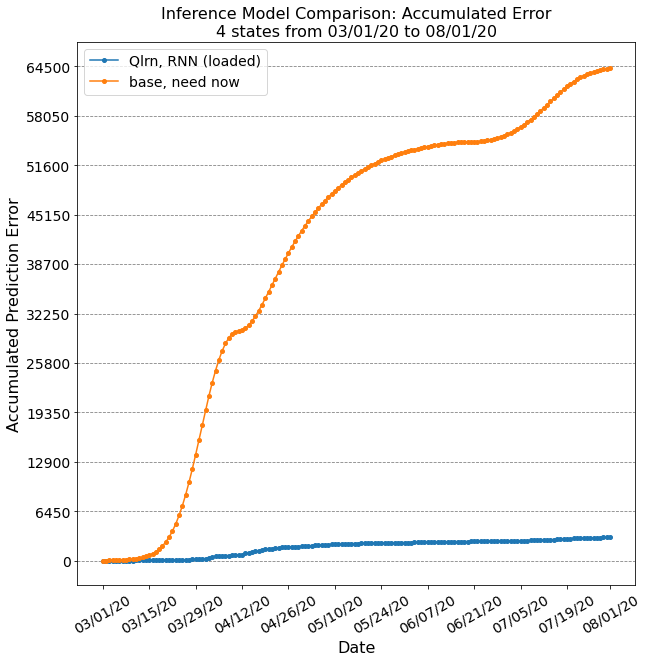

In [13]:
path = './data/'
ihme_path = path + '2020_08_06/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
states = ['California', 'New York', 'Texas', 'Florida']
#states = ['Georgia', 'Nevada', 'Texas', 'Mississippi', 'Wyoming']
#states = ['Iowa', 'Illinois', 'Vermont', 'Montana', 'Virginia']
states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 19]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

# prepare primary dataloader
primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=False, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

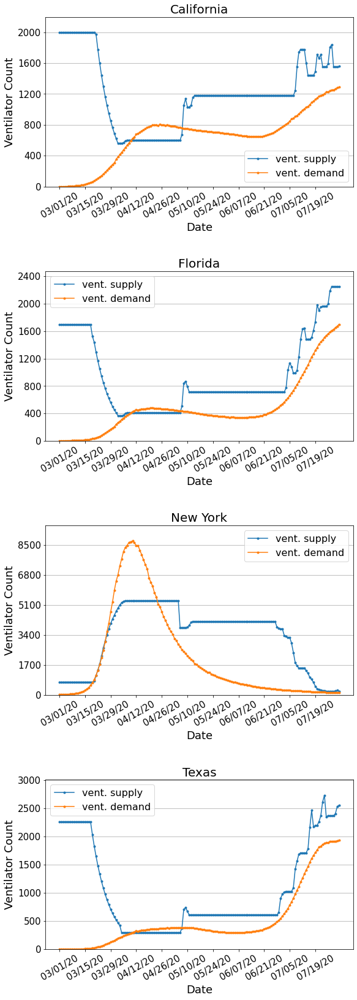

In [14]:
model_comparison_simulator.display_state_histories(model_num = 19, plot_cols = 1, same_range = False)

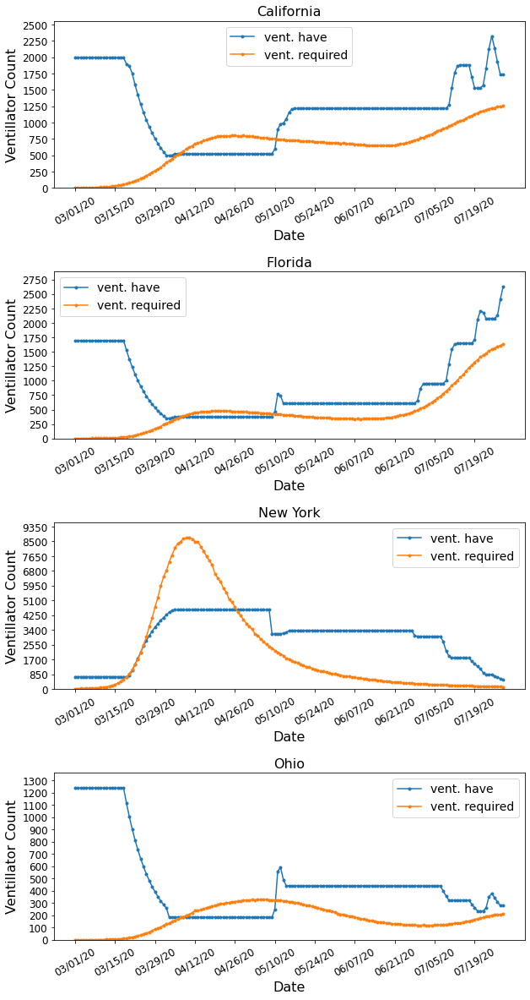

In [52]:
model_comparison_simulator.display_state_histories(model_num = 19, plot_cols = 1, same_range = False)

### 50 state RNN data colleciton run

50
Initializing data manager class...
Excluding the following from all sets:  ['bedover_lower', 'confirmed_infections', 'bedover_mean', 'icuover_upper', 'mobility_data_type', 'Observed_DOA_CDC', 'icuover_lower', 'icuover_mean', 'bedover_upper', 'mobility_composite']
Initializing data manager class...
Excluding the following from all sets:  ['bedover_lower', 'confirmed_infections', 'bedover_mean', 'icuover_upper', 'mobility_data_type', 'Observed_DOA_CDC', 'icuover_lower', 'icuover_mean', 'bedover_upper', 'mobility_composite']
Running simulation for model:  [2, 4, 14]
total venti count:  22698
2020-03-01 00:00:00
LSTM input size 114
LSTM Batch Size: 10
epoch:   1 loss: 1.332015319986
epoch:  26 loss: 0.437657628361
epoch:  51 loss: 0.243859544839
epoch:  76 loss: 0.080143025153
epoch: 101 loss: 0.072234050841
epoch: 126 loss: 0.042133403158
epoch: 149 loss: 0.02414481107042
LSTM Successfully Initialized and Trained!
epoch:   1 loss: 0.016960552728
epoch:  26 loss: 0.166847985426
epoch:  

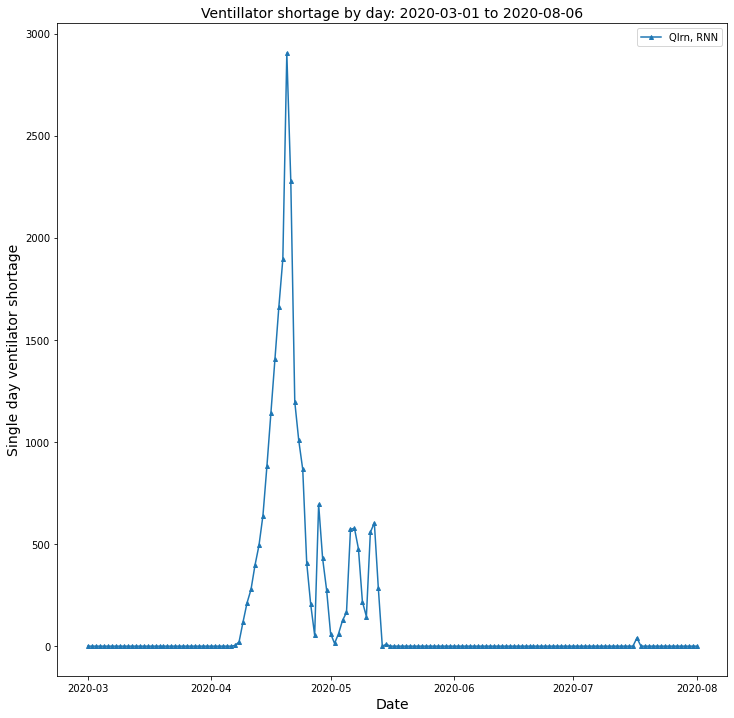

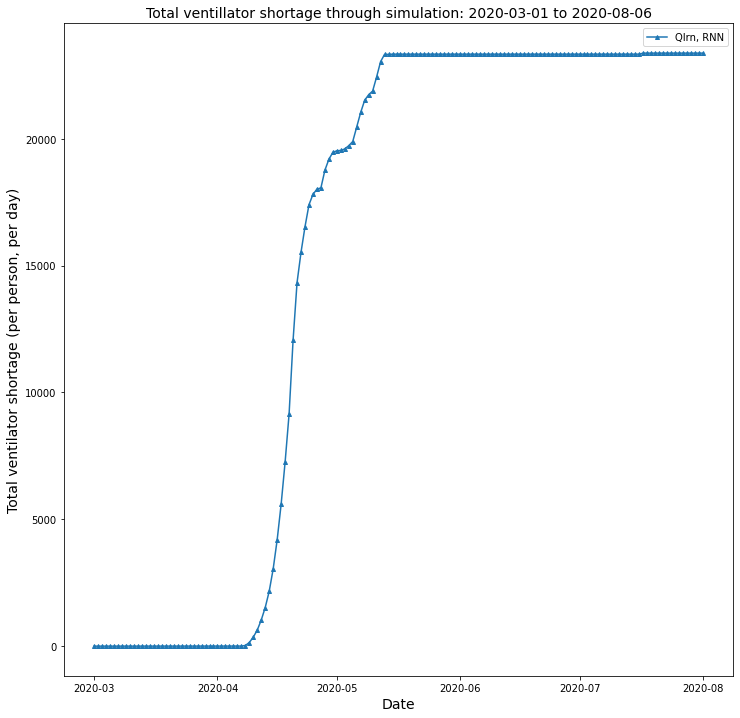

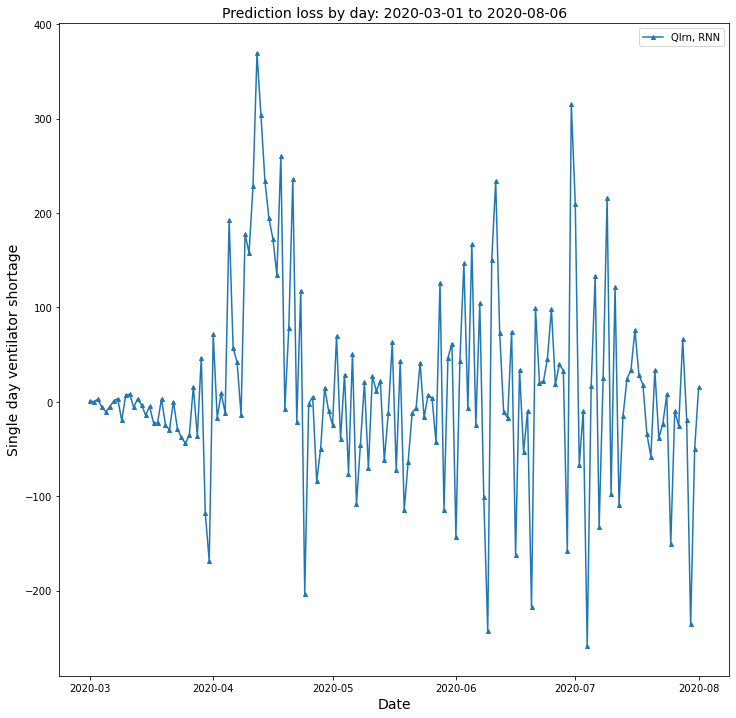

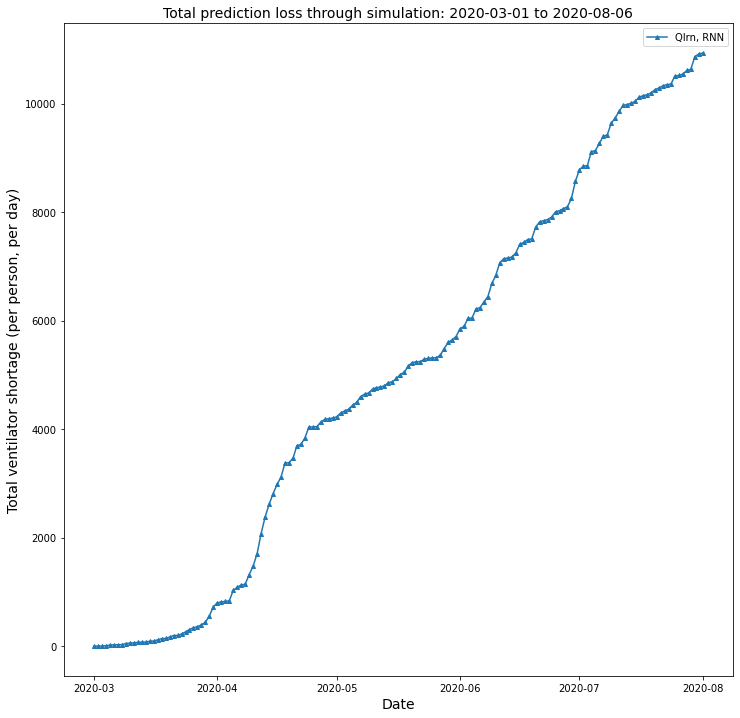

In [68]:
path = './data/'
ihme_path = path + '2020_08_06/'

states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [14]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
print(len(states_list))
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

states_aslist = states_list.tolist()

# prepare primary dataloader
primary_dataLoader = DataManager(data_end_date, states_aslist, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states_aslist, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=True, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

### Figure C.1 - inference engine comparisons

Number of states:  50
Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'mobility_composite', 'mobility_data_type', 'icuover_mean', 'icuover_lower', 'icuover_upper', 'bedover_mean', 'bedover_upper', 'bedover_lower', 'confirmed_infections']
Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'mobility_composite', 'mobility_data_type', 'icuover_mean', 'icuover_lower', 'icuover_upper', 'bedover_mean', 'bedover_upper', 'bedover_lower', 'confirmed_infections']
Running simulation for model:  [0, 4, 100]
total venti count:  22698
Running simulation for model:  [1, 4, 101]
total venti count:  22698


/home/bryanbed/Environments/238_Project/lib/python3.8/site-packages/statsmodels/tsa/holtwinters.py:743: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warn("Optimization failed to converge. Check mle_retvals.",
/home/bryanbed/Environments/238_Project/lib/python3.8/site-packages/statsmodels/tsa/holtwinters.py:743: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warn("Optimization failed to converge. Check mle_retvals.",
/home/bryanbed/Environments/238_Project/lib/python3.8/site-packages/statsmodels/tsa/holtwinters.py:743: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warn("Optimization failed to converge. Check mle_retvals.",
/home/bryanbed/Environments/238_Project/lib/python3.8/site-packages/statsmodels/tsa/holtwinters.py:743: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warn("Optimization failed to converge. Check mle_retvals.",
/home/bryanbed/Environments/238_Project/lib/pyth

Running simulation for model:  [3, 4, 102]
total venti count:  22698
Model  100  total policy loss:  29543.404472635746
Model  101  total policy loss:  32974.9482645157
Model  102  total policy loss:  25049.724977946174
Model:  100  RMSE:  11652.652085734793
Model:  101  RMSE:  11219.084435236166
Model:  102  RMSE:  11419.112113565907
Model:  100  total prediction loss:  130145.18836475213
Model:  100  prediction loss mean:  -195.3657830452927
Model:  100  prediction loss stdev:  1173.7631460177308
Model:  101  total prediction loss:  59036.77022549335
Model:  101  prediction loss mean:  78.21274126633665
Model:  101  prediction loss stdev:  570.8791530193437
Model:  102  total prediction loss:  10932.996383462047
Model:  102  prediction loss mean:  13.730116010977477
Model:  102  prediction loss stdev:  104.18057214244708


<ipython-input-56-38224ec5796f>:400: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()
<ipython-input-56-38224ec5796f>:409: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


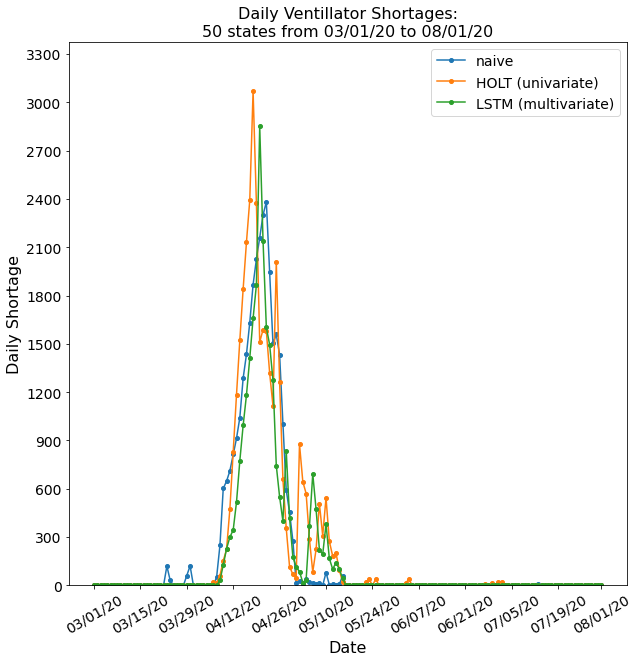

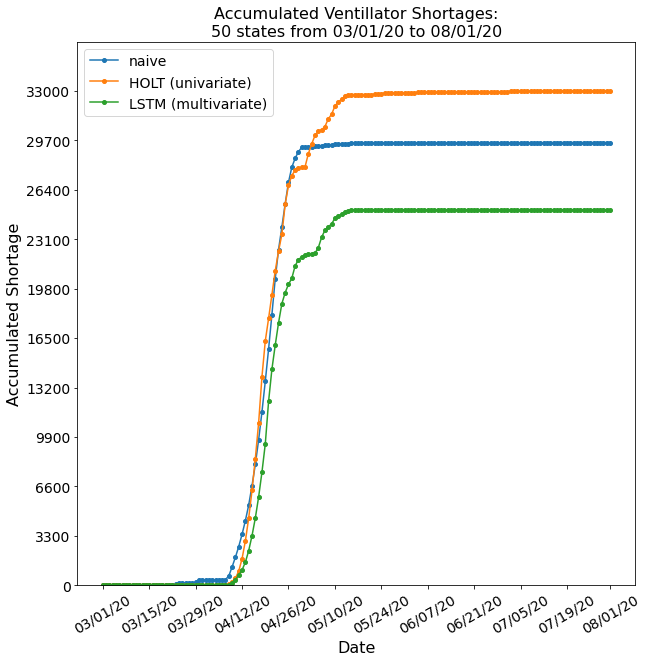

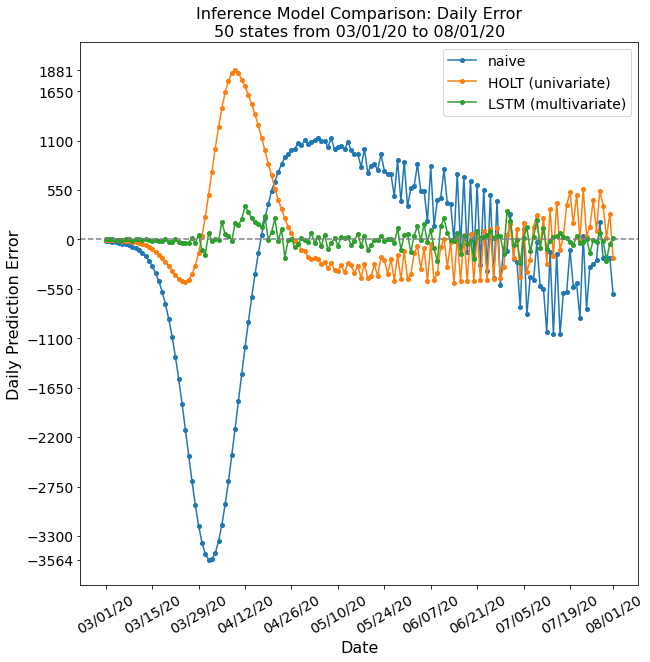

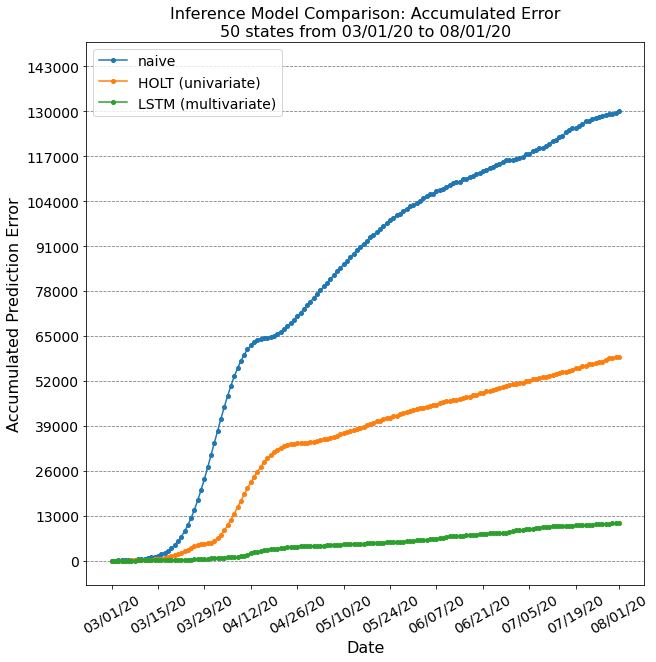

In [57]:
path = './data/'
ihme_path = path + '2020_08_06/'

#states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [100,101,102]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
print("Number of states: ", len(states_list))
states_aslist = states_list.tolist()
LSTM_dataloader = DataManager(data_end_date, states_aslist, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

states_aslist = states_list.tolist()

# prepare primary dataloader
primary_dataLoader = DataManager(data_end_date, states_aslist, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states_aslist, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=True, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

### Appendix D: final summary runs

In [53]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 5
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 15] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states5_iter1000_LSTM_max.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'mobility_composite', 'mobility_data_type', 'icuover_mean', 'icuover_lower', 'icuover_upper', 'bedover_mean', 'bedover_upper', 'bedover_lower', 'confirmed_infections']
0
states in run: ['Indiana', 'Maine', 'Oregon', 'New Hampshire', 'Florida']
Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'mobility_composite', 'mobility_data_type', 'icuover_mean', 'icuover_lower', 'icuover_upper', 'bedover_mean', 'bedover_upper', 'bedover_lower', 'confirmed_infections']
Running simulation for model:  [0, -1, -1]
total venti count:  2760
Running simulation for model:  [3, 0, 15]
total venti count:  2760
Model  -1  total policy loss:  0.0
Model  15  total policy loss:  0.0
states in run: ['Wyoming', 'Missouri', 'North Dakota', 'Mississippi', 'Rhode Island']
Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'mobility

In [54]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 20
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 15] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states20_iter1000_LSTM_max.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'mobility_composite', 'mobility_data_type', 'icuover_mean', 'icuover_lower', 'icuover_upper', 'bedover_mean', 'bedover_upper', 'bedover_lower', 'confirmed_infections']
0
states in run: ['North Carolina', 'Florida', 'Virginia', 'Missouri', 'Hawaii', 'Vermont', 'Maryland', 'Arkansas', 'Iowa', 'Montana', 'Maine', 'Nevada', 'Alaska', 'Kansas', 'Michigan', 'Arizona', 'Alabama', 'Kentucky', 'Colorado', 'Oregon']
Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'mobility_composite', 'mobility_data_type', 'icuover_mean', 'icuover_lower', 'icuover_upper', 'bedover_mean', 'bedover_upper', 'bedover_lower', 'confirmed_infections']
Running simulation for model:  [0, -1, -1]
total venti count:  7744
Running simulation for model:  [3, 0, 15]
total venti count:  7744
Model  -1  total policy loss:  20345.04669865731
Model  15  total policy loss:  0.0
states in r

In [14]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 35
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 15] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states35_iter1000_LSTM_max.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'confirmed_infections', 'icuover_upper', 'bedover_mean', 'bedover_upper', 'bedover_lower', 'icuover_mean', 'icuover_lower', 'mobility_composite', 'mobility_data_type']
0
states in run: ['Georgia', 'Delaware', 'Arkansas', 'Rhode Island', 'California', 'Maine', 'Missouri', 'North Carolina', 'Virginia', 'Illinois', 'Idaho', 'Utah', 'Pennsylvania', 'Colorado', 'Louisiana', 'Indiana', 'Vermont', 'Oklahoma', 'Washington', 'Tennessee', 'Minnesota', 'New Mexico', 'Montana', 'Maryland', 'Connecticut', 'Nevada', 'Kentucky', 'Michigan', 'Alabama', 'New Jersey', 'South Carolina', 'Kansas', 'Nebraska', 'Hawaii', 'Mississippi']
Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'confirmed_infections', 'icuover_upper', 'bedover_mean', 'bedover_upper', 'bedover_lower', 'icuover_mean', 'icuover_lower', 'mobility_composite', 'mobility_data_type']
Running simulation

In [15]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 50
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 15] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states50_iter1000_LSTM_max.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'confirmed_infections', 'icuover_upper', 'bedover_mean', 'bedover_upper', 'bedover_lower', 'icuover_mean', 'icuover_lower', 'mobility_composite', 'mobility_data_type']
0
states in run: ['Montana', 'Michigan', 'Kansas', 'Hawaii', 'North Dakota', 'Illinois', 'Mississippi', 'Nevada', 'New Mexico', 'Missouri', 'Nebraska', 'Connecticut', 'South Carolina', 'Indiana', 'West Virginia', 'Florida', 'Maine', 'Washington', 'Arizona', 'Virginia', 'Colorado', 'Texas', 'Arkansas', 'Minnesota', 'Oregon', 'Wisconsin', 'Utah', 'Louisiana', 'Maryland', 'Wyoming', 'Georgia', 'Rhode Island', 'Massachusetts', 'Alabama', 'New York', 'Pennsylvania', 'North Carolina', 'Tennessee', 'Idaho', 'Iowa', 'Alaska', 'California', 'Delaware', 'Ohio', 'New Jersey', 'Vermont', 'South Dakota', 'New Hampshire', 'Kentucky', 'Oklahoma']
Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 

In [14]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 5
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 16] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states5_iter1000_LSTM_min.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['bedover_mean', 'confirmed_infections', 'bedover_lower', 'icuover_mean', 'bedover_upper', 'icuover_upper', 'mobility_data_type', 'mobility_composite', 'icuover_lower', 'Observed_DOA_CDC']
0
states in run: ['West Virginia', 'Oregon', 'Oklahoma', 'Arkansas', 'Kansas']
Initializing data manager class...
Excluding the following from all sets:  ['bedover_mean', 'confirmed_infections', 'bedover_lower', 'icuover_mean', 'bedover_upper', 'icuover_upper', 'mobility_data_type', 'mobility_composite', 'icuover_lower', 'Observed_DOA_CDC']
Running simulation for model:  [3, 1, 16]
total venti count:  1547
Running simulation for model:  [0, -1, -1]
total venti count:  1547
Model  16  total policy loss:  0.0
Model  -1  total policy loss:  0.0
states in run: ['Illinois', 'Massachusetts', 'New Hampshire', 'Wyoming', 'Tennessee']
Initializing data manager class...
Excluding the following from all sets:  ['bedover_mean', 'confirmed

In [ ]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 20
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 16] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states20_iter1000_LSTM_min.csv'
summary_df.to_csv(log_path, index=False)

In [ ]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 35
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 16] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states35_iter1000_LSTM_min.csv'
summary_df.to_csv(log_path, index=False)

In [ ]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 50
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 16] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states50_iter1000_LSTM_min.csv'
summary_df.to_csv(log_path, index=False)

In [15]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 5
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 17] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states5_iter1000_LSTM_rand.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['bedover_mean', 'confirmed_infections', 'bedover_lower', 'icuover_mean', 'bedover_upper', 'icuover_upper', 'mobility_data_type', 'mobility_composite', 'icuover_lower', 'Observed_DOA_CDC']
0
states in run: ['New Jersey', 'Michigan', 'Iowa', 'Pennsylvania', 'Maine']
Initializing data manager class...
Excluding the following from all sets:  ['bedover_mean', 'confirmed_infections', 'bedover_lower', 'icuover_mean', 'bedover_upper', 'icuover_upper', 'mobility_data_type', 'mobility_composite', 'icuover_lower', 'Observed_DOA_CDC']
Running simulation for model:  [3, 2, 17]
total venti count:  2564
Running simulation for model:  [0, -1, -1]
total venti count:  2564
Model  17  total policy loss:  93617.94164510028
Model  -1  total policy loss:  123065.42220187187
states in run: ['Washington', 'Connecticut', 'South Dakota', 'Minnesota', 'Alaska']
Initializing data manager class...
Excluding the following from all sets:  ['

In [ ]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 20
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 17] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states20_iter1000_LSTM_rand.csv'
summary_df.to_csv(log_path, index=False)

In [ ]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 35
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 17] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states35_iter1000_LSTM_rand.csv'
summary_df.to_csv(log_path, index=False)

In [ ]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 50
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 17] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states50_iter1000_LSTM_rand.csv'
summary_df.to_csv(log_path, index=False)

In [16]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 5
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 18] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states5_iter1000_LSTM_val.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['bedover_mean', 'confirmed_infections', 'bedover_lower', 'icuover_mean', 'bedover_upper', 'icuover_upper', 'mobility_data_type', 'mobility_composite', 'icuover_lower', 'Observed_DOA_CDC']
0
states in run: ['Tennessee', 'Virginia', 'Georgia', 'Washington', 'Pennsylvania']
Initializing data manager class...
Excluding the following from all sets:  ['bedover_mean', 'confirmed_infections', 'bedover_lower', 'icuover_mean', 'bedover_upper', 'icuover_upper', 'mobility_data_type', 'mobility_composite', 'icuover_lower', 'Observed_DOA_CDC']
Running simulation for model:  [3, 3, 18]
total venti count:  2933
Running simulation for model:  [0, -1, -1]
total venti count:  2933
Model  18  total policy loss:  0.0
Model  -1  total policy loss:  2647.3227491011594
states in run: ['Tennessee', 'New Mexico', 'Louisiana', 'Minnesota', 'New Jersey']
Initializing data manager class...
Excluding the following from all sets:  ['bedover_

In [ ]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 20
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 18] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states20_iter1000_LSTM_val.csv'
summary_df.to_csv(log_path, index=False)

In [10]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 35
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 18] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states35_iter1000_LSTM_val.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'confirmed_infections', 'icuover_lower', 'bedover_lower', 'icuover_mean', 'mobility_data_type', 'mobility_composite', 'icuover_upper', 'bedover_upper', 'bedover_mean']
0
states in run: ['South Dakota', 'New Hampshire', 'Connecticut', 'New Jersey', 'Massachusetts', 'Maine', 'Vermont', 'Rhode Island', 'Virginia', 'California', 'Maryland', 'Iowa', 'Mississippi', 'Arkansas', 'Utah', 'Illinois', 'Oklahoma', 'Tennessee', 'Minnesota', 'South Carolina', 'New York', 'Indiana', 'West Virginia', 'Missouri', 'Wyoming', 'New Mexico', 'North Carolina', 'Alaska', 'Georgia', 'Washington', 'Kentucky', 'Alabama', 'Hawaii', 'Idaho', 'North Dakota']
Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'confirmed_infections', 'icuover_lower', 'bedover_lower', 'icuover_mean', 'mobility_data_type', 'mobility_composite', 'icuover_upper', 'bedover_upper', 'bedover_mean']
Ru

In [17]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 50
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 18] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states50_iter1000_LSTM_val.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['confirmed_infections', 'bedover_upper', 'icuover_mean', 'icuover_lower', 'icuover_upper', 'mobility_data_type', 'bedover_mean', 'bedover_lower', 'Observed_DOA_CDC', 'mobility_composite']
0
states in run: ['Ohio', 'Alabama', 'Idaho', 'Alaska', 'Montana', 'Colorado', 'Minnesota', 'South Dakota', 'Arkansas', 'Oregon', 'New Mexico', 'Nebraska', 'Missouri', 'Connecticut', 'Kansas', 'Kentucky', 'Iowa', 'Massachusetts', 'Michigan', 'Mississippi', 'North Carolina', 'Wyoming', 'Pennsylvania', 'South Carolina', 'Maryland', 'California', 'Wisconsin', 'Vermont', 'Illinois', 'Nevada', 'Hawaii', 'Louisiana', 'Oklahoma', 'North Dakota', 'Virginia', 'Tennessee', 'Washington', 'Utah', 'New York', 'New Jersey', 'Florida', 'Georgia', 'New Hampshire', 'Maine', 'Indiana', 'Delaware', 'Arizona', 'Rhode Island', 'West Virginia', 'Texas']
Initializing data manager class...
Excluding the following from all sets:  ['confirmed_infection

In [13]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 5
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 19] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states5_iter1000_LSTM_qlrn.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'icuover_mean', 'confirmed_infections', 'mobility_data_type', 'bedover_lower', 'icuover_upper', 'mobility_composite', 'bedover_mean', 'bedover_upper', 'icuover_lower']
0
states in run: ['Nebraska', 'Georgia', 'West Virginia', 'Montana', 'Hawaii']
Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'icuover_mean', 'confirmed_infections', 'mobility_data_type', 'bedover_lower', 'icuover_upper', 'mobility_composite', 'bedover_mean', 'bedover_upper', 'icuover_lower']
Running simulation for model:  [3, 4, 19]
total venti count:  1149
Running simulation for model:  [0, -1, -1]
total venti count:  1149
Model  19  total policy loss:  0.0
Model  -1  total policy loss:  0.0
states in run: ['Indiana', 'Colorado', 'Maine', 'Connecticut', 'Rhode Island']
Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'icuover_mean

In [ ]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 20
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 19] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states20_iter1000_LSTM_qlrn.csv'
summary_df.to_csv(log_path, index=False)

In [17]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 35
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 19] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states35_iter1000_LSTM_qlrn.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'icuover_mean', 'confirmed_infections', 'mobility_data_type', 'bedover_lower', 'icuover_upper', 'mobility_composite', 'bedover_mean', 'bedover_upper', 'icuover_lower']
0
states in run: ['Nevada', 'Alabama', 'Virginia', 'Michigan', 'Tennessee', 'California', 'Illinois', 'Colorado', 'New Mexico', 'Ohio', 'Arizona', 'Idaho', 'Vermont', 'Minnesota', 'Wyoming', 'Oregon', 'Montana', 'Massachusetts', 'New Hampshire', 'New York', 'Kentucky', 'Arkansas', 'Utah', 'Oklahoma', 'Texas', 'Connecticut', 'Rhode Island', 'Indiana', 'Louisiana', 'West Virginia', 'Iowa', 'Washington', 'Florida', 'Maryland', 'South Dakota']
Initializing data manager class...
Excluding the following from all sets:  ['Observed_DOA_CDC', 'icuover_mean', 'confirmed_infections', 'mobility_data_type', 'bedover_lower', 'icuover_upper', 'mobility_composite', 'bedover_mean', 'bedover_upper', 'icuover_lower']
Running simulation for model

In [16]:
path = './data/'
ihme_path = path + '2020_08_06/'
num_states = 50
num_runs = 1000
data_end_date = pd.Timestamp(2020,8,6)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1, 19] #only change the second model
model_str = str(model_list[1])

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    if i % 25 == 0:
        print(i)
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state[model_str].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita[model_str].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total[model_str].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/fullsim_states50_iter1000_LSTM_qlrn.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['confirmed_infections', 'bedover_upper', 'icuover_mean', 'icuover_lower', 'icuover_upper', 'mobility_data_type', 'bedover_mean', 'bedover_lower', 'Observed_DOA_CDC', 'mobility_composite']
0
states in run: ['West Virginia', 'South Carolina', 'Alaska', 'New York', 'South Dakota', 'North Dakota', 'Hawaii', 'Nevada', 'Washington', 'Maine', 'Florida', 'Massachusetts', 'Maryland', 'California', 'Illinois', 'Indiana', 'Alabama', 'Rhode Island', 'Utah', 'New Jersey', 'Kentucky', 'New Mexico', 'Idaho', 'Vermont', 'Wyoming', 'Connecticut', 'Delaware', 'Texas', 'North Carolina', 'Tennessee', 'Georgia', 'Wisconsin', 'Ohio', 'New Hampshire', 'Kansas', 'Arkansas', 'Colorado', 'Oregon', 'Arizona', 'Pennsylvania', 'Iowa', 'Minnesota', 'Louisiana', 'Oklahoma', 'Montana', 'Virginia', 'Mississippi', 'Nebraska', 'Michigan', 'Missouri']
Initializing data manager class...
Excluding the following from all sets:  ['confirmed_infection

### DONE

50
Initializing data manager class...
Excluding the following from all sets:  ['bedover_lower', 'bedover_mean', 'icuover_upper', 'mobility_data_type', 'icuover_lower', 'icuover_mean', 'bedover_upper']
Initializing data manager class...
Excluding the following from all sets:  ['bedover_lower', 'bedover_mean', 'icuover_upper', 'mobility_data_type', 'icuover_lower', 'icuover_mean', 'bedover_upper']
Running simulation for model:  [3, 0, 15]
total venti count:  22698
checking keys
{'Alabama': 475, 'Alaska': 54, 'Arizona': 508, 'Arkansas': 395, 'California': 1994, 'Colorado': 555, 'Connecticut': 100, 'Delaware': 41, 'Florida': 1696, 'Georgia': 590, 'Hawaii': 45, 'Idaho': 151, 'Illinois': 1131, 'Indiana': 706, 'Iowa': 247, 'Kansas': 279, 'Kentucky': 449, 'Louisiana': 477, 'Maine': 64, 'Maryland': 266, 'Massachusetts': 277, 'Michigan': 743, 'Minnesota': 355, 'Mississippi': 341, 'Missouri': 559, 'Montana': 85, 'Nebraska': 233, 'Nevada': 183, 'New Hampshire': 84, 'New Jersey': 466, 'New Mexico':

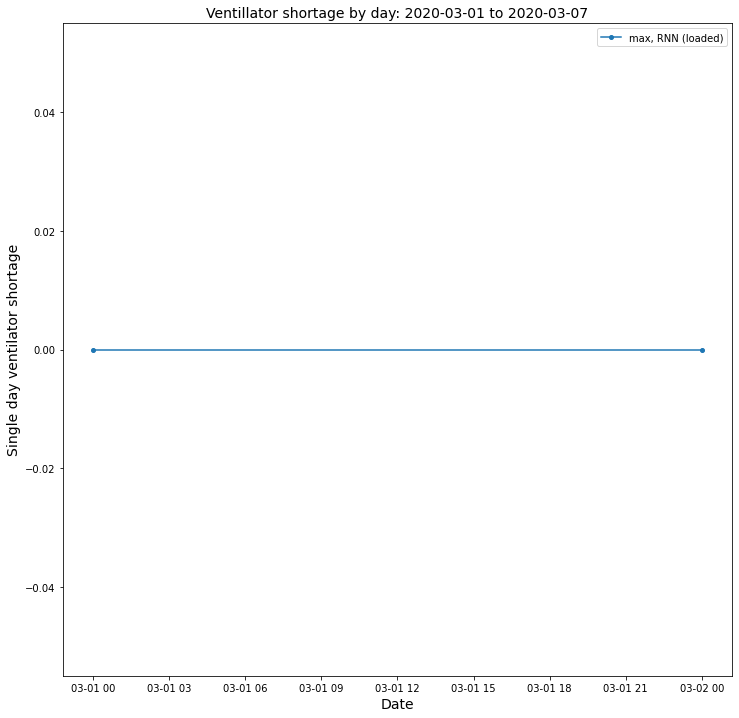

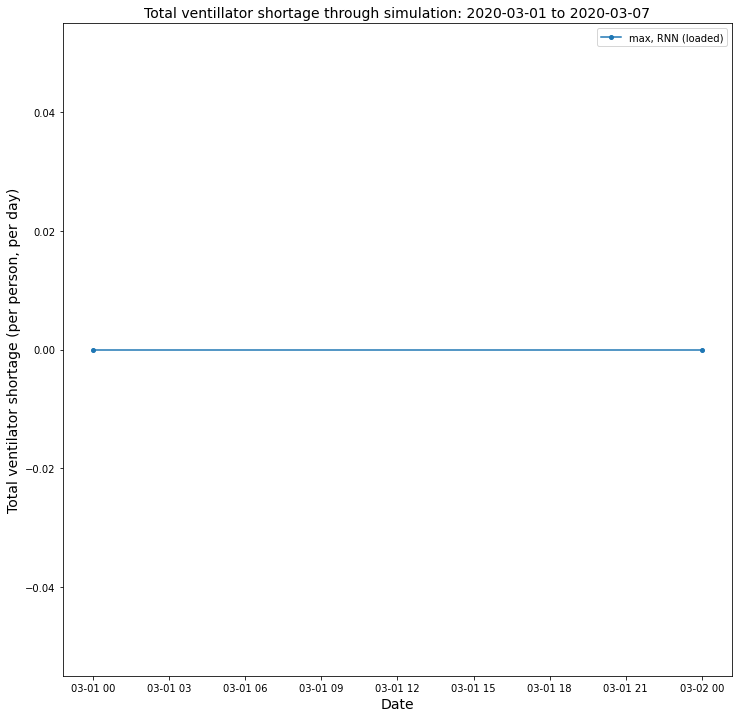

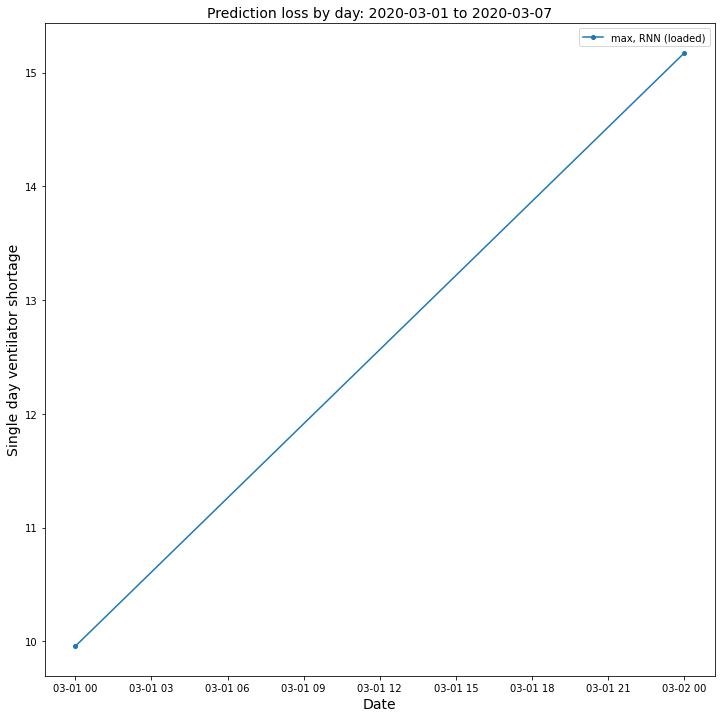

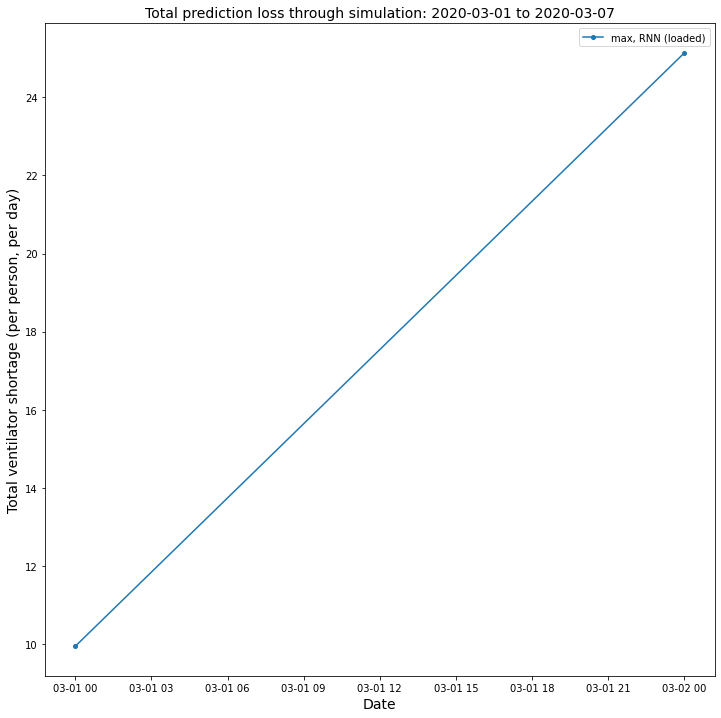

In [49]:
path = './data/'
ihme_path = path + '2020_08_06/'

states = sorted(list(set(states)))
data_end_date = pd.Timestamp(2020,8,3)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [15]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
print(len(states_list))
LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

states_aslist = states_list.tolist()

# prepare primary dataloader
primary_dataLoader = DataManager(data_end_date, states_aslist, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states_aslist, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                      ihme_path, loss_plots=True, prediction_analysis=True, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

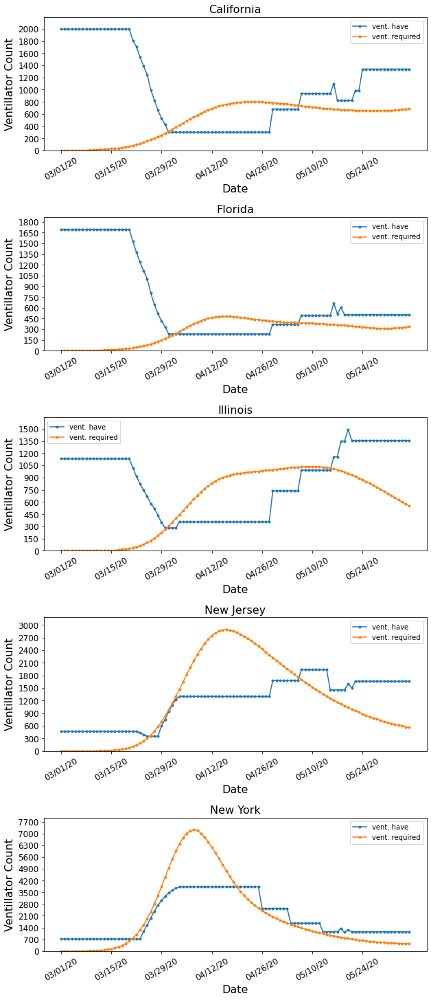

In [246]:
model_comparison_simulator.display_state_histories(model_num = 9, plot_cols = 1, same_range=False)

### Summary Runs

In [255]:
path = './data/'
ihme_path = path + '2020_06_13/'
num_states = 50
num_runs = 250
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California', 'New York', 'Illinois', 'Florida']
data_end_date = pd.Timestamp(2020,6,11)
sim_start_date = pd.Timestamp(2020,3,1)
prediction_interval = 3
ventillator_delay = 3
model_list = [-1,9]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['District of Columbia', 'American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)

LSTM_dataloader = DataManager(data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
data_start_date = LSTM_dataloader.start_date
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

summary_dict = {}
summary_dict['run'] = []
summary_dict['data start date'] = []
summary_dict['data end date'] = []
summary_dict['sim start date'] = []
summary_dict['days of prior data available'] = []
summary_dict['num. states'] = []
summary_dict['states'] = []
summary_dict['statewise loss total (best)'] = []
summary_dict['statewise loss total per 100,000 (best)'] = []
summary_dict['Shortage (no action)'] = []
summary_dict['Best Performer'] = []
summary_dict['Shortage (best)'] = []
summary_dict['Shortage (optimal)'] = []
summary_dict['Reduction Percentage'] = []
summary_dict['Percentage Optimal'] = []

for i in list(range(num_runs)):
    # select num_states at random
    states = random.sample(list(states_list), num_states)
    print("states in run:", states)
    # prepare primary dataloader
    primary_dataLoader = DataManager(data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

    # call simulator
    model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, ventillator_delay, path,\
                          ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)
    
    summary_dict['run'].append(i)
    summary_dict['data start date'].append(data_start_date.strftime('%Y-%m-%d'))
    summary_dict['data end date'].append(data_end_date.strftime('%Y-%m-%d'))
    summary_dict['sim start date'].append(sim_start_date.strftime('%Y-%m-%d'))
    summary_dict['days of prior data available'].append((sim_start_date - data_start_date).days)
    summary_dict['num. states'].append(len(states))
    summary_dict['states'].append(states)
    summary_dict['statewise loss total (best)'].append(model_comparison_simulator.loss_by_state['9'].tolist())
    summary_dict['statewise loss total per 100,000 (best)'].append(model_comparison_simulator.loss_by_state_per_capita['9'].tolist())
    short_noact = model_comparison_simulator.loss_total['-1'].iloc[-1]
    short_best = model_comparison_simulator.loss_total['9'].iloc[-1]
    short_optimal = model_comparison_simulator.optimal_shortage
    summary_dict['Shortage (no action)'].append(short_noact)
    summary_dict['Shortage (best)'].append(short_best)
    summary_dict['Shortage (optimal)'].append(short_optimal)  
    if short_noact == 0 and short_best != 0:
        short_noact = 1
        perc_reduction = 1.0 - short_best / short_noact
    elif short_noact == 0 and short_best == 0:
        perc_reduction = np.nan
    else:
        perc_reduction = 1.0 - short_best / short_noact    
    summary_dict['Reduction Percentage'].append(perc_reduction)
    if (short_noact - short_optimal) == 0:
        perc_optimal = np.nan
    else:
        perc_optimal = (short_noact - short_best) / (short_noact - short_optimal)
    summary_dict['Percentage Optimal'].append(perc_optimal)
    
summary_df = pd.DataFrame()
summary_df['run'] = summary_dict['run']
summary_df['data start date'] = summary_dict['data start date']
summary_df['data end date'] = summary_dict['data end date']
summary_df['sim start date'] = summary_dict['sim start date']
summary_df['days of prior data available'] = summary_dict['days of prior data available']
summary_df['num. states'] = summary_dict['num. states']
summary_df['states'] = summary_dict['states']
#summary_df['statewise loss total (best)'] =  []
summary_df['statewise loss total (best)'] = summary_dict['statewise loss total (best)']
#summary_df['statewise loss total per 100,000 (best)'] = []
summary_df['statewise loss total per 100,000 (best)'] = summary_dict['statewise loss total per 100,000 (best)']
summary_df['Shortage (no action)'] = summary_dict['Shortage (no action)']
summary_df['Shortage (best)'] = summary_dict['Shortage (best)']
summary_df['Shortage (optimal)'] = summary_dict['Shortage (optimal)']
summary_df['Reduction Percentage'] = summary_dict['Reduction Percentage']
summary_df['Percentage Optimal'] = summary_dict['Percentage Optimal']
#summary_df[] = self.summary_dict[]
# add in all fields
log_path = path + 'summary_runs/summary_run_1.csv'
summary_df.to_csv(log_path, index=False)

Initializing data manager class...
Excluding the following from all sets:  ['icuover_upper', 'icuover_mean', 'newICU_upper', 'bedover_lower', 'admis_lower', 'InvVen_upper', 'ICUbed_upper', 'admis_upper', 'allbed_upper', 'bedover_mean', 'InvVen_lower', 'icuover_lower', 'newICU_lower', 'ICUbed_lower', 'Observed_DOA_CDC', 'mobility_data_type', 'bedover_upper', 'allbed_lower', 'mobility_composite']
states in run: ['Arizona', 'Pennsylvania', 'South Carolina', 'Virginia', 'Illinois', 'Delaware', 'North Carolina', 'South Dakota', 'North Dakota', 'Texas', 'Montana', 'Massachusetts', 'Connecticut', 'Nebraska', 'Idaho', 'Arkansas', 'Utah', 'Alaska', 'Indiana', 'Mississippi', 'Kentucky', 'Maryland', 'New Jersey', 'Wisconsin', 'Alabama', 'Iowa', 'Missouri', 'Florida', 'New Hampshire', 'Oregon', 'Rhode Island', 'Colorado', 'Kansas', 'Oklahoma', 'Ohio', 'New York', 'Wyoming', 'Washington', 'Vermont', 'Louisiana', 'New Mexico', 'Nevada', 'Tennessee', 'Georgia', 'Hawaii', 'California', 'Michigan', 'Ma

In [ ]:
# plot summary spreadsheet data
def plot_summary_reduction(df):
    fig, ax1 = plt.subplots(figsize=(10,6))
    marker_style = dict(color='tab:blue', linestyle='--', marker='o', fillstyle='none',
                    markersize=11, markerfacecoloralt='tab:red', capsize=12.0, mew= 2.0)
    title = 'Distributor Performance:\n Shortage Reduction Compared to Inaction - 250 Iterations'
    ax1.set_title(title, fontsize=16)
    ax1.set_xlabel("Number of States (random selection)", fontsize=16)
    ax1.set_ylabel("% Reduction", fontsize=16)
    ax1.set_ylim(0.0, 110)
    ax1.set_yticks(np.arange(0, 110, 10))
    ax1.set_yticklabels(np.arange(0, 110, 10), fontsize=16)
    ax1.set_xlim(0, 60)
    ax1.set_xticks(df['Num. States'])
    ax1.set_xticklabels(df['Num. States'], fontsize=16)
    ax1.xaxis.grid(True)
    ax1.yaxis.grid(True)
    #plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
    container = ax1.errorbar(df['Num. States'], df['% Reduction (Average)']*100 , yerr = df['% Reduction (Std. Dev.)']*100, label=('(MEAN, STDEV)'), **marker_style)
    for index, row in df.iterrows():
        x_val = df['Num. States'].iloc[index]
        y_val = df['% Reduction (Average)'].iloc[index]*100
        stdev = df['% Reduction (Std. Dev.)'].iloc[index]*100
        text = '(' + str(round(y_val, 2)) + ', ' + str(round(stdev, 2)) + ')'
        ax1.annotate(text, (x_val+1,y_val-4))
    plt.legend(loc='lower right')
    plt.show()
    
def plot_summary_optimal(df):
    fig, ax1 = plt.subplots(figsize=(10,6))
    marker_style = dict(color='tab:blue', linestyle='--', marker='o', fillstyle='none',
                    markersize=11, markerfacecoloralt='tab:red', capsize=12.0, mew= 2.0)
    title = 'Q-learning Distributor Performance:\n Shortage Reduction Compared to Optimal - 1000 Iterations'
    ax1.set_title(title, fontsize=16)
    ax1.set_xlabel("Number of States (random selection)", fontsize=16)
    ax1.set_ylabel("% of Optimal", fontsize=16)
    ax1.set_ylim(0.0, 110)
    ax1.set_yticks(np.arange(0, 110, 10))
    ax1.set_yticklabels(np.arange(0, 110, 10), fontsize=16)
    ax1.set_xlim(0, 60)
    ax1.set_xticks(df['Num. States'])
    ax1.set_xticklabels(df['Num. States'], fontsize=16)
    ax1.xaxis.grid(True)
    ax1.yaxis.grid(True)
    #plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
    container = ax1.errorbar(df['Num. States'], df['% Optimal (Average)']*100 , yerr = df['% Optimal (Std. Dev.)']*100, label=('(MEAN, STDEV)'), **marker_style)
    for index, row in df.iterrows():
        x_val = df['Num. States'].iloc[index]
        y_val = df['% Optimal (Average)'].iloc[index]*100
        stdev = df['% Optimal (Std. Dev.)'].iloc[index]*100
        text = '(' + str(round(y_val, 2)) + ', ' + str(round(stdev, 2)) + ')'
        ax1.annotate(text, (x_val+1,y_val-4), fontsize=12)
    plt.legend(loc='lower right', fontsize=14)
    plt.show()

summary_path = './data/summary_runs/qlrn_summary_1000.csv'
summary_df = pd.read_csv(summary_path)
plot_summary_reduction(summary_df)
plot_summary_optimal(summary_df)

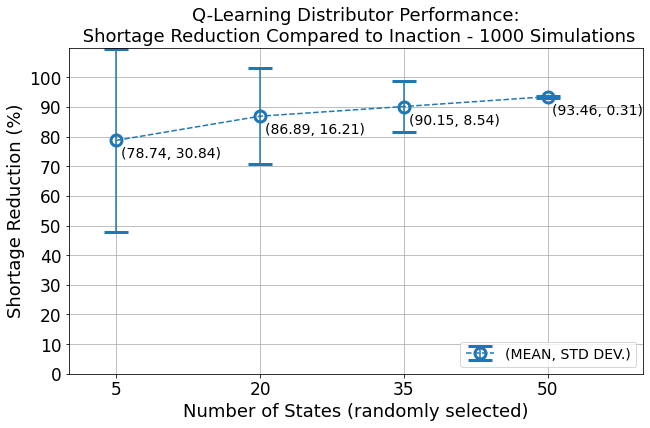

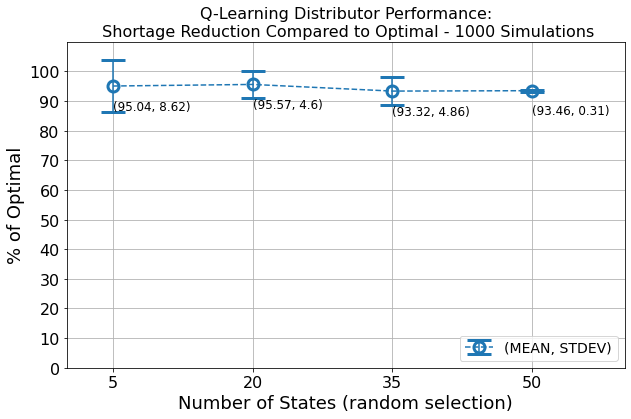

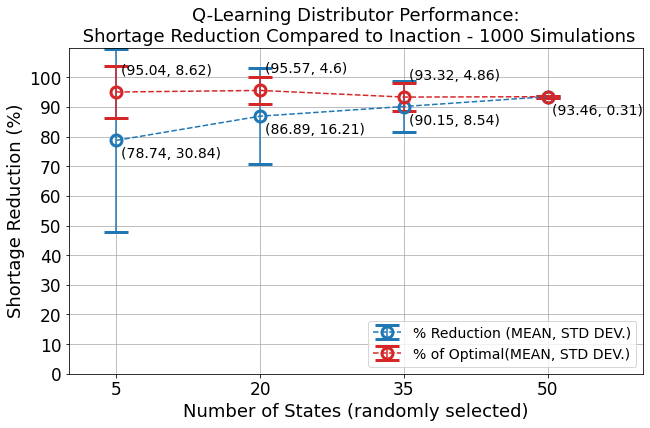

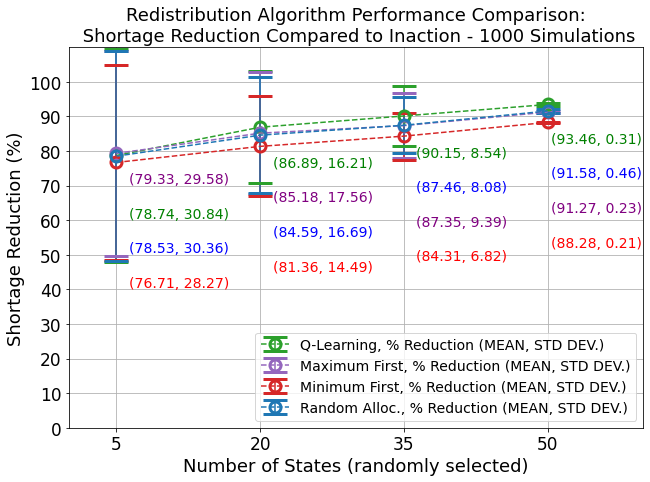

In [3]:
# plot summary spreadsheet data
def plot_summary_reduction(df):
    fig, ax1 = plt.subplots(figsize=(10.3,6))
    marker_style = dict(color='tab:blue', linestyle='--', marker='o', fillstyle='none',
                    markersize=11, markerfacecoloralt='tab:red', capsize=12.0, mew= 3.0)
    title = 'Q-Learning Distributor Performance:\n Shortage Reduction Compared to Inaction - 1000 Simulations'
    ax1.set_title(title, fontsize=18)
    ax1.set_xlabel("Number of States (randomly selected)", fontsize=18)
    ax1.set_ylabel("Shortage Reduction (%)", fontsize=18)
    ax1.set_ylim(0.0, 110)
    ax1.set_yticks(np.arange(0, 110, 10))
    ax1.set_yticklabels(np.arange(0, 110, 10), fontsize=17)
    ax1.set_xlim(0, 60)
    ax1.set_xticks(df['Num. States'])
    ax1.set_xticklabels(df['Num. States'], fontsize=17)
    ax1.xaxis.grid(True)
    ax1.yaxis.grid(True)
    #plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
    container = ax1.errorbar(df['Num. States'], df['% Reduction (Average)']*100 , yerr = df['% Reduction (Std. Dev.)']*100, label=('(MEAN, STD DEV.)'), **marker_style)
    for index, row in df.iterrows():
        x_val = df['Num. States'].iloc[index]
        y_val = df['% Reduction (Average)'].iloc[index]*100
        stdev = df['% Reduction (Std. Dev.)'].iloc[index]*100
        text = '(' + str(round(y_val, 2)) + ', ' + str(round(stdev, 2)) + ')'
        ax1.annotate(text, (x_val+0.5,y_val-6), fontsize=14)
    plt.legend(loc='lower right', fontsize=14)
    plt.show()
    
def plot_summary_optimal(df):
    fig, ax1 = plt.subplots(figsize=(10,6))
    marker_style = dict(color='tab:blue', linestyle='--', marker='o', fillstyle='none',
                    markersize=11, markerfacecoloralt='tab:red', capsize=12.0, mew= 3.0)
    title = 'Q-Learning Distributor Performance:\n Shortage Reduction Compared to Optimal - 1000 Simulations'
    ax1.set_title(title, fontsize=16)
    ax1.set_xlabel("Number of States (random selection)", fontsize=18)
    ax1.set_ylabel("% of Optimal", fontsize=18)
    ax1.set_ylim(0.0, 110)
    ax1.set_yticks(np.arange(0, 110, 10))
    ax1.set_yticklabels(np.arange(0, 110, 10), fontsize=16)
    ax1.set_xlim(0, 60)
    ax1.set_xticks(df['Num. States'])
    ax1.set_xticklabels(df['Num. States'], fontsize=16)
    ax1.xaxis.grid(True)
    ax1.yaxis.grid(True)
    #plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
    container = ax1.errorbar(df['Num. States'], df['% Optimal (Average)']*100 , yerr = df['% Optimal (Std. Dev.)']*100, label=('(MEAN, STDEV)'), **marker_style)
    for index, row in df.iterrows():
        x_val = df['Num. States'].iloc[index]
        y_val = df['% Optimal (Average)'].iloc[index]*100
        stdev = df['% Optimal (Std. Dev.)'].iloc[index]*100
        text = '(' + str(round(y_val, 2)) + ', ' + str(round(stdev, 2)) + ')'
        ax1.annotate(text, (x_val+0,y_val-8), fontsize=12)
    plt.legend(loc='lower right', fontsize=14)
    plt.show()
    
def plot_both(df):
    fig, ax1 = plt.subplots(figsize=(10.3,6))
    marker_style_1 = dict(color='tab:blue', linestyle='--', marker='o', fillstyle='none',
                    markersize=11, markerfacecoloralt='tab:red', capsize=12.0, mew= 3.0)
    marker_style_2 = dict(color='tab:red', linestyle='--', marker='o', fillstyle='none',
                markersize=11, markerfacecoloralt='tab:red', capsize=12.0, mew= 3.0)
    title = 'Q-Learning Distributor Performance:\n Shortage Reduction Compared to Inaction - 1000 Simulations'
    ax1.set_title(title, fontsize=18)
    ax1.set_xlabel("Number of States (randomly selected)", fontsize=18)
    ax1.set_ylabel("Shortage Reduction (%)", fontsize=18)
    ax1.set_ylim(0.0, 110)
    ax1.set_yticks(np.arange(0, 110, 10))
    ax1.set_yticklabels(np.arange(0, 110, 10), fontsize=17)
    ax1.set_xlim(0, 60)
    ax1.set_xticks(df['Num. States'])
    ax1.set_xticklabels(df['Num. States'], fontsize=17)
    ax1.xaxis.grid(True)
    ax1.yaxis.grid(True)
    #plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
    container = ax1.errorbar(df['Num. States'], df['% Reduction (Average)']*100 , yerr = df['% Reduction (Std. Dev.)']*100, label=('% Reduction (MEAN, STD DEV.)'), **marker_style_1)
    container2 = ax1.errorbar(df['Num. States'], df['% Optimal (Average)']*100 , yerr = df['% Optimal (Std. Dev.)']*100, label=('% of Optimal(MEAN, STD DEV.)'), **marker_style_2)
    for index, row in df.iterrows():
        x_val = df['Num. States'].iloc[index]
        y_val = df['% Reduction (Average)'].iloc[index]*100
        stdev = df['% Reduction (Std. Dev.)'].iloc[index]*100
        text = '(' + str(round(y_val, 2)) + ', ' + str(round(stdev, 2)) + ')'
        ax1.annotate(text, (x_val+0.5,y_val-6), fontsize=14)
    for index, row in df.iterrows():
        if index < 3:
            x_val = df['Num. States'].iloc[index]
            y_val = df['% Optimal (Average)'].iloc[index]*100
            stdev = df['% Optimal (Std. Dev.)'].iloc[index]*100
            text = '(' + str(round(y_val, 2)) + ', ' + str(round(stdev, 2)) + ')'
            ax1.annotate(text, (x_val+0.5,y_val+6), fontsize=14)
    plt.legend(loc='lower right', fontsize=14)
    plt.show()
    
    
def plot_reduction_withbaselines(summary_qlrn, summary_max, summary_min, summary_rand):
    fig, ax1 = plt.subplots(figsize=(10.3,7))
    marker_style_1 = dict(color='tab:green', linestyle='--', marker='o', fillstyle='none',
                    markersize=11, markerfacecoloralt='tab:red', capsize=12.0, mew= 3.0)
    marker_style_2 = dict(color='tab:purple', linestyle='--', marker='o', fillstyle='none',
                    markersize=11, markerfacecoloralt='tab:red', capsize=12.0, mew= 3.0)
    marker_style_3 = dict(color='tab:red', linestyle='--', marker='o', fillstyle='none',
                    markersize=11, markerfacecoloralt='tab:red', capsize=12.0, mew= 3.0)
    marker_style_4 = dict(color='tab:blue', linestyle='--', marker='o', fillstyle='none',
                    markersize=11, markerfacecoloralt='tab:red', capsize=12.0, mew= 3.0)
    title = 'Redistribution Algorithm Performance Comparison:\n Shortage Reduction Compared to Inaction - 1000 Simulations'
    ax1.set_title(title, fontsize=18)
    ax1.set_xlabel("Number of States (randomly selected)", fontsize=18)
    ax1.set_ylabel("Shortage Reduction (%)", fontsize=18)
    ax1.set_ylim(0.0, 110)
    ax1.set_yticks(np.arange(0, 110, 10))
    ax1.set_yticklabels(np.arange(0, 110, 10), fontsize=17)
    ax1.set_xlim(0, 60)
    ax1.set_xticks(summary_qlrn['Num. States'])
    ax1.set_xticklabels(summary_qlrn['Num. States'], fontsize=17)
    ax1.xaxis.grid(True)
    ax1.yaxis.grid(True)
    #plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
    container1 = ax1.errorbar(summary_qlrn['Num. States'], summary_qlrn['% Reduction (Average)']*100 , yerr = summary_qlrn['% Reduction (Std. Dev.)']*100, label=('Q-Learning, % Reduction (MEAN, STD DEV.)'), **marker_style_1)
    container2 = ax1.errorbar(summary_max['Num. States'], summary_max['% Reduction (Average)']*100 , yerr = summary_max['% Reduction (Std. Dev.)']*100, label=('Maximum First, % Reduction (MEAN, STD DEV.)'), **marker_style_2)
    container3 = ax1.errorbar(summary_min['Num. States'], summary_min['% Reduction (Average)']*100 , yerr = summary_min['% Reduction (Std. Dev.)']*100, label=('Minimum First, % Reduction (MEAN, STD DEV.)'), **marker_style_3)
    container4 = ax1.errorbar(summary_rand['Num. States'], summary_rand['% Reduction (Average)']*100 , yerr = summary_rand['% Reduction (Std. Dev.)']*100, label=('Random Alloc., % Reduction (MEAN, STD DEV.)'), **marker_style_4)

    col_list = summary_qlrn['Num. States']
    df_list = [summary_qlrn, summary_max, summary_min, summary_rand]
    for index, n_states in enumerate(col_list):
        tuple_list = []
        min_yval = 100
        for next_df in df_list:
            #x_val = next_df['Num. States'].iloc[index]
            y_val = next_df['% Reduction (Average)'].iloc[index]*100
            if y_val < min_yval:
                min_yval = y_val
            stdev = next_df['% Reduction (Std. Dev.)'].iloc[index]*100
            if next_df.equals(summary_qlrn):
                color = 'green'
            elif next_df.equals(summary_max):
                color = 'purple'
            elif next_df.equals(summary_min):
                color = 'red'
            elif next_df.equals(summary_rand):
                color = 'blue'
            next_tuple = (y_val, stdev, color)
            tuple_list.append(next_tuple)
        # sort tuple list
        tuple_list.sort(reverse=True)
        for i, next_tuple in enumerate(tuple_list):
            (y_val, stdev, color) = next_tuple
            text = '(' + str(round(y_val, 2)) + ', ' + str(round(stdev, 2)) + ')'
            offset = 6+i*10
            if n_states == 50:
                x_offset = 0.4
            else:
                x_offset = 1.3
            ax1.annotate(text, (n_states+x_offset,min_yval-offset), fontsize=14, color=color)
    
#     for index, row in summary_qlrn.iterrows():
#         x_val = summary_qlrn['Num. States'].iloc[index]
#         y_val = summary_qlrn['% Reduction (Average)'].iloc[index]*100
#         stdev = summary_qlrn['% Reduction (Std. Dev.)'].iloc[index]*100
#         text = '(' + str(round(y_val, 2)) + ', ' + str(round(stdev, 2)) + ')'
#         ax1.annotate(text, (x_val+0.5,y_val-6), fontsize=14, color='blue')
    
#     for index, row in summary_max.iterrows():
#         x_val = summary_max['Num. States'].iloc[index]
#         y_val = summary_max['% Reduction (Average)'].iloc[index]*100
#         stdev = summary_max['% Reduction (Std. Dev.)'].iloc[index]*100
#         text = '(' + str(round(y_val, 2)) + ', ' + str(round(stdev, 2)) + ')'
#         ax1.annotate(text, (x_val+0.5,y_val_reference-16), fontsize=14, color='red')
        
#     for index, row in summary_min.iterrows():
#         x_val = summary_min['Num. States'].iloc[index]
#         y_val = summary_min['% Reduction (Average)'].iloc[index]*100
#         stdev = summary_min['% Reduction (Std. Dev.)'].iloc[index]*100
#         text = '(' + str(round(y_val, 2)) + ', ' + str(round(stdev, 2)) + ')'
#         ax1.annotate(text, (x_val+0.5,y_val_reference-26), fontsize=14, color='green')
        
#     for index, row in summary_min.iterrows():
#         x_val = summary_rand['Num. States'].iloc[index]
#         y_val = summary_rand['% Reduction (Average)'].iloc[index]*100
#         stdev = summary_rand['% Reduction (Std. Dev.)'].iloc[index]*100
#         text = '(' + str(round(y_val, 2)) + ', ' + str(round(stdev, 2)) + ')'
#         ax1.annotate(text, (x_val+0.5,y_val_reference-36), fontsize=14, color='orange')

    plt.legend(loc='lower right', fontsize=14)
    plt.show()

summary_path = './data/summary_runs/qlrn_summary_1000.csv'
summary_qlrn = pd.read_csv(summary_path)
summary_path = './data/summary_runs/max_summary_1000.csv'
summary_max = pd.read_csv(summary_path)
summary_path = './data/summary_runs/min_summary_1000.csv'
summary_min = pd.read_csv(summary_path)
summary_path = './data/summary_runs/rand_summary_1000.csv'
summary_rand = pd.read_csv(summary_path)


plot_summary_reduction(summary_qlrn)
plot_summary_optimal(summary_qlrn)
plot_both(summary_qlrn)


plot_reduction_withbaselines(summary_qlrn, summary_max, summary_min, summary_rand)
    

# Policies (see RL solver notebook for primary development & use cases)

In [10]:
# new attempt to buffer demand
class QlearningRL():
    def __init__(self, states, proxy_reward=0):
        self.states = states
        self.n_states = len(self.states)
        self.w = 0.1
        self.discount_factor = 0.8
        self.threshold = 0
        self.max_allocate_in_one_step = 100
        self.n = 20 # number of states per province
        self.max_vent_requirement = 6000 # number that can be sent in a single time step. Blown way up and only positive impact observed so df
        self.ratio_step = 0.1
        self.offset_abs_cap = 3
        self.offset_scale = 0.25

        self.reward_state = {}
        self.q_vals = {}
        self.q_offset_dict = {}
        for state in states:
            self.q_offset_dict[state] = 0
            
        self.ratio_dict_init = False
        buffer_len = 5
        self.init_venti_required_buffer(buffer_len)

    
    def init_venti_required_buffer(self, buffer_len):
        self.venti_required_buffer_dict = {}
        for state in self.states:
            self.venti_required_buffer_dict[state] = [0] * buffer_len
            
    def update_venti_required_buffer_and_rtn(self, venti_required):
        venti_required_buffered = []
        for i, vents in enumerate(venti_required):
            next_state = self.states[i]
            tmp = self.venti_required_buffer_dict[next_state]
            tmp.append(vents)
            self.venti_required_buffer_dict[next_state] = tmp[1:]
            venti_required_buffered.append(max(self.venti_required_buffer_dict[next_state]))
        return venti_required_buffered
            
    
    def update_proxy_rewards(self, largest_observed, state_status_dict, vent_need_dict):
        for state in self.states:
            if state_status_dict[state].get_vh() > vent_need_dict[state]:
                q_offset_adjust = -1
            elif state_status_dict[state].get_vh() < vent_need_dict[state]:
                q_offset_adjust = 1
            else:
                q_offset_adjust = 0
                
            self.q_offset_dict[state] = np.clip((self.q_offset_dict[state] + q_offset_adjust), self.offset_abs_cap*-1, self.offset_abs_cap)
            proxy_val = largest_observed[state] + largest_observed[state] * self.offset_scale * self.q_offset_dict[state]
            #self.reward_state[state] = self.create_reward_proxy(proxy_val, self.n)
            self.reward_state[state] = self.create_reward_proxy_ln(proxy_val,self.n)
            self.q_vals[state] = self.q_learning(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state[state])
            
    def get_action(self, venti_available, venti_required, state_allocation_limit, federal_available, federal_transfer_limit):
        #print("GET ACTION CALLED")
        #print("Stage 2")
        #state_to_state = self.optimal_policy(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, vals1, vals2, vals3, vals4, state_allocation_limit)
        #state_to_state = self.q_policy(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, self.q1, self.q2, self.q3, self.q4, state_allocation_limit)
        venti_required_buffered = self.update_venti_required_buffer_and_rtn(venti_required)
        state_to_state = self.q_policy_fed(venti_available, venti_required_buffered, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, state_allocation_limit, federal_available, federal_transfer_limit)
        return state_to_state[0]
                
    def next_state(self, venti_avail, venti_need):
        state = venti_avail/venti_needed
        return state
    
    def find_where_it_fits(self,ratio, max_states, increment):
        max_val = increment*max_states
        min_val = 0
        i = 0
        ratio_steps = []
        while i < max_states:
            ratio_steps.append(i*increment)
            i = i + 1
        ratio_steps = np.asarray(ratio_steps)
        min_diff = float('inf')
        index = -1
        for j in range(0,max_states):
            diff = abs(ratio - ratio_steps[j])
            if diff < min_diff:
                min_diff = diff
                index = j
        return index
    
    def create_reward_proxy(self,alpha,n):
        #https://en.wikipedia.org/wiki/List_of_states_and_territories_of_the_United_States_by_population_density#2015_density_(states,_territories_and_DC)
        reward_state = np.zeros(n)
        for i in range(0,n):
            reward_state[i] = 0.1*i*alpha - 2 * alpha
            if reward_state[i] > -alpha:
                reward_state[i] = -alpha
        return reward_state
    
    def create_reward_proxy_ln(self,alpha,n):
        reward_state = np.zeros(n)
        for i in range(1,n+1):
            #reward_state[i-1] = (math.log(0.1*i) - math.log(0.1*n)) * alpha #postive offset
            #const = (math.log(1.5) - math.log(2)) * alpha
            reward_state[i-1] = (math.log(0.1*i) - math.log(0.1*n)) * math.log(alpha) #postive offset
            const = (math.log(1.5) - math.log(2)) * math.log(alpha)
            #reward_state[i-1] = (math.log(0.1*i) - math.log(0.1*(n+1))) * alpha #postive offset
            #const = (math.log(0.1*n) - math.log(0.1*(n+1))) * alpha
            #const = 0
            if reward_state[i-1] > const:
                reward_state[i-1] = const
        #print(reward_state)
        return reward_state

    def q_learning(self, max_vent_requirement, max_allocate_in_one_step, n, ratio_step, reward, verbose=0):
        #i = 0
        #vent_steps = []
        #while i < max_vent_requirement/max_allocate_in_one_step:
        #    vent_steps.append(i*max_allocate_in_one_step)
        #    i = i + 1
        #vent_steps = np.asarray(vent_steps)
        #i = 0
        #ratio_steps = []
        #while i < n:
        #    ratio_steps.append(i*ratio_step)
        #    i = i + 1
        #ratio_steps = np.asarray(ratio_steps)
        values = np.zeros((n))
        q_func = np.zeros((n,3))
        delta = float('inf')
        while delta > self.threshold:
            delta = 0
            for j in range(0, n):
                v = values[j]
                if j == 0:
                    reward_backward = reward[j]
                    reward_stay = reward[j]
                    reward_forward = reward[j+1]
                    val_backward = values[j]
                    val_stay = values[j]
                    val_forward = values[j+1]
                elif j == n-1:
                    reward_backward = reward[j-1]
                    reward_stay = reward[j]
                    reward_forward = reward[j]
                    val_backward = values[j-1]
                    val_stay = values[j]
                    val_forward = values[j]
                else:
                    reward_backward = reward[j-1]
                    reward_stay = reward[j]
                    reward_forward = reward[j+1]
                    val_backward = values[j-1]
                    val_stay = values[j]
                    val_forward = values[j+1]
                total_reward_backward = reward_backward + self.discount_factor*val_backward
                total_reward_forward = reward_forward + self.discount_factor*val_forward
                total_reward_stay = reward_stay + self.discount_factor*val_stay
                values[j] = max(total_reward_backward, total_reward_stay, total_reward_forward)
                rew_array = [total_reward_backward, total_reward_stay, total_reward_forward]
                rew_array = np.asarray(rew_array)
                rew_arg = np.argmax(rew_array)
                q_func[j,0] = total_reward_backward
                q_func[j,1] = total_reward_stay
                q_func[j,2] = total_reward_forward
                delta = max(delta, abs(v - values[j]))
        if verbose == 1:
            print((q_func))
        return(q_func)
    

    def q_policy_fed(self,venti_available, venti_required, max_states, increment, max_allocate_in_one_step, n_states, state_allocation_limit, fed_pile, fed_pile_limit):
        
        state_to_state = np.zeros((n_states+1,n_states+1)) # state_to_state transfer matrix
        state_state_dict = {}
        where_state_dict = {}
        q_array_dict = {}
        max_q_dict = {}
        for i in range(len(self.states)):
            state = self.states[i]
            if venti_required[i] == 0:
                venti_req = 1
            else:
                venti_req = venti_required[i]
            state_state_dict[state] = venti_available[i]/venti_req
            where_state_dict[state] = self.find_where_it_fits(state_state_dict[state], max_states, increment)
            q_array_tmp = [self.q_vals[state][where_state_dict[state], 0], self.q_vals[state][where_state_dict[state], 1], self.q_vals[state][where_state_dict[state], 2]]
            q_array_dict[state] = np.asarray(q_array_tmp)
            max_q_dict[state] = np.argmax(q_array_dict[state]) 
        
        max_array = []
        for state in self.states:
            max_array.append(max_q_dict[state])

        givers = []
        geters = []
        stayers = []

        for i in range(0, len(max_array)):
            if max_array[i] == 0:
                givers.append(i)
            elif max_array[i] == 1:
                stayers.append(i)
            elif max_array[i] == 2:
                geters.append(i)

#         if len(givers) == 0 or len(geters) == 0:
#             return np.floor(state_to_state), fed_pile
#         elif len(givers) >= 1 and len(geters) >= 1 and len(givers) >= len(geters):
#             for i in givers:
#                 for j in geters:
#                     fed_flag = 0
#                     state_to_state[i, j] = state_allocation_limit[i]
#                     if fed_flag == 0 and fed_pile > fed_pile_limit:
#                         state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile_limit
#                         fed_pile = fed_pile - fed_pile_limit
#                         fed_flag = 1
#                     elif fed_flag == 0 and fed_pile < fed_pile_limit:
#                         state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile
#                         fed_pile = 0
#                         fed_flag = 1
#         elif len(givers) >= 1 and len(geters) >= 1 and len(givers) < len(geters):
#             for j in geters:
#                 fed_flag = 0
#                 for i in givers:
#                     state_to_state[i, j] = state_allocation_limit[i]
#                     if fed_flag == 0 and fed_pile > fed_pile_limit:
#                         state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile_limit
#                         fed_pile = fed_pile - fed_pile_limit
#                         fed_flag = 1
#                     elif fed_flag == 0 and fed_pile < fed_pile_limit:
#                         state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile
#                         fed_pile = 0
#                         fed_flag = 1

        #print(givers)
        #print(stayers)
        #print(geters)
        
        if self.ratio_dict_init is False:
            self.ratio_dict = self.init_ratio_dict(venti_available, venti_required)
            self.ratio_dict_init = True
        else:
            self.ratio_dict = self.update_ratio_dict_required(self.ratio_dict, venti_required)
    
#         if len(givers) == 0:
#             potential_givers = []
#             potential_geters = []
#             if len(geters) != 0:
#                 sorted_all_highlow = self.sort_givers_geters(list(range(self.n_states)), venti_available, venti_required, True)
#                 potential_givers.append(sorted_all_highlow[0])
#             else: 
#                 potential_givers = []
#                 potential_geters = []
#                 for i in range(len(self.states)):
#                     (_, _, state_ratio) = self.ratio_dict[i]
#                     if state_ratio > 1.0:
#                         potential_givers.append(i)
#                     if state_ratio < 1.0:
#                         potential_geters.append(i)

#             for next_giver in potential_givers:
#                 givers.append(next_giver)
#             for next_geter in potential_geters:
#                 geters.append(next_geter)
        
        # unique entries only
        #givers = set(givers)
        #geters = set(geters)
            
        # order givers by their ratio
        #print('\n')
        #print('givers', givers)
        #print('geters', geters)
        sorted_givers = self.sort_givers_geters(givers, venti_available, venti_required, True) # highest ratio first
        sorted_geters = self.sort_givers_geters(geters, venti_available, venti_required, False) # lowest ratio first
        #print('sorted_givers', sorted_givers)
        #print('sorted_geters', sorted_geters)
        max_ratio = self.ratio_step * self.n
        #print("max ratio:", self.ratio_step * self.n)
        
        if len(givers) == 0 or len(geters) == 0:
            return np.floor(state_to_state), fed_pile
        elif len(givers) >= 1 and len(geters) >= 1 and len(givers) >= len(geters):
            for i in sorted_givers:
                for j in sorted_geters:
                    fed_flag = 0
                    (geter_avail, geter_req, geter_ratio) = self.ratio_dict[j]
                    (giver_avail, giver_req, giver_ratio) = self.ratio_dict[i]
                    if geter_ratio < max_ratio:
                        #if j == 0:
                        #    print("geter ratio", self.ratio_dict[j])
                        geter2x = math.ceil(2 * geter_req - geter_avail)
                        giver10p = state_allocation_limit[i]
                        giver1x = math.floor(giver_avail - giver_req)
                        #print('giver:', self.states[i])
                        #print('geter2x:', geter2x)
                        #print('giver10p:', giver10p)
                        #print('giver1x:', giver1x)
                        giver_amt = min([geter2x, giver10p, giver1x])
                        if giver_amt < 0:
                            giver_amt = 0
                    else:
                        giver_amt = 0
                    state_to_state[i, j] = giver_amt
                    self.ratio_dict = self.update_ratio_dict_transaction(self.ratio_dict, i, giver_amt, j)
                    if fed_flag == 0 and fed_pile > fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile_limit
                        fed_pile = fed_pile - fed_pile_limit
                        fed_flag = 1
                    elif fed_flag == 0 and fed_pile < fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile
                        fed_pile = 0
                        fed_flag = 1
        elif len(givers) >= 1 and len(geters) >= 1 and len(givers) < len(geters):
            for j in sorted_geters:
                fed_flag = 0
                for i in sorted_givers:
                    (geter_avail, geter_req, geter_ratio) = self.ratio_dict[j]
                    (giver_avail, giver_req, giver_ratio) = self.ratio_dict[i]
                    if geter_ratio < max_ratio:
                        #if j == 0:
                        #    print("geter ratio", self.ratio_dict[j])
                        geter2x = math.ceil(2 * geter_req - geter_avail)
                        giver10p = state_allocation_limit[i]
                        giver1x = math.floor(giver_avail - giver_req)
                        #print('giver:', self.states[i])
                        #print('geter2x:', geter2x)
                        #print('giver10p:', giver10p)
                        #print('giver1x:', giver1x)
                        giver_amt = min([geter2x, giver10p, giver1x])
                        if giver_amt < 0:
                            giver_amt = 0
                    else:
                        giver_amt = 0
                    state_to_state[i, j] = giver_amt
                    self.ratio_dict = self.update_ratio_dict_transaction(self.ratio_dict, i, giver_amt, j)
                    if fed_flag == 0 and fed_pile > fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile_limit
                        fed_pile = fed_pile - fed_pile_limit
                        fed_flag = 1
                    elif fed_flag == 0 and fed_pile < fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile
                        fed_pile = 0
                        fed_flag = 1
        
        #print(np.floor(state_to_state))
        return (np.floor(state_to_state), fed_pile)
    
    def sort_givers_geters(self, state_indexes, venti_available, venti_required, reverse):
        tuple_list = []
        for i in state_indexes:
            if venti_required[i] == 0:
                venti_req = 1
            else:
                venti_req = venti_required[i]
            next_ratio = venti_available[i] / venti_req
            next_tuple = (i, next_ratio)
            tuple_list.append(next_tuple)
        
        sorted_list = sorted(tuple_list, key = lambda x: x[1], reverse = reverse)
        index_list = []
        for (index, ratio) in sorted_list:
            index_list.append(index)
        return index_list
    
    def init_ratio_dict(self, venti_available, venti_required):
        ratio_dict = {}
        for i in range(len(self.states)):
            if venti_required[i] == 0:
                venti_req = 1
            else:
                venti_req = venti_required[i]
            ratio = venti_available[i] / venti_req
            ratio_dict[i] = (venti_available[i], venti_required[i], ratio)
            #if i == 0:
            #    print("District of Columbia: ", ratio_dict[i])
        return ratio_dict
    
    def update_ratio_dict_required(self, ratio_dict, venti_required):
        for i in range(len(self.states)):
            avail = ratio_dict[i][0]
            if venti_required[i] == 0:
                venti_req = 1
            else:
                venti_req = venti_required[i]
            ratio = avail / venti_req
            ratio_dict[i] = (avail, venti_required[i], ratio)
        return ratio_dict
    
    def update_ratio_dict_transaction(self, ratio_dict, giver, giver_amt, geter):
        # update giver
        (avail, req, ratio) = ratio_dict[giver]
        avail = avail - giver_amt
        if req == 0:
            venti_req = 1
        else:
            venti_req = req
        ratio = avail / venti_req
        ratio_dict[giver] = (avail, req, ratio)
        # update geter
        (avail, req, ratio) = ratio_dict[geter]
        avail = avail + giver_amt
        if req == 0:
            venti_req = 1
        else:
            venti_req = req
        ratio = avail / venti_req
        ratio_dict[geter] = (avail, req, ratio)
        return ratio_dict
        

In [11]:
# alternative implementation supporting multiple states
class ValueItterationRL():
    def __init__(self, states, proxy_reward=0):
        self.states = states
        self.n_states = len(self.states)
        self.w = 0.1
        self.discount_factor = 0.8
        self.threshold = 0
        self.max_allocate_in_one_step = 100
        self.n = 20
        self.max_vent_requirement = 6000
        self.ratio_step = 0.1
        
        self.reward_state = {}
        self.vals = {}
        
    def update_proxy_rewards(self, largest_observed, state_status_dict, vent_need_dict):
        for state in self.states:
            proxy_val = largest_observed[state]
            self.reward_state[state] = self.create_reward_proxy(proxy_val, self.n)
            self.vals[state] = self.optimal_value_iteration(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state[state])
        
    def get_action(self, venti_available, venti_required, state_allocation_limit, federal_available, federal_transfer_limit):
        #print("Stage 2")
        #state_to_state = self.optimal_policy(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, vals1, vals2, vals3, vals4, state_allocation_limit)
        #state_to_state = self.optimal_policy_new(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, self.vals1, self.vals2, self.vals3, self.vals4, state_allocation_limit)
        (state_to_state, _) = self.optimal_policy_fed(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, state_allocation_limit, federal_available, federal_transfer_limit)
        return state_to_state
                
    def next_state(self, venti_avail, venti_need):
        state = venti_avail/venti_needed
        return state
    
    def find_where_it_fits(self,ratio, max_states, increment):
        max_val = increment*max_states
        min_val = 0
        i = 0
        ratio_steps = []
        while i < max_states:
            ratio_steps.append(i*increment)
            i = i + 1
        ratio_steps = np.asarray(ratio_steps)
        min_diff = float('inf')
        index = -1
        for j in range(0,max_states):
            diff = abs(ratio - ratio_steps[j])
            if diff < min_diff:
                min_diff = diff
                index = j
        return index
    
    def create_reward_proxy(self,population_density, n):
        #https://en.wikipedia.org/wiki/List_of_states_and_territories_of_the_United_States_by_population_density#2015_density_(states,_territories_and_DC)
        reward_state = np.zeros(n)
        for i in range(0,20):
            reward_state[i] = 0.1*i*population_density - population_density
            if reward_state[i] > 0:
                reward_state[i] = 0
        return reward_state
    
    def optimal_value_iteration(self,max_vent_requirement, max_allocate_in_one_step, n, ratio_step, reward):
        i = 0
        vent_steps = []
        while i < max_vent_requirement/max_allocate_in_one_step:
            vent_steps.append(i*max_allocate_in_one_step)
            i = i + 1
        vent_steps = np.asarray(vent_steps)
        i = 0
        ratio_steps = []
        while i < n:
            ratio_steps.append(i*ratio_step)
            i = i + 1
        ratio_steps = np.asarray(ratio_steps)
        values = np.zeros((n))
        delta = float('inf')
        while delta > self.threshold:
            delta = 0
            for j in range(0, n):
                v = values[j]
                if j == 0:
                    reward_backward = reward[j]
                    val_backward = values[j]
                    reward_stay = reward[j]
                    reward_forward = reward[j+1]
                    val_backward = values[j]
                    val_stay = values[j]
                    val_forward = values[j+1]
                elif j == n-1:
                    reward_backward = reward[j-1]
                    reward_stay = reward[j]
                    reward_forward = reward[j]
                    val_backward = values[j-1]
                    val_stay = values[j]
                    val_forward = values[j]
                else:
                    reward_backward = reward[j-1]
                    reward_stay = reward[j]
                    reward_forward = reward[j+1]
                    val_backward = values[j-1]
                    val_stay = values[j]
                    val_forward = values[j+1]
                total_reward_backward = reward_backward + self.discount_factor*val_backward
                total_reward_forward = reward_forward + self.discount_factor*val_forward
                total_reward_stay = reward_stay + self.discount_factor*val_stay
                values[j] = max(total_reward_backward, total_reward_stay, total_reward_forward)
                delta = max(delta, abs(v - values[j]))
        return(values)
    
    def optimal_policy_fed(self, venti_available, venti_required, max_states, increment, max_allocate_in_one_step, n_states, state_allocation_limit, fed_pile, fed_pile_limit):
        state_to_state = np.zeros((n_states+1,n_states+1)) # state_to_state transfer matrix
        state_state_dict = {}
        where_state_dict = {}
        where_state_dict_get = {}
        reward_array_get = []
        for i in range(len(self.states)):
            state = self.states[i]
            state_state_dict[state] = venti_available[i]/venti_required[i]
            where_state_dict[state] = self.find_where_it_fits(state_state_dict[state], max_states, increment)
            where_state_dict_get[state] = self.find_where_it_fits((venti_available[i]+max_allocate_in_one_step)/venti_required[i],max_states,increment)
            reward_tmp = self.vals[state][where_state_dict_get[state]]
            reward_array_get.append(reward_tmp)
            
        reward_array_get = np.asarray(reward_array_get)
        args_get = np.argsort(reward_array_get)

        vent_actual_available = []
        vent_actual_needed = []
        for i in range(0,len(venti_required)):
            vent_actual_available.append(venti_available[i] - venti_required[i])
            vent_actual_needed.append(venti_required[i] - venti_available[i])
        vent_actual_available = np.asarray(vent_actual_available)
        vent_actual_needed = np.asarray(vent_actual_needed)

        state_get = [-1,-1]
        state_give = [-1,-1]
        state_get = np.asarray(state_get)
        state_give = np.asarray(state_give)
        

        flag = 0
        run = 0
        while flag < 2 and run < 4:
            for arg in args_get:
                run = run + 1
                if vent_actual_needed[arg] > 0 and flag < 2:
                    state_get[flag] = arg
                    flag = flag + 1

        flag1 = 0
        run1 = 0
        while flag1 < 2 and run1 < 4:
            for arg in args_get:
                if arg not in state_get:
                    run1 = run1 + 1
                    if vent_actual_available[arg] > 0 and flag1 < 2:
                        state_give[flag1] = arg
                        flag1 = flag1 + 1

        for i in range(0, len(state_get)):
            fed_flag = 0
            for j in range(0, len(state_give)):
                if state_get[i] != -1 and state_give[j] != -1:
                    state_to_state[state_give[j], state_get[i]] = state_allocation_limit[state_give[j]]
                    if fed_flag == 0 and fed_pile > fed_pile_limit:
                        state_to_state[n_states, state_get[i]] = state_to_state[n_states, state_get[i]] + fed_pile_limit
                        fed_pile = fed_pile - fed_pile_limit
                        fed_flag = 1
                    elif fed_flag == 0 and fed_pile < fed_pile_limit:
                        state_to_state[n_states, state_get[i]] = state_to_state[n_states, state_get[i]] + fed_pile
                        fed_pile = 0
                        fed_flag = 1


        #print(state_get)
        #print(state_give)
        return (np.floor(state_to_state), fed_pile)

In [12]:
def random_allocate_fed(vent_needed, vent_available, n_states, state_allocation_limit, fed_pile, fed_pile_limit):
    state_to_state = np.zeros((n_states+1,n_states+1)) # state_to_state transfer matrix
    vent_actual_available = []
    vent_actual_needed = []
    # find how many ventilators each state actually needs and how many are available
    for i in range(0,len(vent_needed)):
        vent_actual_available.append(vent_available[i] - vent_needed[i])
        vent_actual_needed.append(vent_needed[i] - vent_available[i])
    vent_actual_available = np.asarray(vent_actual_available)
    vent_actual_needed = np.asarray(vent_actual_needed)
    #print("vent_actual_available: ", vent_actual_available)
    #print("vent_actual_needed: ", vent_actual_needed)
    largest_indices = np.argsort(vent_actual_needed) # sort the ventilators needed array in asceding order
    #print("largest_indices: ", largest_indices)
    
    total_ventilators_available = vent_actual_available[vent_actual_available > 0].sum()
    total_ventilators_needed = vent_actual_needed[vent_actual_needed > 0].sum()
    np.random.shuffle(largest_indices)
    flag = np.zeros(n_states)
    
    #print("==========================")
    for arg in largest_indices:
        fed_flag = 0
        #print(arg)
        current_allocator = -1
        #print(vent_actual_needed[arg] > 0 and total_ventilators_available > 0)
        if (vent_actual_needed[arg] <= 0):
            continue
        elif (vent_actual_needed[arg] > 0 and total_ventilators_available > 0):
            while (total_ventilators_available > 0 or vent_actual_needed[arg] != 0) and (np.count_nonzero(flag) < n_states) and (vent_actual_needed[arg] > 0):
                if vent_actual_available[largest_indices[current_allocator]] > 0:
                    if vent_actual_available[largest_indices[current_allocator]] > vent_actual_needed[arg]:
                        vent_actual_available[largest_indices[current_allocator]] = vent_actual_available[largest_indices[current_allocator]] - vent_actual_needed[arg]
                        total_ventilators_available = vent_actual_available[vent_actual_available > 0].sum()
                        if vent_actual_needed[arg] > state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = state_allocation_limit[largest_indices[current_allocator]]
                            flag[largest_indices[current_allocator]] = 1
                            if fed_flag == 0 and fed_pile > fed_pile_limit:
                                if vent_actual_needed[arg] > fed_pile_limit:
                                    state_to_state[n_states, arg] = fed_pile_limit
                                    fed_flag = 1
                                    fed_pile = fed_pile - fed_pile_limit
                                elif vent_actual_needed[arg] < fed_pile_limit:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                            if fed_flag == 0 and fed_pile < fed_pile_limit and fed_pile > 0:
                                if vent_actual_needed[arg] > fed_pile:
                                    state_to_state[n_states, arg] = fed_pile
                                    fed_flag = 1
                                    fed_pile = 0
                                elif vent_actual_needed[arg] < fed_pile:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                        elif vent_actual_needed[arg] < state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = vent_actual_needed[arg]
                        vent_actual_needed[arg] = 0
                        total_ventilators_needed = vent_actual_needed[vent_actual_needed > 0].sum()
                    elif vent_actual_available[largest_indices[current_allocator]] < vent_actual_needed[arg]:
                        vent_actual_needed[arg] = vent_actual_needed[arg] - vent_actual_available[largest_indices[current_allocator]]
                        if vent_actual_needed[arg] > state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = state_allocation_limit[largest_indices[current_allocator]]
                            flag[largest_indices[current_allocator]] = 1
                            if fed_flag == 0 and fed_pile > fed_pile_limit:
                                if vent_actual_needed[arg] > fed_pile_limit:
                                    state_to_state[n_states, arg] = fed_pile_limit
                                    fed_flag = 1
                                    fed_pile = fed_pile - fed_pile_limit
                                elif vent_actual_needed[arg] < fed_pile_limit:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                            if fed_flag == 0 and fed_pile < fed_pile_limit and fed_pile > 0:
                                if vent_actual_needed[arg] > fed_pile:
                                    state_to_state[n_states, arg] = fed_pile
                                    fed_flag = 1
                                    fed_pile = 0
                                elif vent_actual_needed[arg] < fed_pile:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                        elif vent_actual_needed[arg] < state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = vent_actual_needed[arg] 
                        vent_actual_available[largest_indices[current_allocator]] = 0
                        total_ventilators_available = vent_actual_available[vent_actual_available > 0].sum()
                        total_ventilators_needed = vent_actual_needed[vent_actual_needed > 0].sum()
                        current_allocator = current_allocator - 1
                        if abs(current_allocator) > abs(len(vent_actual_needed)):
                            break
                else:
                    current_allocator = current_allocator - 1
                    if abs(current_allocator) > abs(len(vent_actual_needed)):
                            break
                #print("vent_actual_available: ", vent_actual_available)
                #print("vent_actual_needed: ", vent_actual_needed)
                #print("total_ventilators_available: ", total_ventilators_available)
                #print("total_ventilators_needed: ", total_ventilators_needed)
                #print("==========================")
                if total_ventilators_available <= 0:
                    break
#     return state_to_state
    return (np.floor(state_to_state), fed_pile)

In [13]:
def max_allocate_first_fed(vent_needed, vent_available, n_states, state_allocation_limit, fed_pile, fed_pile_limit):
    state_to_state = np.zeros((n_states+1,n_states+1)) # state_to_state transfer matrix
    vent_actual_available = []
    vent_actual_needed = []
    # find how many ventilators each state actually needs and how many are available
    for i in range(0,len(vent_needed)):
        vent_actual_available.append(vent_available[i] - vent_needed[i])
        vent_actual_needed.append(vent_needed[i] - vent_available[i])
    vent_actual_available = np.asarray(vent_actual_available)
    vent_actual_needed = np.asarray(vent_actual_needed)
    #print("vent_actual_available: ", vent_actual_available)
    #print("vent_actual_needed: ", vent_actual_needed)
    ranked = np.argsort(vent_actual_needed) # sort the ventilators needed array in asceding order
    largest_indices = ranked[::-1][:len(vent_actual_needed)] # change ascending to descending order
    #print("largest_indices: ", largest_indices)
    
    total_ventilators_available = vent_actual_available[vent_actual_available > 0].sum()
    total_ventilators_needed = vent_actual_needed[vent_actual_needed > 0].sum()
    flag = np.zeros(n_states)
    
    #print("==========================")
    for arg in largest_indices:
        fed_flag = 0
        #print(arg)
        current_allocator = -1
        #print(vent_actual_needed[arg] > 0 and total_ventilators_available > 0)
        if (vent_actual_needed[arg] <= 0):
            continue
        elif (vent_actual_needed[arg] > 0 and total_ventilators_available > 0):
            while (total_ventilators_available > 0 or vent_actual_needed[arg] != 0) and (np.count_nonzero(flag) < n_states) and (vent_actual_needed[arg] > 0):
                if vent_actual_available[largest_indices[current_allocator]] > 0:
                    if vent_actual_available[largest_indices[current_allocator]] > vent_actual_needed[arg]:
                        vent_actual_available[largest_indices[current_allocator]] = vent_actual_available[largest_indices[current_allocator]] - vent_actual_needed[arg]
                        total_ventilators_available = vent_actual_available[vent_actual_available > 0].sum()
                        if vent_actual_needed[arg] > state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = state_allocation_limit[largest_indices[current_allocator]]
                            if fed_flag == 0 and fed_pile > fed_pile_limit:
                                if vent_actual_needed[arg] > fed_pile_limit:
                                    state_to_state[n_states, arg] = fed_pile_limit
                                    fed_flag = 1
                                    fed_pile = fed_pile - fed_pile_limit
                                elif vent_actual_needed[arg] < fed_pile_limit:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                            if fed_flag == 0 and fed_pile < fed_pile_limit and fed_pile > 0:
                                if vent_actual_needed[arg] > fed_pile:
                                    state_to_state[n_states, arg] = fed_pile
                                    fed_flag = 1
                                    fed_pile = 0
                                elif vent_actual_needed[arg] < fed_pile:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                            flag[largest_indices[current_allocator]] = 1
                        elif vent_actual_needed[arg] < state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = vent_actual_needed[arg]
                        vent_actual_needed[arg] = 0
                        total_ventilators_needed = vent_actual_needed[vent_actual_needed > 0].sum()
                    elif vent_actual_available[largest_indices[current_allocator]] < vent_actual_needed[arg]:
                        vent_actual_needed[arg] = vent_actual_needed[arg] - vent_actual_available[largest_indices[current_allocator]]
                        if vent_actual_needed[arg] > state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = state_allocation_limit[largest_indices[current_allocator]]
                            flag[largest_indices[current_allocator]] = 1
                            if fed_flag == 0 and fed_pile > fed_pile_limit:
                                if vent_actual_needed[arg] > fed_pile_limit:
                                    state_to_state[n_states, arg] = fed_pile_limit
                                    fed_flag = 1
                                    fed_pile = fed_pile - fed_pile_limit
                                elif vent_actual_needed[arg] < fed_pile_limit:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                            if fed_flag == 0 and fed_pile < fed_pile_limit and fed_pile > 0:
                                if vent_actual_needed[arg] > fed_pile:
                                    state_to_state[n_states, arg] = fed_pile
                                    fed_flag = 1
                                    fed_pile = 0
                                elif vent_actual_needed[arg] < fed_pile:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                        elif vent_actual_needed[arg] < state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = vent_actual_needed[arg] 
                        vent_actual_available[largest_indices[current_allocator]] = 0
                        total_ventilators_available = vent_actual_available[vent_actual_available > 0].sum()
                        total_ventilators_needed = vent_actual_needed[vent_actual_needed > 0].sum()
                        current_allocator = current_allocator - 1
                        if abs(current_allocator) > abs(len(vent_actual_needed)):
                            break
                else:
                    current_allocator = current_allocator - 1
                    if abs(current_allocator) > abs(len(vent_actual_needed)):
                            break
                #print("vent_actual_available: ", vent_actual_available)
                #print("vent_actual_needed: ", vent_actual_needed)
                #print("total_ventilators_available: ", total_ventilators_available)
                #print("total_ventilators_needed: ", total_ventilators_needed)
                #print("==========================")
                if total_ventilators_available <= 0:
                    break
#     return state_to_state
    return (np.floor(state_to_state), fed_pile)

In [14]:
def min_allocate_first_fed(vent_needed, vent_available, n_states, state_allocation_limit, fed_pile, fed_pile_limit):
    state_to_state = np.zeros((n_states+1,n_states+1)) # state_to_state transfer matrix
    vent_actual_available = []
    vent_actual_needed = []
    # find how many ventilators each state actually needs and how many are available
    for i in range(0,len(vent_needed)):
        vent_actual_available.append(vent_available[i] - vent_needed[i])
        vent_actual_needed.append(vent_needed[i] - vent_available[i])
    vent_actual_available = np.asarray(vent_actual_available)
    vent_actual_needed = np.asarray(vent_actual_needed)
    #print("vent_actual_available: ", vent_actual_available)
    #print("vent_actual_needed: ", vent_actual_needed)
    largest_indices = np.argsort(vent_actual_needed) # sort the ventilators needed array in asceding order
    #print("largest_indices: ", largest_indices)
    
    total_ventilators_available = vent_actual_available[vent_actual_available > 0].sum()
    total_ventilators_needed = vent_actual_needed[vent_actual_needed > 0].sum()
    flag = np.zeros(n_states)
    
    #print("==========================")
    for arg in largest_indices:
        fed_flag = 0
        #print(arg)
        current_allocator = -1
        #print(vent_actual_needed[arg] > 0 and total_ventilators_available > 0)
        if (vent_actual_needed[arg] <= 0):
            continue
        elif (vent_actual_needed[arg] > 0 and total_ventilators_available > 0):
            while (total_ventilators_available > 0 or vent_actual_needed[arg] != 0)  and (np.count_nonzero(flag) < n_states) and (vent_actual_needed[arg] > 0):
                if vent_actual_available[largest_indices[current_allocator]] > 0:
                    if vent_actual_available[largest_indices[current_allocator]] > vent_actual_needed[arg]:
                        vent_actual_available[largest_indices[current_allocator]] = vent_actual_available[largest_indices[current_allocator]] - vent_actual_needed[arg]
                        total_ventilators_available = vent_actual_available[vent_actual_available > 0].sum()
                        if vent_actual_needed[arg] > state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = state_allocation_limit[largest_indices[current_allocator]]
                            flag[largest_indices[current_allocator]] = 1
                            if fed_flag == 0 and fed_pile > fed_pile_limit:
                                if vent_actual_needed[arg] > fed_pile_limit:
                                    state_to_state[n_states, arg] = fed_pile_limit
                                    fed_flag = 1
                                    fed_pile = fed_pile - fed_pile_limit
                                elif vent_actual_needed[arg] < fed_pile_limit:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                            if fed_flag == 0 and fed_pile < fed_pile_limit and fed_pile > 0:
                                if vent_actual_needed[arg] > fed_pile:
                                    state_to_state[n_states, arg] = fed_pile
                                    fed_flag = 1
                                    fed_pile = 0
                                elif vent_actual_needed[arg] < fed_pile:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                        elif vent_actual_needed[arg] < state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = vent_actual_needed[arg]
                        vent_actual_needed[arg] = 0
                        total_ventilators_needed = vent_actual_needed[vent_actual_needed > 0].sum()
                    elif vent_actual_available[largest_indices[current_allocator]] < vent_actual_needed[arg]:
                        vent_actual_needed[arg] = vent_actual_needed[arg] - vent_actual_available[largest_indices[current_allocator]]
                        if vent_actual_needed[arg] > state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = state_allocation_limit[largest_indices[current_allocator]]
                            flag[largest_indices[current_allocator]] = 1
                            if fed_flag == 0 and fed_pile > fed_pile_limit:
                                if vent_actual_needed[arg] > fed_pile_limit:
                                    state_to_state[n_states, arg] = fed_pile_limit
                                    fed_flag = 1
                                    fed_pile = fed_pile - fed_pile_limit
                                elif vent_actual_needed[arg] < fed_pile_limit:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                            if fed_flag == 0 and fed_pile < fed_pile_limit and fed_pile > 0:
                                if vent_actual_needed[arg] > fed_pile:
                                    state_to_state[n_states, arg] = fed_pile
                                    fed_flag = 1
                                    fed_pile = 0
                                elif vent_actual_needed[arg] < fed_pile:
                                    state_to_state[n_states, arg] = vent_actual_needed[arg]
                                    fed_flag = 1
                                    fed_pile = fed_pile - vent_actual_needed[arg]
                        elif vent_actual_needed[arg] < state_allocation_limit[largest_indices[current_allocator]]:
                            state_to_state[largest_indices[current_allocator], arg] = vent_actual_needed[arg] 
                        vent_actual_available[largest_indices[current_allocator]] = 0
                        total_ventilators_available = vent_actual_available[vent_actual_available > 0].sum()
                        total_ventilators_needed = vent_actual_needed[vent_actual_needed > 0].sum()
                        current_allocator = current_allocator - 1
                        if abs(current_allocator) > abs(len(vent_actual_needed)):
                            break
                else:
                    current_allocator = current_allocator - 1
                    if abs(current_allocator) > abs(len(vent_actual_needed)):
                            break
                #print("vent_actual_available: ", vent_actual_available)
                #print("vent_actual_needed: ", vent_actual_needed)
                #print("total_ventilators_available: ", total_ventilators_available)
                #print("total_ventilators_needed: ", total_ventilators_needed)
                #print("==========================")
                if total_ventilators_available <= 0:
                    break
#     return state_to_state
    return (np.floor(state_to_state), fed_pile)

### Depreciated Policies

In [9]:
# alternative implementation supporting multiple states
class QlearningRL():
    def __init__(self, states, proxy_reward=0):
        self.states = states
        self.n_states = len(self.states)
        self.w = 0.1
        self.discount_factor = 0.8
        self.threshold = 0
        self.max_allocate_in_one_step = 100
        self.n = 20 # number of states per province
        self.max_vent_requirement = 6000 # number that can be sent in a single time step. Blown way up and only positive impact observed so df
        self.ratio_step = 0.1
        self.offset_abs_cap = 3
        self.offset_scale = 0.25

        self.reward_state = {}
        self.q_vals = {}
        self.q_offset_dict = {}
        for state in states:
            self.q_offset_dict[state] = 0
            
        self.ratio_dict_init = False

        
    def update_proxy_rewards(self, largest_observed, state_status_dict, vent_need_dict):
        for state in self.states:
            if state_status_dict[state].get_vh() > vent_need_dict[state]:
                q_offset_adjust = -1
            elif state_status_dict[state].get_vh() < vent_need_dict[state]:
                q_offset_adjust = 1
            else:
                q_offset_adjust = 0
                
            self.q_offset_dict[state] = np.clip((self.q_offset_dict[state] + q_offset_adjust), self.offset_abs_cap*-1, self.offset_abs_cap)
            proxy_val = largest_observed[state] + largest_observed[state] * self.offset_scale * self.q_offset_dict[state]
            #self.reward_state[state] = self.create_reward_proxy(proxy_val, self.n)
            self.reward_state[state] = self.create_reward_proxy_ln(proxy_val,self.n)
            self.q_vals[state] = self.q_learning(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state[state])
            
    def get_action(self, venti_available, venti_required, state_allocation_limit, federal_available, federal_transfer_limit):
        #print("GET ACTION CALLED")
        #print("Stage 2")
        #state_to_state = self.optimal_policy(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, vals1, vals2, vals3, vals4, state_allocation_limit)
        #state_to_state = self.q_policy(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, self.q1, self.q2, self.q3, self.q4, state_allocation_limit)
        state_to_state = self.q_policy_fed(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, state_allocation_limit, federal_available, federal_transfer_limit)
        return state_to_state[0]
                
    def next_state(self, venti_avail, venti_need):
        state = venti_avail/venti_needed
        return state
    
    def find_where_it_fits(self,ratio, max_states, increment):
        max_val = increment*max_states
        min_val = 0
        i = 0
        ratio_steps = []
        while i < max_states:
            ratio_steps.append(i*increment)
            i = i + 1
        ratio_steps = np.asarray(ratio_steps)
        min_diff = float('inf')
        index = -1
        for j in range(0,max_states):
            diff = abs(ratio - ratio_steps[j])
            if diff < min_diff:
                min_diff = diff
                index = j
        return index
    
    def create_reward_proxy(self,alpha,n):
        #https://en.wikipedia.org/wiki/List_of_states_and_territories_of_the_United_States_by_population_density#2015_density_(states,_territories_and_DC)
        reward_state = np.zeros(n)
        for i in range(0,n):
            reward_state[i] = 0.1*i*alpha - 2 * alpha
            if reward_state[i] > -alpha:
                reward_state[i] = -alpha
        return reward_state
    
    def create_reward_proxy_ln(self,alpha,n):
        reward_state = np.zeros(n)
        for i in range(1,n+1):
            #reward_state[i-1] = (math.log(0.1*i) - math.log(0.1*n)) * alpha #postive offset
            #const = (math.log(1.5) - math.log(2)) * alpha
            reward_state[i-1] = (math.log(0.1*i) - math.log(0.1*n)) * math.log(alpha) #postive offset
            const = (math.log(1.5) - math.log(2)) * math.log(alpha)
            #reward_state[i-1] = (math.log(0.1*i) - math.log(0.1*(n+1))) * alpha #postive offset
            #const = (math.log(0.1*n) - math.log(0.1*(n+1))) * alpha
            #const = 0
            if reward_state[i-1] > const:
                reward_state[i-1] = const
        #print(reward_state)
        return reward_state

    def q_learning(self, max_vent_requirement, max_allocate_in_one_step, n, ratio_step, reward, verbose=0):
        #i = 0
        #vent_steps = []
        #while i < max_vent_requirement/max_allocate_in_one_step:
        #    vent_steps.append(i*max_allocate_in_one_step)
        #    i = i + 1
        #vent_steps = np.asarray(vent_steps)
        #i = 0
        #ratio_steps = []
        #while i < n:
        #    ratio_steps.append(i*ratio_step)
        #    i = i + 1
        #ratio_steps = np.asarray(ratio_steps)
        values = np.zeros((n))
        q_func = np.zeros((n,3))
        delta = float('inf')
        while delta > self.threshold:
            delta = 0
            for j in range(0, n):
                v = values[j]
                if j == 0:
                    reward_backward = reward[j]
                    reward_stay = reward[j]
                    reward_forward = reward[j+1]
                    val_backward = values[j]
                    val_stay = values[j]
                    val_forward = values[j+1]
                elif j == n-1:
                    reward_backward = reward[j-1]
                    reward_stay = reward[j]
                    reward_forward = reward[j]
                    val_backward = values[j-1]
                    val_stay = values[j]
                    val_forward = values[j]
                else:
                    reward_backward = reward[j-1]
                    reward_stay = reward[j]
                    reward_forward = reward[j+1]
                    val_backward = values[j-1]
                    val_stay = values[j]
                    val_forward = values[j+1]
                total_reward_backward = reward_backward + self.discount_factor*val_backward
                total_reward_forward = reward_forward + self.discount_factor*val_forward
                total_reward_stay = reward_stay + self.discount_factor*val_stay
                values[j] = max(total_reward_backward, total_reward_stay, total_reward_forward)
                rew_array = [total_reward_backward, total_reward_stay, total_reward_forward]
                rew_array = np.asarray(rew_array)
                rew_arg = np.argmax(rew_array)
                q_func[j,0] = total_reward_backward
                q_func[j,1] = total_reward_stay
                q_func[j,2] = total_reward_forward
                delta = max(delta, abs(v - values[j]))
        if verbose == 1:
            print((q_func))
        return(q_func)
    

    def q_policy_fed(self,venti_available, venti_required, max_states, increment, max_allocate_in_one_step, n_states, state_allocation_limit, fed_pile, fed_pile_limit):
        
        state_to_state = np.zeros((n_states+1,n_states+1)) # state_to_state transfer matrix
        state_state_dict = {}
        where_state_dict = {}
        q_array_dict = {}
        max_q_dict = {}
        for i in range(len(self.states)):
            state = self.states[i]
            state_state_dict[state] = venti_available[i]/venti_required[i]
            where_state_dict[state] = self.find_where_it_fits(state_state_dict[state], max_states, increment)
            q_array_tmp = [self.q_vals[state][where_state_dict[state], 0], self.q_vals[state][where_state_dict[state], 1], self.q_vals[state][where_state_dict[state], 2]]
            q_array_dict[state] = np.asarray(q_array_tmp)
            max_q_dict[state] = np.argmax(q_array_dict[state]) 
        
        max_array = []
        for state in self.states:
            max_array.append(max_q_dict[state])

        givers = []
        geters = []
        stayers = []

        for i in range(0, len(max_array)):
            if max_array[i] == 0:
                givers.append(i)
            elif max_array[i] == 1:
                stayers.append(i)
            elif max_array[i] == 2:
                geters.append(i)

#         if len(givers) == 0 or len(geters) == 0:
#             return np.floor(state_to_state), fed_pile
#         elif len(givers) >= 1 and len(geters) >= 1 and len(givers) >= len(geters):
#             for i in givers:
#                 for j in geters:
#                     fed_flag = 0
#                     state_to_state[i, j] = state_allocation_limit[i]
#                     if fed_flag == 0 and fed_pile > fed_pile_limit:
#                         state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile_limit
#                         fed_pile = fed_pile - fed_pile_limit
#                         fed_flag = 1
#                     elif fed_flag == 0 and fed_pile < fed_pile_limit:
#                         state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile
#                         fed_pile = 0
#                         fed_flag = 1
#         elif len(givers) >= 1 and len(geters) >= 1 and len(givers) < len(geters):
#             for j in geters:
#                 fed_flag = 0
#                 for i in givers:
#                     state_to_state[i, j] = state_allocation_limit[i]
#                     if fed_flag == 0 and fed_pile > fed_pile_limit:
#                         state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile_limit
#                         fed_pile = fed_pile - fed_pile_limit
#                         fed_flag = 1
#                     elif fed_flag == 0 and fed_pile < fed_pile_limit:
#                         state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile
#                         fed_pile = 0
#                         fed_flag = 1

        #print(givers)
        #print(stayers)
        #print(geters)
        
        if self.ratio_dict_init is False:
            self.ratio_dict = self.init_ratio_dict(venti_available, venti_required)
            self.ratio_dict_init = True
        else:
            self.ratio_dict = self.update_ratio_dict_required(self.ratio_dict, venti_required)
    
#         if len(givers) == 0:
#             potential_givers = []
#             potential_geters = []
#             if len(geters) != 0:
#                 sorted_all_highlow = self.sort_givers_geters(list(range(self.n_states)), venti_available, venti_required, True)
#                 potential_givers.append(sorted_all_highlow[0])
#             else: 
#                 potential_givers = []
#                 potential_geters = []
#                 for i in range(len(self.states)):
#                     (_, _, state_ratio) = self.ratio_dict[i]
#                     if state_ratio > 1.0:
#                         potential_givers.append(i)
#                     if state_ratio < 1.0:
#                         potential_geters.append(i)

#             for next_giver in potential_givers:
#                 givers.append(next_giver)
#             for next_geter in potential_geters:
#                 geters.append(next_geter)
        
        # unique entries only
        #givers = set(givers)
        #geters = set(geters)
            
        # order givers by their ratio
        #print('\n')
        #print('givers', givers)
        #print('geters', geters)
        sorted_givers = self.sort_givers_geters(givers, venti_available, venti_required, True) # highest ratio first
        sorted_geters = self.sort_givers_geters(geters, venti_available, venti_required, False) # lowest ratio first
        #print('sorted_givers', sorted_givers)
        #print('sorted_geters', sorted_geters)
        max_ratio = self.ratio_step * self.n
        #print("max ratio:", self.ratio_step * self.n)
        
        if len(givers) == 0 or len(geters) == 0:
            return np.floor(state_to_state), fed_pile
        elif len(givers) >= 1 and len(geters) >= 1 and len(givers) >= len(geters):
            for i in sorted_givers:
                for j in sorted_geters:
                    fed_flag = 0
                    (geter_avail, geter_req, geter_ratio) = self.ratio_dict[j]
                    (giver_avail, giver_req, giver_ratio) = self.ratio_dict[i]
                    if geter_ratio < max_ratio:
                        #if j == 0:
                        #    print("geter ratio", self.ratio_dict[j])
                        geter2x = math.ceil(2 * geter_req - geter_avail)
                        giver10p = state_allocation_limit[i]
                        giver1x = math.floor(giver_avail - giver_req)
                        #print('giver:', self.states[i])
                        #print('geter2x:', geter2x)
                        #print('giver10p:', giver10p)
                        #print('giver1x:', giver1x)
                        giver_amt = min([geter2x, giver10p, giver1x])
                        if giver_amt < 0:
                            giver_amt = 0
                    else:
                        giver_amt = 0
                    state_to_state[i, j] = giver_amt
                    self.ratio_dict = self.update_ratio_dict_transaction(self.ratio_dict, i, giver_amt, j)
                    if fed_flag == 0 and fed_pile > fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile_limit
                        fed_pile = fed_pile - fed_pile_limit
                        fed_flag = 1
                    elif fed_flag == 0 and fed_pile < fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile
                        fed_pile = 0
                        fed_flag = 1
        elif len(givers) >= 1 and len(geters) >= 1 and len(givers) < len(geters):
            for j in sorted_geters:
                fed_flag = 0
                for i in sorted_givers:
                    (geter_avail, geter_req, geter_ratio) = self.ratio_dict[j]
                    (giver_avail, giver_req, giver_ratio) = self.ratio_dict[i]
                    if geter_ratio < max_ratio:
                        #if j == 0:
                        #    print("geter ratio", self.ratio_dict[j])
                        geter2x = math.ceil(2 * geter_req - geter_avail)
                        giver10p = state_allocation_limit[i]
                        giver1x = math.floor(giver_avail - giver_req)
                        #print('giver:', self.states[i])
                        #print('geter2x:', geter2x)
                        #print('giver10p:', giver10p)
                        #print('giver1x:', giver1x)
                        giver_amt = min([geter2x, giver10p, giver1x])
                        if giver_amt < 0:
                            giver_amt = 0
                    else:
                        giver_amt = 0
                    state_to_state[i, j] = giver_amt
                    self.ratio_dict = self.update_ratio_dict_transaction(self.ratio_dict, i, giver_amt, j)
                    if fed_flag == 0 and fed_pile > fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile_limit
                        fed_pile = fed_pile - fed_pile_limit
                        fed_flag = 1
                    elif fed_flag == 0 and fed_pile < fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile
                        fed_pile = 0
                        fed_flag = 1
        
        #print(np.floor(state_to_state))
        return (np.floor(state_to_state), fed_pile)
    
    def sort_givers_geters(self, state_indexes, venti_available, venti_required, reverse):
        tuple_list = []
        for i in state_indexes:
            next_ratio = venti_available[i] / venti_required[i]
            next_tuple = (i, next_ratio)
            tuple_list.append(next_tuple)
        
        sorted_list = sorted(tuple_list, key = lambda x: x[1], reverse = reverse)
        index_list = []
        for (index, ratio) in sorted_list:
            index_list.append(index)
        return index_list
    
    def init_ratio_dict(self, venti_available, venti_required):
        ratio_dict = {}
        for i in range(len(self.states)):
            ratio = venti_available[i] / venti_required[i]
            ratio_dict[i] = (venti_available[i], venti_required[i], ratio)
            #if i == 0:
            #    print("District of Columbia: ", ratio_dict[i])
        return ratio_dict
    
    def update_ratio_dict_required(self, ratio_dict, venti_required):
        for i in range(len(self.states)):
            avail = ratio_dict[i][0]
            req = venti_required[i]
            ratio = avail / req
            ratio_dict[i] = (avail, req, ratio)
        return ratio_dict
    
    def update_ratio_dict_transaction(self, ratio_dict, giver, giver_amt, geter):
        # update giver
        (avail, req, ratio) = ratio_dict[giver]
        avail = avail - giver_amt
        ratio = avail / req
        ratio_dict[giver] = (avail, req, ratio)
        # update geter
        (avail, req, ratio) = ratio_dict[geter]
        avail = avail + giver_amt
        ratio = avail / req
        ratio_dict[geter] = (avail, req, ratio)
        return ratio_dict
        

In [69]:
# legacy
class Simulator():
    def __init__(self, data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataloader, LSTM_dataloader, prediction_interval, ventillator_delay,\
                 path, ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=0, collect_modeling_data=False, model_select = None):
        if sim_start_date >= data_end_date:
            print("Simualtor error 1: start_date after available data")
        if sim_start_date < data_start_date:
            print("Simualtor error 2: start_date before available data")
        self.path = path
        self.ihme_path = ihme_path
        self.data_start_date = data_start_date
        self.data_end_date = data_end_date
        self.sim_start_date = sim_start_date
        self.loss_plots = loss_plots
        self.prediction_interval = prediction_interval
        self.ventillator_delay = ventillator_delay
        self.prediction_analysis = prediction_analysis
        self.sim_length = (self.data_end_date - self.sim_start_date).days - self.prediction_interval
        self.states = states
        self.primary_dataloader = primary_dataloader
        self.LSTM_dataloader = LSTM_dataloader
        self.model_select = model_select
        self.model_names = {}
        if model_select is not None:
            self.model_list = [42]
        else:
            self.model_list = list(set(model_list))
        #self.quant_min = 0.0 # quantized state space to 20 states per state. 20n
        #self.quant_max = 2.0
        self.LSTM_model = None
        self.LSTM_epochs = 150
        self.LSTM_retrain_epochs = 5000
        self.LSTMplots = LSTMplots
        self.LSTM_allow_cont_training = True
        self.LSTM_train_batch_size = 10
        self.log_rnn = True
        
        if self.log_rnn:
            self.log_rnn_dict = {}
            self.log_rnn_dict['dates'] = []
            for state in states:
                self.log_rnn_dict[state] = []
        
        self.include_federal = include_federal
        self.proxy_reward=proxy_reward
        if self.include_federal:
            self.federal_init = 13000
            self.federal_transfer_limit = 100
        else:
            self.federal_init = 0
            self.federal_transfer_limit = 0
        
        num_clusters = 4
        vent_per_division = 50
        #self.state_pop_dict = self.state_magnitude_mapping(num_clusters, vent_per_division)
        self.allocation_fraction = 0.1
        
        self.sim_dates_index = pd.date_range(self.sim_start_date, periods=self.sim_length-1, freq='D')
        self.loss_summary = pd.DataFrame(index = self.sim_dates_index, columns = None)
        self.loss_total = pd.DataFrame(index = self.sim_dates_index, columns = None)
        self.loss_by_state = pd.DataFrame()
        self.loss_by_state_per_capita = pd.DataFrame()
        self.model_string_list = []
        
        if self.prediction_analysis:
            self.prediction_tv_init = False
            self.prediction_loss_tv = pd.DataFrame(index = self.sim_dates_index, columns = None)
            self.prediction_loss_tv['tv_sum'] = np.nan
            self.prediction_loss_summary = pd.DataFrame(index = self.sim_dates_index, columns = None)
            self.prediction_loss_total = pd.DataFrame(index = self.sim_dates_index, columns = None)
        
        self.collect_modeling_data = collect_modeling_data
        if self.collect_modeling_data:
            self.track_states = {}
        
        self.initialize_models() # intializes self.models
        
        # Run simulation for each model
        for i, model in self.models.items():
            print("Running simulation for model: " , model)
            # return history of losses, transactions, whatever...
            # plot/summarize results... consider using a data logger to go to .csv
            self.LSTM_initial_train = False
            self.RLvalue_class_created = 0
            self.Qlearning_class_created = 0
            
            # for value itteration or q learning algo, track largest value observed by each state (init -1)
            if model[1] == 3 or model[1] == 4:
                self.largest_observed = {}
                for state in states:
                    self.largest_observed[state] = -1
            
            self.run_simulation(model)
        
        # compute and summarize loss totals
        #print(self.loss_summary)
        if self.loss_plots:
            self.plot_loss(self.loss_summary, title='Ventillator shortage by day:', total=False)
            self.plot_loss(self.loss_total, title='Total ventillator shortage through simulation:', total=True)
        for model in list(self.loss_total):
            print("Model ", model, " total policy loss: ", self.loss_total[model].iloc[-1])
        if self.prediction_analysis == True:
            for col in list(self.prediction_loss_summary):
                for index, row in self.prediction_loss_summary.iterrows():
                    prev_day = index - pd.Timedelta(i, unit='D')
                    self.prediction_loss_total.loc[index, col] = self.prediction_loss_summary.loc[:index, col].abs().sum()
                mse = mean_squared_error(self.prediction_loss_tv['tv_sum'].to_numpy(), self.prediction_loss_summary[col].to_numpy())
                rmse = math.sqrt(mse)
                print('Model: ', col, " RMSE: ", rmse)
            self.plot_loss(self.prediction_loss_summary, title='Prediction loss by day:', total=False)
            self.plot_loss(self.prediction_loss_total, title='Total prediction loss through simulation:', total=True)
            for model in list(self.loss_total):
                print("Model: ", model, " total prediction loss: ", self.prediction_loss_total[model].iloc[-1])
                
    # main simulation loop for each model
    def run_simulation(self, model):
        inference_engine = model[0]
        policy = model[1]
        self.model_str = str(model[2])
            
        self.model_string_list.append(self.model_str)
        if self.collect_modeling_data:
            self.track_states[self.model_str] = pd.DataFrame(index = self.sim_dates_index, columns=self.states)
        self.loss_summary[self.model_str] = np.nan
        if self.prediction_analysis == True:
            self.prediction_loss_summary[self.model_str] = np.nan
            self.prediction_loss_total[self.model_str] = np.nan
        xfer_q = self.initialize_transfer_queue()
        state_status_dict = self.initialize_states_trueval(self.path)
        if self.collect_modeling_data:
            self.optimal_shortage = 0
            self.total_ventillators = 0
            for state in self.states:
                self.total_ventillators = self.total_ventillators + state_status_dict[state].get_vh()
            print("total venti count (do it one time!): ", self.total_ventillators)
        
        date = self.sim_start_date
        
        # delete later
        self.total_shortage = 0
        
        loss_by_state = [0] * len(self.states)
        
        for i in range(0,self.sim_length-1):
            # update state, infer need
            date = sim_start_date + pd.Timedelta(i, unit='D')
            if self.model_select is not None:
                #print(self.model_select)
                next_model = self.model_select['Best Performer'].loc[date]
                self.model_list = [next_model]
                #print("selecting model:", self.model_list[0], " on ", date)
                #print(self.models)
                self.initialize_models()
                #print(self.models)
                for i, model in self.models.items(): # only one here
                    inference_engine = model[0]
                    policy = model[1]
            infer_vent_needed = self.infer_need_matrix(date,inference_engine)
            immediate_vent_needed = self.infer_need_matrix(date,inference_engine=0)
            # after observing immediate need, update our observation dictionary for q learning
            if model[1] == 3 or model[1] == 4:
                for state in states:
                    if immediate_vent_needed[state] > self.largest_observed[state]:
                        self.largest_observed[state] = immediate_vent_needed[state]
            if self.allocation_fraction:
                venti_have_dict = {}
                for state in states:
                    venti_have_dict[state] = state_status_dict[state].get_vh()
                self.state_possession_allocation_dict = self.state_possession_mapping(venti_have_dict)
            if self.prediction_analysis:
                self.log_prediction_loss(date,infer_vent_needed)
            transfer_buffer_out = xfer_q.get()
            state_status_dict = self.update_states(state_status_dict,transfer_buffer_out,send_receive=1,vent_needed=infer_vent_needed)
            # state_status_dict_quant = self.state_space_quant(state_status_dict)
            current_loss = self.calc_loss(state_status_dict, immediate_vent_needed)
            current_loss_by_state = self.calc_loss_by_state(state_status_dict, immediate_vent_needed)
            loss_by_state = self.sum_statewise_losses(loss_by_state, current_loss_by_state)
            # after calculating the current loss, adjust the Q learning offset parameter
            self.loss_summary.loc[date, self.model_str] = current_loss
            self.loss_total.loc[date, self.model_str] = self.loss_summary[self.model_str].sum()
            if self.collect_modeling_data:
                total_vr = 0
                for state in self.states:
                    vh = state_status_dict[state].get_vh()
                    vr = state_status_dict[state].get_vr()
                    total_vr = total_vr + vr
                    self.track_states[self.model_str].loc[date, state] = (vh, vr)
                optimal_vr_diff = total_vr - self.total_ventillators
                if optimal_vr_diff > 0:
                    self.optimal_shortage = self.optimal_shortage + optimal_vr_diff
                    
            transfer_buffer_in = self.compute_next_action(policy,state_status_dict,immediate_vent_needed)
            xfer_q.put(transfer_buffer_in)
            state_status_dict = self.update_states(state_status_dict,transfer_buffer_in,send_receive=0)
            
        # adding population statistics per state to respective tables at end of each model sim
        self.loss_by_state[self.model_str] = pd.Series(loss_by_state)
        loss_by_state_per_capita = self.get_loss_per_state_per_capita(loss_by_state)
        self.loss_by_state_per_capita[self.model_str] = pd.Series(loss_by_state_per_capita)
    
        #print(model, " total loss: ", self.loss_total[self.model_str].iloc[-1])
        if self.prediction_analysis:
            self.prediction_tv_init = True
            
        if inference_engine == 2 and self.log_rnn == True:
            RNN_pred_df = pd.DataFrame()
            RNN_pred_df['dates'] = self.log_rnn_dict['dates']
            for state in states:
                RNN_pred_df[state] = self.log_rnn_dict[state]
            RNN_preds_path = self.path + 'RNN_predictions_0301-0806_50states.csv'
            RNN_pred_df.to_csv(RNN_preds_path, index=False)
            
    # returns list of total shortage per 100,000
    def get_loss_per_state_per_capita(self, loss_per_states):
        loss_by_state_per_capita = []
        pop_dict = self.state_populations_mapping()
        for i in range(len(self.states)):
            state = self.states[i]
            population = pop_dict[state]
            total_loss = loss_per_states[i]
            loss_per_100k = (total_loss / population) * 100000
            loss_by_state_per_capita.append(loss_per_100k)
        return loss_by_state_per_capita
            
    
    def calc_loss(self, state_status_dict, tv_vent_needed):
        # calculates total loss at each step
        total_loss = 0
        total_vh = 0
        total_vr = 0
        for state_name in self.states:
            state_obj = state_status_dict[state_name]
            vent_have = state_obj.get_vh()
            vent_need = tv_vent_needed[state_name]
            if vent_need > vent_have:
                shortage = vent_need - vent_have
                total_loss += shortage
            total_vh += vent_have
            total_vr += vent_need
        return total_loss
    
    def calc_loss_by_state(self, state_status_dict, tv_vent_needed):
        # calculates total loss at each step for each state
        statewise_loss = []
        for state_name in self.states:
            next_loss = 0
            state_obj = state_status_dict[state_name]
            vent_have = state_obj.get_vh()
            vent_need = tv_vent_needed[state_name]
            if vent_need > vent_have:
                next_loss = vent_need - vent_have
            statewise_loss.append(next_loss)
        return statewise_loss
    
    def sum_statewise_losses(self, total_loss, next_loss):
        for i in range(len(self.states)):
            total_loss[i] = total_loss[i] + next_loss[i]
        return total_loss
        
    def get_analysis_data(self):
        return self.track_states, self.loss_summary, self.model_string_list
    
    def best_model_lossmag(self, filter_period = 3):
        best_performer = pd.DataFrame(index = self.sim_dates_index, columns=['Best Performer'])
        model_change_count = -1
        chosen_model = None
        for i in range(0,self.sim_length-1):
            date = sim_start_date + pd.Timedelta(i, unit='D')
            # get loss sum over last 5 days for each model
            loss_sums = []
            filter_begin_date = date - pd.Timedelta(filter_period, unit='D')
            if filter_begin_date < self.sim_start_date:
                filter_begin_date = self.sim_start_date
            #print("Filter begin date: ", filter_begin_date)
            #print("Current sim date: ", date)
            for index, model_str in enumerate(self.model_string_list):
                loss_column = self.loss_summary[model_str].loc[filter_begin_date:date]
                #print(loss_column)
                loss_sums.append(loss_column.sum())
                #print(loss_sums)
            min_index = loss_sums.index(min(loss_sums))
            if isinstance(min_index, list):
                min_index = min_index[0]
            min_model = self.model_string_list[min_index]
            if min_model != chosen_model:
                model_change_count += 1
                chosen_model = min_model
            #print("min model:", min_model)
            best_performer.loc[date, 'Best Performer'] = min_model
        #print(best_performer)
        print("Number of model changes: ", model_change_count)
        return best_performer
    
    def best_model_lossgrad(self, filter_period = 3):
        best_performer = pd.DataFrame(index = self.sim_dates_index, columns=['Best Performer'])
        model_change_count = -1
        chosen_model = None
        for i in range(0,self.sim_length-1):
            date = sim_start_date + pd.Timedelta(i, unit='D')
            # get loss sum over last 5 days for each model
            loss_sums = []
            filter_begin_date = date - pd.Timedelta(filter_period, unit='D')
            if filter_begin_date < self.sim_start_date:
                filter_begin_date = self.sim_start_date
            #print("Filter begin date: ", filter_begin_date)
            #print("Current sim date: ", date)
            for index, model_str in enumerate(self.model_string_list):
                loss_start = self.loss_summary[model_str].loc[filter_begin_date]
                loss_end = self.loss_summary[model_str].loc[date]
                loss_diff = loss_end - loss_start
                #print(loss_column)
                loss_sums.append(loss_diff)
                #print(loss_sums)
            min_index = loss_sums.index(min(loss_sums))
            if isinstance(min_index, list):
                min_index = min_index[0]
            min_model = self.model_string_list[min_index]
            if min_model != chosen_model:
                model_change_count += 1
                chosen_model = min_model
            #print("min model:", min_model)
            best_performer.loc[date, 'Best Performer'] = min_model
        #print(best_performer)
        print("Number of model changes: ", model_change_count)
        return best_performer
            
    def display_state_histories(self, model_num, plot_cols = 1, same_range=True):
        n_states = len(self.states)
        plot_rows = math.ceil(n_states / plot_cols)
        #fig, axs = plt.subplots(nrows=plot_rows, ncols=plot_cols)
        fig = plt.figure(figsize=(10,5*n_states))
        #fig = plt.figure()
        model_data = self.track_states[str(model_num)]
        index = model_data.index
        if same_range:
            max_y = 0
            min_y = 0
            for i, state in enumerate(list(model_data)):
                vh, vr = [], []
                statewise_data = model_data[state]
                for k, (next_vh, next_vr) in statewise_data.items():
                    vh.append(next_vh)
                    vr.append(next_vr)
                next_max = max(vh + vr)
                next_min = min(vh + vr)
                if next_max > max_y:
                    max_y = next_max
                if next_min < min_y:
                    min_y = next_min
        for i, state in enumerate(list(model_data)):
            col = i % 4
            row = math.floor(i / plot_cols)
            vh, vr = [], []
            statewise_data = model_data[state]
            for k, (next_vh, next_vr) in statewise_data.items():
                vh.append(next_vh)
                vr.append(next_vr)
            state_df = pd.DataFrame(list(zip(vh, vr)),index=index, columns=['vent. have', 'vent. required'])
            #print(state_df)
            #print("rows:",plot_rows)
            #print("cols:",plot_cols)
            #print("index:",(i + 1))
            plt.subplot(plot_rows, plot_cols, (i + 1))
            max_y_local = 0.0
            for col_name in list(state_df):
                plt.plot(state_df.index.strftime('%m/%d/%y'), col_name, data=state_df, label=col_name, marker='o', markersize=3)
                max_y_local = max(max_y_local, state_df[col_name].max())
            #plt.plot(vh, vr)
            if same_range:
                plt.ylim((0, max_y+max_y*0.1))
                inc = 50 * round((max_y*0.1)/50)
                plt.yticks(np.arange(min_y, max_y+max_y*0.1, inc), fontsize=12)
            else:
                plt.ylim((0, max_y_local+max_y_local*0.1))
                inc = 50 * round((max_y_local*0.1)/50)
                plt.yticks(np.arange(0, max_y_local+max_y_local*0.1, inc), fontsize=12)
            xtick_list = []
            for i,date in enumerate(state_df.index.strftime('%m/%d/%y')):
                if i % 14 == 0:
                    xtick_list.append(date)
            plt.xticks(xtick_list, fontsize=12, rotation=30)
            plt.subplots_adjust(hspace=0.5)
            plt.title(state, fontsize=16)
            plt.xlabel("Date", fontsize=16)
            plt.ylabel("Ventillator Count", fontsize=16)
            plt.legend()


    #def plot_loss(self, df, title='Need a hint?'):
    #    plt.figure(figsize=(12,12))
    #    for model_col in list(df):
    #        #print(self.model_names)
    #        plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker='o', markersize=3)
    #        plt.title(title)
    #        #print(model_col, ": \n", df[model_col])
    #    plt.legend()    
    
    # this function reads state_populations.csv and maps the population of a state to the magnitude
    # of ventillators that it can send and recieve from another state
    def state_magnitude_mapping(self, num_clusters, vent_per_division):
        pop_dict = {}
        pop_path = self.path + 'State_populations.csv'
        pop_df = pd.read_csv(pop_path)
        km = KMeans(n_clusters=num_clusters).fit(pop_df['Population'].to_numpy().reshape(-1, 1))
        cluster_centers = np.asarray(sorted(list(itertools.chain(*km.cluster_centers_.tolist()))))
        #pop_df['pop_label'] = km.labels_.tolist()
        for state in self.states:
            index = pop_df.loc[pop_df['State']==state].index[0]
            state_pop = pop_df['Population'].iloc[index]
            pop_dict[state] =  ((np.abs(cluster_centers - state_pop)).argmin() + 1) * vent_per_division
            
        pop_dict['FEDERAL'] = self.federal_transfer_limit
            
        return pop_dict
    
    def state_populations_mapping(self):
        pop_dict = {}
        pop_path = self.path + 'State_populations.csv'
        pop_df = pd.read_csv(pop_path)
        for state in self.states:
            index = pop_df.loc[pop_df['State']==state].index[0]
            state_pop = pop_df['Population'].iloc[index]
            pop_dict[state] = state_pop
        return pop_dict
        
    def state_possession_mapping(self, venti_have_dict):
        possession_dict = {}
        for state in self.states:
            possession_dict[state] = venti_have_dict[state] * self.allocation_fraction
        return possession_dict
        
    #def state_to_fips(self, data, path):
    #    fips_path = path + 'State_FIPS.csv'
    #    fips_df = pd.read_csv(fips_path)
    #    for index, row in data.iterrows():
    #        #state = row['location_name']
    #        #row['location_name'] = fips_df.loc[fips_df['State'] == state]['FIPS_Code']
    #        #print(row['location_name'])
    #        #print(fips_df.loc[fips_df['State']==row['location_name']]['FIPS Code'].item())
    #        state = row['location_name']
    #        data.loc[index,'location_name'] = fips_df.loc[fips_df['State']==state]['FIPS Code'].item()
    #    return data
    
    def update_states(self, state_status_dict, transfer_buffer, send_receive, vent_needed=None):
        if vent_needed is not None:
            for i, state in enumerate(self.states):
                state_status_dict[state].update_vr(vent_needed[state])
        tmp_state_list = self.states.copy()
        tmp_state_list.append('FEDERAL')
        #print(transfer_buffer)
        # sending
        if send_receive == 0:
            #print("SENDING - TMP STATE LIST: ", tmp_state_list)
            for y, state_y in enumerate(tmp_state_list):
                if transfer_buffer[y,y] != 0:
                    print("Simulator error 5: cannot send to self")
                total_sent = 0
                for x, state_x in enumerate(tmp_state_list):
                    total_sent += transfer_buffer[y, x]
                state_status_dict[state_y].send_ventillator(total_sent)
        # receiving
        elif send_receive == 1:
            #print("RECEIVING - TMP STATE LIST: ", tmp_state_list)
            for y, state_y in enumerate(tmp_state_list):
                if transfer_buffer[y,y] != 0:
                    print("Simulator error 6: cannot receive from self")
                total_rec = 0
                for x, state_x in enumerate(tmp_state_list):
                    total_rec += transfer_buffer[x, y]
                if state_y != 'FEDERAL':
                    state_status_dict[state_y].receive_ventillator(total_rec)
        else:
            print("Simulator error 4: incorrect send/receive specification")
        return state_status_dict
    
    def compute_next_action(self, policy, state_status_dict, immediate_vent_needed):
        vent_needed = []
        vent_available = []
        state_allocation_limit = []
        for next_state in self.states:
            vent_needed.append(state_status_dict[next_state].get_vr())
            vent_available.append(state_status_dict[next_state].get_vh())
            #print('State allocation limit:', self.state_pop_dict[next_state])
            #state_allocation_limit.append(self.state_pop_dict[next_state])
            state_allocation_limit.append(self.state_possession_allocation_dict[next_state])
        n_states = len(self.states)
        #if self.include_federal == 1:
        #    vent_needed.append(state_status_dict['FEDERAL'].get_vr())
        #    vent_available.append(state_status_dict['FEDERAL'].get_vh())
        #    state_allocation_limit.append(self.state_pop_dict['FEDERAL'])
        #    n_states += 1
        federal_available = state_status_dict['FEDERAL'].get_vh()
        if policy == -1:
            state_to_state = np.zeros((n_states+1, n_states+1))
        if policy == 0: # MAX_ALLOCATE_FIRST / MAX_ALLOCATE_FIRST_LIMIT
            (state_to_state, _) = max_allocate_first_fed(vent_needed, vent_available, n_states, state_allocation_limit, federal_available, self.federal_transfer_limit)
            #state_to_state = max_allocate_first_limit(vent_needed, vent_available, n_states, state_allocation_limit)
            #state_to_state = max_allocate_first(vent_needed, vent_available, n_states)
        if policy == 1: # MIN_ALLOCATE_FIRST / MIN_ALLOCATE_FIRST_LIMIT
            (state_to_state, _) = min_allocate_first_fed(vent_needed, vent_available, n_states, state_allocation_limit, federal_available, self.federal_transfer_limit)
            #state_to_state = min_allocate_first_limit(vent_needed, vent_available, n_states, state_allocation_limit)
            #state_to_state = min_allocate_first(vent_needed, vent_available, n_states)
        if policy == 2: # RANDOM_ALLOCATE / RANDOM_ALLOCATE_LIMIT
            (state_to_state, _) = random_allocate_fed(vent_needed, vent_available, n_states, state_allocation_limit, federal_available, self.federal_transfer_limit)
            #state_to_state = random_allocate_limit(vent_needed, vent_available, n_states, state_allocation_limit)
            #state_to_state = random_allocate(vent_needed, vent_available, n_states)
        if policy == 3: # Value iteration (RL)
            if self.RLvalue_class_created == 0:
                self.ValueItterator = ValueItterationRL(self.states, proxy_reward=self.proxy_reward)
            self.ValueItterator.update_proxy_rewards(self.largest_observed, state_status_dict, immediate_vent_needed)
            state_to_state = self.ValueItterator.get_action(vent_available, vent_needed, state_allocation_limit, federal_available, self.federal_transfer_limit)
            self.RLvalue_class_created = 1
        if policy == 4: # Q learning (Qlrn)
            if self.Qlearning_class_created == 0:
                self.Qlearning = QlearningRL(self.states, proxy_reward=self.proxy_reward)
            self.Qlearning.update_proxy_rewards(self.largest_observed, state_status_dict, immediate_vent_needed)
            state_to_state = self.Qlearning.get_action(vent_available, vent_needed, state_allocation_limit, federal_available, self.federal_transfer_limit)
            self.Qlearning_class_created = 1
            #print(state_to_state)
        return state_to_state
    
    def infer_need_matrix(self, date, inference_engine):
        #print("infer need matrix called")
        #print("inference for: ", date)
        (available_data_unscaled, available_data_scaled) = self.primary_dataloader.observed_data_split(date)
        #print(available_data_unscaled['California'])
        #print("Number of entries:", available_data_unscaled['California'][0].shape)
        #if self.prediction_analysis == True and self.prediction_tv_init == False:
        #    tv_sum = 0
        #    for __, (_, Y) in available_data_unscaled.items():
        #        tv_sum += Y.iloc[-1]
        #    self.prediction_loss_tv.loc[date, 'tv_sum'] = tv_sum
        statewise_need = {}
        # no inference engine, take immediate need (observed)
        if inference_engine == 0:
            for state, data in available_data_unscaled.items():
                statewise_need[state] = data[0]['ICUbed_mean'].iloc[-1]
                #statewise_need[state] = data[1].iloc[-1]
                #print(state + ": " + str(statewise_need[state]))
        # Holt linear model inference engine, need 'prediction_interval' days out
        elif inference_engine == 1:   
            statewise_need, statewise_tv = self.primary_dataloader.HOLTprediction(available_data_unscaled, self.states, self.prediction_interval)
            #self.primary_dataloader.HOLTsimulator(self.sim_start_date)
        # RNN non-linear inference engine, need 'prediction_interval' days out
        elif inference_engine == 2:
            '''
            if self.LSTM_initial_train == False:
                # instantiate & train LSTM with whatever data is available
                self.LSTM_model = LSTM(input_size=self.primary_dataloader.feature_count, hidden_layer_size=300, batch_size=self.LSTM_train_batch_size, output_size=1, num_layers=1, dropout=0.05)
                #states_path = self.path + 'State_FIPS.csv'
                #states_list = pd.read_csv(states_path)['State'].to_numpy()
                # Alabama and Alaska have incomplete datasets from ihme
                #delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'Alabama', 'Alaska']
                #delete_index = []
                #for item in delete_list:
                #    delete_index.append(np.where(states_list == item))
                #states_list = np.delete(states_list, delete_index)
                #LSTM_dataloader = DataManager(self.data_start_date, self.data_end_date, states_list, self.path, self.ihme_path, self.prediction_interval)
                print("LSTM Dataloader feature count", self.LSTM_dataloader.feature_count)
                print("Global Dataloader feature count",self.primary_dataloader.feature_count)
                if self.LSTM_dataloader.feature_count != self.primary_dataloader.feature_count:
                    print("Simulator error: LSTM training and simulator state data have different number of features")
                    print("LSTM training: ", LSTM_dataloader.feature_count)
                    print("Simulation dataloder: ", self.primary_dataloader.feature_count)
                (statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.LSTM_dataloader.observed_data_split(self.sim_start_date)
                #print("Number of entries (custom dataloader):", statewise_data_observed_scaled['California'][0].shape)
                #print("unscaled data:", statewise_data_observed_unscaled)
                #print("scaled data:", statewise_data_observed_scaled)
                self.dataset = PrepareDataset(statewise_data_observed_unscaled,statewise_data_observed_scaled,tw=14,only_last=False,prediction_interval=self.prediction_interval)
                dataloader = DataLoader(self.dataset, batch_size=self.LSTM_train_batch_size, shuffle=True, drop_last=True)
                #LSTM_train_sequences = self.LSTM_model.create_inout_sequences(statewise_data_observed_unscaled,statewise_data_observed_scaled,only_last=False)
                #print("LSTM_train_sequences 1", LSTM_train_sequences[0][1])
                self.LSTM_model.train(dataloader, epochs=self.LSTM_epochs, report_period=25, plot=self.LSTMplots, verbose=1)
                self.LSTM_initial_train = True
                print("LSTM Successfully Initialized and Trained!")
            
            # retrain with new data
            if self.LSTM_allow_cont_training == True:
                observed_unscaled_
                for state in self.states:
                    
                self.dataset.update_observed(date, len(self.states))
                dataloader = DataLoader(self.dataset, batch_size=self.LSTM_train_batch_size, shuffle=True, drop_last=True)
                self.LSTM_model.train(dataloader, epochs=self.LSTM_retrain_epochs, report_period=25, plot=self.LSTMplots, verbose=1)
           '''
            # do initial training on all data available
            if self.LSTM_initial_train == False:
                self.LSTM_model = LSTM(input_size=self.primary_dataloader.feature_count, hidden_layer_size=300, batch_size=self.LSTM_train_batch_size, output_size=1, num_layers=1, dropout=0.0)
                if self.LSTM_dataloader.feature_count != self.primary_dataloader.feature_count:
                    print("Simulator error: LSTM training and simulator state data have different number of features")
                    print("LSTM training: ", LSTM_dataloader.feature_count)
                    print("Simulation dataloder: ", self.primary_dataloader.feature_count)
                (statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.LSTM_dataloader.observed_data_split(self.sim_start_date)               
                self.dataset = PrepareDataset(statewise_data_observed_unscaled,statewise_data_observed_scaled,tw=14,only_last=False,prediction_interval=self.prediction_interval)
                dataloader = DataLoader(self.dataset, batch_size=self.LSTM_train_batch_size, shuffle=True, drop_last=True)
                self.LSTM_model.train(dataloader, epochs=self.LSTM_epochs, report_period=25, plot=self.LSTMplots, verbose=1)
                self.LSTM_initial_train = True
                print("LSTM Successfully Initialized and Trained!")
            # do additional training on last "retrain_lookback" days of data
            retrain_lookback = 1000
            available_days = (date - self.data_start_date).days
            if available_days <= retrain_lookback:
                (statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.LSTM_dataloader.observed_data_split(date)
                #(statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.primary_dataloader.observed_data_split(date)
            else:
                split_start_date = date - pd.Timedelta(retrain_lookback, unit='D')
                (statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.LSTM_dataloader.observed_data_split(date, start_date = split_start_date)
                #(statewise_data_observed_unscaled, statewise_data_observed_scaled) = self.primary_dataloader.observed_data_split(date, split_start_date=split_start_date)
            self.dataset = PrepareDataset(statewise_data_observed_unscaled,statewise_data_observed_scaled,tw=14,only_last=False,prediction_interval=self.prediction_interval)
            dataloader = DataLoader(self.dataset, batch_size=self.LSTM_train_batch_size, shuffle=True, drop_last=True)
            self.LSTM_model.train(dataloader, epochs=self.LSTM_retrain_epochs, report_period=25, plot=self.LSTMplots, verbose=1)
            # infer statewise need
            LSTM_inference_only = LSTM(input_size=self.primary_dataloader.feature_count, hidden_layer_size=300, batch_size=1, output_size=1, num_layers=1, dropout=0.0)
            LSTM_inference_only.load_state_dict(self.LSTM_model.state_dict())
            statewise_need = LSTM_inference_only.inference(available_data_unscaled, available_data_scaled, self.dataset, date, len(self.states), report_accuracy=True)
            if self.log_rnn == True:
                self.log_rnn_dict['dates'].append(date)
                for state in states:
                    self.log_rnn_dict[state].append(statewise_need[state])
        # load RNN predictions from a previously logged RNN run
        elif inference_engine == 3:
            RNN_preds_path = self.path + 'RNN_predictions_0.csv'
            RNN_pred_table = pd.read_csv(RNN_preds_path)
            RNN_pred_table['dates'] = RNN_pred_table['dates'].apply(lambda x: datetime.datetime.strptime(x,'%Y-%m-%d'))
            RNN_pred_table = RNN_pred_table.set_index('dates')
            for state in states:
                idx = date.date()
                statewise_need[state] = RNN_pred_table.loc[idx][state]
            
        else:
            print("Illegitimate inference engine selection...")
            return -1
        #if self.prediction_analysis == True:
        #    inference_sum = 0
        #    for _, state_need in statewise_need.items():
        #        inference_sum += state_need
        #    self.prediction_loss_summary.loc[date, self.model_str] = inference_sum - self.prediction_loss_tv.loc[date, 'tv_sum']
        #print("Statewise Need:")
        #for state, need in statewise_need.items():
        #    print(state, ": ", need)
        return statewise_need
    
    def log_prediction_loss(self,date,infered_need):
        (available_data_unscaled, _) = self.primary_dataloader.observed_data_split(date)
        if self.prediction_tv_init == False:
            tv_sum = 0
            for state, (_, Y) in available_data_unscaled.items():
                tv_sum += Y.iloc[-1]
            self.prediction_loss_tv.loc[date, 'tv_sum'] = tv_sum
        inference_sum = 0
        for _, state_need in infered_need.items():
            inference_sum += state_need
        #print("TV need on ", date, ": ", self.prediction_loss_tv.loc[date, 'tv_sum'])
        #print("Infered need on ", date, ": ", inference_sum)
        self.prediction_loss_summary.loc[date, self.model_str] = inference_sum - self.prediction_loss_tv.loc[date, 'tv_sum']
    
    # depreciated
    def initialize_states(self):
        state_status_dict = {}
        for state in self.states:
            if state == 'California':
                num_venti_have = 1000
            elif state == 'New York':
                num_venti_have = 1000
            elif state == 'Illinois':
                num_venti_have = 1000
            elif state == 'Florida':
                num_venti_have = 1000
            else:
                num_venti_have = 0
            state_status_dict[state] = State(state, self.sim_start_date, num_venti_have)
        state_status_dict['FEDERAL'] = State(state, self.sim_start_date, num_venti_have=self.federal_init)        
        return state_status_dict
    
    def initialize_states_trueval(self, path):
        state_ICU_dict = {}
        state_status_dict = {}
        ICU_path = path + 'State_ICU.csv'
        ICU_df = pd.read_csv(ICU_path)
        for index, row in ICU_df.iterrows():
            state = row['State']
            state_ICU_dict[state] = row['ICU beds']
        for state in self.states:
            state_status_dict[state] = State(state, self.sim_start_date, state_ICU_dict[state])
        state_status_dict['FEDERAL'] = State(state, self.sim_start_date, num_venti_have=self.federal_init)        
        return state_status_dict  
    
    def initialize_transfer_queue(self):
        n_states = len(self.states)
        xfer_q = Queue(maxsize = self.ventillator_delay+1) 
        for i in range(0,self.ventillator_delay+1):
            xfer_q.put(np.zeros((n_states + 1, n_states + 1)))
        return xfer_q
        
    def initialize_models(self):
        self.models = {}
        for _, model in enumerate(self.model_list):
            # (inference_engine, policy/model, model number)
            model = int(model)
            mod_string = str(model)
            if model == -1:
                self.models[model] = [0, -1, model]
                self.model_names[mod_string] = 'base, need now'
            if model == 0:
                self.models[model] = [0, 0, model]
                self.model_names[mod_string] = 'max, need now'
            if model == 1:
                self.models[model] = [0, 1, model]
                self.model_names[mod_string] = 'min, need now'
            if model == 2:
                self.models[model] = [0, 2, model]
                self.model_names[mod_string] = 'rand, need now'
            if model == 3:
                self.models[model] = [0, 3, model]
                self.model_names[mod_string] = 'val ittr, need now'
            if model == 4:
                self.models[model] = [0, 4, model]
                self.model_names[mod_string] = 'Qlrn, need now'    
            if model == 5:
                self.models[model] = [1, 0, model]
                self.model_names[mod_string] = 'max, HOLT'
            if model == 6:
                self.models[model] = [1, 1, model]
                self.model_names[mod_string] = 'min, HOLT'
            if model == 7:
                self.models[model] = [1, 2, model]
                self.model_names[mod_string] = 'rand, HOLT'
            if model == 8:
                self.models[model] = [1, 3, model]
                self.model_names[mod_string] = 'val ittr, HOLT'
            if model == 9:
                self.models[model] = [1, 4, model]
                self.model_names[mod_string] = 'Qlrn, HOLT'
            if model == 10:
                self.models[model] = [2, 0, model]
                self.model_names[mod_string] = 'max, RNN'
            if model == 11:
                self.models[model] = [2, 1, model]
                self.model_names[mod_string] = 'min, RNN'
            if model == 12:
                self.models[model] = [2, 2, model]
                self.model_names[mod_string] = 'rand, RNN'
            if model == 13:
                self.models[model] = [2, 3, model]
                self.model_names[mod_string] = 'val ittr, RNN'
            if model == 14:
                self.models[model] = [2, 4, model]
                self.model_names[mod_string] = 'Qlrn, RNN'
            if model == 15:
                self.models[model] = [3, 4, model]
                self.model_names[mod_string] = 'Qlrn, RNN (loaded)'
            if model == 42:
                self.models[model] = [-100, -100, model]
                self.model_names[mod_string] = 'Model Selection'
    
    # not currently being used (but might be!)
    # current true value state_status_dict in, quantized state_status_dict_out
    def state_space_quant(self, state_status_dict):
        state_status_dict_quant = {}
        for state_name, state_obj in state_status_dict.items():
            print(state_obj)
            state_status_dict_quant[state_name] = state_obj.status_ratio_quantized(self.quant_min,self.quant_max)
            print(state_status_dict_quant[state_name])
        return state_status_dict_quant         
              
    def plot_loss(self, df, title='Need a hint?', total=True):
        plt.figure(figsize=(12,12))
        for model_col in list(df):
            val = int(model_col)
            if val <= 4:
                marker = 'o'
            elif 4 < val <= 9:
                marker = 'd'
            elif val < 15:
                marker = '^'
            else:
                marker = 'o'
            #if "max" in str(model_col):
            #    linestyle = '-.'
            #if 'min' in str(model_col):
            #    linestyle = '--'
            #if 'RNN' in str(model_col):
            #    linestyle = ':'
            #else:
            #    linestyle = '-'
            str1 = str(self.sim_start_date)[:-9]
            str2 = str(self.data_end_date)[:-9]
            plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
            this_title = title + " " + str1 + " to " + str2
            plt.title(this_title, fontsize=14)
            plt.xlabel("Date", fontsize=14)
            if total:
                plt.ylabel("Total ventilator shortage (per person, per day)", fontsize=14)
            else:
                plt.ylabel("Single day ventilator shortage", fontsize=14)
            #print(model_col, ": \n", df[model_col])
        plt.legend()

In [ ]:
# Depreciated
class ValueItterationRL():
    def __init__(self, states, proxy_reward=0):
        self.states = states
        self.n_states = len(self.states)
        self.w = 0.1
        self.discount_factor = 0.8
        self.threshold = 0
        self.max_allocate_in_one_step = 100
        self.n_states = 4
        self.n = 20
        self.max_vent_requirement = 6000
        self.ratio_step = 0.1
        
        if proxy_reward == 0:
            # California = 683
            self.reward_state1 = self.create_reward(683, self.n)
            #New_York = 5789
            self.reward_state2 = self.create_reward(5789, self.n)
            # Illinois = 945
            self.reward_state3 = self.create_reward(945, self.n)
            # Florida = 401
            self.reward_state4 = self.create_reward(401, self.n)
        else: # if proxy_reward == 1
            # California = 251
            self.reward_state1 = self.create_reward_proxy(251, self.n)
            #New_York = 420
            self.reward_state2 = self.create_reward_proxy(420, self.n)
            # Illinois = 231
            self.reward_state3 = self.create_reward_proxy(231, self.n)
            # Florida = 378
            self.reward_state4 = self.create_reward_proxy(378, self.n)
        
        #print("Stage 1")
        self.vals1 = self.optimal_value_iteration(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state1)
        self.vals2 = self.optimal_value_iteration(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state2)
        self.vals3 = self.optimal_value_iteration(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state3)
        self.vals4 = self.optimal_value_iteration(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state4)
        
    def get_action(self, venti_available, venti_required, state_allocation_limit, federal_available, federal_transfer_limit):
        #print("Stage 2")
        #state_to_state = self.optimal_policy(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, vals1, vals2, vals3, vals4, state_allocation_limit)
        #state_to_state = self.optimal_policy_new(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, self.vals1, self.vals2, self.vals3, self.vals4, state_allocation_limit)
        (state_to_state, _) = self.optimal_policy_fed(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, self.vals1, self.vals2, self.vals3, self.vals4, state_allocation_limit, federal_available, federal_transfer_limit)
        return state_to_state
                
    def next_state(self, venti_avail, venti_need):
        state = venti_avail/venti_needed
        return state
    
    def find_where_it_fits(self,ratio, max_states, increment):
        max_val = increment*max_states
        min_val = 0
        i = 0
        ratio_steps = []
        while i < max_states:
            ratio_steps.append(i*increment)
            i = i + 1
        ratio_steps = np.asarray(ratio_steps)
        min_diff = float('inf')
        index = -1
        for j in range(0,max_states):
            diff = abs(ratio - ratio_steps[j])
            if diff < min_diff:
                min_diff = diff
                index = j
        return index
    
    def create_reward(self,max_n, n):
        reward_state = np.zeros(n)
        for i in range(0,20):
            reward_state[i] = 0.1*i*max_n - max_n
            if reward_state[i] > 0:
                reward_state[i] = 0
        return reward_state
    
    def create_reward_proxy(self,population_density, n):
        #https://en.wikipedia.org/wiki/List_of_states_and_territories_of_the_United_States_by_population_density#2015_density_(states,_territories_and_DC)
        reward_state = np.zeros(n)
        for i in range(0,20):
            reward_state[i] = 0.1*i*population_density - population_density
            if reward_state[i] > 0:
                reward_state[i] = 0
        return reward_state
    
    def optimal_value_iteration(self,max_vent_requirement, max_allocate_in_one_step, n, ratio_step, reward):
        i = 0
        vent_steps = []
        while i < max_vent_requirement/max_allocate_in_one_step:
            vent_steps.append(i*max_allocate_in_one_step)
            i = i + 1
        vent_steps = np.asarray(vent_steps)
        i = 0
        ratio_steps = []
        while i < n:
            ratio_steps.append(i*ratio_step)
            i = i + 1
        ratio_steps = np.asarray(ratio_steps)
        values = np.zeros((n))
        delta = float('inf')
        while delta > self.threshold:
            delta = 0
            for j in range(0, n):
                v = values[j]
                if j == 0:
                    reward_backward = reward[j]
                    val_backward = values[j]
                    reward_stay = reward[j]
                    reward_forward = reward[j+1]
                    val_backward = values[j]
                    val_stay = values[j]
                    val_forward = values[j+1]
                elif j == n-1:
                    reward_backward = reward[j-1]
                    reward_stay = reward[j]
                    reward_forward = reward[j]
                    val_backward = values[j-1]
                    val_stay = values[j]
                    val_forward = values[j]
                else:
                    reward_backward = reward[j-1]
                    reward_stay = reward[j]
                    reward_forward = reward[j+1]
                    val_backward = values[j-1]
                    val_stay = values[j]
                    val_forward = values[j+1]
                total_reward_backward = reward_backward + self.discount_factor*val_backward
                total_reward_forward = reward_forward + self.discount_factor*val_forward
                total_reward_stay = reward_stay + self.discount_factor*val_stay
                values[j] = max(total_reward_backward, total_reward_stay, total_reward_forward)
                delta = max(delta, abs(v - values[j]))
        return(values)
    
    def optimal_policy(self, venti_available, venti_required, max_states, increment, max_allocate_in_one_step, n_states, vals1, vals2, vals3, vals4, state_allocation_limit):
        state_to_state = np.zeros((n_states,n_states)) # state_to_state transfer matrix
        state_state_1 = venti_available[0]/venti_required[0]
        state_state_2 = venti_available[1]/venti_required[1]
        state_state_3 = venti_available[2]/venti_required[2]
        state_state_4 = venti_available[3]/venti_required[3]
        where_state_1 = self.find_where_it_fits(state_state_1, max_states, increment)
        where_state_2 = self.find_where_it_fits(state_state_2, max_states, increment)
        where_state_3 = self.find_where_it_fits(state_state_3, max_states, increment)
        where_state_4 = self.find_where_it_fits(state_state_4, max_states, increment)
        where_state_1_give = self.find_where_it_fits((venti_available[0]-max_allocate_in_one_step)/venti_required[0], max_states, increment)
        where_state_2_give = self.find_whereoptimal_policy_new_it_fits((venti_available[1]-max_allocate_in_one_step)/venti_required[1], max_states, increment)
        where_state_3_give = self.find_where_it_fits((venti_available[2]-max_allocate_in_one_step)/venti_required[2], max_states, increment)
        where_state_4_give = self.find_where_it_fits((venti_available[3]-max_allocate_in_one_step)/venti_required[3], max_states, increment)
        where_state_1_get = self.find_where_it_fits((venti_available[0]+max_allocate_in_one_step)/venti_required[0], max_states, increment)
        where_state_2_get = self.find_where_it_fits((venti_available[1]+max_allocate_in_one_step)/venti_required[1], max_states, increment)
        where_state_3_get = self.find_where_it_fits((venti_available[2]+max_allocate_in_one_step)/venti_required[2], max_states, increment)
        where_state_4_get = self.find_where_it_fits((venti_available[3]+max_allocate_in_one_step)/venti_required[3], max_states, increment)
        reward_1_get = vals1[where_state_1_get]
        reward_2_get = vals2[where_state_2_get]
        reward_3_get = vals3[where_state_3_get]
        reward_4_get = vals4[where_state_4_get]
        reward_1_give = vals1[where_state_1_give]
        reward_2_give = vals2[where_state_2_give]
        reward_3_give = vals3[where_state_3_give]
        reward_4_give = vals4[where_state_4_give]
        reward_1_stay = vals1[where_state_1]
        reward_2_stay = vals2[where_state_2]
        reward_3_stay = vals3[where_state_3]
        reward_4_stay = vals4[where_state_4]
        reward_array_stay = [reward_1_stay, reward_2_stay, reward_3_stay, reward_4_stay]
        reward_array_give = [reward_1_give, reward_2_give, reward_3_give, reward_4_give]
        reward_array_get = [reward_1_get, reward_2_get, reward_3_get, reward_4_get]
        reward_array_get = np.asarray(reward_array_get)
        reward_array_give = np.asarray(reward_array_give)
        reward_array_stay = np.asarray(reward_array_stay)
        args_stay = np.argsort(reward_array_stay)
        args_give = np.argsort(reward_array_give)
        args_get= np.argsort(reward_array_get)
        #print(args_get)
        state_get_1 = args_get[3]
        state_get_2 = args_get[2]
        state_give_1 = args_get[1]
        state_give_2 = args_get[0]
        state_to_state[state_give_1, state_get_1] = state_allocation_limit[state_give_1]
        state_to_state[state_give_2, state_get_2] = state_allocation_limit[state_give_2]
        return state_to_state
    
    
    def optimal_policy_new(self, venti_available, venti_required, max_states, increment, max_allocate_in_one_step, n_states, vals1, vals2, vals3, vals4, state_allocation_limit):
        state_to_state = np.zeros((n_states,n_states)) # state_to_state transfer matrix
        state_state_1 = venti_available[0]/venti_required[0]
        state_state_2 = venti_available[1]/venti_required[1]
        state_state_3 = venti_available[2]/venti_required[2]
        state_state_4 = venti_available[3]/venti_required[3]
        where_state_1 = self.find_where_it_fits(state_state_1, max_states, increment)
        where_state_2 = self.find_where_it_fits(state_state_2, max_states, increment)
        where_state_3 = self.find_where_it_fits(state_state_3, max_states, increment)
        where_state_4 = self.find_where_it_fits(state_state_4, max_states, increment)
        where_state_1_get = self.find_where_it_fits((venti_available[0]+max_allocate_in_one_step)/venti_required[0], max_states, increment)
        where_state_2_get = self.find_where_it_fits((venti_available[1]+max_allocate_in_one_step)/venti_required[1], max_states, increment)
        where_state_3_get = self.find_where_it_fits((venti_available[2]+max_allocate_in_one_step)/venti_required[2], max_states, increment)
        where_state_4_get = self.find_where_it_fits((venti_available[3]+max_allocate_in_one_step)/venti_required[3], max_states, increment)
        reward_1_get = vals1[where_state_1_get]
        reward_2_get = vals2[where_state_2_get]
        reward_3_get = vals3[where_state_3_get]
        reward_4_get = vals4[where_state_4_get]
        reward_array_get = [reward_1_get, reward_2_get, reward_3_get, reward_4_get]
        reward_array_get = np.asarray(reward_array_get)
        args_get= np.argsort(reward_array_get)
        #print(args_get)

        vent_actual_available = []
        vent_actual_needed = []
        for i in range(0,len(venti_required)):
            vent_actual_available.append(venti_available[i] - venti_required[i])
            vent_actual_needed.append(venti_required[i] - venti_available[i])
        vent_actual_available = np.asarray(vent_actual_available)
        vent_actual_needed = np.asarray(vent_actual_needed)

        state_get = [-1,-1]
        state_give = [-1,-1]
        state_get = np.asarray(state_get)
        state_give = np.asarray(state_give)

        flag = 0
        run = 0
        while flag < 2 and run < 4:
            for arg in args_get:
                run = run + 1
                if vent_actual_needed[arg] > 0 and flag < 2:
                    state_get[flag] = arg
                    flag = flag + 1

        flag1 = 0
        run1 = 0
        while flag1 < 2 and run1 < 4:
            for arg in args_get:
                if arg not in state_get:
                    run1 = run1 + 1
                    if vent_actual_available[arg] > 0 and flag1 < 2:
                        state_give[flag1] = arg
                        flag1 = flag1 + 1

        for i in range(0, len(state_get)):
            for j in range(0, len(state_give)):
                if state_get[i] != -1 and state_give[j] != -1:
                    state_to_state[state_give[j], state_get[i]] = state_allocation_limit[state_give[j]]

        #print(state_get)
        #print(state_give)
        return state_to_state
    
    def optimal_policy_fed(self, venti_available, venti_required, max_states, increment, max_allocate_in_one_step, n_states, vals1, vals2, vals3, vals4, state_allocation_limit, fed_pile, fed_pile_limit):
        state_to_state = np.zeros((n_states+1,n_states+1)) # state_to_state transfer matrix
        state_state_1 = venti_available[0]/venti_required[0]
        state_state_2 = venti_available[1]/venti_required[1]
        state_state_3 = venti_available[2]/venti_required[2]
        state_state_4 = venti_available[3]/venti_required[3]
        where_state_1 = self.find_where_it_fits(state_state_1, max_states, increment)
        where_state_2 = self.find_where_it_fits(state_state_2, max_states, increment)
        where_state_3 = self.find_where_it_fits(state_state_3, max_states, increment)
        where_state_4 = self.find_where_it_fits(state_state_4, max_states, increment)
        where_state_1_get = self.find_where_it_fits((venti_available[0]+max_allocate_in_one_step)/venti_required[0], max_states, increment)
        where_state_2_get = self.find_where_it_fits((venti_available[1]+max_allocate_in_one_step)/venti_required[1], max_states, increment)
        where_state_3_get = self.find_where_it_fits((venti_available[2]+max_allocate_in_one_step)/venti_required[2], max_states, increment)
        where_state_4_get = self.find_where_it_fits((venti_available[3]+max_allocate_in_one_step)/venti_required[3], max_states, increment)
        reward_1_get = vals1[where_state_1_get]
        reward_2_get = vals2[where_state_2_get]
        reward_3_get = vals3[where_state_3_get]
        reward_4_get = vals4[where_state_4_get]
        reward_array_get = [reward_1_get, reward_2_get, reward_3_get, reward_4_get]
        reward_array_get = np.asarray(reward_array_get)
        args_get= np.argsort(reward_array_get)
        #print(args_get)

        vent_actual_available = []
        vent_actual_needed = []
        for i in range(0,len(venti_required)):
            vent_actual_available.append(venti_available[i] - venti_required[i])
            vent_actual_needed.append(venti_required[i] - venti_available[i])
        vent_actual_available = np.asarray(vent_actual_available)
        vent_actual_needed = np.asarray(vent_actual_needed)

        state_get = [-1,-1]
        state_give = [-1,-1]
        state_get = np.asarray(state_get)
        state_give = np.asarray(state_give)

        flag = 0
        run = 0
        while flag < 2 and run < 4:
            for arg in args_get:
                run = run + 1
                if vent_actual_needed[arg] > 0 and flag < 2:
                    state_get[flag] = arg
                    flag = flag + 1

        flag1 = 0
        run1 = 0
        while flag1 < 2 and run1 < 4:
            for arg in args_get:
                if arg not in state_get:
                    run1 = run1 + 1
                    if vent_actual_available[arg] > 0 and flag1 < 2:
                        state_give[flag1] = arg
                        flag1 = flag1 + 1

        for i in range(0, len(state_get)):
            fed_flag = 0
            for j in range(0, len(state_give)):
                if state_get[i] != -1 and state_give[j] != -1:
                    state_to_state[state_give[j], state_get[i]] = state_allocation_limit[state_give[j]]
                    if fed_flag == 0 and fed_pile > fed_pile_limit:
                        state_to_state[n_states, state_get[i]] = state_to_state[n_states, state_get[i]] + fed_pile_limit
                        fed_pile = fed_pile - fed_pile_limit
                        fed_flag = 1
                    elif fed_flag == 0 and fed_pile < fed_pile_limit:
                        state_to_state[n_states, state_get[i]] = state_to_state[n_states, state_get[i]] + fed_pile
                        fed_pile = 0
                        fed_flag = 1


        #print(state_get)
        #print(state_give)
        return (np.floor(state_to_state), fed_pile)

In [14]:
# Depreciated
class QlearningRL():
    def __init__(self, states, proxy_reward=0):
        self.states = states
        self.n_states = len(self.states)
        self.w = 0.1
        self.discount_factor = 0.8
        self.threshold = 0
        self.max_allocate_in_one_step = 100
        self.n_states = 4
        self.n = 20
        self.max_vent_requirement = 6000
        self.ratio_step = 0.1
        self.offset_abs_cap = 3
        self.offset_scale = 0.25
        
#         if proxy_reward == 0:
#             # California = 683
#             self.reward_state1 = self.create_reward(683, self.n)
#             #New_York = 5789
#             self.reward_state2 = self.create_reward(5789, self.n)
#             # Illinois = 945
#             self.reward_state3 = self.create_reward(945, self.n)
#             # Florida = 401
#             self.reward_state4 = self.create_reward(401, self.n)
#         # population density
#         elif proxy_reward == 1: # if proxy_reward == 1
#             # California = 251
#             self.reward_state1 = self.create_reward_proxy(251, self.n)
#             #New_York = 420
#             self.reward_state2 = self.create_reward_proxy(420, self.n)
#             # Illinois = 231
#             self.reward_state3 = self.create_reward_proxy(231, self.n)
#             # Florida = 378
#             self.reward_state4 = self.create_reward_proxy(378, self.n)

        self.q_offset_1 = 0
        self.q_offset_2 = 0
        self.q_offset_3 = 0
        self.q_offset_4 = 0
    
    def update_proxy_rewards(self, largest_observed, state_status_dict, vent_need_dict):
        q_offset_adjust = []
        for i in range(len(self.states)):
            if state_status_dict[self.states[i]].get_vh() > vent_need_dict[self.states[i]]:
                q_offset_adjust.append(-1)
            elif state_status_dict[self.states[i]].get_vh() < vent_need_dict[self.states[i]]:
                q_offset_adjust.append(1)
            else:
                q_offset_adjust.append(0)
        self.q_offset_1 = np.clip((self.q_offset_1 + q_offset_adjust[0]), self.offset_abs_cap*-1, self.offset_abs_cap)
        self.q_offset_2 = np.clip((self.q_offset_2 + q_offset_adjust[1]), self.offset_abs_cap*-1, self.offset_abs_cap)
        self.q_offset_3 = np.clip((self.q_offset_3 + q_offset_adjust[2]), self.offset_abs_cap*-1, self.offset_abs_cap)
        self.q_offset_4 = np.clip((self.q_offset_4 + q_offset_adjust[3]), self.offset_abs_cap*-1, self.offset_abs_cap)
        
        # update proxy rewards
        # California
        proxy_val1 = largest_observed[self.states[0]] + largest_observed[self.states[0]] * self.offset_scale * self.q_offset_1
        self.reward_state1 = self.create_reward_proxy(proxy_val1, self.n)
        # New_York
        proxy_val2 = largest_observed[self.states[1]] + largest_observed[self.states[1]] * self.offset_scale * self.q_offset_2
        self.reward_state2 = self.create_reward_proxy(proxy_val2, self.n)
        # Illinois
        proxy_val3 = largest_observed[self.states[2]] + largest_observed[self.states[2]] * self.offset_scale * self.q_offset_3
        self.reward_state3 = self.create_reward_proxy(proxy_val3, self.n)
        # Florida
        proxy_val4 = largest_observed[self.states[3]] + largest_observed[self.states[3]] * self.offset_scale * self.q_offset_4
        self.reward_state4 = self.create_reward_proxy(proxy_val4, self.n)
        
        self.q1 = self.q_learning(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state1)
        self.q2 = self.q_learning(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state2)
        self.q3 = self.q_learning(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state3)
        self.q4 = self.q_learning(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state4)
    
        
#     def update_qfunct_offsets(self, vent_have_dict, vent_need_dict)
#         q_offset_adjust = []
#         for i in range(len(self.states)):
#             if vent_have_dict[self.states[i]] > vent_have_dict[self.states[i]]:
#                 q_offset_adjust.append(-1)
#             elif vent_have_dict[self.states[i]] < vent_have_dict[self.states[i]]:
#                 q_offset_adjust.append(1)
#             else:
#                 q_offset_adjust.append(0)
#         self.q_offset_1 = np.clip((self.q_offset_1 + q_offset_adjust[0]), self.offset_abs_cap*-1, self.offset_abs_cap)
#         self.q_offset_2 = np.clip((self.q_offset_2 + q_offset_adjust[1]), self.offset_abs_cap*-1, self.offset_abs_cap)
#         self.q_offset_3 = np.clip((self.q_offset_3 + q_offset_adjust[2]), self.offset_abs_cap*-1, self.offset_abs_cap)
#         self.q_offset_4 = np.clip((self.q_offset_4 + q_offset_adjust[3]), self.offset_abs_cap*-1, self.offset_abs_cap)
        
#     def update_qvals(self):    
#         #print("Stage 1")
#         self.q1 = self.q_learning(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state1)
#         self.q2 = self.q_learning(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state2)
#         self.q3 = self.q_learning(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state3)
#         self.q4 = self.q_learning(self.max_vent_requirement, self.max_allocate_in_one_step, self.n, self.ratio_step, self.reward_state4)
        
    def get_action(self, venti_available, venti_required, state_allocation_limit, federal_available, federal_transfer_limit):
        #print("GET ACTION CALLED")
        #print("Stage 2")
        #state_to_state = self.optimal_policy(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, vals1, vals2, vals3, vals4, state_allocation_limit)
        #state_to_state = self.q_policy(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, self.q1, self.q2, self.q3, self.q4, state_allocation_limit)
        state_to_state = self.q_policy_fed(venti_available, venti_required, self.n, self.ratio_step, self.max_allocate_in_one_step, self.n_states, self.q1, self.q2, self.q3, self.q4, state_allocation_limit, federal_available, federal_transfer_limit)
        return state_to_state[0]
                
    def next_state(self, venti_avail, venti_need):
        state = venti_avail/venti_needed
        return state
    
    def find_where_it_fits(self,ratio, max_states, increment):
        max_val = increment*max_states
        min_val = 0
        i = 0
        ratio_steps = []
        while i < max_states:
            ratio_steps.append(i*increment)
            i = i + 1
        ratio_steps = np.asarray(ratio_steps)
        min_diff = float('inf')
        index = -1
        for j in range(0,max_states):
            diff = abs(ratio - ratio_steps[j])
            if diff < min_diff:
                min_diff = diff
                index = j
        return index
    
    def create_reward(self,max_n, n):
        reward_state = np.zeros(n)
        for i in range(0,20):
            reward_state[i] = 0.1*i*max_n - max_n
            if reward_state[i] > 0:
                reward_state[i] = 0
        return reward_state
    
    def create_reward_proxy(self,alpha, n):
        #https://en.wikipedia.org/wiki/List_of_states_and_territories_of_the_United_States_by_population_density#2015_density_(states,_territories_and_DC)
        reward_state = np.zeros(n)
        for i in range(0,20):
            reward_state[i] = 0.1*i*alpha - alpha
            if reward_state[i] > 0:
                reward_state[i] = 0
        return reward_state  

    def q_learning(self,max_vent_requirement, max_allocate_in_one_step, n, ratio_step, reward):
        i = 0
        vent_steps = []
        while i < max_vent_requirement/max_allocate_in_one_step:
            vent_steps.append(i*max_allocate_in_one_step)
            i = i + 1
        vent_steps = np.asarray(vent_steps)
        i = 0
        ratio_steps = []
        while i < n:
            ratio_steps.append(i*ratio_step)
            i = i + 1
        ratio_steps = np.asarray(ratio_steps)
        values = np.zeros((n))
        q_func = np.zeros((n,3))
        delta = float('inf')
        while delta > self.threshold:
            delta = 0
            for j in range(0, n):
                v = values[j]
                if j == 0:
                    reward_backward = reward[j]
                    val_backward = values[j]
                    reward_stay = reward[j]
                    reward_forward = reward[j+1]
                    val_backward = values[j]
                    val_stay = values[j]
                    val_forward = values[j+1]
                elif j == n-1:
                    reward_backward = reward[j-1]
                    reward_stay = reward[j]
                    reward_forward = reward[j]
                    val_backward = values[j-1]
                    val_stay = values[j]
                    val_forward = values[j]
                else:
                    reward_backward = reward[j-1]
                    reward_stay = reward[j]
                    reward_forward = reward[j+1]
                    val_backward = values[j-1]
                    val_stay = values[j]
                    val_forward = values[j+1]
                total_reward_backward = reward_backward + self.discount_factor*val_backward
                total_reward_forward = reward_forward + self.discount_factor*val_forward
                total_reward_stay = reward_stay + self.discount_factor*val_stay
                values[j] = max(total_reward_backward, total_reward_stay, total_reward_forward)
                rew_array = [total_reward_backward, total_reward_stay, total_reward_forward]
                rew_array = np.asarray(rew_array)
                rew_arg = np.argmax(rew_array)
                q_func[j,0] = total_reward_backward
                q_func[j,1] = total_reward_stay
                q_func[j,2] = total_reward_forward
                delta = max(delta, abs(v - values[j]))
        return(q_func)

    def q_policy(self, venti_available, venti_required, max_states, increment, max_allocate_in_one_step, n_states, q1, q2, q3, q4, state_allocation_limit):
        state_to_state = np.zeros((n_states,n_states)) # state_to_state transfer matrix
        state_state_1 = venti_available[0]/venti_required[0]
        state_state_2 = venti_available[1]/venti_required[1]
        state_state_3 = venti_available[2]/venti_required[2]
        state_state_4 = venti_available[3]/venti_required[3]
        where_state_1 = self.find_where_it_fits(state_state_1, max_states, increment)
        where_state_2 = self.find_where_it_fits(state_state_2, max_states, increment)
        where_state_3 = self.find_where_it_fits(state_state_3, max_states, increment)
        where_state_4 = self.find_where_it_fits(state_state_4, max_states, increment)

        q1_array = [q1[where_state_1, 0], q1[where_state_1, 1], q1[where_state_1, 2]]
        q1_array = np.asarray(q1_array)
        q2_array = [q2[where_state_2, 0], q2[where_state_2, 1], q2[where_state_2, 2]]
        q2_array = np.asarray(q2_array)
        q3_array = [q3[where_state_3, 0], q3[where_state_3, 1], q3[where_state_3, 2]]
        q3_array = np.asarray(q3_array)
        q4_array = [q4[where_state_4, 0], q4[where_state_4, 1], q4[where_state_4, 2]]
        q4_array = np.asarray(q4_array)

        max_q1 = np.argmax(q1_array)
        max_q2 = np.argmax(q2_array)
        max_q3 = np.argmax(q3_array)
        max_q4 = np.argmax(q4_array)

        max_array = [max_q1, max_q2, max_q3, max_q4]

        givers = []
        geters = []
        stayers = []

        for i in range(0, len(max_array)):
            if max_array[i] == 0:
                givers.append(i)
            elif max_array[i] == 1:
                stayers.append(i)
            elif max_array[i] == 2:
                geters.append(i)

        if len(givers) == 0 or len(geters) == 0:
            return state_to_state
        elif len(givers) >= 1 and len(geters) >= 1 and len(givers) >= len(geters):
            for i in givers:
                for j in geters:
                    state_to_state[i, j] = state_allocation_limit[i]
        elif len(givers) >= 1 and len(geters) >= 1 and len(givers) < len(geters):
            for j in geters:
                for i in givers:
                    state_to_state[i, j] = state_allocation_limit[i]

        return state_to_state

    def q_policy_fed(self,venti_available, venti_required, max_states, increment, max_allocate_in_one_step, n_states, q1, q2, q3, q4, state_allocation_limit, fed_pile, fed_pile_limit):
        #print("Q POLICY CALLED")
        #print("VENTI AVAILABLE:", venti_available)
        #print("VENTI REQUIRED:", venti_required)
        #print("MAX_STATES:", max_states)
        #print("INCREMENT:", increment)
        #print("MAX_ALLOCATE_IN_ONE_STEP", max_allocate_in_one_step)
        #print("N_STATES:", n_states)
        #print("STATE_ALLOCATION_LIMIT", state_allocation_limit)
        #print("FED PILE", fed_pile)
        #print("FED PILE LIMIT", fed_pile_limit)
        
        state_to_state = np.zeros((n_states+1,n_states+1)) # state_to_state transfer matrix
        state_state_1 = venti_available[0]/venti_required[0]
        state_state_2 = venti_available[1]/venti_required[1]
        state_state_3 = venti_available[2]/venti_required[2]
        state_state_4 = venti_available[3]/venti_required[3]
        where_state_1 = self.find_where_it_fits(state_state_1, max_states, increment)
        where_state_2 = self.find_where_it_fits(state_state_2, max_states, increment)
        where_state_3 = self.find_where_it_fits(state_state_3, max_states, increment)
        where_state_4 = self.find_where_it_fits(state_state_4, max_states, increment)

        q1_array = [q1[where_state_1, 0], q1[where_state_1, 1], q1[where_state_1, 2]]
        q1_array = np.asarray(q1_array)
        q2_array = [q2[where_state_2, 0], q2[where_state_2, 1], q2[where_state_2, 2]]
        q2_array = np.asarray(q2_array)
        q3_array = [q3[where_state_3, 0], q3[where_state_3, 1], q3[where_state_3, 2]]
        q3_array = np.asarray(q3_array)
        q4_array = [q4[where_state_4, 0], q4[where_state_4, 1], q4[where_state_4, 2]]
        q4_array = np.asarray(q4_array)

        max_q1 = np.argmax(q1_array)
        max_q2 = np.argmax(q2_array)
        max_q3 = np.argmax(q3_array)
        max_q4 = np.argmax(q4_array)

        max_array = [max_q1, max_q2, max_q3, max_q4]

        givers = []
        geters = []
        stayers = []

        for i in range(0, len(max_array)):
            if max_array[i] == 0:
                givers.append(i)
            elif max_array[i] == 1:
                stayers.append(i)
            elif max_array[i] == 2:
                geters.append(i)

        if len(givers) == 0 or len(geters) == 0:
            return np.floor(state_to_state), fed_pile
        elif len(givers) >= 1 and len(geters) >= 1 and len(givers) >= len(geters):
            for i in givers:
                for j in geters:
                    fed_flag = 0
                    state_to_state[i, j] = state_allocation_limit[i]
                    if fed_flag == 0 and fed_pile > fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile_limit
                        fed_pile = fed_pile - fed_pile_limit
                        fed_flag = 1
                    elif fed_flag == 0 and fed_pile < fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile
                        fed_pile = 0
                        fed_flag = 1
        elif len(givers) >= 1 and len(geters) >= 1 and len(givers) < len(geters):
            for j in geters:
                fed_flag = 0
                for i in givers:
                    state_to_state[i, j] = state_allocation_limit[i]
                    if fed_flag == 0 and fed_pile > fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile_limit
                        fed_pile = fed_pile - fed_pile_limit
                        fed_flag = 1
                    elif fed_flag == 0 and fed_pile < fed_pile_limit:
                        state_to_state[n_states, j] = state_to_state[n_states, j] + fed_pile
                        fed_pile = 0
                        fed_flag = 1
        
        return (np.floor(state_to_state), fed_pile)

### Try baseline run with new datasets

Initializing data manager class...
Excluding the following from all lists:  []
Initializing data manager class...
Excluding the following from all lists:  ['newICU_upper', 'bedover_upper', 'newICU_lower', 'icuover_lower', 'bedover_lower', 'newICU_mean', 'icuover_upper', 'deaths_lower', 'admis_lower', 'bedover_mean', 'admis_mean', 'deaths_mean', 'admis_upper', 'deaths_upper', 'icuover_mean', 'Observed_DOA_CDC']
Running simulation for model:  [1, 4, 9]
Running simulation for model:  [0, -1, -1]
Running simulation for model:  [2, 4, 14]
LSTM input size 94
LSTM Dataloader feature count 94
Global Dataloader feature count 94
epoch:   1 loss: 2.401369430790
epoch:  26 loss: 0.000383899378
epoch:  51 loss: 0.000546484843
epoch:  76 loss: 0.007392951916
epoch: 101 loss: 0.000137139610
epoch: 126 loss: 0.000000002519
epoch: 151 loss: 0.000000000035
epoch: 176 loss: 0.000000000366
epoch: 199 loss: 0.00000000004121
LSTM Successfully Initialized and Trained!
epoch:   1 loss: 0.000000000034
epoch:  

<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second argument '-1' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second argument '-1' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second

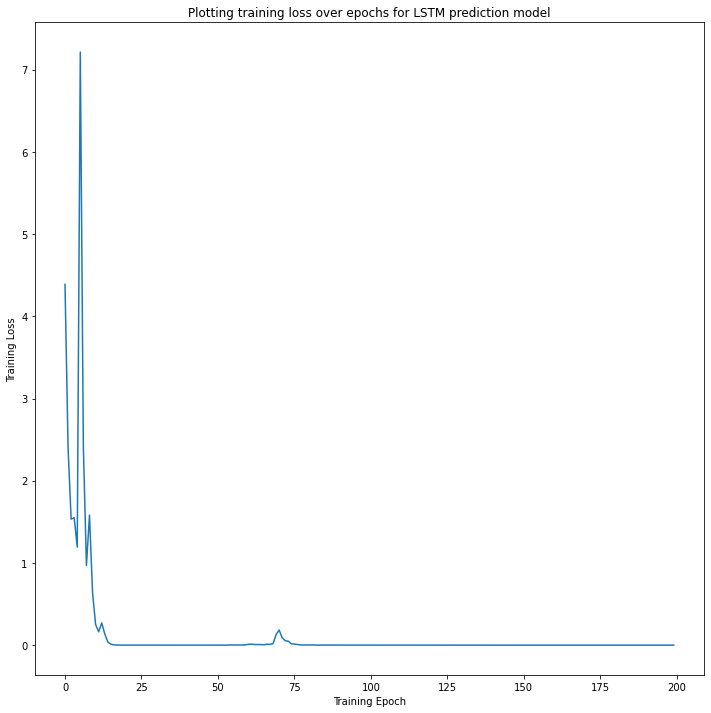

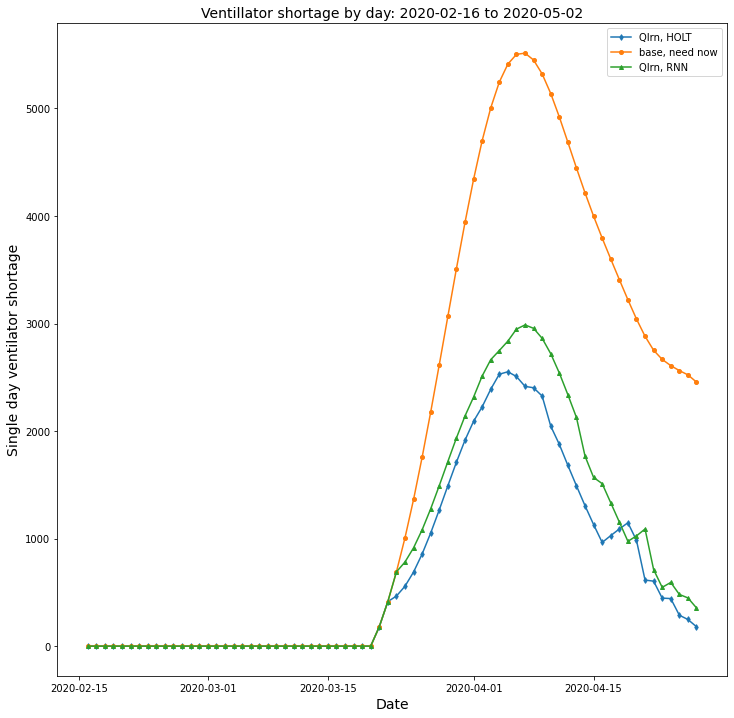

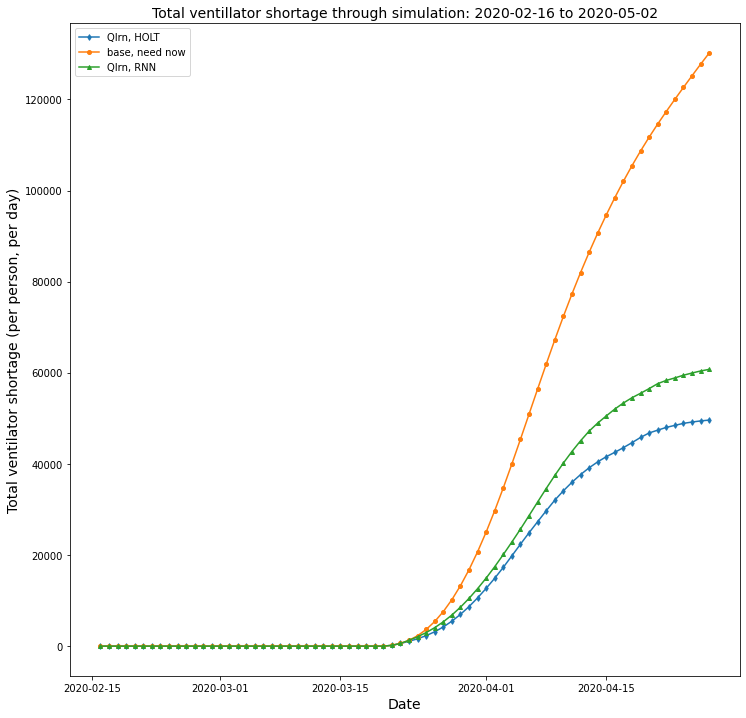

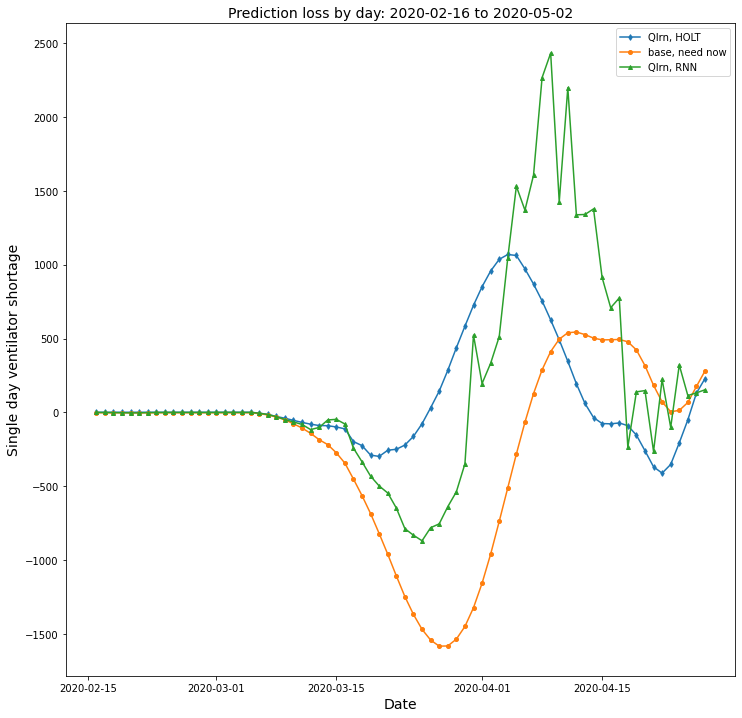

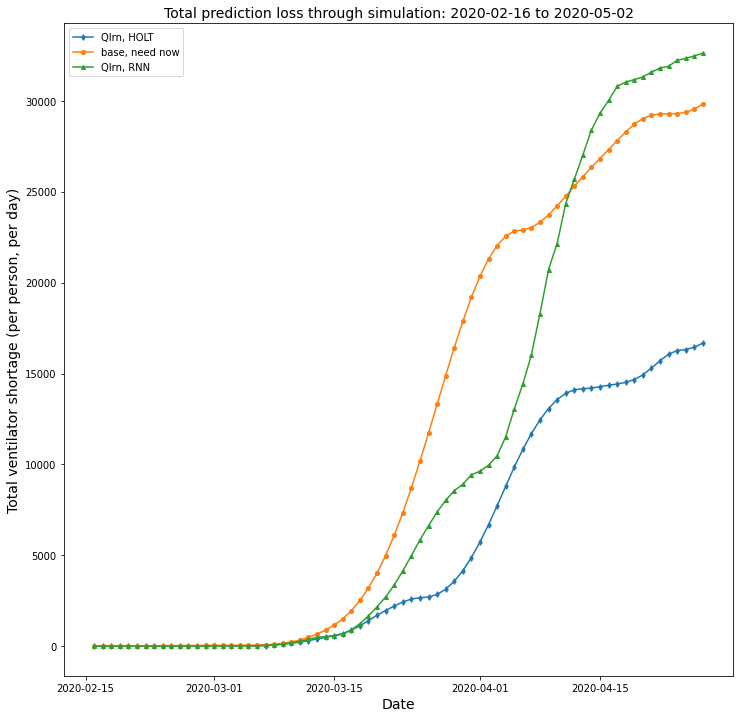

In [907]:
path = './data/'
ihme_path = path + '2020_05_04/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
states = ['California', 'New York', 'Illinois', 'Florida']
states = sorted(list(set(states)))
data_start_date = pd.Timestamp(2020,2,1)
data_end_date = pd.Timestamp(2020,5,2)
sim_start_date = pd.Timestamp(2020,2,16)
prediction_interval = 3
model_list = [-1, 9, 14]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'Alabama', 'Alaska']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_start_date, data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

# prepare primary dataloader
primary_dataLoader = DataManager(data_start_date, data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=True, prediction_analysis=True, LSTMplots=True, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

Initializing data manager class...
Excluding the following from all lists:  []
Initializing data manager class...
Excluding the following from all lists:  ['newICU_upper', 'bedover_upper', 'newICU_lower', 'icuover_lower', 'bedover_lower', 'newICU_mean', 'icuover_upper', 'deaths_lower', 'admis_lower', 'bedover_mean', 'admis_mean', 'deaths_mean', 'admis_upper', 'deaths_upper', 'icuover_mean', 'Observed_DOA_CDC']
Running simulation for model:  [1, 4, 9]
Running simulation for model:  [0, -1, -1]
Running simulation for model:  [2, 4, 14]
LSTM input size 94
LSTM Dataloader feature count 94
Global Dataloader feature count 94
epoch:   1 loss: 428.258965895527
epoch:  26 loss: 12.756048539298
epoch:  51 loss: 17.591902944095
epoch:  76 loss: 6.085836538782
epoch: 101 loss: 6.393088307175
epoch: 126 loss: 5.296413732904
epoch: 151 loss: 6.144299565684
epoch: 176 loss: 4.385480478286
epoch: 199 loss: 4.58368847048021
LSTM Successfully Initialized and Trained!
epoch:   1 loss: 4.649355316617
epoc

<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second argument '-1' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second argument '-1' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second

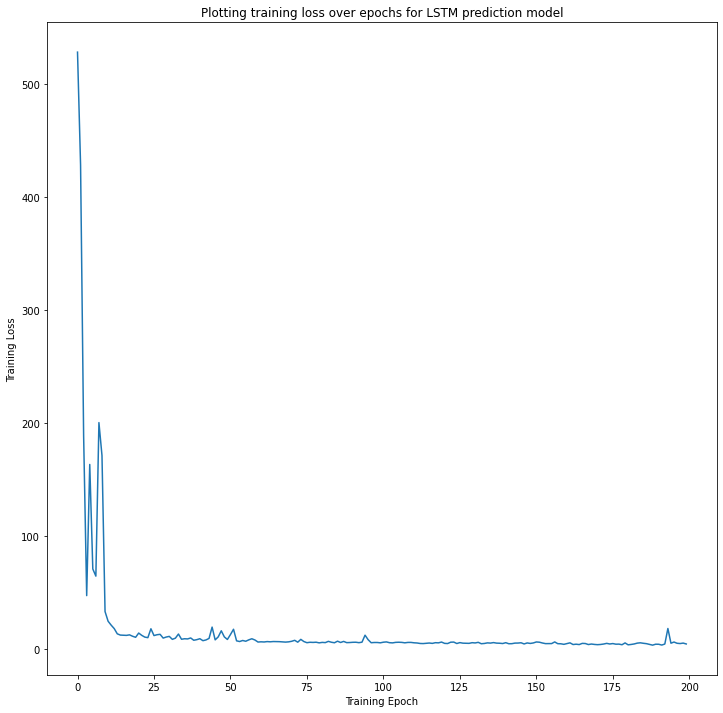

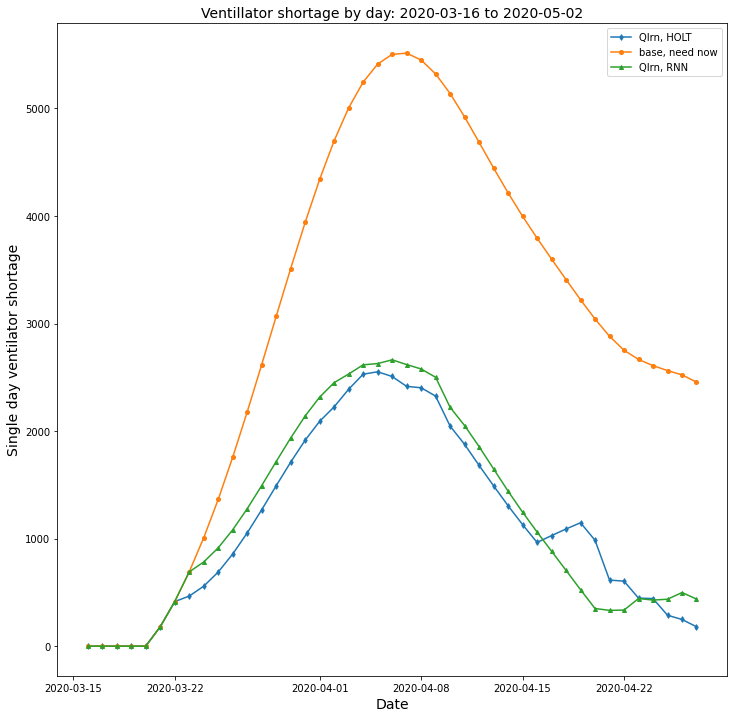

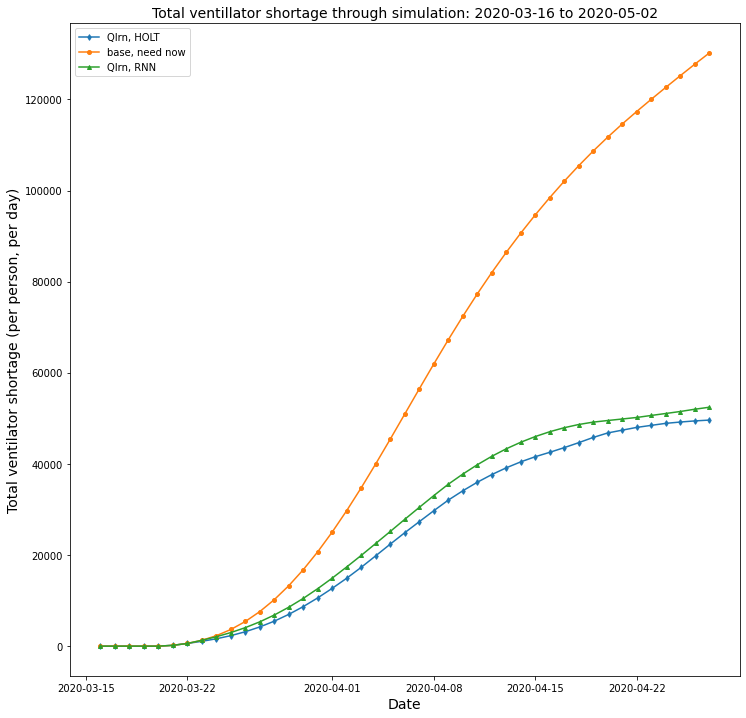

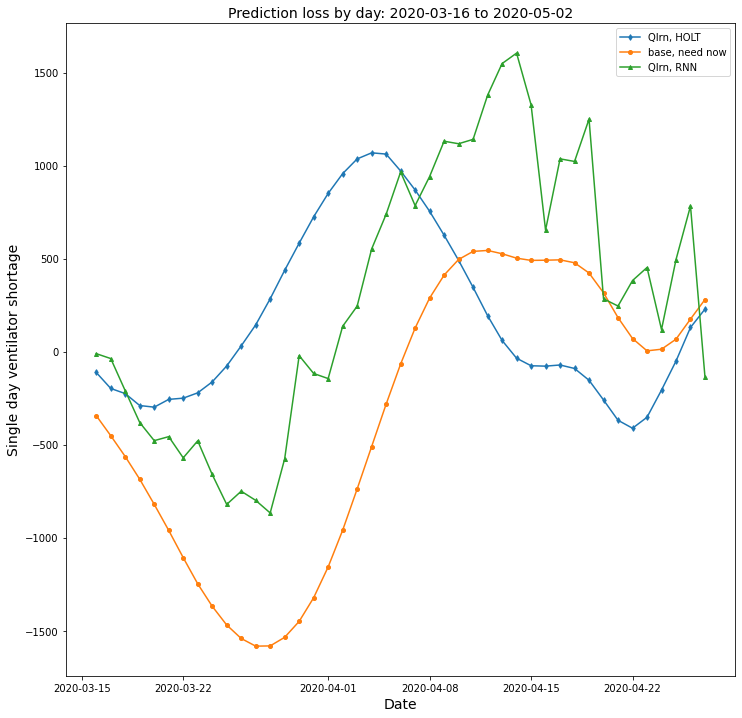

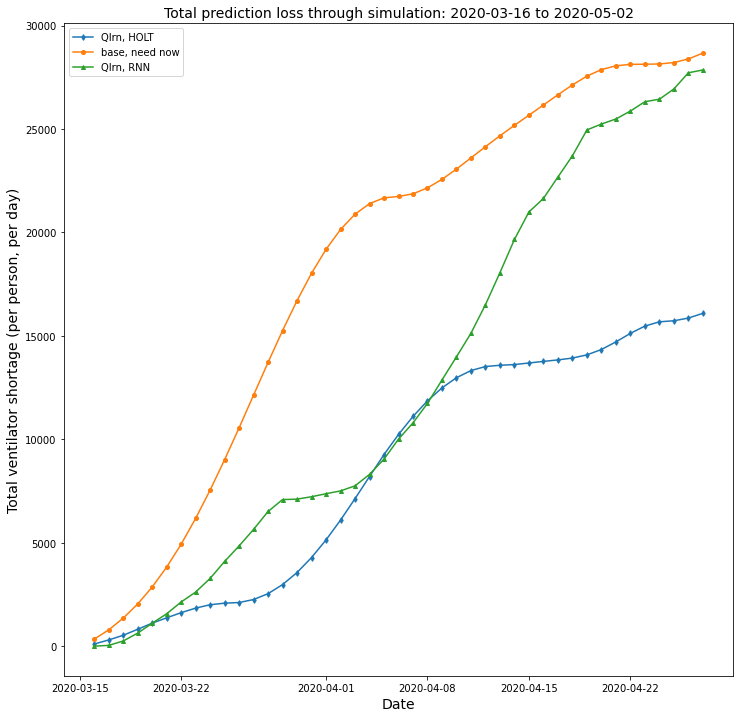

In [908]:
path = './data/'
ihme_path = path + '2020_05_04/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
states = ['California', 'New York', 'Illinois', 'Florida']
states = sorted(list(set(states)))
data_start_date = pd.Timestamp(2020,2,1)
data_end_date = pd.Timestamp(2020,5,2)
sim_start_date = pd.Timestamp(2020,3,16)
prediction_interval = 3
model_list = [-1, 9, 14]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'Alabama', 'Alaska']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_start_date, data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

# prepare primary dataloader
primary_dataLoader = DataManager(data_start_date, data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=True, prediction_analysis=True, LSTMplots=True, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

Initializing data manager class...
Excluding the following from all lists:  []
Initializing data manager class...
Excluding the following from all lists:  ['newICU_upper', 'bedover_upper', 'newICU_lower', 'icuover_lower', 'bedover_lower', 'newICU_mean', 'icuover_upper', 'deaths_lower', 'admis_lower', 'bedover_mean', 'admis_mean', 'deaths_mean', 'admis_upper', 'deaths_upper', 'icuover_mean', 'Observed_DOA_CDC']
Running simulation for model:  [0, 0, 0]
Running simulation for model:  [0, 1, 1]
Running simulation for model:  [0, 2, 2]
Running simulation for model:  [0, 3, 3]
Running simulation for model:  [0, 4, 4]
Running simulation for model:  [1, 0, 5]
Running simulation for model:  [1, 1, 6]
Running simulation for model:  [1, 2, 7]
Running simulation for model:  [1, 3, 8]
Running simulation for model:  [1, 4, 9]
Running simulation for model:  [2, 0, 10]
LSTM input size 94
LSTM Dataloader feature count 94
Global Dataloader feature count 94
epoch:   1 loss: 2.030441474849
epoch:  26 loss

<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second argument '1' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second argument '2' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second a

Model  0  total policy loss:  66876.90316190477
Model  1  total policy loss:  66889.39264888168
Model  2  total policy loss:  64317.749171103904
Model  3  total policy loss:  61433.93541024531
Model  4  total policy loss:  54820.592056673886
Model  5  total policy loss:  57652.51467445888
Model  6  total policy loss:  60777.90311295094
Model  7  total policy loss:  59774.62041829005
Model  8  total policy loss:  52935.37665692641
Model  9  total policy loss:  49611.115055735936
Model  10  total policy loss:  61751.47581017317
Model  11  total policy loss:  67700.88717748917
Model  12  total policy loss:  62618.73750750361
Model  13  total policy loss:  57420.34763845599
Model  14  total policy loss:  57587.71983502887
Model  -1  total policy loss:  130148.899
Model:  0  RMSE:  4611.639904914783
Model:  1  RMSE:  4611.639904914783
Model:  2  RMSE:  4611.639904914783
Model:  3  RMSE:  4611.639904914783
Model:  4  RMSE:  4611.639904914783
Model:  5  RMSE:  4184.016952335831
Model:  6  RMS

<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second argument '1' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second argument '2' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-905-0721cbaaee55>:603: RuntimeWarning: Second a

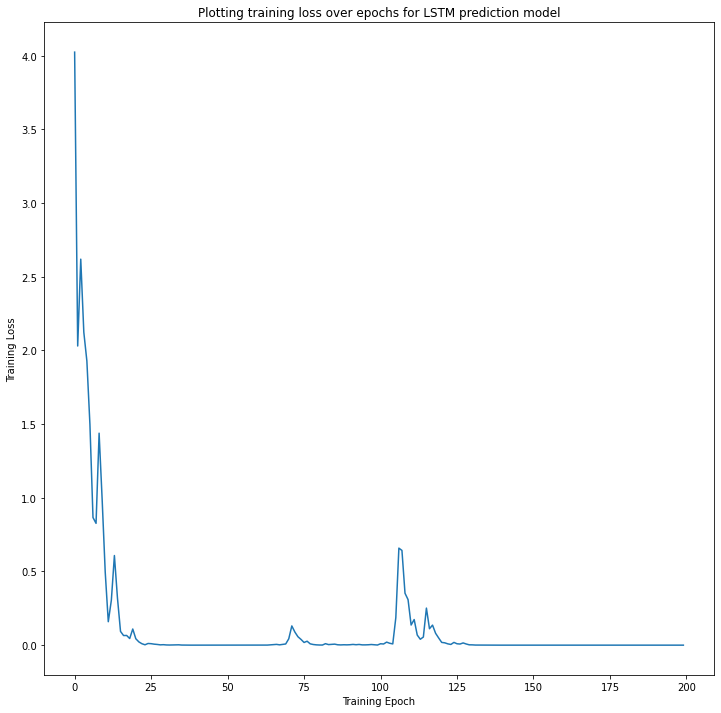

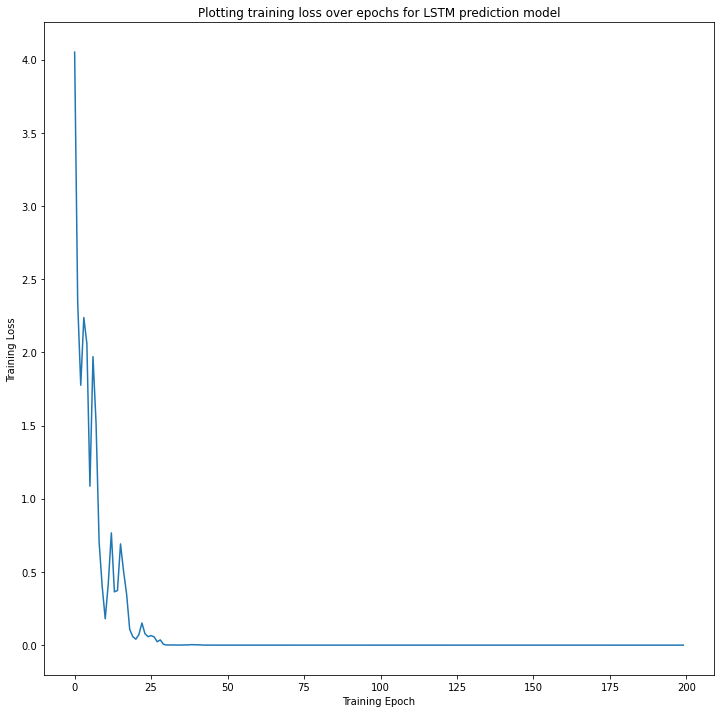

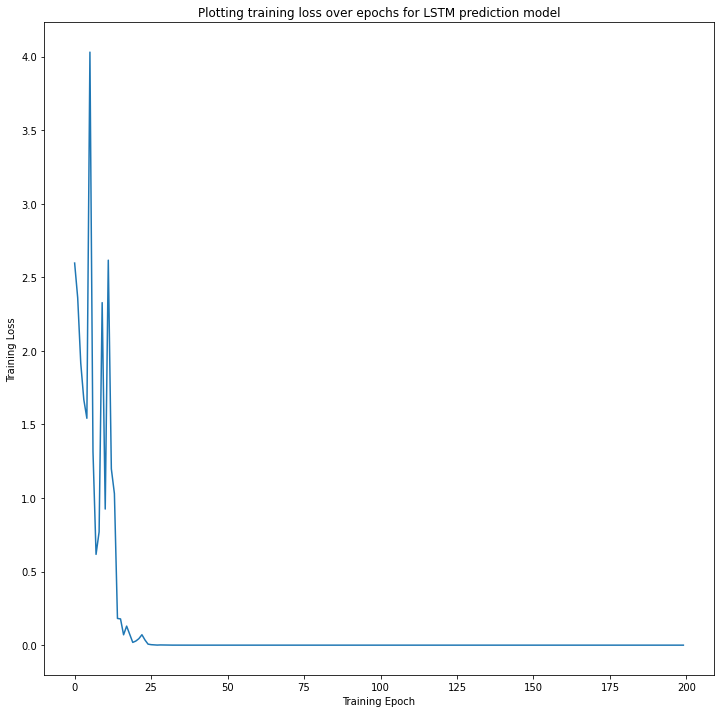

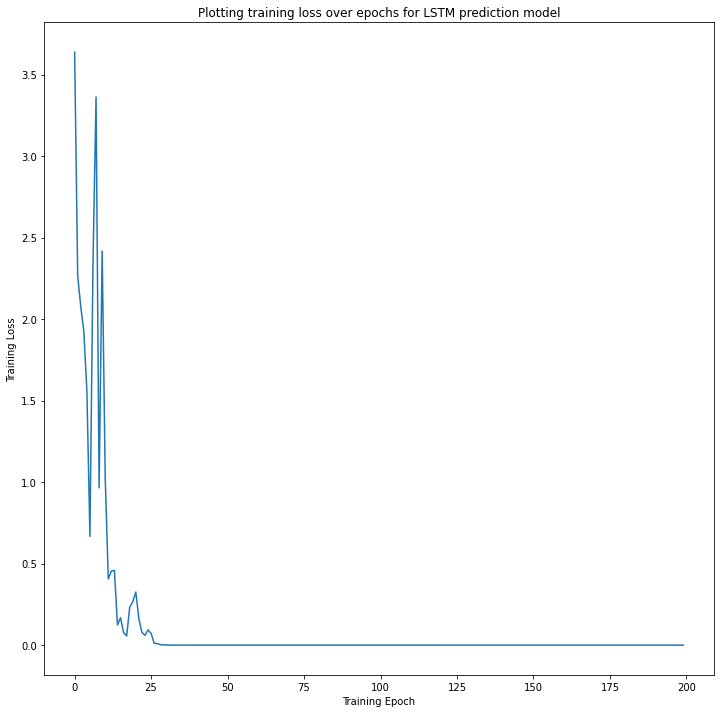

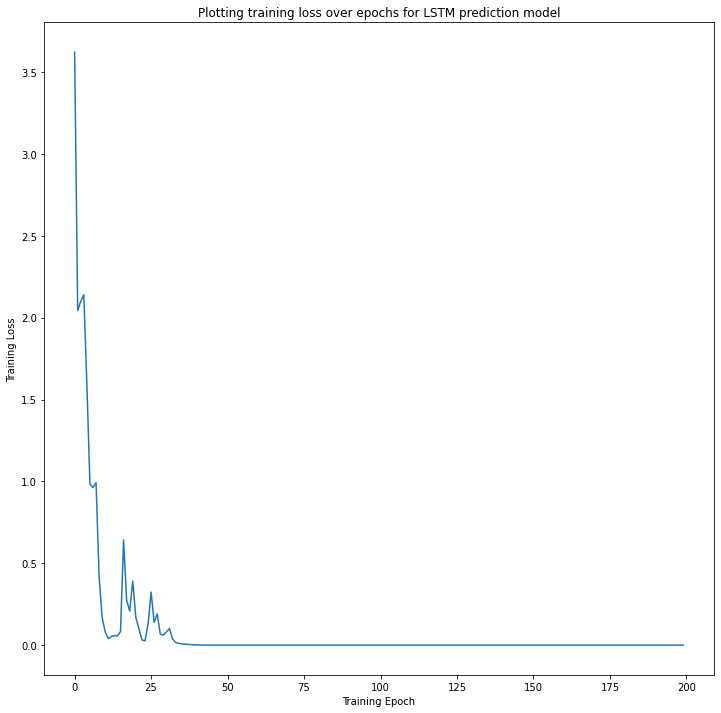

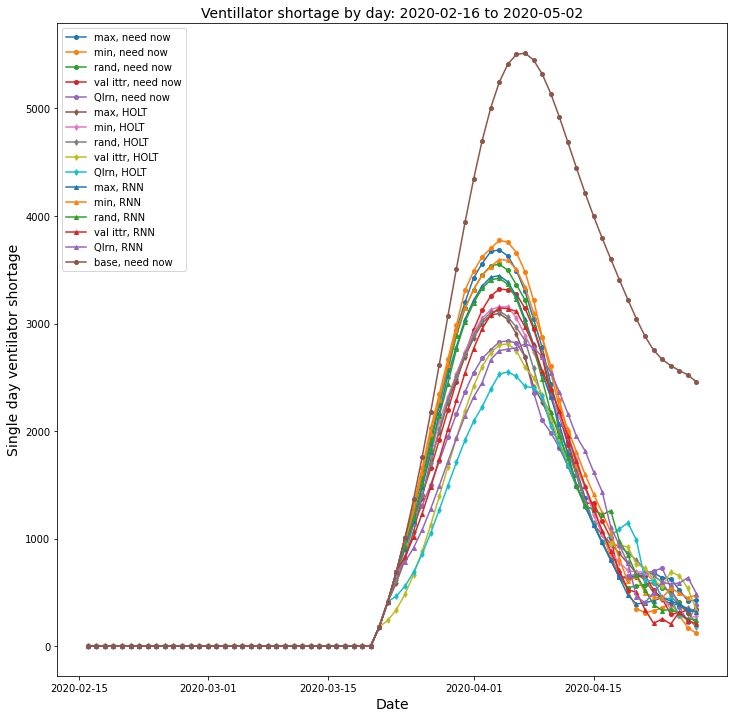

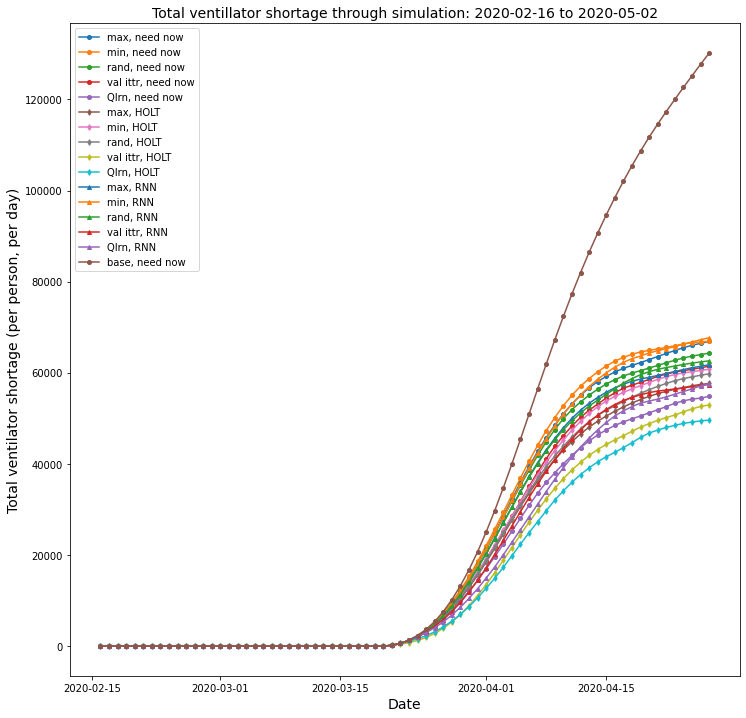

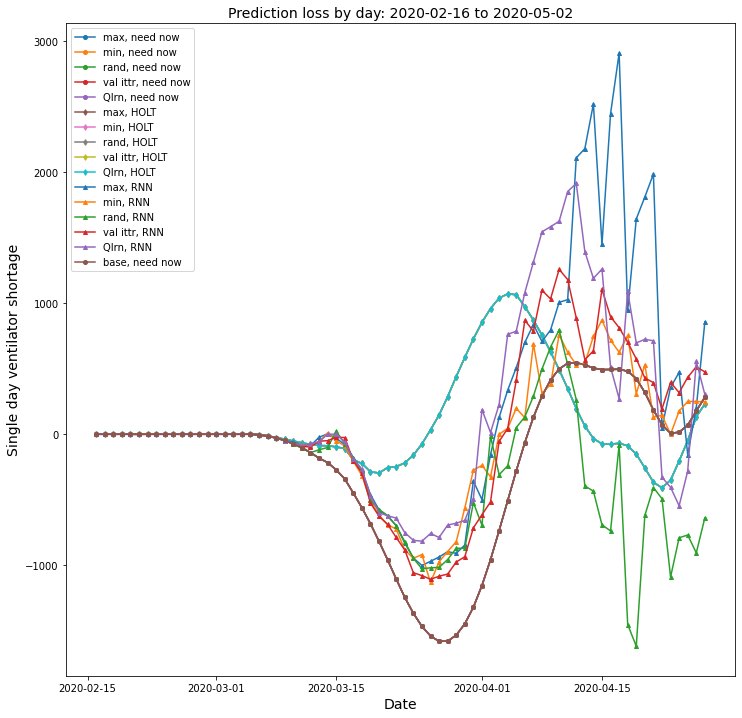

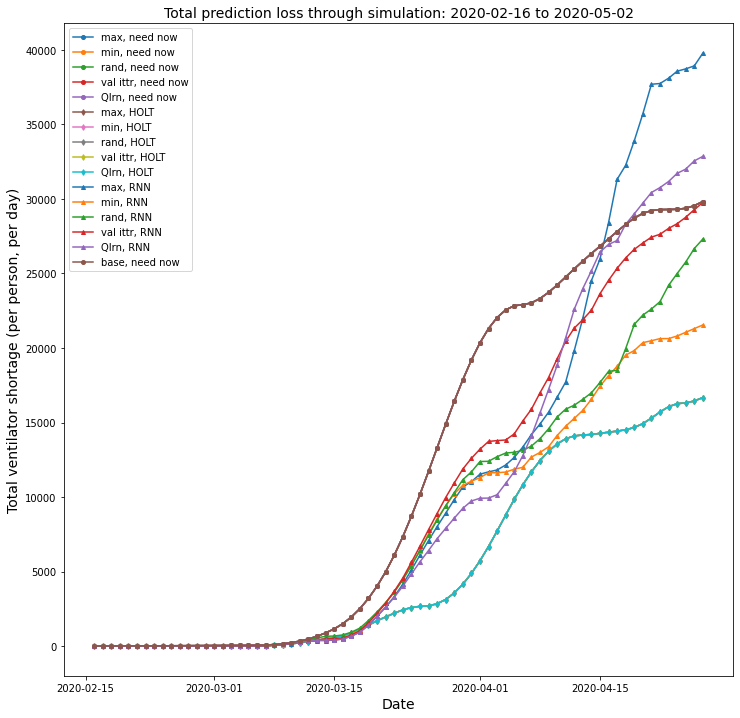

In [909]:
path = './data/'
ihme_path = path + '2020_05_04/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
states = ['California', 'New York', 'Illinois', 'Florida']
states = sorted(list(set(states)))
data_start_date = pd.Timestamp(2020,2,1)
data_end_date = pd.Timestamp(2020,5,2)
sim_start_date = pd.Timestamp(2020,2,16)
prediction_interval = 3
#model_list = [-1, 0, 1, 2, 3, 4]
model_list = [-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'Alabama', 'Alaska']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_start_date, data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

# prepare primary dataloader
primary_dataLoader = DataManager(data_start_date, data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=True, prediction_analysis=True, LSTMplots=True, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

### HOLT MODEL RUNS

Initializing data manager class...
Excluding the following from all lists:  []
Initializing data manager class...
Excluding the following from all lists:  ['newICU_mean', 'newICU_lower', 'icuover_mean', 'deaths_upper', 'admis_mean', 'icuover_upper', 'icuover_lower', 'deaths_mean', 'deaths_lower', 'newICU_upper', 'bedover_upper', 'bedover_mean', 'admis_lower', 'admis_upper', 'Observed_DOA_CDC', 'bedover_lower']
Running simulation for model:  [1, 0, 5]
Running simulation for model:  [1, 1, 6]
Running simulation for model:  [1, 2, 7]
Running simulation for model:  [1, 3, 8]
Running simulation for model:  [1, 4, 9]


<ipython-input-18-20202f2f0499>:604: RuntimeWarning: Second argument '8' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-18-20202f2f0499>:604: RuntimeWarning: Second argument '8' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)
<ipython-input-18-20202f2f0499>:604: RuntimeWarning: Second argu

Model  5  total policy loss:  25223.873395238094
Model  6  total policy loss:  26811.685833982683
Model  7  total policy loss:  26540.40961190476
Model  8  total policy loss:  15791.971453968255
Model  9  total policy loss:  1635.6032755411302
Model:  5  RMSE:  4184.016952335831
Model:  6  RMSE:  4184.016952335831
Model:  7  RMSE:  4184.016952335831
Model:  8  RMSE:  4184.016952335831
Model:  9  RMSE:  4184.016952335831
Model  5  total prediction loss:  16674.532529178556
Model  6  total prediction loss:  16674.532529178556
Model  7  total prediction loss:  16674.532529178556
Model  8  total prediction loss:  16674.532529178556
Model  9  total prediction loss:  16674.532529178556


<ipython-input-18-20202f2f0499>:604: RuntimeWarning: Second argument '8' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  plt.plot(df.index, model_col, data=df, label=self.model_names[model_col], marker=marker, markersize=4)


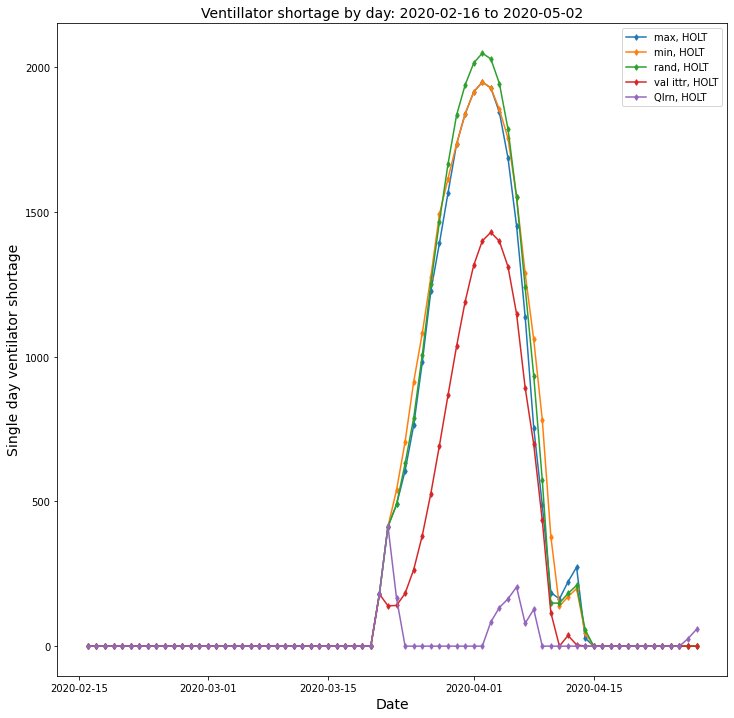

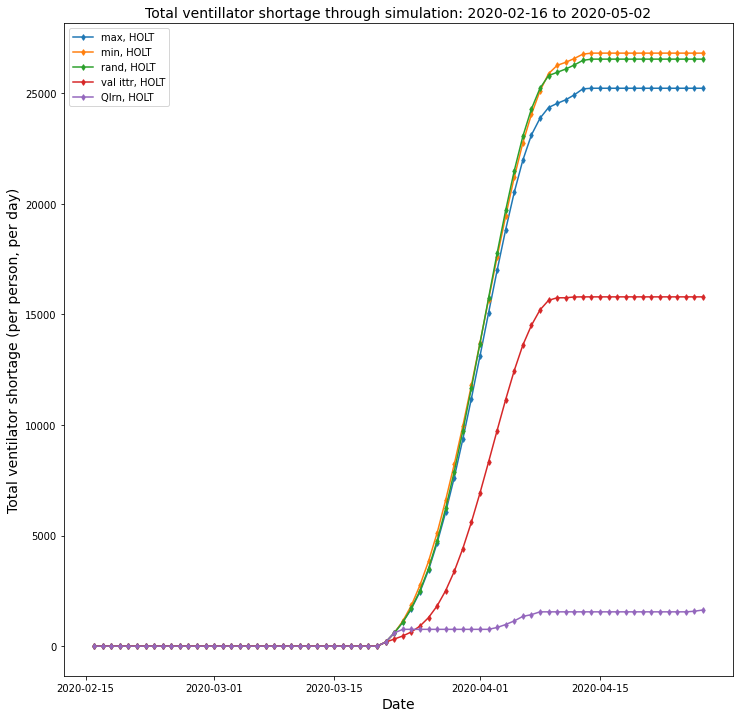

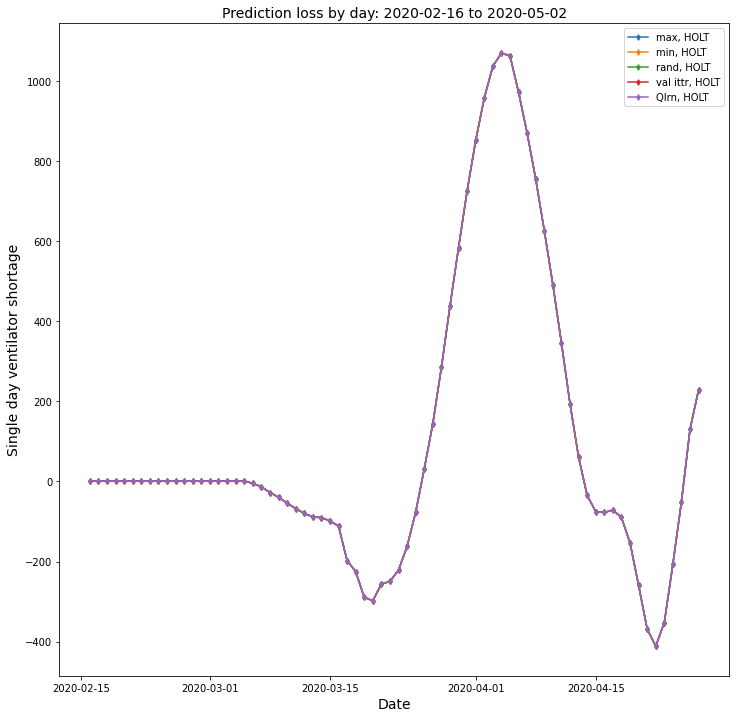

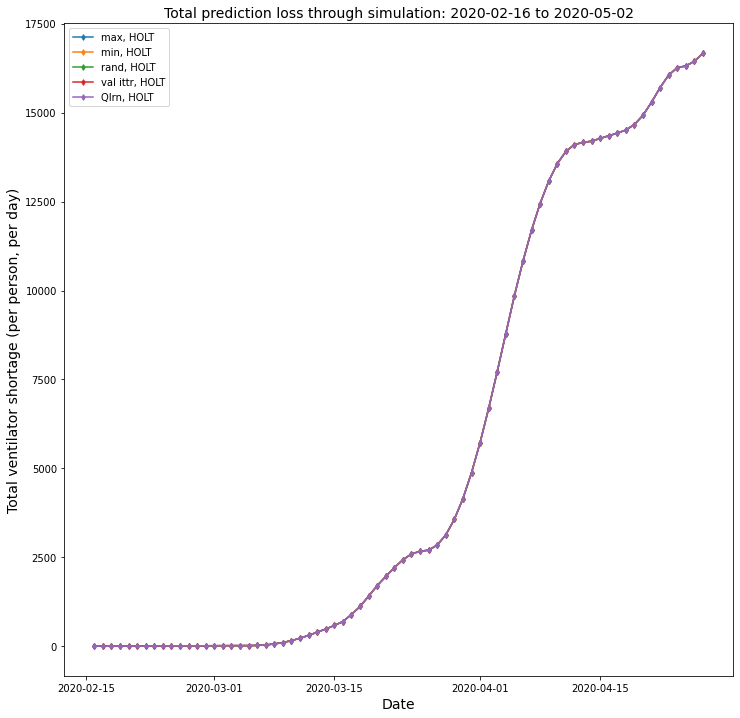

In [19]:
path = './data/'
ihme_path = path + '2020_05_04/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
states = ['California', 'New York', 'Illinois', 'Florida']
states = sorted(list(set(states)))
data_start_date = pd.Timestamp(2020,2,1)
data_end_date = pd.Timestamp(2020,5,2)
sim_start_date = pd.Timestamp(2020,2,16)
prediction_interval = 3
#model_list = [-1, 0, 1, 2, 3, 4]
model_list = [5, 6, 7, 8, 9]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'Alabama', 'Alaska']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_start_date, data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

# prepare primary dataloader
primary_dataLoader = DataManager(data_start_date, data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=True, prediction_analysis=True, LSTMplots=True, include_federal=True, proxy_reward=1, collect_modeling_data = True, model_select = None)

In [921]:
track_states, loss_summary, model_string_list = model_comparison_simulator_short.get_analysis_data()

In [922]:
best_performers_short1 = model_comparison_simulator_short.best_model_lossgrad(filter_period = 1)

Number of model changes:  17


In [923]:
best_performers_short2 = model_comparison_simulator_short.best_model_lossgrad(filter_period = 2)

Number of model changes:  15


In [924]:
best_performers_short3 = model_comparison_simulator_short.best_model_lossgrad(filter_period = 3)

Number of model changes:  16


In [925]:
best_performers_short4 = model_comparison_simulator_short.best_model_lossgrad(filter_period = 4)

Number of model changes:  12


In [926]:
best_performers_short5 = model_comparison_simulator_short.best_model_lossgrad(filter_period = 5)

Number of model changes:  9


In [927]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short1)

Running simulation for model:  [-100, -100, 42]
Model  42  total policy loss:  54887.65100880232


In [928]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short2)

Running simulation for model:  [-100, -100, 42]
Model  42  total policy loss:  55204.85452460318


In [929]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short3)

Running simulation for model:  [-100, -100, 42]
Model  42  total policy loss:  55914.41677950939


In [930]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short4)

Running simulation for model:  [-100, -100, 42]
Model  42  total policy loss:  55878.30567546898


In [931]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short5)

Running simulation for model:  [-100, -100, 42]
Model  42  total policy loss:  57123.43176017316


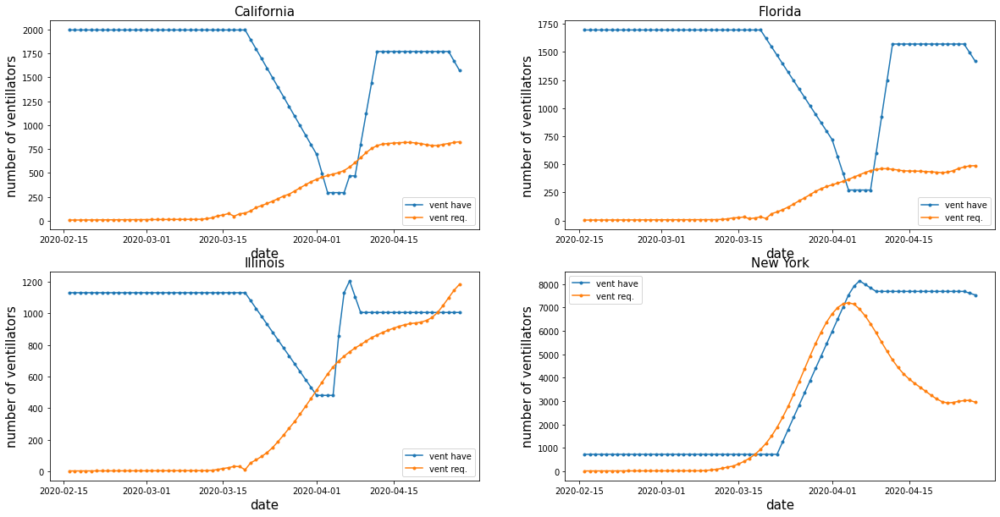

In [20]:
model_comparison_simulator_short.display_state_histories(model_num = 9, plot_cols = 2)

In [ ]:
model_comparison_simulator_short

In [911]:
track_states, loss_summary, model_string_list = model_comparison_simulator_short.get_analysis_data()

In [932]:
best_performers_short1 = model_comparison_simulator_short.best_model_lossmag(filter_period = 1)

Number of model changes:  12


In [933]:
best_performers_short2 = model_comparison_simulator_short.best_model_lossmag(filter_period = 2)

Number of model changes:  12


In [934]:
best_performers_short3 = model_comparison_simulator_short.best_model_lossmag(filter_period = 3)

Number of model changes:  13


In [935]:
best_performers_short4 = model_comparison_simulator_short.best_model_lossmag(filter_period = 4)

Number of model changes:  12


In [936]:
best_performers_short5 = model_comparison_simulator_short.best_model_lossmag(filter_period = 5)

Number of model changes:  9


In [937]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short1)

Running simulation for model:  [-100, -100, 42]
Model  42  total policy loss:  55854.381787193364


In [938]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short2)

Running simulation for model:  [-100, -100, 42]
Model  42  total policy loss:  55774.9003754329


In [939]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short3)

Running simulation for model:  [-100, -100, 42]
Model  42  total policy loss:  56204.89470472583


In [940]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short4)

Running simulation for model:  [-100, -100, 42]
Model  42  total policy loss:  55551.39251608947


In [941]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short5)

Running simulation for model:  [-100, -100, 42]
Model  42  total policy loss:  56023.64899227995


In [ ]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short2)

In [ ]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short3)

In [ ]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short4)

In [ ]:
# call simulator|
model_selection_simulator_short = Simulator(data_start_date, data_end_date, sim_start_date, states, [42], primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=False, prediction_analysis=False, LSTMplots=False, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select=best_performers_short5)

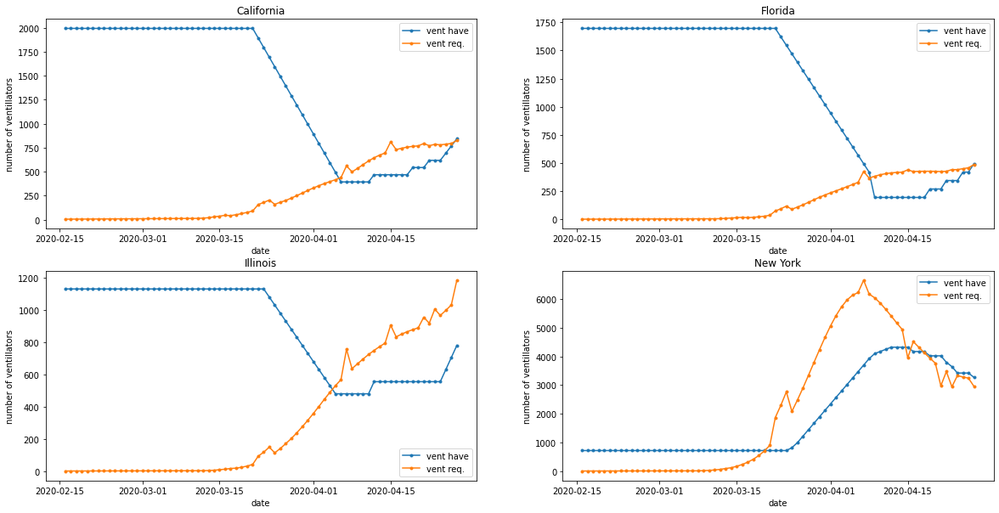

In [904]:
model_selection_simulator_long.display_state_histories(model_num = 42, plot_cols = 2)

Initializing data manager class...
Excluding the following from all lists:  []
Initializing data manager class...
Excluding the following from all lists:  ['newICU_upper', 'bedover_upper', 'newICU_lower', 'icuover_lower', 'bedover_lower', 'newICU_mean', 'icuover_upper', 'deaths_lower', 'admis_lower', 'bedover_mean', 'admis_mean', 'deaths_mean', 'admis_upper', 'deaths_upper', 'icuover_mean', 'Observed_DOA_CDC']
Running simulation for model:  [1, 4, 9]
Model  9  total policy loss:  49611.115055735936
Model:  9  RMSE:  4184.016952335831
Model  9  total prediction loss:  16674.532529178556


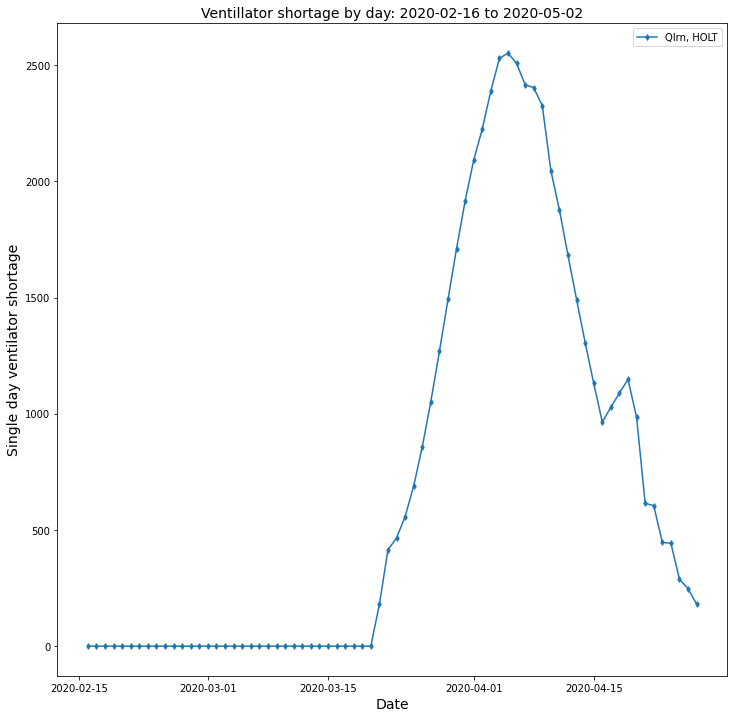

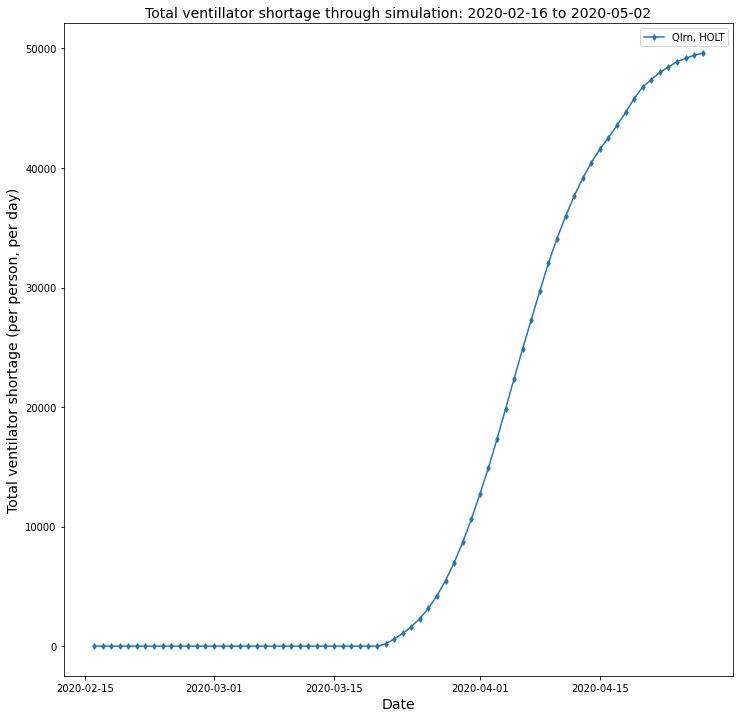

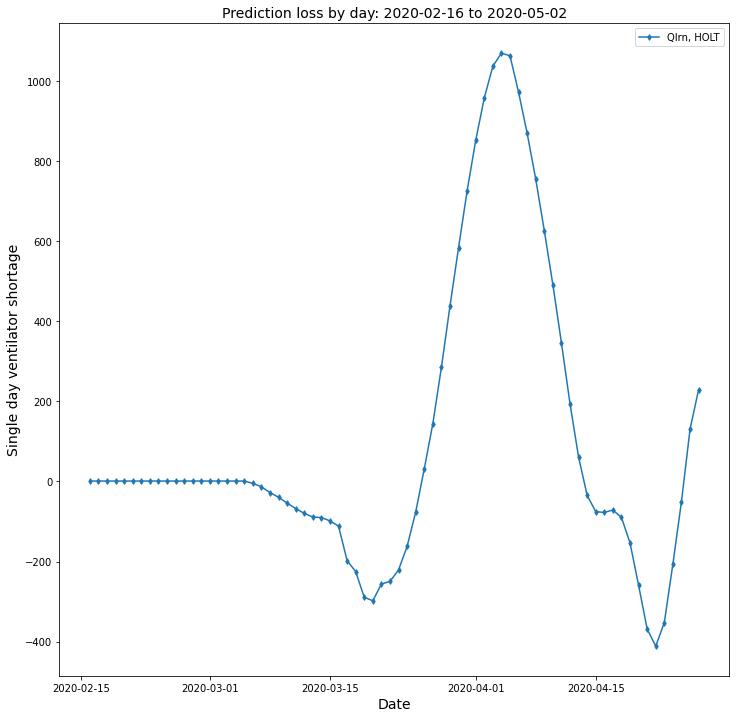

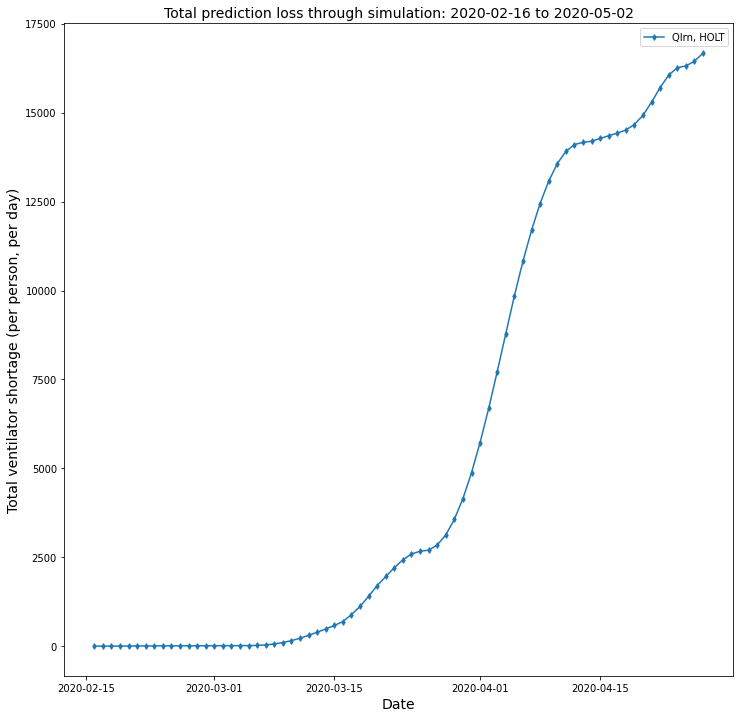

In [955]:
path = './data/'
ihme_path = path + '2020_05_04/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
states = ['California', 'New York', 'Illinois', 'Florida']
states = sorted(list(set(states)))
data_start_date = pd.Timestamp(2020,2,1)
data_end_date = pd.Timestamp(2020,5,2)
sim_start_date = pd.Timestamp(2020,2,16)
prediction_interval = 3
#model_list = [-1, 0, 1, 2, 3, 4]
model_list = [9]

# prepare LSTM pretraining dataLoader
states_path = path + 'State_FIPS.csv'
states_list = pd.read_csv(states_path)['State'].to_numpy()
# The following datasets have incomplete datasets on ihme
delete_list = ['American Samoa', 'Guam', 'Commonwealth of the Northern Mariana Islands', 'Virgin Islands of the United States', 'Puerto Rico', 'Alabama', 'Alaska']
delete_index = []
for item in delete_list:
    delete_index.append(np.where(states_list == item))
states_list = np.delete(states_list, delete_index)
LSTM_dataloader = DataManager(data_start_date, data_end_date, states_list, path, ihme_path, prediction_interval, verbose=0)
dataloader_nan_columns = LSTM_dataloader.public_nan_columns()
LSTM_data_scaler, LSTM_label_scaler = LSTM_dataloader.public_scalers()

# prepare primary dataloader
primary_dataLoader = DataManager(data_start_date, data_end_date, states, path, ihme_path, prediction_interval, verbose=0, nan_columns=dataloader_nan_columns, data_scaler=LSTM_data_scaler, label_scaler=LSTM_label_scaler)

# call simulator
model_comparison_simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, primary_dataLoader, LSTM_dataloader, prediction_interval, path,\
                      ihme_path, loss_plots=True, prediction_analysis=True, LSTMplots=True, include_federal=False, proxy_reward=1, collect_modeling_data = True, model_select = None)

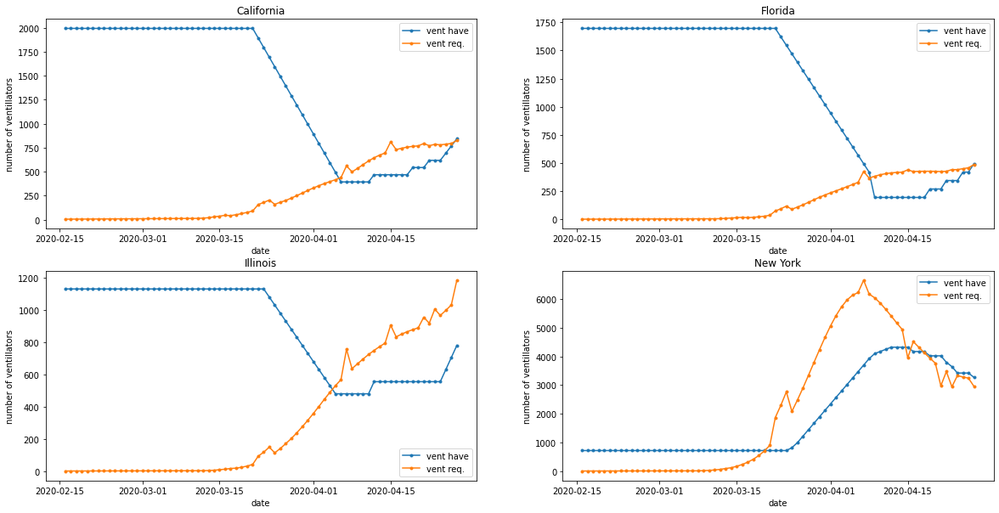

In [956]:
model_selection_simulator.display_state_histories(model_num = 42, plot_cols = 2)

### Holt prediction accuracy analysis:

Initializing data manager class...
Excluding the following from all lists:  ['bedover_upper', 'icuover_lower', 'bedover_lower', 'icuover_mean', 'bedover_mean', 'icuover_upper', 'Observed_DOA_CDC']
initializing all required models
[4]
Running simulation for model:  (1, 0)
Begin simulation loop for model:  (1, 0)  date:  2020-02-08 00:00:00
Number of entries: (7, 7)
holt predictor called
Transfer buffer out, loop:  0
[[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]]
current loss: 20.81861094602788
current sum loss: 20.81861094602788
Transfer buffer in, loop:  0
[[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 2. 1. 1. 4. 1. 5. 2.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0

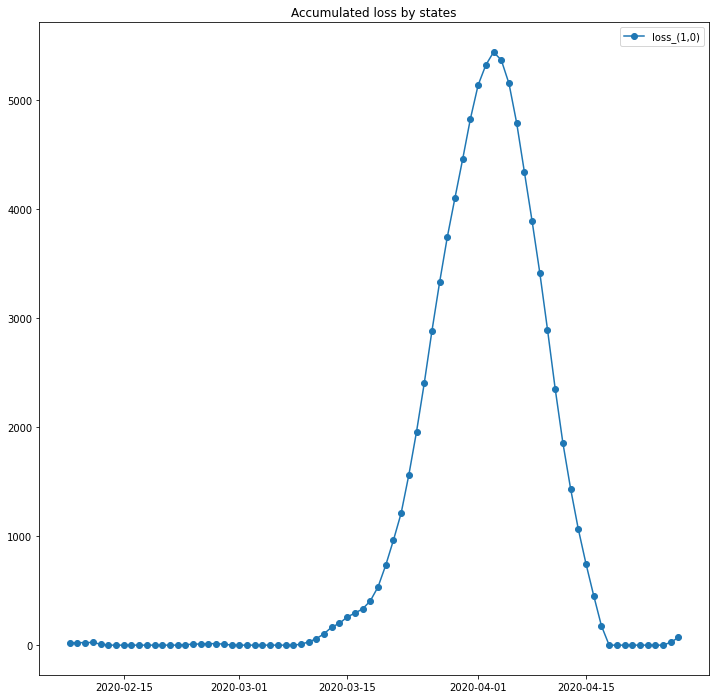

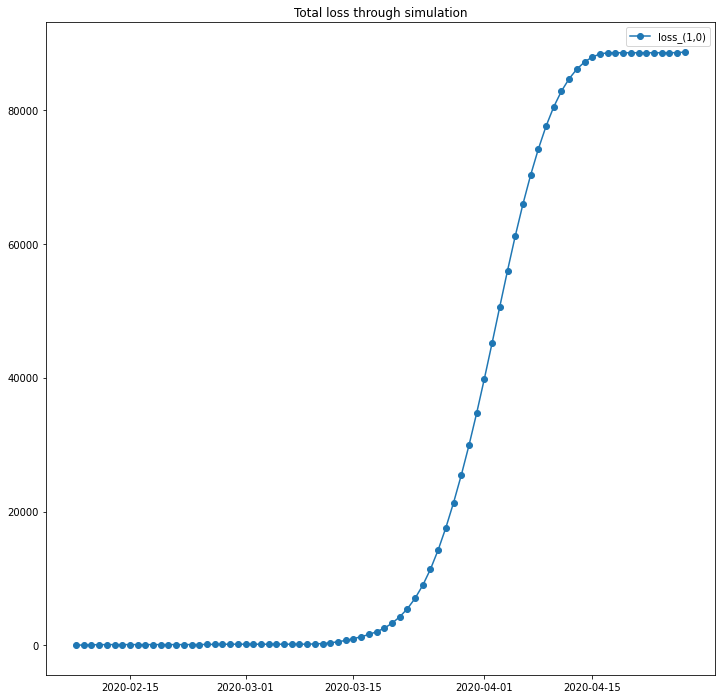

In [196]:
# one week of prior data
path = './data/'
ihme_path = path + '2020_05_04/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
states = sorted(list(set(states)))
data_start_date = pd.Timestamp(2020,2,1)
data_end_date = pd.Timestamp(2020,5,2)
sim_start_date = pd.Timestamp(2020,2,8)
prediction_interval = 3

# pass any combination of the following, repeat models will be dropped
# -1 = (0, -1) baseline, do nothing (immediate need)
# 0 = max_allocate_first (immediate need)
# 1 = min_allocate_first (immediate need)
# 2 = random_allocation  (immediate need)
# 3 = value_iteration    (immediate need)
# 4 = max_allocate_first (Holt - univariate linear prediction)
# 5 = min_allocate_first (Holt - univariate linear prediction)
# 6 = random_allocation  (Holt - univariate linear prediction)
# 7 = value_iteration    (Holt - univariate linear prediction)
# 8 = max_allocate_first (RNN - multivariate supervised learning)
# 9 = min_allocate_first (RNN - multivariate supervised learning)
# 10 = random_allocation  (RNN - multivariate supervised learning)
# 11 = value_iteration    (RNN - multivariate supervised learning)

model_list = [4]
dataLoader = DataManager(data_start_date, data_end_date, states, path, ihme_path, prediction_interval)
simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, dataLoader, prediction_interval, path, ihme_path)

Initializing data manager class...
Initializing CDC_Parser object, reading: ./data/Excess_Deaths_Associated_with_COVID-19.csv
Initializing PM_Parser object, reading datasets from: ./data/
Initializing CDC_Parser object, reading: ./data/Excess_Deaths_Associated_with_COVID-19.csv
Initializing PM_Parser object, reading datasets from: ./data/
Initializing CDC_Parser object, reading: ./data/Excess_Deaths_Associated_with_COVID-19.csv
Initializing PM_Parser object, reading datasets from: ./data/
Initializing CDC_Parser object, reading: ./data/Excess_Deaths_Associated_with_COVID-19.csv
Initializing PM_Parser object, reading datasets from: ./data/
Initializing CDC_Parser object, reading: ./data/Excess_Deaths_Associated_with_COVID-19.csv
Initializing PM_Parser object, reading datasets from: ./data/
Initializing CDC_Parser object, reading: ./data/Excess_Deaths_Associated_with_COVID-19.csv
Initializing PM_Parser object, reading datasets from: ./data/
Initializing CDC_Parser object, reading: ./data

/home/bryanbed/Environments/238_Project/lib/python3.8/site-packages/statsmodels/tsa/holtwinters.py:743: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warn("Optimization failed to converge. Check mle_retvals.",
/home/bryanbed/Environments/238_Project/lib/python3.8/site-packages/statsmodels/tsa/holtwinters.py:743: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warn("Optimization failed to converge. Check mle_retvals.",
/home/bryanbed/Environments/238_Project/lib/python3.8/site-packages/statsmodels/tsa/holtwinters.py:743: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warn("Optimization failed to converge. Check mle_retvals.",
/home/bryanbed/Environments/238_Project/lib/python3.8/site-packages/statsmodels/tsa/holtwinters.py:743: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warn("Optimization failed to converge. Check mle_retvals.",
/home/bryanbed/Environments/238_Project/lib/pyth

Holt predictor RMSE across all states: 128.30061963637075
129.49453208114966
825.6899578159803
487.83754516138043
1185.0853369675215
1259.58361965427
2953.8164495424962
31.244247415099586
402.27227271191066
163.367358273955


NameError: name 'vent_needed' is not defined

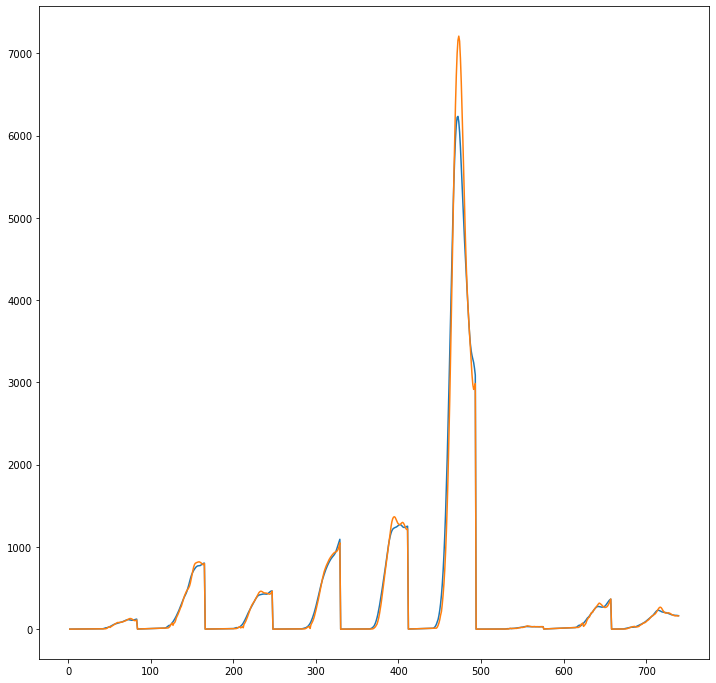

In [82]:
path = './data/'
ihme_path = path + '2020_05_04/'
states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
#states = ['California']
states = sorted(list(set(states)))
data_start_date = pd.Timestamp(2020,2,1)
data_end_date = pd.Timestamp(2020,5,2)
sim_start_date = pd.Timestamp(2020,5,1)
prediction_interval = 3
# 0 = max_allocate_first (no learning)
# 1 = max_allocate_first (Holt - univariate linear prediction)
# 2 = max_allocate_first (RNN - multivariate supervised learning)
model_list = [3]
dataLoader = DataManager(data_start_date, data_end_date, states, path, ihme_path, prediction_interval)
simulator = Simulator(data_start_date, data_end_date, sim_start_date, states, model_list, dataLoader, prediction_interval, path)
#simulator.initialize_models()
#simulator.train_inference_models(dataLoader, )

#### <font color='red'> Saved for reference: VAR (broken), ARISA (broken), HOLT (works, univariate), LSTM (alternate implementation, broken)

# Vector Autoregression Model
### BROKEN
### difference and variance issues

In [ ]:
# split into train and test sets
def VAR_predictor(X, Y, steps, train_days, scaler):
    y_pred = []
    y_true = []
    total_days = X.shape[0]
    print(X.shape)
    print(Y.shape)
    trainTotal = np.hstack((X,Y))
    trainTotalpd = pd.DataFrame(trainTotal)
    # drop constants
    trainTotalpd_noconst = trainTotalpd.loc[:, (trainTotalpd != trainTotalpd.iloc[0]).any()]
    trainTotal = trainTotalpd_noconst.to_numpy()
    for i in range(total_days-train_days-steps):
        trainData = trainTotal[0:train_days+i,:]
        # fit model
        var_model = VAR(trainData)
        var_model_fit = var_model.fit()
        # make prediction
        yhat = var_model_fit.forecast(var_model_fit.y, steps=steps)
        y_pred.append(yhat[steps-1][-1])
        y_true.append(Y[i+train_days+steps].item())
    return y_pred, y_true


In [ ]:
start_days = 60 # days of data allowed before prediction
y_pred, y_true = VAR_predictor(aggregate_data_float, ICUbed_mean_true, 3, start_days, scaler)
mse = mean_squared_error(y_true, y_pred)
rmse = math.sqrt(mse)
print("RMSE:", rmse)

plt.figure(figsize=(12,12))
plt.plot(ICUbed_mean_true)
plt.plot([None for i in range(start_days)] + [y for y in y_pred])



# ARIMA Model
### BROKEN
### (difference and variance issues)

In [ ]:
# split into train and test sets
def ARIMA_predictor(Y, steps, train_days, scaler):
    y_pred = []
    y_true = []
    total_days = Y.shape[0]
    print(Y.shape)
    Ydf = pd.DataFrame(Y)
    # drop constants
    Ydf_noconst = Ydf.loc[:, (Ydf != Ydf.iloc[0]).any()]
    data = Ydf_noconst.to_numpy()
    for i in range(total_days-train_days-steps):
        trainData = data[0:train_days+i,:]
        # fit model
        ARIMA_model = ARIMA(trainData, order=(1,2,1))
        ARIMA_model_fit = ARIMA_model.fit(disp=False, transparams=False)
        # make prediction
        yhat = ARIMA_model_fit.predict(i+train_days+steps, typ='levels')
        y_pred.append(yhat[steps-1])
        y_true.append(Y[i+train_days+steps].item())
    return y_pred, y_true

In [ ]:
start_days = 50 # days of data allowed before prediction
y_pred, y_true = ARIMA_predictor(ICUbed_mean_true, 3, start_days, scaler)
mse = mean_squared_error(y_true, y_pred)
rmse = math.sqrt(mse)
print("RMSE:", rmse)

plt.figure(figsize=(12,12))
plt.plot(ICUbed_mean_true)
plt.plot([None for i in range(start_days)] + [y for y in y_pred])

# Holt Model
### this one works, but it only uses past data from the field it is predicting
#### 2 ways to run it
#### 1) run it over the entire data set for a single state to compare the RMSE
#### 2) run it for a single prediction x days out

In [30]:
path = './data/'
ihme_path = path + '2020_05_04/'
state = 'California'
data_start_date = pd.Timestamp(2020,2,1)
data_end_date = pd.Timestamp(2020,5,2)
aggregate_data = combine_statewise_data(state,data_start_date,data_end_date,path,ihme_path,0)

# Additional possible pre-processing:
# 1) drop unnecessary fields
#drop_col = ['V1','total_tests_data_type']
#nan_col = report_nan_columns(aggregate_data)
#comb_col = list(set(drop_col + nan_col))
#aggregate_data = drop_fields(aggregate_data,comb_col)
# 2.0) convert state names to FIPS code (from PolicyMap data - see additional csv in ./data)
aggregate_data = state_to_fips(aggregate_data, path)
# 2.5) convert FIPS to one-hot encoding
#      Note: not needed for single-state predictions. Placeholder for LSTM
# 3.0) Convert all data fields to floats
exclude_columns = ['location_name', 'date', 'total_tests_data_type']
aggregate_data = convert_to_float(aggregate_data, exclude_columns)
#aggregate_data = aggregate_data.astype('float32')
# 4.0) normalize numerical columns between [0:1]
#      note: not needed for Holt model
#scaler = MinMaxScaler(feature_range=(0, 1))
#aggregate_data= scaler.fit_transform(aggregate_data)

# get our clean dataset and true values according to prediction interval
prediction_interval = 3 # 3 days = 72 hours
aggregate_data, ICUbed_mean_true, ICUbed_lower_true, ICUbed_upper_true = trim_and_true_values(aggregate_data, prediction_interval)

# make sure all data values are floats
#aggregate_data_float = aggregate_data_clipped.astype('float32')
#ICUbed_mean_true = ICUbed_mean_true.astype('float32')
#ICUbed_lower_true = ICUbed_lower_true.astype('float32')
#ICUbed_upper_true = ICUbed_upper_true.astype('float32')

# Normalize data between [0:1]
#scaler = MinMaxScaler(feature_range=(0, 1))
#print(aggregate_data_clipped.shape)
#aggregate_data_scaled = scaler.fit_transform(aggregate_data_float)
#ICUbed_mean_true_scaled = scaler.fit_transform(ICUbed_mean_float.values.reshape(-1,1))
#ICUbed_lower_true_scaled = scaler.fit_transform(ICUbed_lower_float.values.reshape(-1,1))
#ICUbed_upper_true_scaled = scaler.fit_transform(ICUbed_upper_true.values.reshape(-1,1))

# make sure we're groovy
print(aggregate_data.shape)
print(ICUbed_mean_true.shape)
print(ICUbed_lower_true.shape)
print(ICUbed_upper_true.shape)

print(aggregate_data)

Initializing CDC_Parser object, reading: ./data/Excess_Deaths_Associated_with_COVID-19.csv
Initializing PM_Parser object, reading datasets from: ./data/
(86, 37)
(86,)
(86,)
(86,)
        V1 location_name       date  allbed_mean  allbed_lower  allbed_upper  \
0   7512.0             6 2020-02-04     1.000000      1.000000      1.000000   
1   7513.0             6 2020-02-05     2.619387      2.157895      3.224013   
2   7514.0             6 2020-02-06     4.238773      3.315789      5.448026   
3   7515.0             6 2020-02-07     5.858160      4.473684      7.672040   
4   7516.0             6 2020-02-08     7.477546      5.631579      9.896052   
..     ...           ...        ...          ...           ...           ...   
81  7593.0             6 2020-04-25  2640.751465   2507.979248   2778.024902   
82  7594.0             6 2020-04-26  2661.766846   2528.937500   2801.012451   
83  7595.0             6 2020-04-27  2684.708008   2549.989990   2880.537598   
84  7596.0          

In [120]:
# split into train and test sets
# train_days set to 0 to use all data available
# if full_range=True, returns the set of predictions and true values
# if full_range-False, returns a single value for 'days_out' in the future, and the most recent value
def holt_predictor(Y, start_date, end_date, days_out, train_days=2, full_range=True):
    if train_days < 2:
        print("Number of training days too small... need more than two days of data you goof")
    y_pred = []
    y_true = []
    total_days = (end_date - start_date).days
    # Ydf = pd.DataFrame(Y)
    # drop constants
    # Ydf_noconst = Ydf.loc[:, (Ydf != Ydf.iloc[0]).any()]
    # data = Ydf_noconst.to_numpy()
    if full_range:
        i = train_days
        while i + days_out <= total_days:
            trainData = Y[0:i]
            # fit model
            holt_model = Holt(trainData, damped=True).fit(smoothing_slope=0.4)
            # make prediction
            yhat = holt_model.predict(i+days_out)
            y_pred.append(yhat.item())
            y_true.append(Y[i+days_out].item())
            i += 1
    else:
        i = total_days
        trainData = Y[0:i]
        # fit model
        holt_model = Holt(trainData, damped=True).fit(smoothing_slope=0.4)
        # make prediction
        yhat = holt_model.predict(i+days_out)
        y_pred.append(yhat.item())
        y_true.append(Y[i].item())
    return y_pred, y_true

/home/bryanbed/Environments/238_Project/lib/python3.8/site-packages/statsmodels/tsa/holtwinters.py:743: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warn("Optimization failed to converge. Check mle_retvals.",


RMSE mean: 23.15373630128195


/home/bryanbed/Environments/238_Project/lib/python3.8/site-packages/statsmodels/tsa/holtwinters.py:743: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warn("Optimization failed to converge. Check mle_retvals.",


RMSE lower: 25.014005664023887


/home/bryanbed/Environments/238_Project/lib/python3.8/site-packages/statsmodels/tsa/holtwinters.py:743: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warn("Optimization failed to converge. Check mle_retvals.",


RMSE upper: 30.3326082051677


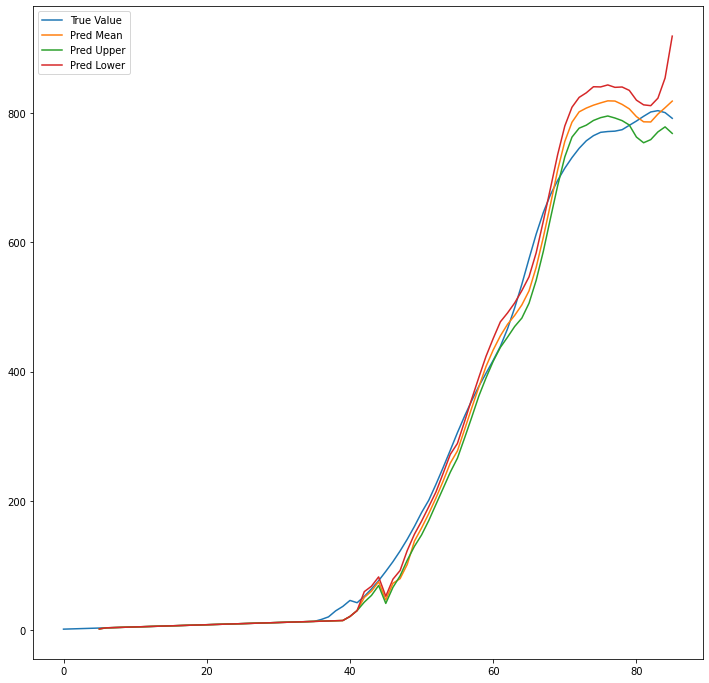

In [122]:
# SIMULATE PREDICTION FOR ENTIRE INTERVAL

# prediction_interval = 3 # defined above - predict for 72 hours out
start_days = 2 # days of data allowed before prediction 
start_date_trimmed = aggregate_data['date'].iloc[0]
end_date_trimmed = aggregate_data['date'].iloc[-1]
y_pred, y_true = holt_predictor(ICUbed_mean_true, start_date_trimmed, end_date_trimmed, prediction_interval, start_days, full_range=True)
rmse = math.sqrt(mean_squared_error(y_true, y_pred))
print("RMSE mean:", rmse)
y_pred_lower, y_true_lower = holt_predictor(ICUbed_lower_true, start_date_trimmed, end_date_trimmed, prediction_interval, full_range=True)
rmse = math.sqrt(mean_squared_error(y_true_lower, y_pred_lower))
print("RMSE lower:", rmse)
y_pred_upper, y_true_upper = holt_predictor(ICUbed_upper_true, start_date_trimmed, end_date_trimmed, prediction_interval, full_range=True )
rmse = math.sqrt(mean_squared_error(y_true_upper, y_pred_upper))
print("RMSE upper:", rmse)

plt.figure(figsize=(12,12))
plt.plot(ICUbed_mean_true)
plt.plot([None for i in range(start_days+prediction_interval)] + [y for y in y_pred])
plt.plot([None for i in range(start_days+prediction_interval)] + [y for y in y_pred_lower])
plt.plot([None for i in range(start_days+prediction_interval)] + [y for y in y_pred_upper])

plt.legend(labels=('True Value','Pred Mean','Pred Upper','Pred Lower'))

In [121]:
# SIMULATE PREDICTION FOR A SINGLE DATE

# prediction_interval = 3 # defined above - predict for 72 hours out
start_days = 2 # days of data allowed before prediction
start_date_trimmed = aggregate_data['date'].iloc[0]
end_date_trimmed = aggregate_data['date'].iloc[-1]
y_pred, y_true = holt_predictor(ICUbed_mean_true, start_date_trimmed, end_date_trimmed, days_out=prediction_interval, train_days=start_days, full_range=False)
print("Mean ICU bed prediction for %d days out: %f"%(prediction_interval,y_pred[0]))
print("Mean ICU bed true value last recorded: %f"%(y_true[0]))
rmse = math.sqrt(mean_squared_error(y_true, y_pred))
print("RMSE mean:", rmse)
y_pred_lower, y_true_lower = holt_predictor(ICUbed_lower_true, start_date_trimmed, end_date_trimmed, days_out=prediction_interval, train_days=start_days, full_range=False)
print("Mean ICU bed prediction for %d days out: %f"%(prediction_interval,y_pred_lower[0]))
print("Mean ICU bed true value last recorded: %f"%(y_true_lower[0]))
rmse = math.sqrt(mean_squared_error(y_true_lower, y_pred_lower))
print("RMSE lower:", rmse)
y_pred_upper, y_true_upper = holt_predictor(ICUbed_upper_true, start_date_trimmed, end_date_trimmed, days_out=prediction_interval, train_days=start_days, full_range=False)
print("Mean ICU bed prediction for %d days out: %f"%(prediction_interval,y_pred_upper[0]))
print("Mean ICU bed true value last recorded: %f"%(y_true_upper[0]))
rmse = math.sqrt(mean_squared_error(y_true_upper, y_pred_upper))
print("RMSE upper:", rmse)

Mean ICU bed prediction for 3 days out: 806.073299
Mean ICU bed true value last recorded: 791.651855
RMSE mean: 14.42144348932652
Mean ICU bed prediction for 3 days out: 671.434735
Mean ICU bed true value last recorded: 688.825012
RMSE lower: 17.390277702199796
Mean ICU bed prediction for 3 days out: 1088.293324
Mean ICU bed true value last recorded: 991.500000
RMSE upper: 96.79332352977622


In [806]:
  
class LSTM(nn.Module):
    def __init__(self, input_size=105, hidden_layer_size=100, batch_size=1, output_size=1, num_layers=2):
        super(LSTM,self).__init__()
        self.input_size = input_size
        self.hidden_layer_size = hidden_layer_size
        self.hidden_layer_half_size = int(self.hidden_layer_size / 2)
        self.output_size = output_size
        self.num_layers = num_layers
        self.batch_size = batch_size

        dropout = 0.00
        #self.lstm = nn.LSTM(self.input_size, self.hidden_layer_size, self.num_layers, dropout=dropout)
        self.lstm1 = nn.LSTMCell(self.input_size, self.hidden_layer_size)
        self.lstm2 = nn.LSTMCell(self.hidden_layer_size, self.hidden_layer_size)
        #self.linear = nn.Sequential(nn.Linear(self.hidden_layer_size/2, self.output_size),nn.Linear(self.hidden_layer_size, self.hidden_layer_size/2))
        self.linear = nn.Sequential(nn.Linear(self.hidden_layer_size, self.hidden_layer_half_size),nn.Linear(self.hidden_layer_half_size, self.output_size))

    #def init_hidden(self):
    #    # this is what we will initialize our hidden state as
    #    return (torch.zeros(self.num_layers,self.batch_size,self.hidden_layer_size),
    #                        torch.zeros(self.num_layers,self.batch_size,self.hidden_layer_size))

    def forward(self, input_seq, future = 0):
        outputs = []
        h_t = torch.zeros(input_seq.size(0), self.hidden_layer_size, dtype=torch.double)
        c_t = torch.zeros(input_seq.size(0), self.hidden_layer_size, dtype=torch.double)
        h_t2 = torch.zeros(input_seq.size(0), self.hidden_layer_size, dtype=torch.double)
        c_t2 = torch.zeros(input_seq.size(0), self.hidden_layer_size, dtype=torch.double)

        #for i, input_t in enumerate(input_seq):
        #    print("i", i)
        #    print("i", input_t.unsqueeze(1).shape)
        #    h_t, c_t = self.lstm1(input_t.unsqueeze(0), (h_t, c_t))
        #    h_t2, c_t2 = self.lstm2(h_t, (h_t2, c_t2))
        #    output = self.linear(h_t2)
        #    outputs += [output]
        h_t, c_t = self.lstm1(input_seq, (h_t, c_t))
        h_t2, c_t2 = self.lstm2(h_t, (h_t2, c_t2))
        output = self.linear(h_t2)
        outputs += [output]   
        
        #for i in range(future):# if we should predict the future
        #    h_t, c_t = self.lstm1(output, (h_t, c_t))
        #    h_t2, c_t2 = self.lstm2(h_t, (h_t2, c_t2))
        #    output = self.linear(h_t2)
        #    outputs += [output]
        outputs = torch.stack(outputs, 1).squeeze(2)
        return outputs
        
        
        #lstm_out, self.hidden = self.lstm(input_seq.view(len(input_seq) ,self.batch_size, -1))
        #predictions = self.linear(lstm_out[-1].view(self.batch_size, -1))
        #return predictions.view(-1)


In [810]:
np.random.seed(0)
torch.manual_seed(0)
model = LSTM(7, 100, 1, 1, 2)
model.double()
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, amsgrad=True)
print(model)
# training the model:
epochs = 1000
loss_history = np.zeros(epochs)
for i in range(epochs):
    for seq, labels in random.sample(train_inout_seq, len(train_inout_seq)):
        # clear stored gradient
        #model.zero_grad()
        y_pred = model(seq)
        #print(torch.squeeze(y_pred)[-1])
        #print(labels[-1])
        single_loss = loss_function(torch.squeeze(y_pred), labels[-1])
        optimizer.zero_grad()
        single_loss.backward()
        optimizer.step()
        loss_history[i]=single_loss.item()
    if i%5 == 0:
        print(f'epoch: {i:3} loss: {single_loss.item():10.8f}')

print(f'epoch: {i:3} loss: {single_loss.item():10.10f}')

LSTM(
  (lstm1): LSTMCell(7, 100)
  (lstm2): LSTMCell(100, 100)
  (linear): Sequential(
    (0): Linear(in_features=100, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=1, bias=True)
  )
)
epoch:   0 loss: 0.01025748
epoch:   5 loss: 0.00302975
epoch:  10 loss: 0.01142502
epoch:  15 loss: 0.03475314
epoch:  20 loss: 0.00361933
epoch:  25 loss: 0.00300572
epoch:  30 loss: 0.01896798
epoch:  35 loss: 0.25343923
epoch:  40 loss: 0.21746893
epoch:  45 loss: 0.00042311
epoch:  50 loss: 0.07416999
epoch:  55 loss: 0.10996688
epoch:  60 loss: 0.02176753
epoch:  65 loss: 0.00058483
epoch:  70 loss: 0.20160260
epoch:  75 loss: 0.09702837
epoch:  80 loss: 0.22083906
epoch:  85 loss: 0.04818721
epoch:  90 loss: 0.00017826
epoch:  95 loss: 0.00093401
epoch: 100 loss: 0.09038971
epoch: 105 loss: 0.09628525
epoch: 110 loss: 0.00030786
epoch: 115 loss: 5.23512321
epoch: 120 loss: 4.53405927
epoch: 125 loss: 2.26328747
epoch: 130 loss: 0.01408543
epoch: 135 loss: 4.27969643
ep

KeyboardInterrupt: 

### Old LSTM Code

# LSTM Prediction Model

In [127]:
categories = [i+1 for i in range(78)]
print(categories)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]


In [417]:
path = './data/'
ihme_path = path + '2020_05_04/'
state = 'California'
data_start_date = pd.Timestamp(2020,2,1)
data_end_date = pd.Timestamp(2020,5,2)
aggregate_data = combine_statewise_data(state,data_start_date,data_end_date,path,ihme_path,0)

# Additional possible pre-processing:
# 1) drop unnecessary fields
date_idx = aggregate_data['date']
drop_col = ['V1','total_tests_data_type','date']
nan_col = report_nan_columns(aggregate_data)
comb_col = list(set(drop_col + nan_col))
aggregate_data = drop_fields(aggregate_data,comb_col)
# 2.0) convert state names to FIPS code (from PolicyMap data - see additional csv in ./data)
aggregate_data = state_to_fips(aggregate_data, path)
# 2.5) convert FIPS to one-hot encoding
#      Note: not needed for single-state predictions. Placeholder for LSTM
state_ID = aggregate_data['location_name']
aggregate_data = drop_fields(aggregate_data,['location_name'])
categories = [i+1 for i in range(78)]
state_ID = state_ID.astype(pd.CategoricalDtype(categories))
onehot_df = pd.get_dummies(state_ID, prefix='FIPS')
aggregate_data = pd.concat([onehot_df, aggregate_data], axis=1, sort=False)

# 3.0) Convert all data fields to floats
aggregate_data = convert_to_float(aggregate_data, exclude_columns=[])

# 4.0) get our clean dataset and true values according to prediction interval
prediction_interval = 3 # 3 days = 72 hours
aggregate_data, ICUbed_mean_true, ICUbed_lower_true, ICUbed_upper_true = trim_and_true_values(aggregate_data, prediction_interval)

# 5.0) normalize numerical columns between [0:1]
#      note: not needed for Holt model
data_scaler = MinMaxScaler(feature_range=(0, 1))
#aggregate_data_scaled = data_scaler.fit_transform(aggregate_data.values.reshape(-1,1))
#aggregate_data = pd.DataFrame(aggregate_data_scaled,index=aggregate_data.index,columns=[aggregate_data.columns])
#aggregate_data = pd.DataFrame(aggregate_data_scaled,index=aggregate_data.index,columns=['ICUbed_mean'])
aggregate_data_scaled = data_scaler.fit_transform(aggregate_data[aggregate_data.columns])
aggregate_data = pd.DataFrame(aggregate_data_scaled,index=aggregate_data.index,columns=aggregate_data.columns)
print(aggregate_data)

label_scaler = MinMaxScaler(feature_range=(0,1))
ICUbed_mean_true_scaled = label_scaler.fit_transform(ICUbed_mean_true.values.reshape(-1,1))
#aggregate_data = pd.DataFrame(aggregate_data_scaled,index=aggregate_data.index,columns=[aggregate_data.columns])
ICUbed_mean_true = pd.DataFrame(ICUbed_mean_true_scaled,index=ICUbed_mean_true.index,columns=['ICUbed_mean'])
print(ICUbed_mean_true)

# Normalize data between [0:1]
#scaler = MinMaxScaler(feature_range=(0, 1))
#aggregate_data_scaled = scaler.fit_transform(aggregate_data_float)
#ICUbed_mean_true_scaled = scaler.fit_transform(ICUbed_mean_float.values.reshape(-1,1))
#ICUbed_lower_true_scaled = scaler.fit_transform(ICUbed_lower_float.values.reshape(-1,1))
#ICUbed_upper_true_scaled = scaler.fit_transform(ICUbed_upper_true.values.reshape(-1,1))

# make sure we're groovy
#print(aggregate_data.shape)
#print(ICUbed_mean_true.shape)
#print(ICUbed_lower_true.shape)
#print(ICUbed_upper_true.shape)

#print(aggregate_data)

Initializing CDC_Parser object, reading: ./data/Excess_Deaths_Associated_with_COVID-19.csv
Initializing PM_Parser object, reading datasets from: ./data/
Dropping following columns:  ['bedover_upper', 'icuover_upper', 'icuover_lower', 'total_tests_data_type', 'bedover_lower', 'icuover_mean', 'bedover_mean', 'date', 'V1']
Dropping following columns:  ['location_name']
    FIPS_1  FIPS_2  FIPS_3  FIPS_4  FIPS_5  FIPS_6  FIPS_7  FIPS_8  FIPS_9  \
0      0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
1      0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
2      0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
3      0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
4      0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
..     ...     ...     ...     ...     ...     ...     ...     ...     ...   
81     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
82     

In [418]:
# split into train and test sets
train_size = int(len(aggregate_data) * 0.67)
split_date = date_idx.iloc[train_size] # for future improvements
test_size = len(aggregate_data) - train_size
print(aggregate_data)
trainX, testX = aggregate_data.iloc[0:train_size], aggregate_data.iloc[train_size:len(aggregate_data)]
trainX, testX = aggregate_data.iloc[0:train_size], aggregate_data.iloc[train_size:len(aggregate_data)]
trainY_mean, testY_mean = ICUbed_mean_true.iloc[0:train_size], ICUbed_mean_true.iloc[train_size:len(ICUbed_mean_true)]
#trainY_lower, testY_lower = ICUbed_lower_true.iloc[0:train_size], ICUbed_lower_true.iloc[train_size:len(ICUbed_lower_true)]
#trainY_upper, testY_upper = ICUbed_upper_true.iloc[0:train_size], ICUbed_upper_true.iloc[train_size:len(ICUbed_upper_true)]

print(train_size)
print(test_size)
print(trainX.shape)
print(testX.shape)
print(trainY_mean.shape)
print(testY_mean.shape)
print(trainY_lower.shape)
print(testY_lower.shape)
print(trainY_upper.shape)
print(testY_upper.shape)

    FIPS_1  FIPS_2  FIPS_3  FIPS_4  FIPS_5  FIPS_6  FIPS_7  FIPS_8  FIPS_9  \
0      0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
1      0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
2      0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
3      0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
4      0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
..     ...     ...     ...     ...     ...     ...     ...     ...     ...   
81     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
82     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
83     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
84     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
85     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   

    FIPS_10  ...  newICU_upper  totdea_mean  totdea_lower  totd

In [759]:
# creating training sequences for LSTM model
# Sliding window  of width (tw)
def create_inout_sequences(X, Y, tw, only_last=False):
    X_tensor = torch.DoubleTensor(X.to_numpy())
    Y_tensor = torch.DoubleTensor(Y.to_numpy()).view(-1)
    inout_sequence = []
    if len(X) != len(Y):
        print("ABORT: features and labels passed to 'create_inout_sequences' of different shape.")
        return 0
    L = len(X)
    for i in range(L-tw):
        seq_X = X_tensor[i:i+tw]
        seq_Y = Y_tensor[i:i+tw]
        inout_sequence.append((seq_X, seq_Y))
    if not only_last:
        return inout_sequence
    else:
        return inout_sequence[-1]

In [420]:
train_window = 14 # looking back at last two weeks of development
train_inout_seq = create_inout_sequences(trainX, trainY_mean, train_window)
print(len(train_inout_seq))

43


### define LSTM model

In [516]:
class LSTM(nn.Module):
    def __init__(self, input_size=105, hidden_layer_size=200, output_size=1):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size

        dropout = 0.00
        self.lstm = nn.LSTM(input_size, hidden_layer_size, num_layers=1, dropout=dropout)
        
        self.linear = nn.Linear(hidden_layer_size, output_size)

        self.hidden_cell = (torch.zeros(1,1,self.hidden_layer_size),
                            torch.zeros(1,1,self.hidden_layer_size))

    def forward(self, input_seq):
        lstm_out, self.hidden_cell = self.lstm(input_seq.view(len(input_seq) ,1, -1), self.hidden_cell)
        predictions = self.linear(lstm_out.view(len(input_seq), -1))
        return predictions

In [517]:
model = LSTM()
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [518]:
print(model)

LSTM(
  (lstm): LSTM(105, 200)
  (linear): Linear(in_features=200, out_features=1, bias=True)
)


In [519]:
# training the model:
epochs = 1000
loss_history = []
for i in range(epochs):
    for seq, labels in train_inout_seq:
        optimizer.zero_grad()
        model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
                        torch.zeros(1, 1, model.hidden_layer_size))

        
        y_pred = model(seq)
        #print(torch.squeeze(y_pred)[-1])
        #print(labels[-1])
        single_loss = loss_function(torch.squeeze(y_pred)[-1], labels[-1])
        single_loss.backward()
        optimizer.step()
        loss_history.append(single_loss.item())
    if i%25 == 1:
        print(f'epoch: {i:3} loss: {single_loss.item():10.8f}')

print(f'epoch: {i:3} loss: {single_loss.item():10.10f}')

epoch:   1 loss: 0.00002772
epoch:  26 loss: 0.00190021
epoch:  51 loss: 0.00000703
epoch:  76 loss: 0.00129418
epoch: 101 loss: 0.00009072
epoch: 126 loss: 0.00118136
epoch: 151 loss: 0.00030263
epoch: 176 loss: 0.00089834
epoch: 201 loss: 0.00017315
epoch: 226 loss: 0.00048974
epoch: 251 loss: 0.00021965
epoch: 276 loss: 0.00040055
epoch: 301 loss: 0.00014163
epoch: 326 loss: 0.00014744
epoch: 351 loss: 0.00020351
epoch: 376 loss: 0.00027533
epoch: 401 loss: 0.00012308
epoch: 426 loss: 0.00020564
epoch: 451 loss: 0.00013159
epoch: 476 loss: 0.00019322
epoch: 501 loss: 0.00010533
epoch: 526 loss: 0.00017294
epoch: 551 loss: 0.00008523
epoch: 576 loss: 0.00014018
epoch: 601 loss: 0.00007026
epoch: 626 loss: 0.00018588
epoch: 651 loss: 0.00005859
epoch: 676 loss: 0.00016535
epoch: 701 loss: 0.00004432
epoch: 726 loss: 0.00013938
epoch: 751 loss: 0.00003424
epoch: 776 loss: 0.00011543
epoch: 801 loss: 0.00003518
epoch: 826 loss: 0.00009286
epoch: 851 loss: 0.00004758
epoch: 876 loss: 0.0

In [520]:
test_window = 14 # looking back at last two weeks of development
val_inout_seq = create_inout_sequences(aggregate_data, ICUbed_mean_true, test_window)
print(len(val_inout_seq))

72


[tensor(-0.0060), tensor(-0.0038), tensor(-0.0042), tensor(-0.0056), tensor(-0.0066), tensor(-0.0067), tensor(-0.0053), tensor(-0.0050), tensor(-0.0054), tensor(-0.0041), tensor(-0.0023), tensor(-0.0009), tensor(-0.0002), tensor(-3.7491e-05), tensor(0.0004), tensor(0.0010), tensor(0.0011), tensor(0.0011), tensor(0.0013), tensor(0.0018), tensor(0.0042), tensor(0.0050), tensor(0.0054), tensor(0.0100), tensor(0.0150), tensor(0.0183), tensor(0.0354), tensor(0.0464), tensor(0.0407), tensor(0.0535), tensor(0.0688), tensor(0.0852), tensor(0.1038), tensor(0.1230), tensor(0.1445), tensor(0.1679), tensor(0.1933), tensor(0.2195), tensor(0.2476), tensor(0.2769), tensor(0.3100), tensor(0.3435), tensor(0.3770), tensor(0.4020), tensor(0.4329), tensor(0.4689), tensor(0.5091), tensor(0.5443), tensor(0.5752), tensor(0.6026), tensor(0.6386), tensor(0.6772), tensor(0.7254), tensor(0.7685), tensor(0.8079), tensor(0.8402), tensor(0.8654), tensor(0.8843), tensor(0.9006), tensor(0.9135), tensor(0.9316), tenso

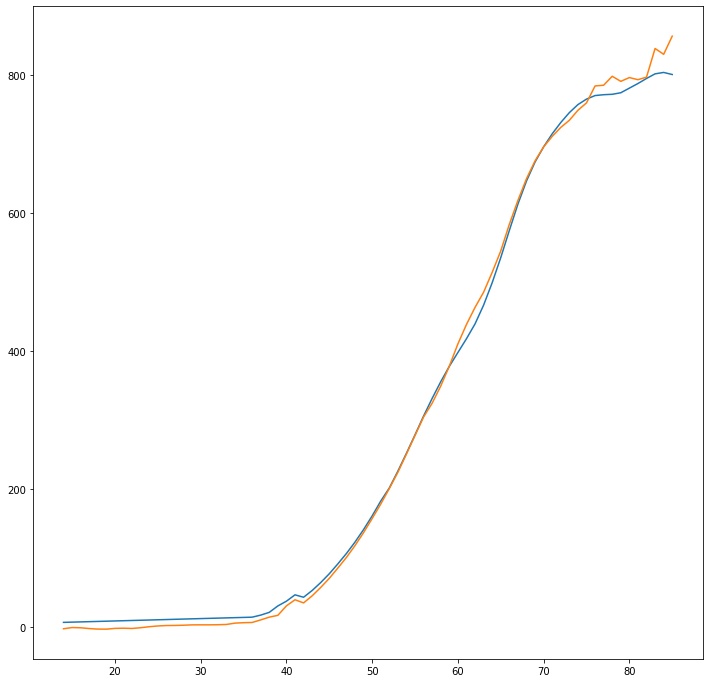

In [521]:
model.eval()

#trained_preds = []
val_preds = []

#train_tv = []
val_tv = []

#for seq, labels in train_inout_seq:
#    with torch.no_grad():
#        y_pred = model(seq)
#        trained_preds.append(torch.squeeze(y_pred)[-1])
#        train_tv.append(labels[-1])
        
for seq, labels in val_inout_seq:
    with torch.no_grad():
        y_pred = model(seq)
        val_preds.append(torch.squeeze(y_pred)[-1])
        val_tv.append(labels[-1])
        
print(val_preds)
print(val_tv)

val_preds = label_scaler.inverse_transform(np.array(val_preds).reshape(-1,1))
val_tv = label_scaler.inverse_transform(np.array(val_tv).reshape(-1,1))

rmse = math.sqrt(mean_squared_error(val_tv, val_preds))
print("Validation data RMSE:", rmse)

plt.figure(figsize=(12,12))
plt.plot([None for i in range(14)] + [y for y in val_tv])
plt.plot([None for i in range(14)] + [y for y in val_preds])

#plt.legend(labels=('True Value','Pred Mean','Pred Upper','Pred Lower'))        

In [ ]:
# Imputed/parsed ihme data, parsed cdc data, parsed policymap date
def combine_statewise_data(state, start_date, end_date, data_path, ihme_path, verbose=0):
    # CDC data
    cdc_parser = CDC_Parser(path)
    cdc_data = cdc_parser.statewise_parse(state,start_date,end_date,False,verbose)
    # IHME data
    ihme_parser = IHME_Parser(ihme_path)
    ihme_data = ihme_parser.statewise_parse(state,start_date,end_date,True,verbose)
    # PM data
    pm_parser = PM_Parser(path)
    pm_data = pm_parser.index_by_state(state)
    # combined with PM data
    ihme_data['est_asthma_perc'] = pm_data['est_asthma_perc'].item()
    ihme_data['est_COPD_perc'] = pm_data['est_COPD_perc'].item()
    ihme_data['est_diabetes_perc'] = pm_data['est_diabetes_perc'].item()
    ihme_data['est_heartDisease_perc'] = pm_data['est_heartDisease_perc'].item()
    # Combine with CDC data by day
    ihme_data['Observed_DOA_CDC'] = -1
    write_to_row = 0
    for _, cdc_row in cdc_data.iterrows():
        while write_to_row < ihme_data.shape[0]:
            if cdc_row['Week Ending Date'] >= ihme_data.loc[write_to_row,'date']:
                ihme_data.loc[write_to_row,'Observed_DOA_CDC'] = cdc_row['Observed Number']
                write_to_row += 1
            else:
                break
    if verbose!=0:
        print(ihme_data)

    return ihme_data

def drop_fields(data, columns):
    # Drop unnecessary fields
    print('Dropping following columns (if present): ', columns)
    for field in columns:
        if field in data:
            data = data.drop(columns=field, axis=1)
    return data

def keep_fields(data, keep_columns):
    # Drops all fields except those listed
    #print('Dropping following columns (if present): ', columns)
    for field in data.columns:
        if field not in keep_columns:
            data = data.drop(columns=field, axis=1)
    return data

def report_nan_columns(data):
    nan_columns = []
    for name, col_data in data.iteritems():
        count = 0
        for item in col_data:
            if item != item:
                count += 1
        if count:
            nan_columns.append(name)
    return nan_columns

def state_to_fips(data, path):
    fips_path = path + 'State_FIPS.csv'
    fips_df = pd.read_csv(fips_path)
    for index, row in data.iterrows():
        #state = row['location_name']
        #row['location_name'] = fips_df.loc[fips_df['State'] == state]['FIPS_Code']
        #print(row['location_name'])
        #print(fips_df.loc[fips_df['State']==row['location_name']]['FIPS Code'].item())
        state = row['location_name']
        data.loc[index,'location_name'] = fips_df.loc[fips_df['State']==state]['FIPS Code'].item()
    return data

# take statewise data and creates new arrays of true values for 72-hour prediction
# returns: upper, lower and mean ICU bed need
def trim_and_true_values(data,prediction_interval):
    ICUbed_mean_true = data['ICUbed_mean'].iloc[prediction_interval:].reset_index(drop = True)
    ICUbed_lower_true = data['ICUbed_lower'].iloc[prediction_interval:].reset_index(drop = True)
    ICUbed_upper_true = data['ICUbed_upper'].iloc[prediction_interval:].reset_index(drop = True)
    data_clipped = data.iloc[:-prediction_interval].reset_index(drop=True)
    #print(ICUbed_mean_true)
    #print(ICUbed_lower_true)
    #print(ICUbed_upper_true)
    #print(data_clipped)
    return data_clipped, ICUbed_mean_true, ICUbed_lower_true, ICUbed_upper_true

def convert_to_float(data,exclude_columns=[]):
    for i in list(data):
        if i not in exclude_columns:
            data[i] = data[i].astype('float32')
    return data

def convert_to_double(data,exclude_columns=[]):
    for i in list(data):
        if i not in exclude_columns:
            data[i] = data[i].astype('double')
    return data

In [ ]:
# split into train and test sets
train_size = int(len(aggregate_data) * 0.67)
split_date = date_idx.iloc[train_size] # for future improvements
test_size = len(aggregate_data) - train_size
print(aggregate_data)
trainX, testX = aggregate_data.iloc[0:train_size], aggregate_data.iloc[train_size:len(aggregate_data)]
trainX, testX = aggregate_data.iloc[0:train_size], aggregate_data.iloc[train_size:len(aggregate_data)]
trainY_mean, testY_mean = ICUbed_mean_true.iloc[0:train_size], ICUbed_mean_true.iloc[train_size:len(ICUbed_mean_true)]
#trainY_lower, testY_lower = ICUbed_lower_true.iloc[0:train_size], ICUbed_lower_true.iloc[train_size:len(ICUbed_lower_true)]
#trainY_upper, testY_upper = ICUbed_upper_true.iloc[0:train_size], ICUbed_upper_true.iloc[train_size:len(ICUbed_upper_true)]

print(train_size)
print(test_size)
print(trainX.shape)
print(testX.shape)
print(trainY_mean.shape)
print(testY_mean.shape)
print(trainY_lower.shape)
print(testY_lower.shape)
print(trainY_upper.shape)
print(testY_upper.shape)

In [ ]:
# creating training sequences for LSTM model
# Sliding window  of width (tw)
def create_inout_sequences(X, Y, tw, only_last=False):
    X_tensor = torch.DoubleTensor(X.to_numpy())
    Y_tensor = torch.DoubleTensor(Y.to_numpy()).view(-1)
    inout_sequence = []
    if len(X) != len(Y):
        print("ABORT: features and labels passed to 'create_inout_sequences' of different shape.")
        return 0
    L = len(X)
    for i in range(L-tw):
        seq_X = X_tensor[i:i+tw]
        seq_Y = Y_tensor[i:i+tw]
        inout_sequence.append((seq_X, seq_Y))
    if not only_last:
        return inout_sequence
    else:
        return inout_sequence[-1]

In [ ]:
path = './data/'
ihme_path = path + '2020_05_04/'
#states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas', 'New Jersey', 'Virginia', 'Connecticut', 'Louisiana', 'Ohio', 'Hawaii', 'Vermont', 'Oklahoma', 'New Hampshire']
states = ['California', 'New York', 'Illinois', 'Florida', 'Washington', 'Michigan', 'Oregon', 'Arizona', 'Texas']
data_start_date = pd.Timestamp(2020,2,1)
data_end_date = pd.Timestamp(2020,5,2)
test_window = 14
nan_columns = []
train_inout_seq = []
feature_count = []
statewise_data_scaled = {}
for state in states:
    aggregate_data = combine_statewise_data(state,data_start_date,data_end_date,path,ihme_path,0)
    state_nan_col = report_nan_columns(aggregate_data)
    nan_columns = list(set(nan_columns + state_nan_col))
print("Excluding the following from all lists: ", nan_columns)
scaler_init = False
data_scaler = MinMaxScaler(feature_range=(0, 1))
mean_label_scaler = MinMaxScaler(feature_range=(0,1))
for state in states:
    aggregate_data = combine_statewise_data(state,data_start_date,data_end_date,path,ihme_path,0)
    # Additional possible pre-processing:
    # 1) drop unnecessary fields
    date_idx = aggregate_data['date']
    drop_col = ['V1','total_tests_data_type','date', 'total_tests']
    comb_col = list(set(drop_col + nan_columns))
    aggregate_data = drop_fields(aggregate_data,comb_col)
    
    # 2.0) convert state names to FIPS code (from PolicyMap data - see additional csv in ./data)
    #aggregate_data = state_to_fips(aggregate_data, path)
    
    # 2.5) convert FIPS to one-hot encoding
    #      Note: not needed for single-state predictions. Placeholder for LSTM
    state_ID = aggregate_data['location_name']
    aggregate_data = drop_fields(aggregate_data,['location_name'])
    categories = [i+1 for i in range(78)]
    state_ID = state_ID.astype(pd.CategoricalDtype(categories))
    onehot_df = pd.get_dummies(state_ID, prefix='FIPS')
    aggregate_data = pd.concat([onehot_df, aggregate_data], axis=1, sort=False)
    
    # TEST - drop all fields except what we need
    aggregate_data = keep_fields(aggregate_data,['ICUbed_mean', 'est_asthma_perc','est_COPD_perc','est_diabetes_perc','est_heartDisease_perc','ICUbed_lower','ICUbed_upper'])
    
    # 3.0) Convert all data fields to floats
    aggregate_data = convert_to_double(aggregate_data, exclude_columns=[])

    # 4.0) get our clean dataset and true values according to prediction interval
    prediction_interval = 3 # 3 days = 72 hours
    aggregate_data, ICUbed_mean_true, ICUbed_lower_true, ICUbed_upper_true = trim_and_true_values(aggregate_data, prediction_interval)

    # 5.0) normalize numerical columns between [0:1]
    #      note: not needed for Holt model
    if not scaler_init:
        aggregate_data_scaled = data_scaler.fit_transform(aggregate_data[aggregate_data.columns])
        ICUbed_mean_true_scaled = mean_label_scaler.fit_transform(ICUbed_mean_true.values.reshape(-1,1))
        scaler_init = True
    else:
        aggregate_data_scaled = data_scaler.transform(aggregate_data[aggregate_data.columns])
        ICUbed_mean_true_scaled = mean_label_scaler.transform(ICUbed_mean_true.values.reshape(-1,1))
    aggregate_data = pd.DataFrame(aggregate_data_scaled,index=aggregate_data.index,columns=aggregate_data.columns)
    ICUbed_mean_true = pd.DataFrame(ICUbed_mean_true_scaled,index=ICUbed_mean_true.index,columns=['ICUbed_mean'])

    #label_scaler_lower = MinMaxScaler(feature_range=(0,1))
    #ICUbed_lower_true_scaled = label_scaler_lower.fit_transform(ICUbed_lower_true.values.reshape(-1,1))
    #ICUbed_lower_true = pd.DataFrame(ICUbed_lower_true_scaled,index=ICUbed_lower_true.index,columns=['ICUbed_lower'])

    #label_scaler_upper = MinMaxScaler(feature_range=(0,1))
    #ICUbed_lower_true_scaled = label_scaler_upper.fit_transform(ICUbed_lower_true.values.reshape(-1,1))
    #ICUbed_lower_true = pd.DataFrame(ICUbed_lower_true_scaled,index=ICUbed_lower_true.index,columns=['ICUbed_upper'])
    
    # split into train and test sets
    #split_idx = date_idx.where(date_idx == data_end_date) #-3?
    split_idx = date_idx[date_idx == data_end_date]
    trainX = aggregate_data.iloc[0:train_size]
    trainX = aggregate_data.iloc[0:train_size]
    trainY_mean = ICUbed_mean_true.iloc[0:train_size]
    
    #split_date = date_idx.iloc[train_size] # for future improvements
    #test_size = len(aggregate_data) - train_size
    #print(aggregate_data)
    #trainX, testX = aggregate_data.iloc[0:train_size], aggregate_data.iloc[train_size:len(aggregate_data)]
    #trainX, testX = aggregate_data.iloc[0:train_size], aggregate_data.iloc[train_size:len(aggregate_data)]
    #trainY_mean, testY_mean = ICUbed_mean_true.iloc[0:train_size], ICUbed_mean_true.iloc[train_size:len(ICUbed_mean_true)]
    
    feature_count.append(aggregate_data.shape[1])
    
    statewise_data_scaled[state] = (aggregate_data, ICUbed_mean_true)
    
    # add training data to the array from each state
    next_seq = create_inout_sequences(aggregate_data, ICUbed_mean_true, test_window)
    #print(len(next_seq))
    for i in next_seq:
        train_inout_seq.append(i)
    #print(len(train_inout_seq))

print(feature_count)
    
if not feature_count.count(feature_count[0]) == len(feature_count):
    print("Error: different feature count acrossed parsed states!")

### Original Datamanager

In [ ]:
aggregateclass DataManager():
    def __init__(self, data_start_date, data_end_date, states, path, ihme_path, prediction_interval = 3):
        print("Initializing data manager class...")
        test_window = 14
        nan_columns = []
        self.train_inout_seq = []
        feature_count = []
        self.statewise_data_unscaled = {}
        self.statewise_data_scaled = {}
        self.prediction_interval = prediction_interval
        self.data_start_date = data_start_date
        self.data_end_date = data_end_date
        for state in states:
            self.aggregate_data = self.combine_statewise_data(state,self.data_start_date,self.data_end_date,path,ihme_path,0)
            state_nan_col = self.report_nan_columns(self.aggregate_data)
            nan_columns = list(set(nan_columns + state_nan_col))
        print("Excluding the following from all lists: ", nan_columns)
        scaler_init = False
        self.data_scaler = MinMaxScaler(feature_range=(0, 1))
        self.label_scaler = MinMaxScaler(feature_range=(0,1))
        for state in states:
            self.aggregate_data = self.combine_statewise_data(state,self.data_start_date,self.data_end_date,path,ihme_path,0)
            # Additional possible pre-processing:
            # 1) drop unnecessary fields
            date_idx = self.aggregate_data['date']
            drop_col = ['V1','total_tests_data_type','date', 'total_tests']
            self.comb_col = list(set(drop_col + nan_columns))
            self.aggregate_data = self.drop_fields(self.aggregate_data,self.comb_col)

            # 2.0) convert state names to FIPS code (from PolicyMap data - see additional csv in ./data)
            #aggregate_data = state_to_fips(aggregate_data, path)

            # 2.5) convert FIPS to one-hot encoding
            #      Note: not needed for single-state predictions. Placeholder for LSTM
            state_ID = self.aggregate_data['location_name']
            self.aggregate_data = self.drop_fields(self.aggregate_data,['location_name'])
            categories = [i+1 for i in range(78)]
            state_ID = state_ID.astype(pd.CategoricalDtype(categories))
            onehot_df = pd.get_dummies(state_ID, prefix='FIPS')
            self.aggregate_data = pd.concat([onehot_df, self.aggregate_data], axis=1, sort=False)

            # TEST - drop all fields except what we need
            self.aggregate_data, keep_fields_success = self.keep_fields(self.aggregate_data,['ICUbed_mean', 'est_asthma_perc','est_COPD_perc','est_diabetes_perc','est_heartDisease_perc','ICUbed_lower','ICUbed_upper'])
            if keep_fields_success == 0:
                print(state, 'does not have all necessary fields for this analysis')
            
            
            # 3.0) Convert all data fields to floats
            self.aggregate_data = self.convert_to_double(self.aggregate_data, exclude_columns=[])

            # 4.0) get our clean dataset and true values according to prediction interval
            self.aggregate_data, self.ICUbed_mean_true, self.ICUbed_lower_true, self.ICUbed_upper_true = self.trim_and_true_values(self.aggregate_data, self.prediction_interval)

            # 5.0) normalize numerical columns between [0:1]
            #      note: not needed for Holt model
            if not scaler_init:
                aggregate_data_scaled = self.data_scaler.fit_transform(self.aggregate_data[self.aggregate_data.columns])
                ICUbed_mean_true_scaled = self.label_scaler.fit_transform(self.ICUbed_mean_true.values.reshape(-1,1))
                scaler_init = True
            else:
                aggregate_data_scaled = self.data_scaler.transform(self.aggregate_data[self.aggregate_data.columns])
                ICUbed_mean_true_scaled = self.label_scaler.transform(self.ICUbed_mean_true.values.reshape(-1,1))
            self.aggregate_data_scaled = pd.DataFrame(aggregate_data_scaled,index=self.aggregate_data.index,columns=self.aggregate_data.columns)
            self.ICUbed_mean_true_scaled = pd.DataFrame(ICUbed_mean_true_scaled,index=self.ICUbed_mean_true.index,columns=['ICUbed_mean'])

            #label_scaler_lower = MinMaxScaler(feature_range=(0,1))
            #ICUbed_lower_true_scaled = label_scaler_lower.fit_transform(ICUbed_lower_true.values.reshape(-1,1))
            #ICUbed_lower_true = pd.DataFrame(ICUbed_lower_true_scaled,index=ICUbed_lower_true.index,columns=['ICUbed_lower'])

            #label_scaler_upper = MinMaxScaler(feature_range=(0,1))
            #ICUbed_lower_true_scaled = label_scaler_upper.fit_transform(ICUbed_lower_true.values.reshape(-1,1))
            #ICUbed_lower_true = pd.DataFrame(ICUbed_lower_true_scaled,index=ICUbed_lower_true.index,columns=['ICUbed_upper'])

            feature_count.append(self.aggregate_data.shape[1])
            self.statewise_data_unscaled[state] = (self.aggregate_data, self.ICUbed_mean_true)
            self.statewise_data_scaled[state] = (self.aggregate_data_scaled, self.ICUbed_mean_true_scaled)

        if not feature_count.count(feature_count[0]) == len(feature_count):
            print("Error: different feature count acrossed parsed states!")
            
        self.feature_count = feature_count[0]

    def observed_data_split(self, split_date):
        observed_size = (split_date - self.data_start_date).days
        statewise_data_observed_unscaled = {}
        statewise_data_observed_scaled = {}
        for state, data_unscaled in self.statewise_data_unscaled.items():
            statewise_data_observed_unscaled[state] = (data_unscaled[0].iloc[0:observed_size], data_unscaled[1].iloc[0:observed_size])
        for state, data_scaled in self.statewise_data_scaled.items():
            statewise_data_observed_scaled[state] = (data_scaled[0].iloc[0:observed_size], data_scaled[1].iloc[0:observed_size])
            
        return (statewise_data_observed_unscaled, statewise_data_observed_scaled)
        
    # Imputed/parsed ihme data, parsed cdc data, parsed policymap date
    def combine_statewise_data(self, state, start_date, end_date, data_path, ihme_path, verbose=0):
        # CDC data
        cdc_parser = CDC_Parser(path)
        cdc_data = cdc_parser.statewise_parse(state,start_date,end_date,False,verbose)
        # IHME data
        ihme_parser = IHME_Parser(ihme_path)
        ihme_data = ihme_parser.statewise_parse(state,start_date,end_date,True,verbose)
        # PM data
        pm_parser = PM_Parser(path)
        pm_data = pm_parser.index_by_state(state)
        # combined with PM data
        ihme_data['est_asthma_perc'] = pm_data['est_asthma_perc'].item()
        ihme_data['est_COPD_perc'] = pm_data['est_COPD_perc'].item()
        ihme_data['est_diabetes_perc'] = pm_data['est_diabetes_perc'].item()
        ihme_data['est_heartDisease_perc'] = pm_data['est_heartDisease_perc'].item()
        # Combine with CDC data by day
        ihme_data['Observed_DOA_CDC'] = -1
        write_to_row = 0
        for _, cdc_row in cdc_data.iterrows():
            while write_to_row < ihme_data.shape[0]:
                if cdc_row['Week Ending Date'] >= ihme_data.loc[write_to_row,'date']:
                    ihme_data.loc[write_to_row,'Observed_DOA_CDC'] = cdc_row['Observed Number']
                    write_to_row += 1
                else:
                    break
        if verbose!=0:
            print(ihme_data)

        return ihme_data

    def drop_fields(self, data, columns, verbose=0):
        # Drop unnecessary fields
        if verbose > 0:
            print('Dropping following columns (if present): ', columns)
        for field in columns:
            if field in data:
                data = data.drop(columns=field, axis=1)
        return data

    def keep_fields(self, data, keep_columns):
        # Drops all fields except those listed
        #print('Dropping following columns (if present): ', columns)
        success = 1
        for keeper in keep_columns:
            if keeper not in data.columns:
                print("Field: '", keeper, "' not found")
                success = 0
        for field in data.columns:
            if field not in keep_columns:
                data = data.drop(columns=field, axis=1)
        return data, success

    def report_nan_columns(self, data):
        nan_columns = []
        for name, col_data in data.iteritems():
            count = 0
            for item in col_data:
                if item != item:
                    count += 1
            if count:
                nan_columns.append(name)
        return nan_columns

    def state_to_fips(self, data, path):
        fips_path = path + 'State_FIPS.csv'
        fips_df = pd.read_csv(fips_path)
        for index, row in data.iterrows():
            #state = row['location_name']
            #row['location_name'] = fips_df.loc[fips_df['State'] == state]['FIPS_Code']
            #print(row['location_name'])
            #print(fips_df.loc[fips_df['State']==row['location_name']]['FIPS Code'].item())
            state = row['location_name']
            data.loc[index,'location_name'] = fips_df.loc[fips_df['State']==state]['FIPS Code'].item()
        return data

    # take statewise data and creates new arrays of true values for 72-hour prediction
    # returns: upper, lower and mean ICU bed need
    def trim_and_true_values(self, data,prediction_interval):
        ICUbed_mean_true = data['ICUbed_mean'].iloc[prediction_interval:].reset_index(drop = True)
        ICUbed_lower_true = data['ICUbed_lower'].iloc[prediction_interval:].reset_index(drop = True)
        ICUbed_upper_true = data['ICUbed_upper'].iloc[prediction_interval:].reset_index(drop = True)
        data_clipped = data.iloc[:-prediction_interval].reset_index(drop=True)
        #print(ICUbed_mean_true)
        #print(ICUbed_lower_true)
        #print(ICUbed_upper_true)
        #print(data_clipped)
        return data_clipped, ICUbed_mean_true, ICUbed_lower_true, ICUbed_upper_true

    def convert_to_float(self, data,exclude_columns=[]):
        for i in list(data):
            if i not in exclude_columns:
                data[i] = data[i].astype('float32')
        return data

    def convert_to_double(self, data,exclude_columns=[]):
        for i in list(data):
            if i not in exclude_columns:
                data[i] = data[i].astype('double')
        return data
    
    def HOLTprediction(self,unscaled_statewise_data,states,prediction_interval=3):
        predictions = {}
        true_values = {}
        for state, (aggregate_data_unscaled, ICU_observed) in unscaled_statewise_data.items():
            #print(aggregate_data_unscaled['ICUbed_mean'])
            i = len(ICU_observed)
            #print("length of available data: ", i)
            if i < 2:
                print("ERROR: Not enough data for holt prediction")
            holt_model = Holt(aggregate_data_unscaled['ICUbed_mean'], damped=True).fit(smoothing_slope=0.4)
            yhat = holt_model.predict(i + prediction_interval)
            predictions[state] = yhat.item()
            true_values[state] = ICU_observed.iloc[-1]
            #print("Holt prediction for ", state, ": ", yhat.item())
        return predictions, true_values
    
    # must run this as a separate simulation to report RMSE of the entire HOLT simulator.
    def HOLTsimulator(self, end_date, prediction_interval=3, train_days=2):
        (aggregate_data_unscaled, _) = self.observed_data_split(end_date)
        if train_days < 2:
            print("Number of training days too small... need more than two days of data you goof")
        y_pred = []
        y_true = []
        num_states = 0
        for state, (aggregate_data_unscaled_raw, ICU_observed) in aggregate_data_unscaled.items():
            #print(aggregate_data_unscaled_raw)
            num_states += 1
            total_days = aggregate_data_unscaled_raw.shape[0]
            i = train_days
            while i + prediction_interval <= total_days:
                trainData = aggregate_data_unscaled_raw['ICUbed_mean'].iloc[:i]
                # fit model
                holt_model = Holt(trainData, damped=True).fit(smoothing_slope=0.4)
                # make prediction
                yhat = holt_model.predict(i+prediction_interval)
                y_pred.append(yhat.item())
                y_true.append(ICU_observed.iloc[i].item())
                i += 1
        rmse = math.sqrt(mean_squared_error(y_true, y_pred))
        print("Holt predictor RMSE across all states:", rmse)
        plt.figure(figsize=(12,12))
        plt.plot([None for i in range(train_days)] + [y for y in y_true])
        plt.plot([None for i in range(train_days)] + [y for y in y_pred])
scaler_init